In [1]:
import numpy as np
import pandas as pd
import tensorflow as tf

from constants import NP_SEED, TF_SEED
SPLIT_RATIO = 0.9, 0.05, 0.05
BATCH_SIZE = 128
EPOCH = 30
N_ENSEMBLE = 5

tf.set_random_seed(TF_SEED)
np.random.seed(NP_SEED)

from ensembler import Ensembler
from etl import ETL
import mnae

# Step 1. Data Extract, Transform and Load

In [2]:
etler = ETL()
etler.generate_input_df(-1, -1, split_ratio=SPLIT_RATIO)

num_vars: ['사망자수', '사상자수', '중상자수', '경상자수', '부상신고자수'] 
cat_vars: ['주야', '요일', '발생지시도', '발생지시군구', '사고유형_대분류', '사고유형_중분류', '법규위반', '도로형태_대분류', '도로형태', '당사자종별_1당_대분류', '당사자종별_2당_대분류']

# of Columns   : 16 = 5 + 11
# of instances : 25037

 # of test instances: 50
test instance indices: 25037 ~ 25086
train: 22533, val: 1251, test: 1253
problem: 50


,사망자수,사상자수,중상자수,경상자수,부상신고자수,주야:야간,주야:주간,요일:금,요일:목,요일:수,...,당사자종별_2당_대분류:사륜오토바이(ATV),당사자종별_2당_대분류:승용차,당사자종별_2당_대분류:승합차,당사자종별_2당_대분류:없음,당사자종별_2당_대분류:열차,당사자종별_2당_대분류:원동기장치자전거,당사자종별_2당_대분류:이륜차,당사자종별_2당_대분류:자전거,당사자종별_2당_대분류:특수차,당사자종별_2당_대분류:화물차
0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,4.0,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,1.0,2.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
5,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
6,1.0,3.0,2.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
7,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9,1.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


# Step 2. Ensembler Setting

In [3]:
ensembler = Ensembler(etler, BATCH_SIZE, EPOCH,
                        train_all_data=False,  # val, test 데이터를 학습에 사용할 지 여부
                     )

# Step 3. Build Model and Train

In [4]:
tf.reset_default_graph()
sess = tf.Session()
nn_list = []
# 앙상블 할 모델들의 그래프 생성(build)

for i in range(N_ENSEMBLE):  
    nn = mnae.NMAE0(sess, etler.attr_num_list,
          dropout_keep_prob=0.7,
          lr=5e-4,
          lr_decay=0.95,
          name='NMAE0_'+str(i))
    nn_list.append(nn)

for i in range(N_ENSEMBLE):  
    nn = mnae.Dense(sess, etler.attr_num_list,
          dropout_keep_prob=0.7,
          lr=5e-4,
          lr_decay=0.95,
          name='Dense_'+str(i))
    nn_list.append(nn)

sess.run(tf.global_variables_initializer())

[NAME: NMAE0_0, EPOCH: 0]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.920572
사상자수            0.754800
중상자수            0.810465
경상자수            0.852287
부상신고자수          0.978441
발생지시도           0.169550
발생지시군구          0.013652
사고유형_대분류        0.525253
사고유형_중분류        0.221122
법규위반            0.716667
도로형태_대분류        0.716912
도로형태            0.629213
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.473684
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.938730
사상자수            0.721400
중상자수            0.809274
경상자수            0.839125
부상신고자수          0.974482
발생지시도           0.198020
발생지시군구          0.008000
사고유형_대분류        0.569767
사고유형_중분류        0.251724
법규위반            0.704082
도로형태_대분류        0.686207
도로형태            0.554745
당사자종별_1당_대분류    0.491409
당사자종별_2당_대분류    0.520979
Name: score, dtype: float64
[train] loss: 2.56 num_loss: 0.5965 cat_loss: 1.964
score: 0.5369 num_score: 0.83

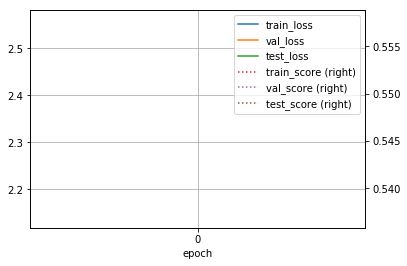

[NAME: NMAE0_0, EPOCH: 1]
> Train...
> Validation...
주야              0.543860
요일              0.124031
사망자수            0.909568
사상자수            0.717070
중상자수            0.803558
경상자수            0.862892
부상신고자수          0.978441
발생지시도           0.176471
발생지시군구          0.013652
사고유형_대분류        0.723906
사고유형_중분류        0.306931
법규위반            0.716667
도로형태_대분류        0.801471
도로형태            0.760300
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.638158
Name: score, dtype: float64
> Test...
주야              0.595819
요일              0.123333
사망자수            0.950652
사상자수            0.735716
중상자수            0.798123
경상자수            0.837552
부상신고자수          0.974482
발생지시도           0.188119
발생지시군구          0.020000
사고유형_대분류        0.763566
사고유형_중분류        0.320690
법규위반            0.700680
도로형태_대분류        0.855172
도로형태            0.748175
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.639860
Name: score, dtype: float64
[train] loss: 2.083 num_loss: 0.3931 cat_loss: 1.69
score: 0.5889 num_score: 0.86

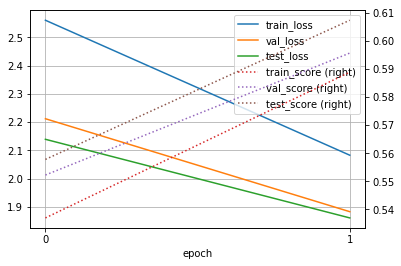

[NAME: NMAE0_0, EPOCH: 2]
> Train...
> Validation...
주야              0.585965
요일              0.124031
사망자수            0.909850
사상자수            0.762852
중상자수            0.808226
경상자수            0.841603
부상신고자수          0.978441
발생지시도           0.176471
발생지시군구          0.017065
사고유형_대분류        0.734007
사고유형_중분류        0.336634
법규위반            0.723333
도로형태_대분류        0.886029
도로형태            0.767790
당사자종별_1당_대분류    0.465704
당사자종별_2당_대분류    0.651316
Name: score, dtype: float64
> Test...
주야              0.592334
요일              0.123333
사망자수            0.959815
사상자수            0.743471
중상자수            0.817041
경상자수            0.833650
부상신고자수          0.974482
발생지시도           0.188119
발생지시군구          0.004000
사고유형_대분류        0.794574
사고유형_중분류        0.344828
법규위반            0.683673
도로형태_대분류        0.868966
도로형태            0.744526
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.678322
Name: score, dtype: float64
[train] loss: 2.006 num_loss: 0.4463 cat_loss: 1.56
score: 0.6117 num_score: 0.86

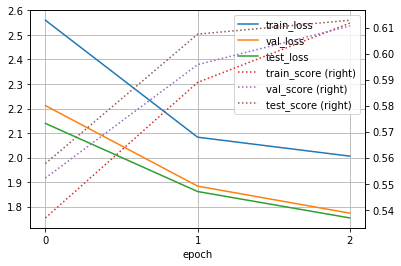

[NAME: NMAE0_0, EPOCH: 3]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.927400
사상자수            0.742460
중상자수            0.814967
경상자수            0.857168
부상신고자수          0.978441
발생지시도           0.176471
발생지시군구          0.020478
사고유형_대분류        0.760943
사고유형_중분류        0.392739
법규위반            0.733333
도로형태_대분류        0.897059
도로형태            0.760300
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.674342
Name: score, dtype: float64
> Test...
주야              0.599303
요일              0.123333
사망자수            0.947600
사상자수            0.767926
중상자수            0.804183
경상자수            0.836128
부상신고자수          0.974482
발생지시도           0.171617
발생지시군구          0.028000
사고유형_대분류        0.782946
사고유형_중분류        0.434483
법규위반            0.707483
도로형태_대분류        0.872414
도로형태            0.729927
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.671329
Name: score, dtype: float64
[train] loss: 1.808 num_loss: 0.3319 cat_loss: 1.476
score: 0.6214 num_score: 0.8

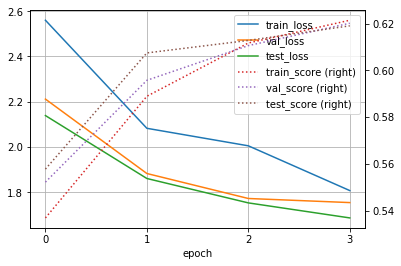

[NAME: NMAE0_0, EPOCH: 4]
> Train...
> Validation...
주야              0.596491
요일              0.124031
사망자수            0.927073
사상자수            0.790612
중상자수            0.819737
경상자수            0.858696
부상신고자수          0.978441
발생지시도           0.183391
발생지시군구          0.017065
사고유형_대분류        0.754209
사고유형_중분류        0.429043
법규위반            0.686667
도로형태_대분류        0.871324
도로형태            0.752809
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.564460
요일              0.123333
사망자수            0.960597
사상자수            0.787751
중상자수            0.836600
경상자수            0.837527
부상신고자수          0.974482
발생지시도           0.201320
발생지시군구          0.012000
사고유형_대분류        0.802326
사고유형_중분류        0.417241
법규위반            0.680272
도로형태_대분류        0.882759
도로형태            0.729927
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.678322
Name: score, dtype: float64
[train] loss: 1.759 num_loss: 0.3748 cat_loss: 1.384
score: 0.6245 num_score: 0.8

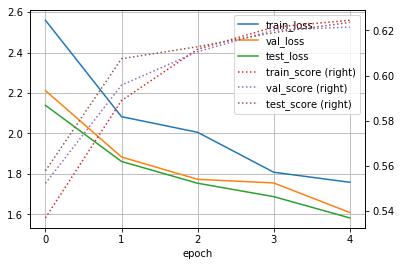

[NAME: NMAE0_0, EPOCH: 5]
> Train...
> Validation...
주야              0.568421
요일              0.124031
사망자수            0.934398
사상자수            0.804723
중상자수            0.823257
경상자수            0.859300
부상신고자수          0.978441
발생지시도           0.183391
발생지시군구          0.040956
사고유형_대분류        0.750842
사고유형_중분류        0.422442
법규위반            0.723333
도로형태_대분류        0.889706
도로형태            0.741573
당사자종별_1당_대분류    0.425993
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.554007
요일              0.123333
사망자수            0.955441
사상자수            0.761190
중상자수            0.800128
경상자수            0.848004
부상신고자수          0.974482
발생지시도           0.198020
발생지시군구          0.024000
사고유형_대분류        0.786822
사고유형_중분류        0.465517
법규위반            0.714286
도로형태_대분류        0.886207
도로형태            0.744526
당사자종별_1당_대분류    0.422680
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.706 num_loss: 0.3474 cat_loss: 1.358
score: 0.625 num_score: 0.87

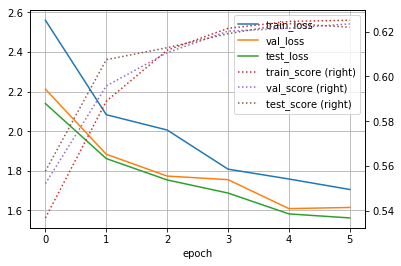

[NAME: NMAE0_0, EPOCH: 6]
> Train...
> Validation...
주야              0.498246
요일              0.124031
사망자수            0.915618
사상자수            0.778663
중상자수            0.824526
경상자수            0.860604
부상신고자수          0.978441
발생지시도           0.183391
발생지시군구          0.010239
사고유형_대분류        0.760943
사고유형_중분류        0.422442
법규위반            0.736667
도로형태_대분류        0.889706
도로형태            0.752809
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.588850
요일              0.123333
사망자수            0.957618
사상자수            0.782965
중상자수            0.809603
경상자수            0.851838
부상신고자수          0.974482
발생지시도           0.178218
발생지시군구          0.020000
사고유형_대분류        0.794574
사고유형_중분류        0.434483
법규위반            0.717687
도로형태_대분류        0.886207
도로형태            0.729927
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.635 num_loss: 0.2962 cat_loss: 1.339
score: 0.6235 num_score: 0.8

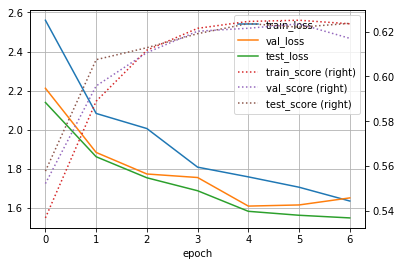

[NAME: NMAE0_0, EPOCH: 7]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.931041
사상자수            0.753684
중상자수            0.814702
경상자수            0.850019
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.013652
사고유형_대분류        0.754209
사고유형_중분류        0.455446
법규위반            0.720000
도로형태_대분류        0.908088
도로형태            0.764045
당사자종별_1당_대분류    0.415162
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.123333
사망자수            0.958787
사상자수            0.786814
중상자수            0.835058
경상자수            0.839884
부상신고자수          0.974482
발생지시도           0.201320
발생지시군구          0.020000
사고유형_대분류        0.786822
사고유형_중분류        0.431034
법규위반            0.707483
도로형태_대분류        0.906897
도로형태            0.729927
당사자종별_1당_대분류    0.419244
당사자종별_2당_대분류    0.667832
Name: score, dtype: float64
[train] loss: 1.704 num_loss: 0.3766 cat_loss: 1.328
score: 0.6248 num_score: 0.8

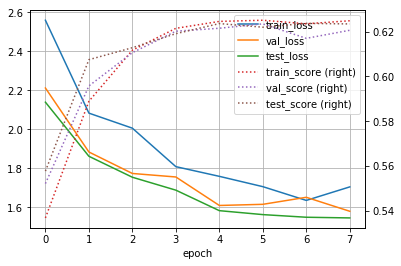

[NAME: NMAE0_0, EPOCH: 8]
> Train...
> Validation...
주야              0.582456
요일              0.124031
사망자수            0.926963
사상자수            0.718091
중상자수            0.802575
경상자수            0.854238
부상신고자수          0.978441
발생지시도           0.176471
발생지시군구          0.030717
사고유형_대분류        0.760943
사고유형_중분류        0.442244
법규위반            0.733333
도로형태_대분류        0.897059
도로형태            0.730337
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.571429
요일              0.123333
사망자수            0.964633
사상자수            0.803975
중상자수            0.841603
경상자수            0.840442
부상신고자수          0.974482
발생지시도           0.188119
발생지시군구          0.016000
사고유형_대분류        0.798450
사고유형_중분류        0.458621
법규위반            0.690476
도로형태_대분류        0.896552
도로형태            0.715328
당사자종별_1당_대분류    0.419244
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.62 num_loss: 0.3023 cat_loss: 1.318
score: 0.6258 num_score: 0.87

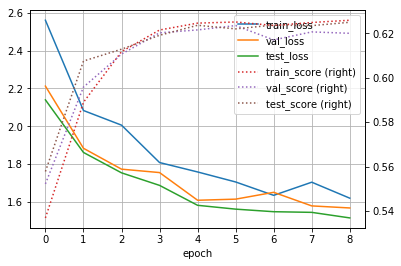

[NAME: NMAE0_0, EPOCH: 9]
> Train...
> Validation...
주야              0.585965
요일              0.124031
사망자수            0.929976
사상자수            0.717168
중상자수            0.813062
경상자수            0.836186
부상신고자수          0.978441
발생지시도           0.159170
발생지시군구          0.023891
사고유형_대분류        0.760943
사고유형_중분류        0.452145
법규위반            0.730000
도로형태_대분류        0.919118
도로형태            0.734082
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.578397
요일              0.123333
사망자수            0.964641
사상자수            0.801955
중상자수            0.842837
경상자수            0.836196
부상신고자수          0.974482
발생지시도           0.184818
발생지시군구          0.024000
사고유형_대분류        0.802326
사고유형_중분류        0.441379
법규위반            0.700680
도로형태_대분류        0.917241
도로형태            0.740876
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.652 num_loss: 0.3412 cat_loss: 1.311
score: 0.6276 num_score: 0.8

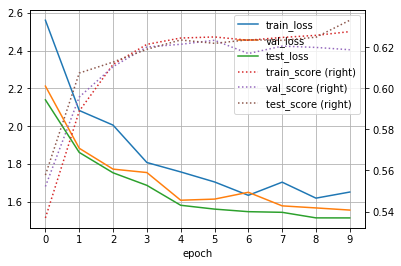

[NAME: NMAE0_0, EPOCH: 10]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.934877
사상자수            0.791005
중상자수            0.824391
경상자수            0.851713
부상신고자수          0.978441
발생지시도           0.159170
발생지시군구          0.030717
사고유형_대분류        0.764310
사고유형_중분류        0.422442
법규위반            0.703333
도로형태_대분류        0.908088
도로형태            0.760300
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.123333
사망자수            0.958216
사상자수            0.819340
중상자수            0.824088
경상자수            0.838571
부상신고자수          0.974482
발생지시도           0.171617
발생지시군구          0.028000
사고유형_대분류        0.802326
사고유형_중분류        0.468966
법규위반            0.680272
도로형태_대분류        0.910345
도로형태            0.718978
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.718 num_loss: 0.4146 cat_loss: 1.304
score: 0.629 num_score: 0.8

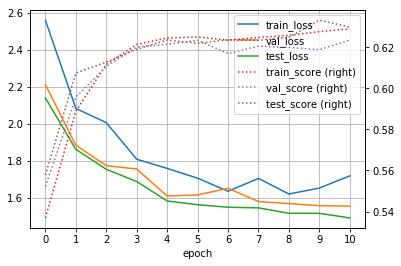

[NAME: NMAE0_0, EPOCH: 11]
> Train...
> Validation...
주야              0.589474
요일              0.124031
사망자수            0.940990
사상자수            0.796603
중상자수            0.835448
경상자수            0.863563
부상신고자수          0.978441
발생지시도           0.173010
발생지시군구          0.020478
사고유형_대분류        0.760943
사고유형_중분류        0.471947
법규위반            0.713333
도로형태_대분류        0.897059
도로형태            0.749064
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.564460
요일              0.123333
사망자수            0.964836
사상자수            0.813373
중상자수            0.842253
경상자수            0.847910
부상신고자수          0.974482
발생지시도           0.198020
발생지시군구          0.032000
사고유형_대분류        0.794574
사고유형_중분류        0.479310
법규위반            0.710884
도로형태_대분류        0.917241
도로형태            0.726277
당사자종별_1당_대분류    0.422680
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.64 num_loss: 0.3406 cat_loss: 1.299
score: 0.6292 num_score: 0.8

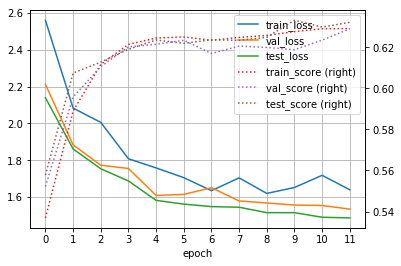

[NAME: NMAE0_0, EPOCH: 12]
> Train...
> Validation...
주야              0.575439
요일              0.124031
사망자수            0.931047
사상자수            0.804466
중상자수            0.821340
경상자수            0.864402
부상신고자수          0.978441
발생지시도           0.173010
발생지시군구          0.030717
사고유형_대분류        0.771044
사고유형_중분류        0.475248
법규위반            0.706667
도로형태_대분류        0.900735
도로형태            0.756554
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.564460
요일              0.123333
사망자수            0.954739
사상자수            0.814380
중상자수            0.820811
경상자수            0.853589
부상신고자수          0.974482
발생지시도           0.184818
발생지시군구          0.024000
사고유형_대분류        0.798450
사고유형_중분류        0.472414
법규위반            0.727891
도로형태_대분류        0.903448
도로형태            0.766423
당사자종별_1당_대분류    0.429553
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.663 num_loss: 0.3717 cat_loss: 1.291
score: 0.6335 num_score: 0.

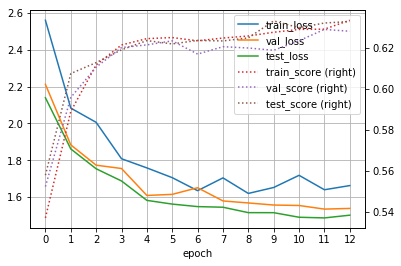

[NAME: NMAE0_0, EPOCH: 13]
> Train...
> Validation...
주야              0.610526
요일              0.124031
사망자수            0.951210
사상자수            0.805982
중상자수            0.824798
경상자수            0.820826
부상신고자수          0.978441
발생지시도           0.145329
발생지시군구          0.020478
사고유형_대분류        0.760943
사고유형_중분류        0.435644
법규위반            0.733333
도로형태_대분류        0.904412
도로형태            0.764045
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.578397
요일              0.123333
사망자수            0.965991
사상자수            0.802439
중상자수            0.826696
경상자수            0.823311
부상신고자수          0.974482
발생지시도           0.178218
발생지시군구          0.020000
사고유형_대분류        0.806202
사고유형_중분류        0.475862
법규위반            0.717687
도로형태_대분류        0.903448
도로형태            0.751825
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.704 num_loss: 0.4178 cat_loss: 1.286
score: 0.6288 num_score: 0.

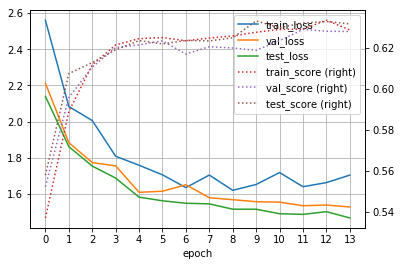

[NAME: NMAE0_0, EPOCH: 14]
> Train...
> Validation...
주야              0.589474
요일              0.124031
사망자수            0.940078
사상자수            0.800949
중상자수            0.829671
경상자수            0.846579
부상신고자수          0.978441
발생지시도           0.159170
발생지시군구          0.017065
사고유형_대분류        0.767677
사고유형_중분류        0.462046
법규위반            0.733333
도로형태_대분류        0.904412
도로형태            0.752809
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.567944
요일              0.123333
사망자수            0.968835
사상자수            0.808112
중상자수            0.837745
경상자수            0.843714
부상신고자수          0.974482
발생지시도           0.161716
발생지시군구          0.020000
사고유형_대분류        0.806202
사고유형_중분류        0.448276
법규위반            0.714286
도로형태_대분류        0.896552
도로형태            0.718978
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.618 num_loss: 0.3393 cat_loss: 1.279
score: 0.6324 num_score: 0.

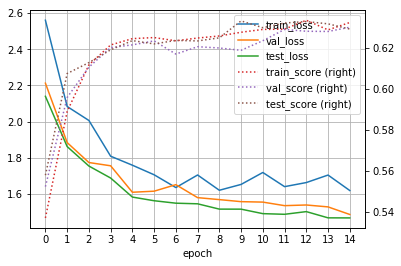

[NAME: NMAE0_0, EPOCH: 15]
> Train...
> Validation...
주야              0.614035
요일              0.124031
사망자수            0.934450
사상자수            0.750313
중상자수            0.810542
경상자수            0.841827
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.034130
사고유형_대분류        0.767677
사고유형_중분류        0.478548
법규위반            0.700000
도로형태_대분류        0.930147
도로형태            0.775281
당사자종별_1당_대분류    0.425993
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.120000
사망자수            0.960180
사상자수            0.818226
중상자수            0.837162
경상자수            0.849712
부상신고자수          0.974482
발생지시도           0.165017
발생지시군구          0.024000
사고유형_대분류        0.798450
사고유형_중분류        0.448276
법규위반            0.700680
도로형태_대분류        0.903448
도로형태            0.704380
당사자종별_1당_대분류    0.436426
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.613 num_loss: 0.3429 cat_loss: 1.27
score: 0.6328 num_score: 0.8

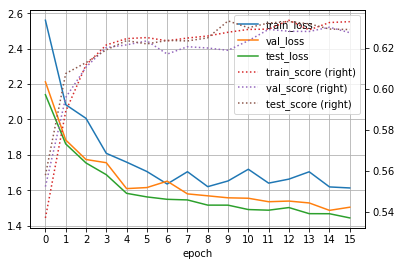

[NAME: NMAE0_0, EPOCH: 16]
> Train...
> Validation...
주야              0.610526
요일              0.124031
사망자수            0.947968
사상자수            0.804982
중상자수            0.835265
경상자수            0.834993
부상신고자수          0.978441
발생지시도           0.117647
발생지시군구          0.037543
사고유형_대분류        0.767677
사고유형_중분류        0.471947
법규위반            0.736667
도로형태_대분류        0.919118
도로형태            0.760300
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.578397
요일              0.123333
사망자수            0.960432
사상자수            0.806206
중상자수            0.845562
경상자수            0.822986
부상신고자수          0.974482
발생지시도           0.135314
발생지시군구          0.032000
사고유형_대분류        0.802326
사고유형_중분류        0.424138
법규위반            0.687075
도로형태_대분류        0.896552
도로형태            0.722628
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.617 num_loss: 0.36 cat_loss: 1.257
score: 0.6292 num_score: 0.88

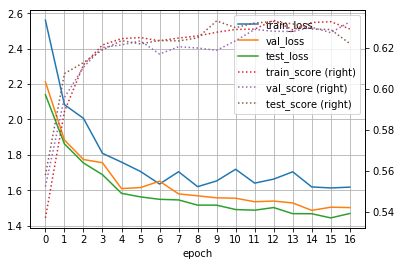

[NAME: NMAE0_0, EPOCH: 17]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.952232
사상자수            0.809466
중상자수            0.836352
경상자수            0.844479
부상신고자수          0.978441
발생지시도           0.089965
발생지시군구          0.034130
사고유형_대분류        0.760943
사고유형_중분류        0.452145
법규위반            0.716667
도로형태_대분류        0.922794
도로형태            0.767790
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.616725
요일              0.123333
사망자수            0.965630
사상자수            0.821844
중상자수            0.817799
경상자수            0.850302
부상신고자수          0.974482
발생지시도           0.089109
발생지시군구          0.044000
사고유형_대분류        0.794574
사고유형_중분류        0.486207
법규위반            0.721088
도로형태_대분류        0.906897
도로형태            0.726277
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.602 num_loss: 0.3569 cat_loss: 1.245
score: 0.6287 num_score: 0.

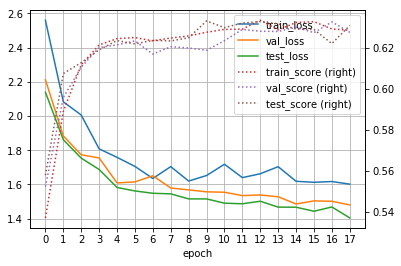

[NAME: NMAE0_0, EPOCH: 18]
> Train...
> Validation...
주야              0.600000
요일              0.124031
사망자수            0.949887
사상자수            0.784683
중상자수            0.805979
경상자수            0.869393
부상신고자수          0.978441
발생지시도           0.121107
발생지시군구          0.034130
사고유형_대분류        0.771044
사고유형_중분류        0.471947
법규위반            0.713333
도로형태_대분류        0.922794
도로형태            0.745318
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.613240
요일              0.123333
사망자수            0.961679
사상자수            0.825188
중상자수            0.836385
경상자수            0.838931
부상신고자수          0.974482
발생지시도           0.125413
발생지시군구          0.032000
사고유형_대분류        0.802326
사고유형_중분류        0.486207
법규위반            0.707483
도로형태_대분류        0.910345
도로형태            0.748175
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.637 num_loss: 0.4015 cat_loss: 1.235
score: 0.6292 num_score: 0.

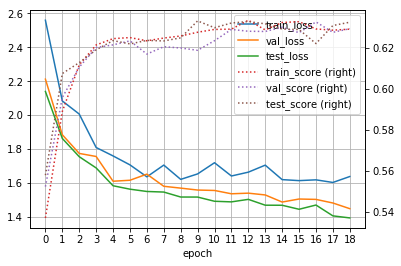

[NAME: NMAE0_0, EPOCH: 19]
> Train...
> Validation...
주야              0.610526
요일              0.124031
사망자수            0.947677
사상자수            0.799928
중상자수            0.834878
경상자수            0.860026
부상신고자수          0.978441
발생지시도           0.096886
발생지시군구          0.044369
사고유형_대분류        0.734007
사고유형_중분류        0.475248
법규위반            0.733333
도로형태_대분류        0.915441
도로형태            0.764045
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.684211
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.123333
사망자수            0.963663
사상자수            0.825841
중상자수            0.852548
경상자수            0.840733
부상신고자수          0.974482
발생지시도           0.112211
발생지시군구          0.048000
사고유형_대분류        0.786822
사고유형_중분류        0.441379
법규위반            0.717687
도로형태_대분류        0.886207
도로형태            0.737226
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.674825
Name: score, dtype: float64
[train] loss: 1.486 num_loss: 0.2592 cat_loss: 1.227
score: 0.6301 num_score: 0.

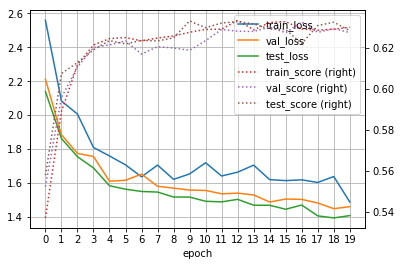

[NAME: NMAE0_0, EPOCH: 20]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.953212
사상자수            0.803982
중상자수            0.826046
경상자수            0.873566
부상신고자수          0.978441
발생지시도           0.093426
발생지시군구          0.027304
사고유형_대분류        0.754209
사고유형_중분류        0.462046
법규위반            0.720000
도로형태_대분류        0.922794
도로형태            0.752809
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.654605
Name: score, dtype: float64
> Test...
주야              0.616725
요일              0.123333
사망자수            0.962893
사상자수            0.814608
중상자수            0.837424
경상자수            0.851138
부상신고자수          0.974482
발생지시도           0.102310
발생지시군구          0.064000
사고유형_대분류        0.802326
사고유형_중분류        0.472414
법규위반            0.693878
도로형태_대분류        0.893103
도로형태            0.704380
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.504 num_loss: 0.2869 cat_loss: 1.217
score: 0.6307 num_score: 0.

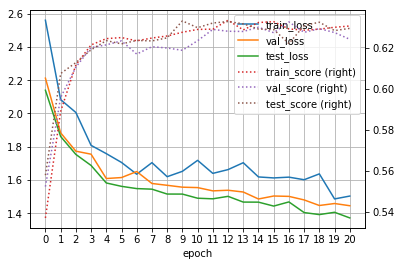

[NAME: NMAE0_0, EPOCH: 21]
> Train...
> Validation...
주야              0.649123
요일              0.124031
사망자수            0.946711
사상자수            0.736530
중상자수            0.811174
경상자수            0.844473
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.044369
사고유형_대분류        0.767677
사고유형_중분류        0.462046
법규위반            0.693333
도로형태_대분류        0.926471
도로형태            0.749064
당사자종별_1당_대분류    0.425993
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.606272
요일              0.123333
사망자수            0.960731
사상자수            0.814854
중상자수            0.849099
경상자수            0.839562
부상신고자수          0.974482
발생지시도           0.115512
발생지시군구          0.044000
사고유형_대분류        0.794574
사고유형_중분류        0.496552
법규위반            0.717687
도로형태_대분류        0.903448
도로형태            0.726277
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.538 num_loss: 0.3305 cat_loss: 1.208
score: 0.6283 num_score: 0.

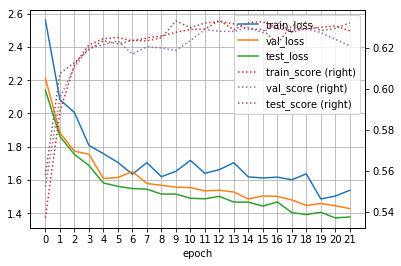

[NAME: NMAE0_0, EPOCH: 22]
> Train...
> Validation...
주야              0.617544
요일              0.124031
사망자수            0.950768
사상자수            0.809386
중상자수            0.827784
경상자수            0.866543
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.047782
사고유형_대분류        0.771044
사고유형_중분류        0.501650
법규위반            0.723333
도로형태_대분류        0.919118
도로형태            0.790262
당사자종별_1당_대분류    0.433213
당사자종별_2당_대분류    0.680921
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.120000
사망자수            0.967468
사상자수            0.791331
중상자수            0.850096
경상자수            0.829786
부상신고자수          0.974482
발생지시도           0.112211
발생지시군구          0.044000
사고유형_대분류        0.798450
사고유형_중분류        0.472414
법규위반            0.714286
도로형태_대분류        0.913793
도로형태            0.726277
당사자종별_1당_대분류    0.432990
당사자종별_2당_대분류    0.671329
Name: score, dtype: float64
[train] loss: 1.488 num_loss: 0.2887 cat_loss: 1.199
score: 0.6287 num_score: 0.

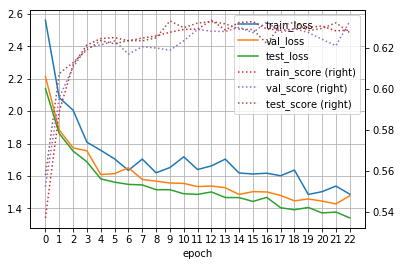

[NAME: NMAE0_0, EPOCH: 23]
> Train...
> Validation...
주야              0.603509
요일              0.124031
사망자수            0.940179
사상자수            0.783519
중상자수            0.806608
경상자수            0.855563
부상신고자수          0.978441
발생지시도           0.100346
발생지시군구          0.040956
사고유형_대분류        0.757576
사고유형_중분류        0.419142
법규위반            0.693333
도로형태_대분류        0.922794
도로형태            0.760300
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.671053
Name: score, dtype: float64
> Test...
주야              0.599303
요일              0.123333
사망자수            0.965837
사상자수            0.806815
중상자수            0.833616
경상자수            0.840922
부상신고자수          0.974482
발생지시도           0.132013
발생지시군구          0.052000
사고유형_대분류        0.802326
사고유형_중분류        0.458621
법규위반            0.714286
도로형태_대분류        0.910345
도로형태            0.733577
당사자종별_1당_대분류    0.484536
당사자종별_2당_대분류    0.678322
Name: score, dtype: float64
[train] loss: 1.552 num_loss: 0.3573 cat_loss: 1.194
score: 0.6282 num_score: 0.

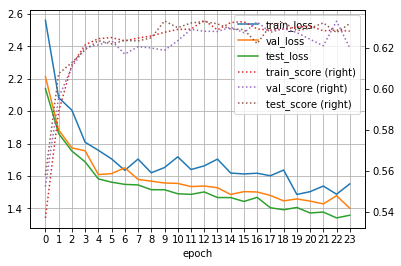

[NAME: NMAE0_0, EPOCH: 24]
> Train...
> Validation...
주야              0.614035
요일              0.124031
사망자수            0.947129
사상자수            0.805499
중상자수            0.829626
경상자수            0.866549
부상신고자수          0.978441
발생지시도           0.107266
발생지시군구          0.034130
사고유형_대분류        0.757576
사고유형_중분류        0.471947
법규위반            0.740000
도로형태_대분류        0.922794
도로형태            0.764045
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.564460
요일              0.123333
사망자수            0.960726
사상자수            0.804366
중상자수            0.847578
경상자수            0.841583
부상신고자수          0.974482
발생지시도           0.115512
발생지시군구          0.040000
사고유형_대분류        0.798450
사고유형_중분류        0.424138
법규위반            0.724490
도로형태_대분류        0.910345
도로형태            0.755474
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.572 num_loss: 0.3823 cat_loss: 1.189
score: 0.6299 num_score: 0.

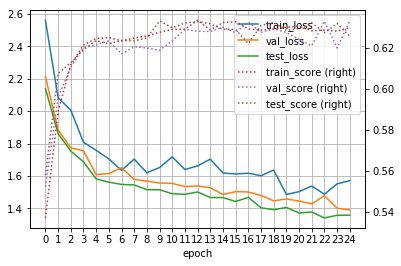

[NAME: NMAE0_0, EPOCH: 25]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.946488
사상자수            0.805181
중상자수            0.826965
경상자수            0.850069
부상신고자수          0.978441
발생지시도           0.107266
발생지시군구          0.037543
사고유형_대분류        0.771044
사고유형_중분류        0.465347
법규위반            0.700000
도로형태_대분류        0.915441
도로형태            0.775281
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.680921
Name: score, dtype: float64
> Test...
주야              0.581882
요일              0.120000
사망자수            0.961933
사상자수            0.800030
중상자수            0.849104
경상자수            0.843259
부상신고자수          0.974482
발생지시도           0.125413
발생지시군구          0.032000
사고유형_대분류        0.798450
사고유형_중분류        0.458621
법규위반            0.704082
도로형태_대분류        0.906897
도로형태            0.722628
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.496 num_loss: 0.3084 cat_loss: 1.187
score: 0.6287 num_score: 0.

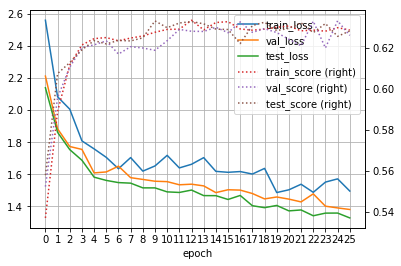

[NAME: NMAE0_0, EPOCH: 26]
> Train...
> Validation...
주야              0.561404
요일              0.124031
사망자수            0.945774
사상자수            0.822616
중상자수            0.816372
경상자수            0.866853
부상신고자수          0.978441
발생지시도           0.093426
발생지시군구          0.037543
사고유형_대분류        0.757576
사고유형_중분류        0.475248
법규위반            0.690000
도로형태_대분류        0.922794
도로형태            0.767790
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.634146
요일              0.123333
사망자수            0.968230
사상자수            0.829083
중상자수            0.843632
경상자수            0.865708
부상신고자수          0.974482
발생지시도           0.105611
발생지시군구          0.040000
사고유형_대분류        0.790698
사고유형_중분류        0.458621
법규위반            0.727891
도로형태_대분류        0.896552
도로형태            0.737226
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.483 num_loss: 0.3014 cat_loss: 1.182
score: 0.63 num_score: 0.88

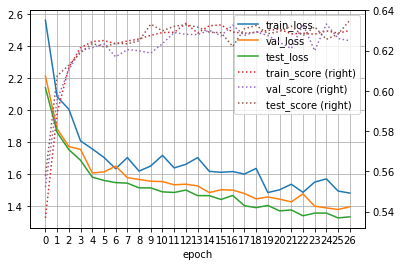

[NAME: NMAE0_0, EPOCH: 27]
> Train...
> Validation...
주야              0.631579
요일              0.124031
사망자수            0.938332
사상자수            0.752004
중상자수            0.804514
경상자수            0.837845
부상신고자수          0.978441
발생지시도           0.121107
발생지시군구          0.054608
사고유형_대분류        0.771044
사고유형_중분류        0.488449
법규위반            0.720000
도로형태_대분류        0.911765
도로형태            0.775281
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.588850
요일              0.123333
사망자수            0.966147
사상자수            0.807139
중상자수            0.858519
경상자수            0.846952
부상신고자수          0.974482
발생지시도           0.112211
발생지시군구          0.040000
사고유형_대분류        0.802326
사고유형_중분류        0.441379
법규위반            0.717687
도로형태_대분류        0.906897
도로형태            0.700730
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.464 num_loss: 0.2845 cat_loss: 1.179
score: 0.6336 num_score: 0.

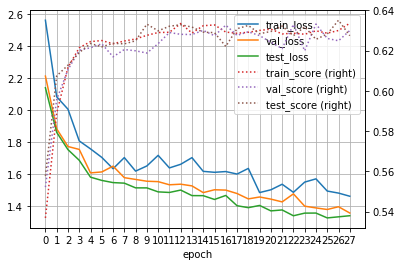

[NAME: NMAE0_0, EPOCH: 28]
> Train...
> Validation...
주야              0.600000
요일              0.124031
사망자수            0.946583
사상자수            0.802783
중상자수            0.817939
경상자수            0.874411
부상신고자수          0.978441
발생지시도           0.103806
발생지시군구          0.030717
사고유형_대분류        0.760943
사고유형_중분류        0.491749
법규위반            0.710000
도로형태_대분류        0.937500
도로형태            0.782772
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.123333
사망자수            0.971450
사상자수            0.833196
중상자수            0.862341
경상자수            0.843320
부상신고자수          0.974482
발생지시도           0.112211
발생지시군구          0.040000
사고유형_대분류        0.806202
사고유형_중분류        0.468966
법규위반            0.700680
도로형태_대분류        0.906897
도로형태            0.726277
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.513 num_loss: 0.3375 cat_loss: 1.175
score: 0.6302 num_score: 0.

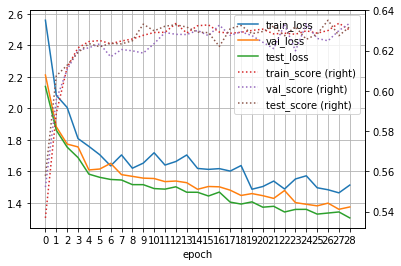

[NAME: NMAE0_0, EPOCH: 29]
> Train...
> Validation...
주야              0.631579
요일              0.124031
사망자수            0.943392
사상자수            0.806281
중상자수            0.819313
경상자수            0.873260
부상신고자수          0.978441
발생지시도           0.100346
발생지시군구          0.044369
사고유형_대분류        0.764310
사고유형_중분류        0.468647
법규위반            0.730000
도로형태_대분류        0.919118
도로형태            0.741573
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.123333
사망자수            0.963626
사상자수            0.822613
중상자수            0.851345
경상자수            0.856288
부상신고자수          0.974482
발생지시도           0.115512
발생지시군구          0.056000
사고유형_대분류        0.806202
사고유형_중분류        0.413793
법규위반            0.714286
도로형태_대분류        0.906897
도로형태            0.737226
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.423 num_loss: 0.2479 cat_loss: 1.175
score: 0.6294 num_score: 0.

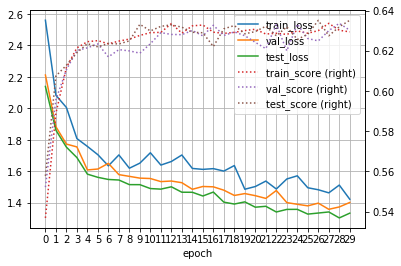

[NAME: NMAE0_1, EPOCH: 0]
> Train...
> Validation...
주야              0.477193
요일              0.127907
사망자수            0.911185
사상자수            0.652581
중상자수            0.768727
경상자수            0.857282
부상신고자수          0.978441
발생지시도           0.173010
발생지시군구          0.013652
사고유형_대분류        0.569024
사고유형_중분류        0.293729
법규위반            0.716667
도로형태_대분류        0.709559
도로형태            0.629213
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.516447
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.126667
사망자수            0.899475
사상자수            0.661320
중상자수            0.774313
경상자수            0.803821
부상신고자수          0.974482
발생지시도           0.191419
발생지시군구          0.016000
사고유형_대분류        0.612403
사고유형_중분류        0.303448
법규위반            0.693878
도로형태_대분류        0.689655
도로형태            0.551095
당사자종별_1당_대분류    0.498282
당사자종별_2당_대분류    0.493007
Name: score, dtype: float64
[train] loss: 2.656 num_loss: 0.6872 cat_loss: 1.969
score: 0.5253 num_score: 0.8

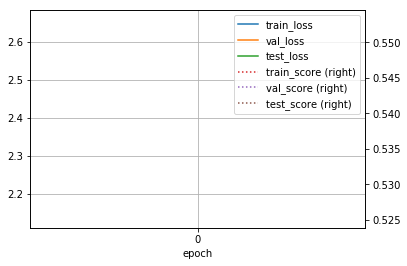

[NAME: NMAE0_1, EPOCH: 1]
> Train...
> Validation...
주야              0.575439
요일              0.124031
사망자수            0.911858
사상자수            0.720394
중상자수            0.810675
경상자수            0.824717
부상신고자수          0.978441
발생지시도           0.190311
발생지시군구          0.020478
사고유형_대분류        0.747475
사고유형_중분류        0.353135
법규위반            0.723333
도로형태_대분류        0.830882
도로형태            0.782772
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.651316
Name: score, dtype: float64
> Test...
주야              0.592334
요일              0.123333
사망자수            0.945300
사상자수            0.705516
중상자수            0.784080
경상자수            0.844945
부상신고자수          0.974482
발생지시도           0.194719
발생지시군구          0.016000
사고유형_대분류        0.790698
사고유형_중분류        0.331034
법규위반            0.680272
도로형태_대분류        0.820690
도로형태            0.751825
당사자종별_1당_대분류    0.484536
당사자종별_2당_대분류    0.660839
Name: score, dtype: float64
[train] loss: 2.167 num_loss: 0.5082 cat_loss: 1.659
score: 0.5893 num_score: 0.8

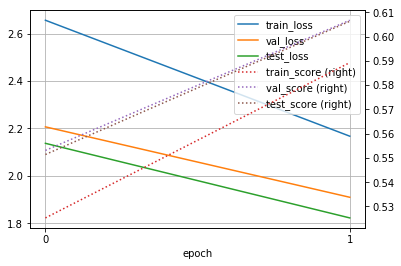

[NAME: NMAE0_1, EPOCH: 2]
> Train...
> Validation...
주야              0.603509
요일              0.124031
사망자수            0.901087
사상자수            0.750203
중상자수            0.789007
경상자수            0.857957
부상신고자수          0.978441
발생지시도           0.173010
발생지시군구          0.030717
사고유형_대분류        0.757576
사고유형_중분류        0.382838
법규위반            0.726667
도로형태_대분류        0.856618
도로형태            0.749064
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.674342
Name: score, dtype: float64
> Test...
주야              0.554007
요일              0.123333
사망자수            0.952802
사상자수            0.689195
중상자수            0.813579
경상자수            0.828173
부상신고자수          0.974482
발생지시도           0.198020
발생지시군구          0.016000
사고유형_대분류        0.790698
사고유형_중분류        0.355172
법규위반            0.700680
도로형태_대분류        0.865517
도로형태            0.715328
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.664336
Name: score, dtype: float64
[train] loss: 1.978 num_loss: 0.4465 cat_loss: 1.532
score: 0.6152 num_score: 0.8

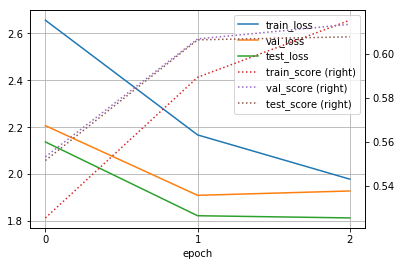

[NAME: NMAE0_1, EPOCH: 3]
> Train...
> Validation...
주야              0.607018
요일              0.124031
사망자수            0.913768
사상자수            0.724330
중상자수            0.783992
경상자수            0.858017
부상신고자수          0.978441
발생지시도           0.176471
발생지시군구          0.006826
사고유형_대분류        0.754209
사고유형_중분류        0.409241
법규위반            0.756667
도로형태_대분류        0.897059
도로형태            0.775281
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.677632
Name: score, dtype: float64
> Test...
주야              0.592334
요일              0.123333
사망자수            0.956651
사상자수            0.768597
중상자수            0.836170
경상자수            0.831321
부상신고자수          0.974482
발생지시도           0.191419
발생지시군구          0.004000
사고유형_대분류        0.782946
사고유형_중분류        0.358621
법규위반            0.690476
도로형태_대분류        0.868966
도로형태            0.740876
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.793 num_loss: 0.3338 cat_loss: 1.459
score: 0.6247 num_score: 0.8

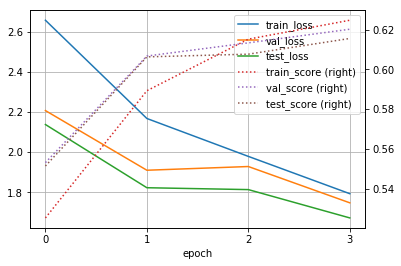

[NAME: NMAE0_1, EPOCH: 4]
> Train...
> Validation...
주야              0.564912
요일              0.124031
사망자수            0.920628
사상자수            0.740290
중상자수            0.783233
경상자수            0.864724
부상신고자수          0.978441
발생지시도           0.162630
발생지시군구          0.010239
사고유형_대분류        0.744108
사고유형_중분류        0.412541
법규위반            0.733333
도로형태_대분류        0.889706
도로형태            0.737828
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.592334
요일              0.123333
사망자수            0.962476
사상자수            0.735174
중상자수            0.829110
경상자수            0.841465
부상신고자수          0.974482
발생지시도           0.194719
발생지시군구          0.008000
사고유형_대분류        0.794574
사고유형_중분류        0.393103
법규위반            0.707483
도로형태_대분류        0.882759
도로형태            0.755474
당사자종별_1당_대분류    0.436426
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.827 num_loss: 0.4163 cat_loss: 1.41
score: 0.6251 num_score: 0.87

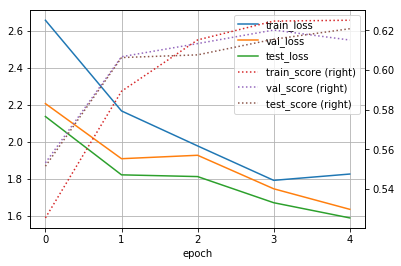

[NAME: NMAE0_1, EPOCH: 5]
> Train...
> Validation...
주야              0.656140
요일              0.124031
사망자수            0.929934
사상자수            0.814423
중상자수            0.835347
경상자수            0.872319
부상신고자수          0.978441
발생지시도           0.152249
발생지시군구          0.013652
사고유형_대분류        0.764310
사고유형_중분류        0.405941
법규위반            0.746667
도로형태_대분류        0.922794
도로형태            0.745318
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.574913
요일              0.123333
사망자수            0.946868
사상자수            0.790534
중상자수            0.815648
경상자수            0.848723
부상신고자수          0.974482
발생지시도           0.191419
발생지시군구          0.020000
사고유형_대분류        0.786822
사고유형_중분류        0.396552
법규위반            0.717687
도로형태_대분류        0.903448
도로형태            0.744526
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.764 num_loss: 0.3946 cat_loss: 1.369
score: 0.625 num_score: 0.86

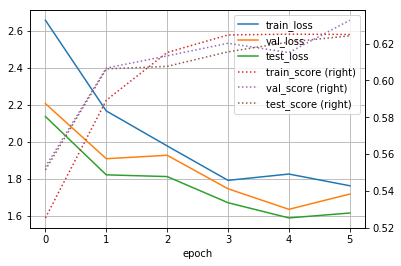

[NAME: NMAE0_1, EPOCH: 6]
> Train...
> Validation...
주야              0.571930
요일              0.124031
사망자수            0.929460
사상자수            0.759375
중상자수            0.823592
경상자수            0.847963
부상신고자수          0.978441
발생지시도           0.134948
발생지시군구          0.017065
사고유형_대분류        0.754209
사고유형_중분류        0.419142
법규위반            0.706667
도로형태_대분류        0.922794
도로형태            0.760300
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.574913
요일              0.123333
사망자수            0.943671
사상자수            0.791892
중상자수            0.826183
경상자수            0.839797
부상신고자수          0.974482
발생지시도           0.174917
발생지시군구          0.032000
사고유형_대분류        0.794574
사고유형_중분류        0.424138
법규위반            0.744898
도로형태_대분류        0.889655
도로형태            0.740876
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.766 num_loss: 0.4229 cat_loss: 1.344
score: 0.6254 num_score: 0.8

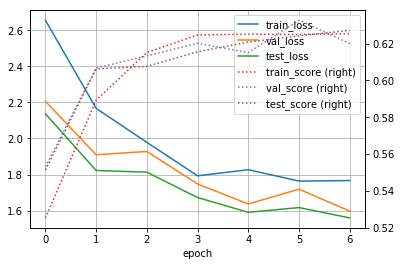

[NAME: NMAE0_1, EPOCH: 7]
> Train...
> Validation...
주야              0.578947
요일              0.124031
사망자수            0.944393
사상자수            0.794571
중상자수            0.825603
경상자수            0.854900
부상신고자수          0.978441
발생지시도           0.083045
발생지시군구          0.030717
사고유형_대분류        0.754209
사고유형_중분류        0.422442
법규위반            0.736667
도로형태_대분류        0.904412
도로형태            0.730337
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.123333
사망자수            0.962529
사상자수            0.799865
중상자수            0.813188
경상자수            0.834418
부상신고자수          0.974482
발생지시도           0.118812
발생지시군구          0.024000
사고유형_대분류        0.794574
사고유형_중분류        0.413793
법규위반            0.741497
도로형태_대분류        0.886207
도로형태            0.722628
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.653 num_loss: 0.336 cat_loss: 1.317
score: 0.6247 num_score: 0.87

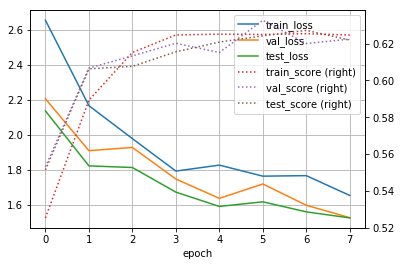

[NAME: NMAE0_1, EPOCH: 8]
> Train...
> Validation...
주야              0.526316
요일              0.124031
사망자수            0.946052
사상자수            0.806762
중상자수            0.802378
경상자수            0.852725
부상신고자수          0.978441
발생지시도           0.089965
발생지시군구          0.030717
사고유형_대분류        0.750842
사고유형_중분류        0.442244
법규위반            0.760000
도로형태_대분류        0.911765
도로형태            0.767790
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.564460
요일              0.123333
사망자수            0.963454
사상자수            0.769230
중상자수            0.810452
경상자수            0.852456
부상신고자수          0.974482
발생지시도           0.125413
발생지시군구          0.028000
사고유형_대분류        0.794574
사고유형_중분류        0.434483
법규위반            0.727891
도로형태_대분류        0.893103
도로형태            0.755474
당사자종별_1당_대분류    0.384880
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.679 num_loss: 0.3877 cat_loss: 1.292
score: 0.6244 num_score: 0.8

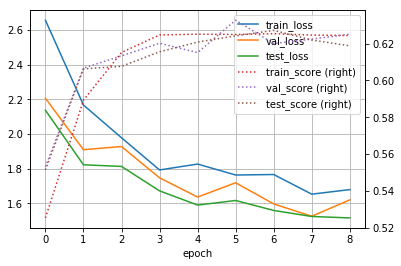

[NAME: NMAE0_1, EPOCH: 9]
> Train...
> Validation...
주야              0.585965
요일              0.124031
사망자수            0.945573
사상자수            0.773177
중상자수            0.797816
경상자수            0.851930
부상신고자수          0.978441
발생지시도           0.121107
발생지시군구          0.030717
사고유형_대분류        0.740741
사고유형_중분류        0.412541
법규위반            0.760000
도로형태_대분류        0.908088
도로형태            0.741573
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.123333
사망자수            0.964229
사상자수            0.806795
중상자수            0.826223
경상자수            0.840187
부상신고자수          0.974482
발생지시도           0.105611
발생지시군구          0.028000
사고유형_대분류        0.798450
사고유형_중분류        0.431034
법규위반            0.731293
도로형태_대분류        0.889655
도로형태            0.740876
당사자종별_1당_대분류    0.426117
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.575 num_loss: 0.2968 cat_loss: 1.278
score: 0.625 num_score: 0.87

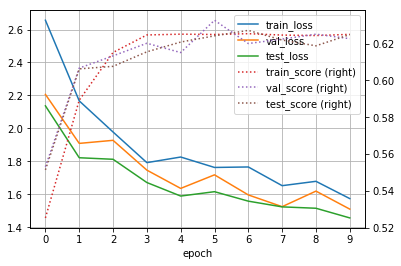

[NAME: NMAE0_1, EPOCH: 10]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.938037
사상자수            0.714494
중상자수            0.801667
경상자수            0.853233
부상신고자수          0.978441
발생지시도           0.079585
발생지시군구          0.037543
사고유형_대분류        0.754209
사고유형_중분류        0.445545
법규위반            0.750000
도로형태_대분류        0.911765
도로형태            0.760300
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.123333
사망자수            0.962038
사상자수            0.804296
중상자수            0.825211
경상자수            0.850842
부상신고자수          0.974482
발생지시도           0.089109
발생지시군구          0.052000
사고유형_대분류        0.798450
사고유형_중분류        0.417241
법규위반            0.744898
도로형태_대분류        0.900000
도로형태            0.744526
당사자종별_1당_대분류    0.436426
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.623 num_loss: 0.3613 cat_loss: 1.262
score: 0.6247 num_score: 0.

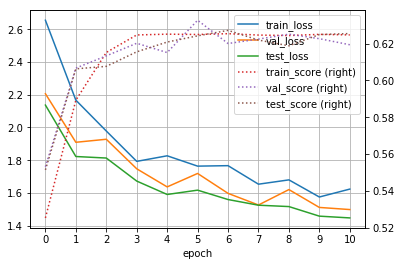

[NAME: NMAE0_1, EPOCH: 11]
> Train...
> Validation...
주야              0.677193
요일              0.124031
사망자수            0.942579
사상자수            0.788319
중상자수            0.814778
경상자수            0.876243
부상신고자수          0.978441
발생지시도           0.093426
발생지시군구          0.020478
사고유형_대분류        0.754209
사고유형_중분류        0.452145
법규위반            0.756667
도로형태_대분류        0.915441
도로형태            0.741573
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.733553
Name: score, dtype: float64
> Test...
주야              0.595819
요일              0.123333
사망자수            0.956784
사상자수            0.819060
중상자수            0.836554
경상자수            0.841853
부상신고자수          0.974482
발생지시도           0.105611
발생지시군구          0.056000
사고유형_대분류        0.786822
사고유형_중분류        0.410345
법규위반            0.731293
도로형태_대분류        0.900000
도로형태            0.729927
당사자종별_1당_대분류    0.432990
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.543 num_loss: 0.2942 cat_loss: 1.249
score: 0.6259 num_score: 0.

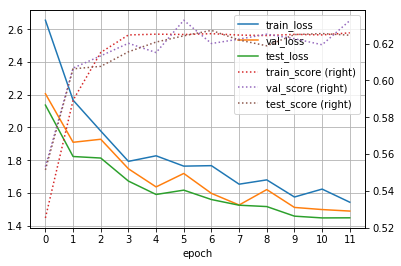

[NAME: NMAE0_1, EPOCH: 12]
> Train...
> Validation...
주야              0.610526
요일              0.124031
사망자수            0.936559
사상자수            0.770072
중상자수            0.811504
경상자수            0.864293
부상신고자수          0.978441
발생지시도           0.103806
발생지시군구          0.030717
사고유형_대분류        0.760943
사고유형_중분류        0.458746
법규위반            0.753333
도로형태_대분류        0.922794
도로형태            0.764045
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.599303
요일              0.123333
사망자수            0.959729
사상자수            0.805320
중상자수            0.831677
경상자수            0.845172
부상신고자수          0.974482
발생지시도           0.085809
발생지시군구          0.052000
사고유형_대분류        0.786822
사고유형_중분류        0.434483
법규위반            0.744898
도로형태_대분류        0.900000
도로형태            0.715328
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.597 num_loss: 0.36 cat_loss: 1.237
score: 0.6267 num_score: 0.87

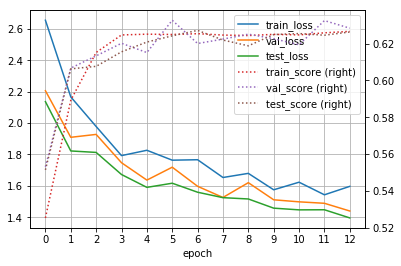

[NAME: NMAE0_1, EPOCH: 13]
> Train...
> Validation...
주야              0.557895
요일              0.124031
사망자수            0.939873
사상자수            0.751078
중상자수            0.805127
경상자수            0.837040
부상신고자수          0.978441
발생지시도           0.072664
발생지시군구          0.030717
사고유형_대분류        0.764310
사고유형_중분류        0.432343
법규위반            0.760000
도로형태_대분류        0.922794
도로형태            0.771536
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.123333
사망자수            0.958339
사상자수            0.801484
중상자수            0.864985
경상자수            0.843808
부상신고자수          0.974482
발생지시도           0.095710
발생지시군구          0.056000
사고유형_대분류        0.798450
사고유형_중분류        0.420690
법규위반            0.761905
도로형태_대분류        0.896552
도로형태            0.733577
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.602 num_loss: 0.3766 cat_loss: 1.226
score: 0.6271 num_score: 0.

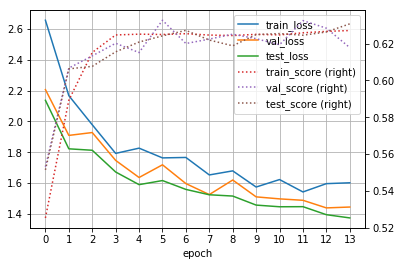

[NAME: NMAE0_1, EPOCH: 14]
> Train...
> Validation...
주야              0.568421
요일              0.124031
사망자수            0.947850
사상자수            0.773434
중상자수            0.811841
경상자수            0.831304
부상신고자수          0.978441
발생지시도           0.100346
발생지시군구          0.051195
사고유형_대분류        0.740741
사고유형_중분류        0.462046
법규위반            0.766667
도로형태_대분류        0.911765
도로형태            0.797753
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.613240
요일              0.123333
사망자수            0.966082
사상자수            0.805841
중상자수            0.828991
경상자수            0.834070
부상신고자수          0.974482
발생지시도           0.108911
발생지시군구          0.060000
사고유형_대분류        0.802326
사고유형_중분류        0.424138
법규위반            0.738095
도로형태_대분류        0.903448
도로형태            0.744526
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.499 num_loss: 0.2837 cat_loss: 1.215
score: 0.6271 num_score: 0.

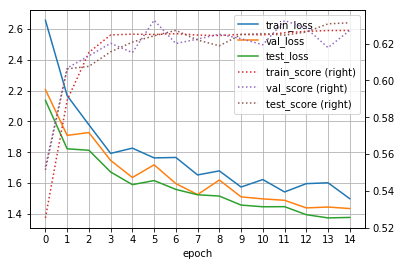

[NAME: NMAE0_1, EPOCH: 15]
> Train...
> Validation...
주야              0.582456
요일              0.124031
사망자수            0.952067
사상자수            0.818730
중상자수            0.819686
경상자수            0.846070
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.037543
사고유형_대분류        0.764310
사고유형_중분류        0.455446
법규위반            0.753333
도로형태_대분류        0.922794
도로형태            0.771536
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.606272
요일              0.123333
사망자수            0.965506
사상자수            0.806504
중상자수            0.840969
경상자수            0.851763
부상신고자수          0.974482
발생지시도           0.108911
발생지시군구          0.072000
사고유형_대분류        0.806202
사고유형_중분류        0.437931
법규위반            0.721088
도로형태_대분류        0.906897
도로형태            0.733577
당사자종별_1당_대분류    0.450172
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.505 num_loss: 0.2964 cat_loss: 1.209
score: 0.6257 num_score: 0.

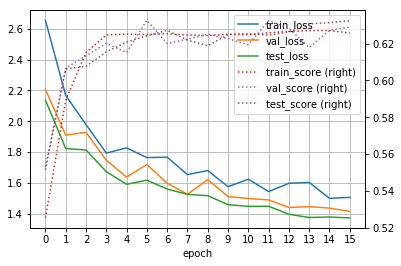

[NAME: NMAE0_1, EPOCH: 16]
> Train...
> Validation...
주야              0.617544
요일              0.124031
사망자수            0.941531
사상자수            0.802062
중상자수            0.797717
경상자수            0.862932
부상신고자수          0.978441
발생지시도           0.069204
발생지시군구          0.058020
사고유형_대분류        0.767677
사고유형_중분류        0.478548
법규위반            0.760000
도로형태_대분류        0.926471
도로형태            0.794007
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.592334
요일              0.123333
사망자수            0.967639
사상자수            0.820649
중상자수            0.835124
경상자수            0.846866
부상신고자수          0.974482
발생지시도           0.082508
발생지시군구          0.052000
사고유형_대분류        0.798450
사고유형_중분류        0.431034
법규위반            0.744898
도로형태_대분류        0.896552
도로형태            0.751825
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.532 num_loss: 0.3297 cat_loss: 1.202
score: 0.6276 num_score: 0.

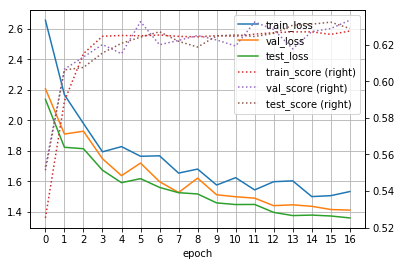

[NAME: NMAE0_1, EPOCH: 17]
> Train...
> Validation...
주야              0.582456
요일              0.124031
사망자수            0.949715
사상자수            0.804751
중상자수            0.830189
경상자수            0.848780
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.030717
사고유형_대분류        0.750842
사고유형_중분류        0.488449
법규위반            0.756667
도로형태_대분류        0.919118
도로형태            0.760300
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.630662
요일              0.123333
사망자수            0.969773
사상자수            0.787962
중상자수            0.827485
경상자수            0.840942
부상신고자수          0.974482
발생지시도           0.079208
발생지시군구          0.044000
사고유형_대분류        0.798450
사고유형_중분류        0.431034
법규위반            0.717687
도로형태_대분류        0.913793
도로형태            0.751825
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.503 num_loss: 0.3056 cat_loss: 1.197
score: 0.6265 num_score: 0.

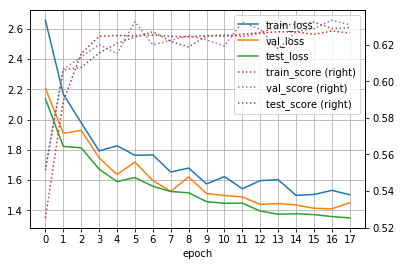

[NAME: NMAE0_1, EPOCH: 18]
> Train...
> Validation...
주야              0.561404
요일              0.124031
사망자수            0.940915
사상자수            0.801675
중상자수            0.830188
경상자수            0.844709
부상신고자수          0.978441
발생지시도           0.069204
발생지시군구          0.040956
사고유형_대분류        0.962963
사고유형_중분류        0.455446
법규위반            0.760000
도로형태_대분류        0.915441
도로형태            0.760300
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.648084
요일              0.123333
사망자수            0.958509
사상자수            0.830054
중상자수            0.852405
경상자수            0.850861
부상신고자수          0.974482
발생지시도           0.085809
발생지시군구          0.060000
사고유형_대분류        0.976744
사고유형_중분류        0.451724
법규위반            0.744898
도로형태_대분류        0.906897
도로형태            0.751825
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.52 num_loss: 0.3367 cat_loss: 1.183
score: 0.6343 num_score: 0.8

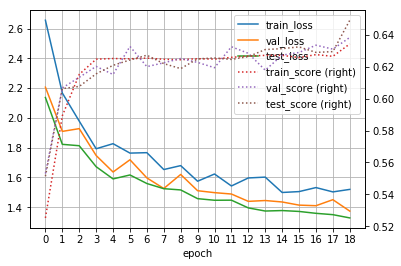

[NAME: NMAE0_1, EPOCH: 19]
> Train...
> Validation...
주야              0.628070
요일              0.124031
사망자수            0.946777
사상자수            0.809000
중상자수            0.830698
경상자수            0.844748
부상신고자수          0.978441
발생지시도           0.096886
발생지시군구          0.061433
사고유형_대분류        0.976431
사고유형_중분류        0.448845
법규위반            0.756667
도로형태_대분류        0.922794
도로형태            0.760300
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.630662
요일              0.123333
사망자수            0.962650
사상자수            0.804460
중상자수            0.845144
경상자수            0.825637
부상신고자수          0.974482
발생지시도           0.099010
발생지시군구          0.072000
사고유형_대분류        0.976744
사고유형_중분류        0.386207
법규위반            0.731293
도로형태_대분류        0.913793
도로형태            0.729927
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.477 num_loss: 0.3161 cat_loss: 1.161
score: 0.6421 num_score: 0.

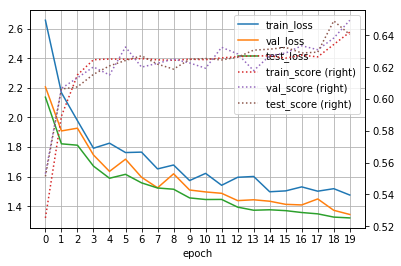

[NAME: NMAE0_1, EPOCH: 20]
> Train...
> Validation...
주야              0.554386
요일              0.124031
사망자수            0.950140
사상자수            0.793379
중상자수            0.829769
경상자수            0.837691
부상신고자수          0.978441
발생지시도           0.096886
발생지시군구          0.040956
사고유형_대분류        0.959596
사고유형_중분류        0.488449
법규위반            0.756667
도로형태_대분류        0.930147
도로형태            0.760300
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.123333
사망자수            0.963204
사상자수            0.814549
중상자수            0.842439
경상자수            0.830227
부상신고자수          0.974482
발생지시도           0.118812
발생지시군구          0.044000
사고유형_대분류        0.976744
사고유형_중분류        0.424138
법규위반            0.727891
도로형태_대분류        0.913793
도로형태            0.737226
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.428 num_loss: 0.2708 cat_loss: 1.158
score: 0.6427 num_score: 0.

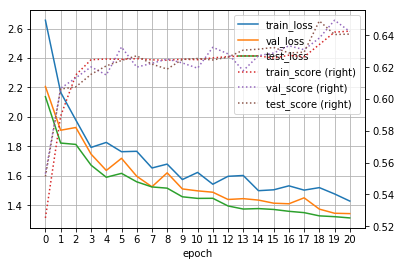

[NAME: NMAE0_1, EPOCH: 21]
> Train...
> Validation...
주야              0.610526
요일              0.124031
사망자수            0.946552
사상자수            0.820284
중상자수            0.820967
경상자수            0.868392
부상신고자수          0.978441
발생지시도           0.079585
발생지시군구          0.054608
사고유형_대분류        0.973064
사고유형_중분류        0.465347
법규위반            0.746667
도로형태_대분류        0.926471
도로형태            0.794007
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.609756
요일              0.123333
사망자수            0.960934
사상자수            0.781223
중상자수            0.850331
경상자수            0.844887
부상신고자수          0.974482
발생지시도           0.095710
발생지시군구          0.068000
사고유형_대분류        0.980620
사고유형_중분류        0.448276
법규위반            0.731293
도로형태_대분류        0.906897
도로형태            0.773723
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.456 num_loss: 0.302 cat_loss: 1.154
score: 0.6436 num_score: 0.8

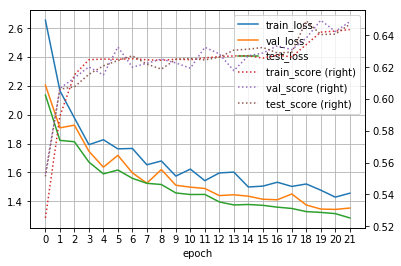

[NAME: NMAE0_1, EPOCH: 22]
> Train...
> Validation...
주야              0.575439
요일              0.124031
사망자수            0.948077
사상자수            0.792180
중상자수            0.809584
경상자수            0.865782
부상신고자수          0.978441
발생지시도           0.096886
발생지시군구          0.047782
사고유형_대분류        0.973064
사고유형_중분류        0.468647
법규위반            0.746667
도로형태_대분류        0.915441
도로형태            0.760300
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.613240
요일              0.123333
사망자수            0.966814
사상자수            0.818303
중상자수            0.851641
경상자수            0.826599
부상신고자수          0.974482
발생지시도           0.075908
발생지시군구          0.064000
사고유형_대분류        0.976744
사고유형_중분류        0.424138
법규위반            0.724490
도로형태_대분류        0.910345
도로형태            0.759124
당사자종별_1당_대분류    0.429553
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.504 num_loss: 0.3515 cat_loss: 1.152
score: 0.642 num_score: 0.8

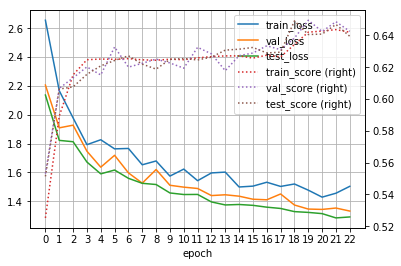

[NAME: NMAE0_1, EPOCH: 23]
> Train...
> Validation...
주야              0.638596
요일              0.124031
사망자수            0.950267
사상자수            0.818069
중상자수            0.825901
경상자수            0.875010
부상신고자수          0.978441
발생지시도           0.058824
발생지시군구          0.064846
사고유형_대분류        0.952862
사고유형_중분류        0.468647
법규위반            0.770000
도로형태_대분류        0.915441
도로형태            0.745318
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.123333
사망자수            0.964725
사상자수            0.831969
중상자수            0.853134
경상자수            0.847472
부상신고자수          0.974482
발생지시도           0.105611
발생지시군구          0.076000
사고유형_대분류        0.992248
사고유형_중분류        0.434483
법규위반            0.734694
도로형태_대분류        0.906897
도로형태            0.726277
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.49 num_loss: 0.3416 cat_loss: 1.149
score: 0.6428 num_score: 0.8

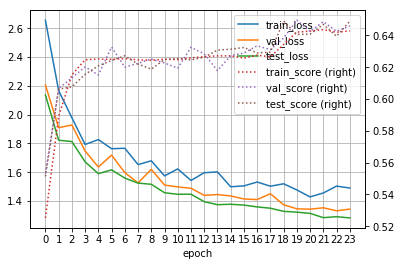

[NAME: NMAE0_1, EPOCH: 24]
> Train...
> Validation...
주야              0.652632
요일              0.124031
사망자수            0.939073
사상자수            0.756408
중상자수            0.797361
경상자수            0.848749
부상신고자수          0.978441
발생지시도           0.083045
발생지시군구          0.040956
사고유형_대분류        0.966330
사고유형_중분류        0.452145
법규위반            0.743333
도로형태_대분류        0.922794
도로형태            0.767790
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.123333
사망자수            0.967695
사상자수            0.816374
중상자수            0.841528
경상자수            0.859283
부상신고자수          0.974482
발생지시도           0.072607
발생지시군구          0.064000
사고유형_대분류        0.984496
사고유형_중분류        0.458621
법규위반            0.751701
도로형태_대분류        0.893103
도로형태            0.733577
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.432 num_loss: 0.2853 cat_loss: 1.147
score: 0.6435 num_score: 0.

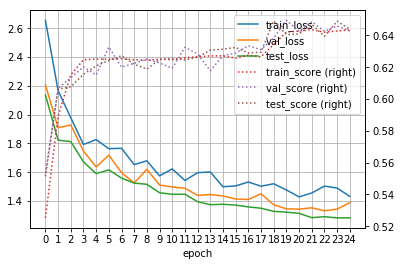

[NAME: NMAE0_1, EPOCH: 25]
> Train...
> Validation...
주야              0.624561
요일              0.124031
사망자수            0.948584
사상자수            0.807948
중상자수            0.820289
경상자수            0.858074
부상신고자수          0.978441
발생지시도           0.079585
발생지시군구          0.054608
사고유형_대분류        0.966330
사고유형_중분류        0.448845
법규위반            0.756667
도로형태_대분류        0.930147
도로형태            0.760300
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.123333
사망자수            0.967605
사상자수            0.826075
중상자수            0.850479
경상자수            0.840338
부상신고자수          0.974482
발생지시도           0.079208
발생지시군구          0.060000
사고유형_대분류        0.988372
사고유형_중분류        0.403448
법규위반            0.710884
도로형태_대분류        0.906897
도로형태            0.748175
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.44 num_loss: 0.2939 cat_loss: 1.146
score: 0.6438 num_score: 0.8

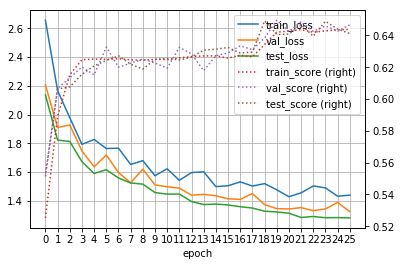

[NAME: NMAE0_1, EPOCH: 26]
> Train...
> Validation...
주야              0.585965
요일              0.124031
사망자수            0.954927
사상자수            0.831646
중상자수            0.825165
경상자수            0.865811
부상신고자수          0.978441
발생지시도           0.079585
발생지시군구          0.044369
사고유형_대분류        0.973064
사고유형_중분류        0.481848
법규위반            0.770000
도로형태_대분류        0.922794
도로형태            0.771536
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.616725
요일              0.123333
사망자수            0.961799
사상자수            0.823203
중상자수            0.849402
경상자수            0.835261
부상신고자수          0.974482
발생지시도           0.089109
발생지시군구          0.056000
사고유형_대분류        0.988372
사고유형_중분류        0.465517
법규위반            0.738095
도로형태_대분류        0.917241
도로형태            0.726277
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.505 num_loss: 0.3636 cat_loss: 1.141
score: 0.6439 num_score: 0.

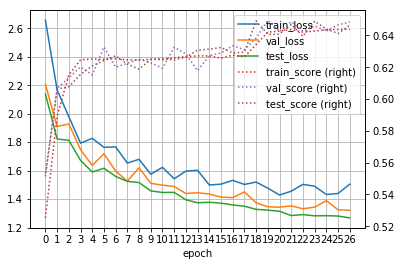

[NAME: NMAE0_1, EPOCH: 27]
> Train...
> Validation...
주야              0.614035
요일              0.124031
사망자수            0.946279
사상자수            0.778042
중상자수            0.790978
경상자수            0.853950
부상신고자수          0.978441
발생지시도           0.072664
발생지시군구          0.034130
사고유형_대분류        0.979798
사고유형_중분류        0.471947
법규위반            0.756667
도로형태_대분류        0.922794
도로형태            0.779026
당사자종별_1당_대분류    0.433213
당사자종별_2당_대분류    0.743421
Name: score, dtype: float64
> Test...
주야              0.599303
요일              0.123333
사망자수            0.968147
사상자수            0.817067
중상자수            0.849395
경상자수            0.845331
부상신고자수          0.974482
발생지시도           0.115512
발생지시군구          0.076000
사고유형_대분류        0.980620
사고유형_중분류        0.448276
법규위반            0.727891
도로형태_대분류        0.906897
도로형태            0.762774
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.438 num_loss: 0.295 cat_loss: 1.143
score: 0.6423 num_score: 0.8

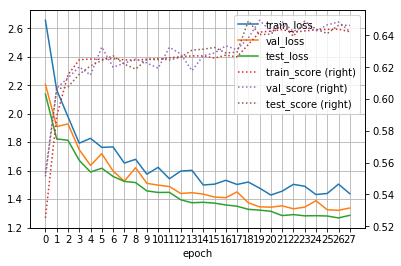

[NAME: NMAE0_1, EPOCH: 28]
> Train...
> Validation...
주야              0.624561
요일              0.124031
사망자수            0.945479
사상자수            0.787695
중상자수            0.824103
경상자수            0.857414
부상신고자수          0.978441
발생지시도           0.072664
발생지시군구          0.058020
사고유형_대분류        0.969697
사고유형_중분류        0.498350
법규위반            0.746667
도로형태_대분류        0.915441
도로형태            0.779026
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.592334
요일              0.123333
사망자수            0.968337
사상자수            0.819491
중상자수            0.846885
경상자수            0.850302
부상신고자수          0.974482
발생지시도           0.089109
발생지시군구          0.068000
사고유형_대분류        0.980620
사고유형_중분류        0.420690
법규위반            0.761905
도로형태_대분류        0.910345
도로형태            0.748175
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.723776
Name: score, dtype: float64
[train] loss: 1.483 num_loss: 0.3447 cat_loss: 1.138
score: 0.645 num_score: 0.8

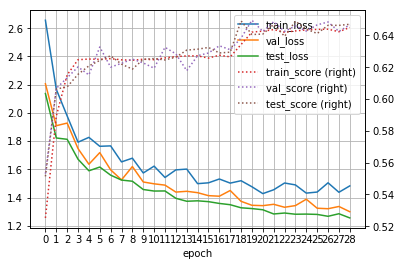

[NAME: NMAE0_1, EPOCH: 29]
> Train...
> Validation...
주야              0.571930
요일              0.124031
사망자수            0.946012
사상자수            0.804873
중상자수            0.817370
경상자수            0.853345
부상신고자수          0.978441
발생지시도           0.089965
발생지시군구          0.061433
사고유형_대분류        0.969697
사고유형_중분류        0.471947
법규위반            0.750000
도로형태_대분류        0.919118
도로형태            0.790262
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.123333
사망자수            0.967702
사상자수            0.802973
중상자수            0.831033
경상자수            0.844788
부상신고자수          0.974482
발생지시도           0.092409
발생지시군구          0.072000
사고유형_대분류        0.984496
사고유형_중분류        0.424138
법규위반            0.751701
도로형태_대분류        0.896552
도로형태            0.762774
당사자종별_1당_대분류    0.429553
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.447 num_loss: 0.3106 cat_loss: 1.136
score: 0.6424 num_score: 0.

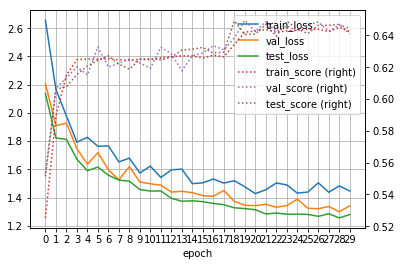

[NAME: NMAE0_2, EPOCH: 0]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.920202
사상자수            0.652036
중상자수            0.798671
경상자수            0.840758
부상신고자수          0.978441
발생지시도           0.183391
발생지시군구          0.017065
사고유형_대분류        0.717172
사고유형_중분류        0.300330
법규위반            0.720000
도로형태_대분류        0.761029
도로형태            0.726592
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.542763
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.120000
사망자수            0.940600
사상자수            0.692551
중상자수            0.806331
경상자수            0.834976
부상신고자수          0.974482
발생지시도           0.181518
발생지시군구          0.024000
사고유형_대분류        0.782946
사고유형_중분류        0.320690
법규위반            0.690476
도로형태_대분류        0.789655
도로형태            0.715328
당사자종별_1당_대분류    0.484536
당사자종별_2당_대분류    0.583916
Name: score, dtype: float64
[train] loss: 2.449 num_loss: 0.5413 cat_loss: 1.907
score: 0.5435 num_score: 0.8

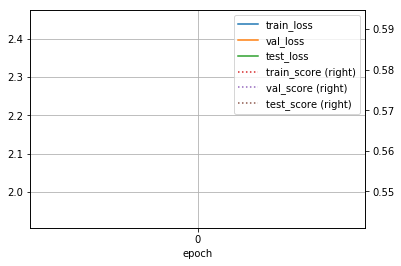

[NAME: NMAE0_2, EPOCH: 1]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.921578
사상자수            0.764286
중상자수            0.833391
경상자수            0.849333
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.023891
사고유형_대분류        0.929293
사고유형_중분류        0.346535
법규위반            0.733333
도로형태_대분류        0.875000
도로형태            0.775281
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.664474
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.934737
사상자수            0.764393
중상자수            0.823190
경상자수            0.832664
부상신고자수          0.974482
발생지시도           0.204620
발생지시군구          0.008000
사고유형_대분류        0.961240
사고유형_중분류        0.348276
법규위반            0.687075
도로형태_대분류        0.879310
도로형태            0.781022
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.639860
Name: score, dtype: float64
[train] loss: 2.122 num_loss: 0.5577 cat_loss: 1.564
score: 0.6135 num_score: 0.8

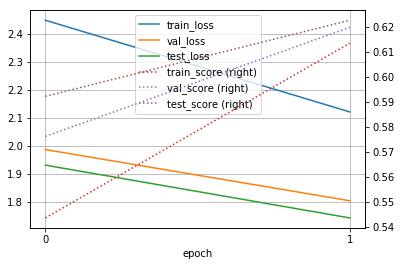

[NAME: NMAE0_2, EPOCH: 2]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.902094
사상자수            0.785547
중상자수            0.807226
경상자수            0.852520
부상신고자수          0.978441
발생지시도           0.183391
발생지시군구          0.006826
사고유형_대분류        0.939394
사고유형_중분류        0.349835
법규위반            0.730000
도로형태_대분류        0.886029
도로형태            0.771536
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.661184
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.946681
사상자수            0.795940
중상자수            0.802698
경상자수            0.842492
부상신고자수          0.974482
발생지시도           0.188119
발생지시군구          0.020000
사고유형_대분류        0.968992
사고유형_중분류        0.303448
법규위반            0.693878
도로형태_대분류        0.875862
도로형태            0.722628
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.657343
Name: score, dtype: float64
[train] loss: 1.894 num_loss: 0.4267 cat_loss: 1.467
score: 0.6185 num_score: 0.8

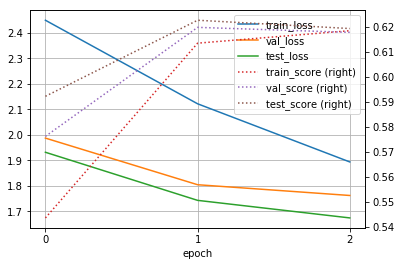

[NAME: NMAE0_2, EPOCH: 3]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.925893
사상자수            0.728216
중상자수            0.789156
경상자수            0.847340
부상신고자수          0.978441
발생지시도           0.176471
발생지시군구          0.020478
사고유형_대분류        0.946128
사고유형_중분류        0.339934
법규위반            0.730000
도로형태_대분류        0.904412
도로형태            0.771536
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.654605
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.126667
사망자수            0.964043
사상자수            0.710988
중상자수            0.824613
경상자수            0.833872
부상신고자수          0.974482
발생지시도           0.161716
발생지시군구          0.020000
사고유형_대분류        0.961240
사고유형_중분류        0.327586
법규위반            0.680272
도로형태_대분류        0.903448
도로형태            0.726277
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.636364
Name: score, dtype: float64
[train] loss: 1.792 num_loss: 0.3808 cat_loss: 1.412
score: 0.6255 num_score: 0.8

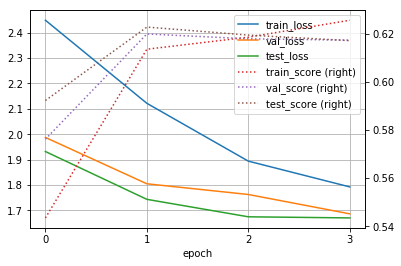

[NAME: NMAE0_2, EPOCH: 4]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.925191
사상자수            0.731482
중상자수            0.800942
경상자수            0.845572
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.020478
사고유형_대분류        0.929293
사고유형_중분류        0.333333
법규위반            0.766667
도로형태_대분류        0.893382
도로형태            0.745318
당사자종별_1당_대분류    0.379061
당사자종별_2당_대분류    0.641447
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.955544
사상자수            0.776717
중상자수            0.810493
경상자수            0.837339
부상신고자수          0.974482
발생지시도           0.161716
발생지시군구          0.020000
사고유형_대분류        0.965116
사고유형_중분류        0.341379
법규위반            0.707483
도로형태_대분류        0.906897
도로형태            0.748175
당사자종별_1당_대분류    0.405498
당사자종별_2당_대분류    0.639860
Name: score, dtype: float64
[train] loss: 1.73 num_loss: 0.3592 cat_loss: 1.371
score: 0.6285 num_score: 0.87

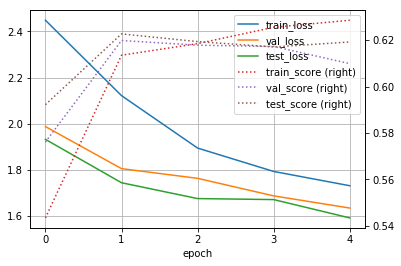

[NAME: NMAE0_2, EPOCH: 5]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.922767
사상자수            0.766367
중상자수            0.810468
경상자수            0.847248
부상신고자수          0.978441
발생지시도           0.100346
발생지시군구          0.027304
사고유형_대분류        0.959596
사고유형_중분류        0.399340
법규위반            0.730000
도로형태_대분류        0.915441
도로형태            0.752809
당사자종별_1당_대분류    0.407942
당사자종별_2당_대분류    0.634868
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.951875
사상자수            0.769823
중상자수            0.820749
경상자수            0.846949
부상신고자수          0.974482
발생지시도           0.115512
발생지시군구          0.028000
사고유형_대분류        0.972868
사고유형_중분류        0.389655
법규위반            0.724490
도로형태_대분류        0.889655
도로형태            0.729927
당사자종별_1당_대분류    0.402062
당사자종별_2당_대분류    0.625874
Name: score, dtype: float64
[train] loss: 1.701 num_loss: 0.3726 cat_loss: 1.329
score: 0.6297 num_score: 0.8

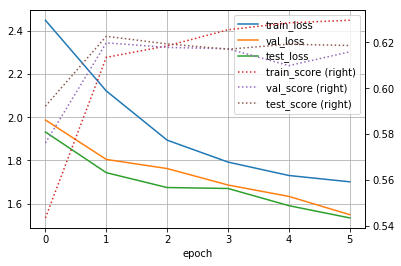

[NAME: NMAE0_2, EPOCH: 6]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.921696
사상자수            0.740789
중상자수            0.817090
경상자수            0.860952
부상신고자수          0.978441
발생지시도           0.107266
발생지시군구          0.030717
사고유형_대분류        0.952862
사고유형_중분류        0.419142
법규위반            0.750000
도로형태_대분류        0.908088
도로형태            0.741573
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.625000
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.963499
사상자수            0.760772
중상자수            0.834458
경상자수            0.846870
부상신고자수          0.974482
발생지시도           0.128713
발생지시군구          0.036000
사고유형_대분류        0.965116
사고유형_중분류        0.420690
법규위반            0.710884
도로형태_대분류        0.906897
도로형태            0.744526
당사자종별_1당_대분류    0.429553
당사자종별_2당_대분류    0.629371
Name: score, dtype: float64
[train] loss: 1.618 num_loss: 0.3266 cat_loss: 1.292
score: 0.6272 num_score: 0.8

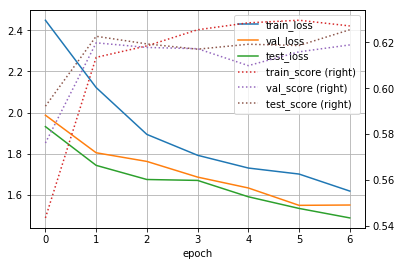

[NAME: NMAE0_2, EPOCH: 7]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.937922
사상자수            0.784508
중상자수            0.812638
경상자수            0.865328
부상신고자수          0.978441
발생지시도           0.110727
발생지시군구          0.040956
사고유형_대분류        0.966330
사고유형_중분류        0.425743
법규위반            0.760000
도로형태_대분류        0.911765
도로형태            0.737828
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.634868
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.965735
사상자수            0.799329
중상자수            0.823941
경상자수            0.845413
부상신고자수          0.974482
발생지시도           0.132013
발생지시군구          0.036000
사고유형_대분류        0.968992
사고유형_중분류        0.396552
법규위반            0.721088
도로형태_대분류        0.906897
도로형태            0.740876
당사자종별_1당_대분류    0.422680
당사자종별_2당_대분류    0.629371
Name: score, dtype: float64
[train] loss: 1.645 num_loss: 0.3752 cat_loss: 1.27
score: 0.6302 num_score: 0.87

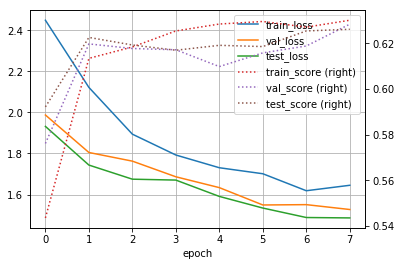

[NAME: NMAE0_2, EPOCH: 8]
> Train...
> Validation...
주야              0.477193
요일              0.116279
사망자수            0.947089
사상자수            0.779948
중상자수            0.826499
경상자수            0.863763
부상신고자수          0.978441
발생지시도           0.124567
발생지시군구          0.047782
사고유형_대분류        0.962963
사고유형_중분류        0.409241
법규위반            0.750000
도로형태_대분류        0.904412
도로형태            0.760300
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.625000
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.965020
사상자수            0.764895
중상자수            0.850706
경상자수            0.859007
부상신고자수          0.974482
발생지시도           0.118812
발생지시군구          0.048000
사고유형_대분류        0.976744
사고유형_중분류        0.365517
법규위반            0.700680
도로형태_대분류        0.920690
도로형태            0.740876
당사자종별_1당_대분류    0.402062
당사자종별_2당_대분류    0.618881
Name: score, dtype: float64
[train] loss: 1.624 num_loss: 0.3736 cat_loss: 1.251
score: 0.6309 num_score: 0.8

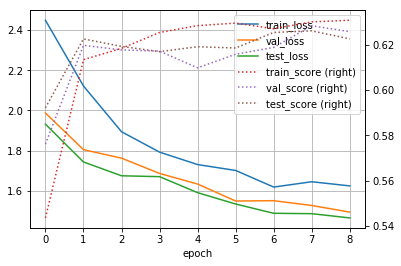

[NAME: NMAE0_2, EPOCH: 9]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.934910
사상자수            0.742129
중상자수            0.826137
경상자수            0.857401
부상신고자수          0.978441
발생지시도           0.131488
발생지시군구          0.051195
사고유형_대분류        0.952862
사고유형_중분류        0.412541
법규위반            0.733333
도로형태_대분류        0.915441
도로형태            0.764045
당사자종별_1당_대분류    0.397112
당사자종별_2당_대분류    0.644737
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.966427
사상자수            0.785390
중상자수            0.826580
경상자수            0.842625
부상신고자수          0.974482
발생지시도           0.125413
발생지시군구          0.068000
사고유형_대분류        0.968992
사고유형_중분류        0.389655
법규위반            0.734694
도로형태_대분류        0.917241
도로형태            0.773723
당사자종별_1당_대분류    0.398625
당사자종별_2당_대분류    0.604895
Name: score, dtype: float64
[train] loss: 1.645 num_loss: 0.4179 cat_loss: 1.227
score: 0.6336 num_score: 0.8

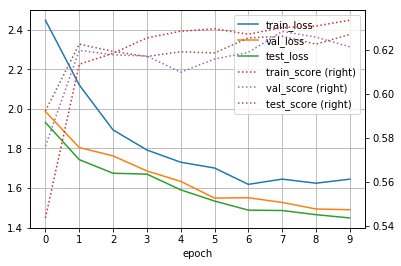

[NAME: NMAE0_2, EPOCH: 10]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.944313
사상자수            0.739770
중상자수            0.831720
경상자수            0.882449
부상신고자수          0.978441
발생지시도           0.159170
발생지시군구          0.075085
사고유형_대분류        0.956229
사고유형_중분류        0.412541
법규위반            0.756667
도로형태_대분류        0.922794
도로형태            0.749064
당사자종별_1당_대분류    0.418773
당사자종별_2당_대분류    0.631579
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.962302
사상자수            0.702567
중상자수            0.806781
경상자수            0.853991
부상신고자수          0.974482
발생지시도           0.128713
발생지시군구          0.064000
사고유형_대분류        0.965116
사고유형_중분류        0.382759
법규위반            0.693878
도로형태_대분류        0.906897
도로형태            0.770073
당사자종별_1당_대분류    0.405498
당사자종별_2당_대분류    0.618881
Name: score, dtype: float64
[train] loss: 1.606 num_loss: 0.4051 cat_loss: 1.201
score: 0.6344 num_score: 0.

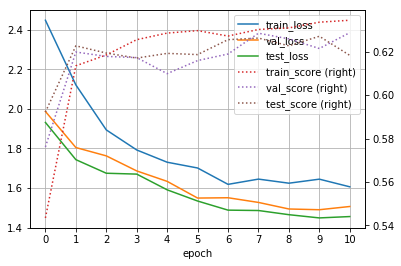

[NAME: NMAE0_2, EPOCH: 11]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.945161
사상자수            0.775412
중상자수            0.826231
경상자수            0.868191
부상신고자수          0.978441
발생지시도           0.103806
발생지시군구          0.085324
사고유형_대분류        0.952862
사고유형_중분류        0.422442
법규위반            0.756667
도로형태_대분류        0.919118
도로형태            0.782772
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.641447
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.961076
사상자수            0.771326
중상자수            0.799516
경상자수            0.851747
부상신고자수          0.974482
발생지시도           0.102310
발생지시군구          0.036000
사고유형_대분류        0.972868
사고유형_중분류        0.389655
법규위반            0.748299
도로형태_대분류        0.906897
도로형태            0.759124
당사자종별_1당_대분류    0.470790
당사자종별_2당_대분류    0.629371
Name: score, dtype: float64
[train] loss: 1.51 num_loss: 0.3285 cat_loss: 1.181
score: 0.633 num_score: 0.87

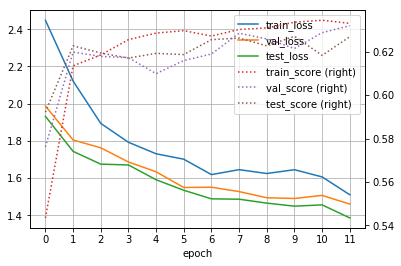

[NAME: NMAE0_2, EPOCH: 12]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.943363
사상자수            0.782895
중상자수            0.825215
경상자수            0.868149
부상신고자수          0.978441
발생지시도           0.114187
발생지시군구          0.075085
사고유형_대분류        0.973064
사고유형_중분류        0.405941
법규위반            0.740000
도로형태_대분류        0.922794
도로형태            0.760300
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.641447
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.965780
사상자수            0.792235
중상자수            0.830388
경상자수            0.844830
부상신고자수          0.974482
발생지시도           0.108911
발생지시군구          0.060000
사고유형_대분류        0.972868
사고유형_중분류        0.417241
법규위반            0.727891
도로형태_대분류        0.913793
도로형태            0.740876
당사자종별_1당_대분류    0.432990
당사자종별_2당_대분류    0.608392
Name: score, dtype: float64
[train] loss: 1.448 num_loss: 0.2869 cat_loss: 1.162
score: 0.6348 num_score: 0.

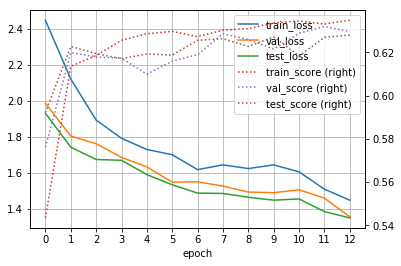

[NAME: NMAE0_2, EPOCH: 13]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.937240
사상자수            0.806108
중상자수            0.814601
경상자수            0.869212
부상신고자수          0.978441
발생지시도           0.121107
발생지시군구          0.071672
사고유형_대분류        0.966330
사고유형_중분류        0.419142
법규위반            0.740000
도로형태_대분류        0.922794
도로형태            0.771536
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.654605
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.964180
사상자수            0.777134
중상자수            0.820793
경상자수            0.842192
부상신고자수          0.974482
발생지시도           0.102310
발생지시군구          0.068000
사고유형_대분류        0.976744
사고유형_중분류        0.396552
법규위반            0.700680
도로형태_대분류        0.903448
도로형태            0.748175
당사자종별_1당_대분류    0.391753
당사자종별_2당_대분류    0.632867
Name: score, dtype: float64
[train] loss: 1.592 num_loss: 0.44 cat_loss: 1.152
score: 0.6299 num_score: 0.87

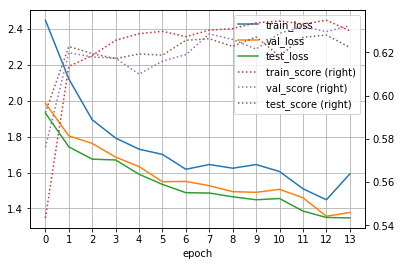

[NAME: NMAE0_2, EPOCH: 14]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.940808
사상자수            0.787621
중상자수            0.842259
경상자수            0.856687
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.085324
사고유형_대분류        0.966330
사고유형_중분류        0.425743
법규위반            0.763333
도로형태_대분류        0.922794
도로형태            0.767790
당사자종별_1당_대분류    0.418773
당사자종별_2당_대분류    0.641447
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.967989
사상자수            0.808053
중상자수            0.820620
경상자수            0.850539
부상신고자수          0.974482
발생지시도           0.105611
발생지시군구          0.072000
사고유형_대분류        0.976744
사고유형_중분류        0.417241
법규위반            0.744898
도로형태_대분류        0.920690
도로형태            0.773723
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.643357
Name: score, dtype: float64
[train] loss: 1.421 num_loss: 0.2773 cat_loss: 1.144
score: 0.6326 num_score: 0.

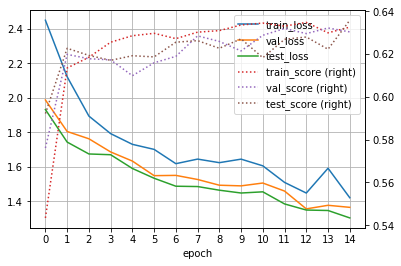

[NAME: NMAE0_2, EPOCH: 15]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.947809
사상자수            0.782034
중상자수            0.835434
경상자수            0.873304
부상신고자수          0.978441
발생지시도           0.110727
발생지시군구          0.088737
사고유형_대분류        0.966330
사고유형_중분류        0.402640
법규위반            0.743333
도로형태_대분류        0.915441
도로형태            0.771536
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.648026
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.963342
사상자수            0.792266
중상자수            0.806057
경상자수            0.848608
부상신고자수          0.974482
발생지시도           0.102310
발생지시군구          0.076000
사고유형_대분류        0.980620
사고유형_중분류        0.379310
법규위반            0.734694
도로형태_대분류        0.917241
도로형태            0.766423
당사자종별_1당_대분류    0.391753
당사자종별_2당_대분류    0.636364
Name: score, dtype: float64
[train] loss: 1.527 num_loss: 0.3901 cat_loss: 1.137
score: 0.6331 num_score: 0.

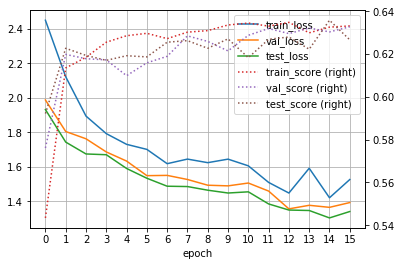

[NAME: NMAE0_2, EPOCH: 16]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.942388
사상자수            0.810266
중상자수            0.844021
경상자수            0.864481
부상신고자수          0.978441
발생지시도           0.128028
발생지시군구          0.075085
사고유형_대분류        0.979798
사고유형_중분류        0.399340
법규위반            0.786667
도로형태_대분류        0.926471
도로형태            0.775281
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.638158
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.126667
사망자수            0.968045
사상자수            0.814405
중상자수            0.819663
경상자수            0.852025
부상신고자수          0.974482
발생지시도           0.168317
발생지시군구          0.064000
사고유형_대분류        0.976744
사고유형_중분류        0.406897
법규위반            0.704082
도로형태_대분류        0.913793
도로형태            0.751825
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.629371
Name: score, dtype: float64
[train] loss: 1.441 num_loss: 0.3144 cat_loss: 1.127
score: 0.6376 num_score: 0.

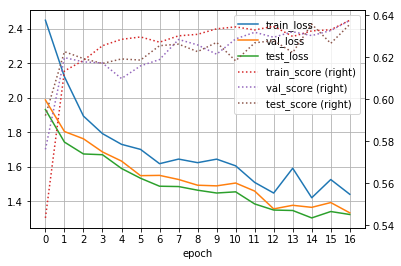

[NAME: NMAE0_2, EPOCH: 17]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.942142
사상자수            0.753948
중상자수            0.794142
경상자수            0.872117
부상신고자수          0.978441
발생지시도           0.155709
발생지시군구          0.095563
사고유형_대분류        0.969697
사고유형_중분류        0.425743
법규위반            0.753333
도로형태_대분류        0.919118
도로형태            0.756554
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.657895
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.966589
사상자수            0.804554
중상자수            0.840306
경상자수            0.855121
부상신고자수          0.974482
발생지시도           0.118812
발생지시군구          0.072000
사고유형_대분류        0.976744
사고유형_중분류        0.382759
법규위반            0.731293
도로형태_대분류        0.903448
도로형태            0.759124
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.643357
Name: score, dtype: float64
[train] loss: 1.496 num_loss: 0.3731 cat_loss: 1.123
score: 0.6372 num_score: 0.

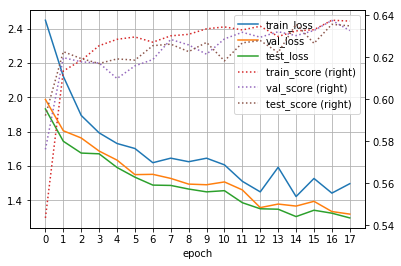

[NAME: NMAE0_2, EPOCH: 18]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.951148
사상자수            0.806198
중상자수            0.800822
경상자수            0.858168
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.088737
사고유형_대분류        0.976431
사고유형_중분류        0.412541
법규위반            0.743333
도로형태_대분류        0.919118
도로형태            0.775281
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.644737
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.966435
사상자수            0.814696
중상자수            0.826357
경상자수            0.849195
부상신고자수          0.974482
발생지시도           0.092409
발생지시군구          0.080000
사고유형_대분류        0.992248
사고유형_중분류        0.379310
법규위반            0.727891
도로형태_대분류        0.913793
도로형태            0.777372
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.650350
Name: score, dtype: float64
[train] loss: 1.486 num_loss: 0.3697 cat_loss: 1.116
score: 0.636 num_score: 0.8

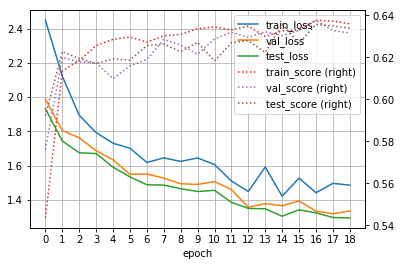

[NAME: NMAE0_2, EPOCH: 19]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.939168
사상자수            0.768552
중상자수            0.827073
경상자수            0.852431
부상신고자수          0.978441
발생지시도           0.110727
발생지시군구          0.078498
사고유형_대분류        0.969697
사고유형_중분류        0.402640
법규위반            0.773333
도로형태_대분류        0.930147
도로형태            0.782772
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.644737
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.967890
사상자수            0.806690
중상자수            0.839414
경상자수            0.848104
부상신고자수          0.974482
발생지시도           0.135314
발생지시군구          0.088000
사고유형_대분류        0.980620
사고유형_중분류        0.413793
법규위반            0.727891
도로형태_대분류        0.903448
도로형태            0.759124
당사자종별_1당_대분류    0.522337
당사자종별_2당_대분류    0.643357
Name: score, dtype: float64
[train] loss: 1.436 num_loss: 0.3206 cat_loss: 1.115
score: 0.636 num_score: 0.8

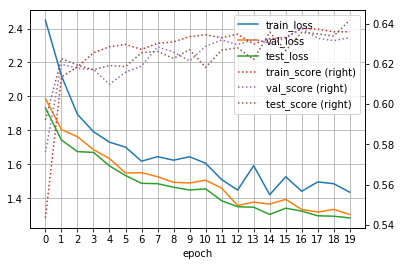

[NAME: NMAE0_2, EPOCH: 20]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.936059
사상자수            0.794615
중상자수            0.834057
경상자수            0.864097
부상신고자수          0.978441
발생지시도           0.128028
발생지시군구          0.085324
사고유형_대분류        0.983165
사고유형_중분류        0.432343
법규위반            0.760000
도로형태_대분류        0.922794
도로형태            0.775281
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.667763
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.965931
사상자수            0.809454
중상자수            0.856647
경상자수            0.843826
부상신고자수          0.974482
발생지시도           0.105611
발생지시군구          0.068000
사고유형_대분류        0.988372
사고유형_중분류        0.379310
법규위반            0.741497
도로형태_대분류        0.910345
도로형태            0.751825
당사자종별_1당_대분류    0.422680
당사자종별_2당_대분류    0.653846
Name: score, dtype: float64
[train] loss: 1.425 num_loss: 0.315 cat_loss: 1.11
score: 0.6357 num_score: 0.88

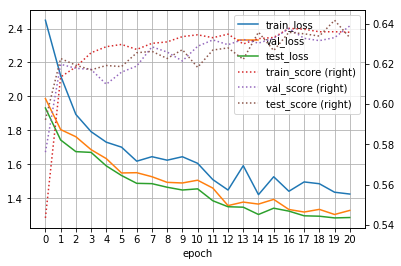

[NAME: NMAE0_2, EPOCH: 21]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.945125
사상자수            0.793489
중상자수            0.828994
경상자수            0.827331
부상신고자수          0.978441
발생지시도           0.145329
발생지시군구          0.085324
사고유형_대분류        0.969697
사고유형_중분류        0.432343
법규위반            0.726667
도로형태_대분류        0.922794
도로형태            0.775281
당사자종별_1당_대분류    0.465704
당사자종별_2당_대분류    0.664474
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.965278
사상자수            0.820034
중상자수            0.848736
경상자수            0.839540
부상신고자수          0.974482
발생지시도           0.099010
발생지시군구          0.064000
사고유형_대분류        0.980620
사고유형_중분류        0.396552
법규위반            0.741497
도로형태_대분류        0.917241
도로형태            0.777372
당사자종별_1당_대분류    0.498282
당사자종별_2당_대분류    0.664336
Name: score, dtype: float64
[train] loss: 1.416 num_loss: 0.311 cat_loss: 1.105
score: 0.639 num_score: 0.88

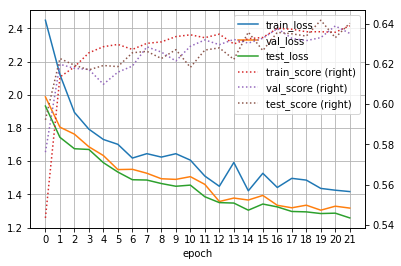

[NAME: NMAE0_2, EPOCH: 22]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.942967
사상자수            0.757638
중상자수            0.813951
경상자수            0.857533
부상신고자수          0.978441
발생지시도           0.124567
발생지시군구          0.075085
사고유형_대분류        0.969697
사고유형_중분류        0.409241
법규위반            0.746667
도로형태_대분류        0.922794
도로형태            0.782772
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.654605
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.959346
사상자수            0.807218
중상자수            0.836370
경상자수            0.863118
부상신고자수          0.974482
발생지시도           0.125413
발생지시군구          0.072000
사고유형_대분류        0.976744
사고유형_중분류        0.424138
법규위반            0.738095
도로형태_대분류        0.900000
도로형태            0.766423
당사자종별_1당_대분류    0.419244
당사자종별_2당_대분류    0.650350
Name: score, dtype: float64
[train] loss: 1.388 num_loss: 0.2838 cat_loss: 1.104
score: 0.6397 num_score: 0.

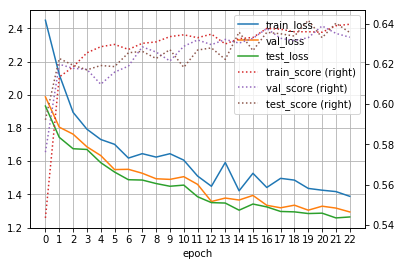

[NAME: NMAE0_2, EPOCH: 23]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.946427
사상자수            0.760619
중상자수            0.812787
경상자수            0.840456
부상신고자수          0.978441
발생지시도           0.114187
발생지시군구          0.071672
사고유형_대분류        0.983165
사고유형_중분류        0.429043
법규위반            0.753333
도로형태_대분류        0.915441
도로형태            0.779026
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.644737
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.967805
사상자수            0.818204
중상자수            0.846237
경상자수            0.848854
부상신고자수          0.974482
발생지시도           0.151815
발생지시군구          0.084000
사고유형_대분류        0.984496
사고유형_중분류        0.375862
법규위반            0.727891
도로형태_대분류        0.913793
도로형태            0.766423
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.643357
Name: score, dtype: float64
[train] loss: 1.428 num_loss: 0.3243 cat_loss: 1.104
score: 0.639 num_score: 0.8

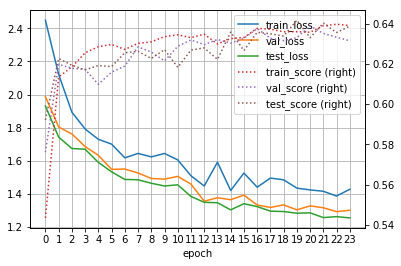

[NAME: NMAE0_2, EPOCH: 24]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.950197
사상자수            0.757934
중상자수            0.805617
경상자수            0.865547
부상신고자수          0.978441
발생지시도           0.145329
발생지시군구          0.075085
사고유형_대분류        0.973064
사고유형_중분류        0.452145
법규위반            0.740000
도로형태_대분류        0.922794
도로형태            0.782772
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.648026
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.969846
사상자수            0.803635
중상자수            0.846838
경상자수            0.837029
부상신고자수          0.974482
발생지시도           0.099010
발생지시군구          0.076000
사고유형_대분류        0.976744
사고유형_중분류        0.368966
법규위반            0.724490
도로형태_대분류        0.917241
도로형태            0.762774
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.646853
Name: score, dtype: float64
[train] loss: 1.402 num_loss: 0.3038 cat_loss: 1.098
score: 0.6427 num_score: 0.

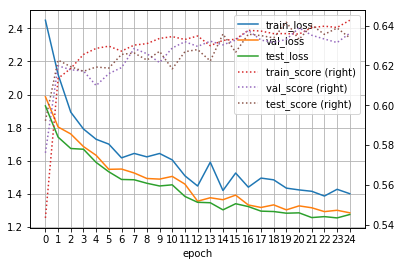

[NAME: NMAE0_2, EPOCH: 25]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.949332
사상자수            0.797756
중상자수            0.839457
경상자수            0.867270
부상신고자수          0.978441
발생지시도           0.121107
발생지시군구          0.105802
사고유형_대분류        0.976431
사고유형_중분류        0.386139
법규위반            0.763333
도로형태_대분류        0.908088
도로형태            0.775281
당사자종별_1당_대분류    0.476534
당사자종별_2당_대분류    0.641447
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.964416
사상자수            0.825884
중상자수            0.850096
경상자수            0.815614
부상신고자수          0.974482
발생지시도           0.161716
발생지시군구          0.088000
사고유형_대분류        0.972868
사고유형_중분류        0.362069
법규위반            0.744898
도로형태_대분류        0.931034
도로형태            0.766423
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.646853
Name: score, dtype: float64
[train] loss: 1.423 num_loss: 0.3246 cat_loss: 1.099
score: 0.6406 num_score: 0.

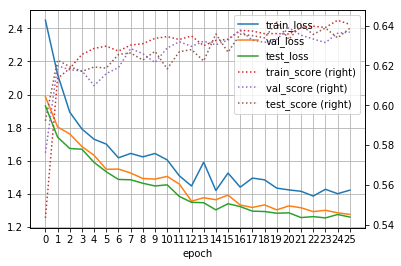

[NAME: NMAE0_2, EPOCH: 26]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.952394
사상자수            0.788120
중상자수            0.822540
경상자수            0.866871
부상신고자수          0.978441
발생지시도           0.117647
발생지시군구          0.088737
사고유형_대분류        0.973064
사고유형_중분류        0.422442
법규위반            0.763333
도로형태_대분류        0.926471
도로형태            0.767790
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.674342
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.965264
사상자수            0.817278
중상자수            0.865418
경상자수            0.850821
부상신고자수          0.974482
발생지시도           0.132013
발생지시군구          0.084000
사고유형_대분류        0.980620
사고유형_중분류        0.434483
법규위반            0.738095
도로형태_대분류        0.913793
도로형태            0.773723
당사자종별_1당_대분류    0.432990
당사자종별_2당_대분류    0.639860
Name: score, dtype: float64
[train] loss: 1.411 num_loss: 0.3139 cat_loss: 1.097
score: 0.6391 num_score: 0.

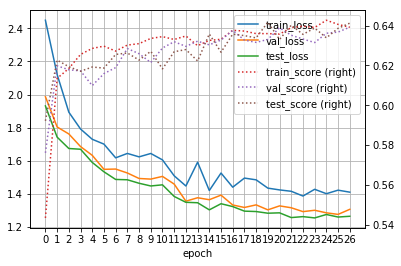

[NAME: NMAE0_2, EPOCH: 27]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.944547
사상자수            0.780689
중상자수            0.813150
경상자수            0.862299
부상신고자수          0.978441
발생지시도           0.141869
발생지시군구          0.081911
사고유형_대분류        0.986532
사고유형_중분류        0.471947
법규위반            0.766667
도로형태_대분류        0.919118
도로형태            0.782772
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.641447
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.968229
사상자수            0.818593
중상자수            0.834705
경상자수            0.845493
부상신고자수          0.974482
발생지시도           0.118812
발생지시군구          0.072000
사고유형_대분류        0.980620
사고유형_중분류        0.406897
법규위반            0.707483
도로형태_대분류        0.913793
도로형태            0.784672
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.653846
Name: score, dtype: float64
[train] loss: 1.387 num_loss: 0.2932 cat_loss: 1.093
score: 0.6448 num_score: 0.

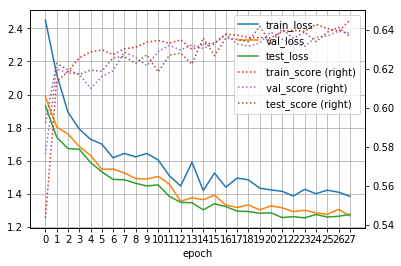

[NAME: NMAE0_2, EPOCH: 28]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.951759
사상자수            0.815251
중상자수            0.828166
경상자수            0.871276
부상신고자수          0.978441
발생지시도           0.148789
발생지시군구          0.095563
사고유형_대분류        0.979798
사고유형_중분류        0.432343
법규위반            0.760000
도로형태_대분류        0.922794
도로형태            0.779026
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.651316
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.969026
사상자수            0.835666
중상자수            0.841453
경상자수            0.845218
부상신고자수          0.974482
발생지시도           0.148515
발생지시군구          0.092000
사고유형_대분류        0.996124
사고유형_중분류        0.410345
법규위반            0.727891
도로형태_대분류        0.910345
도로형태            0.770073
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.667832
Name: score, dtype: float64
[train] loss: 1.421 num_loss: 0.3269 cat_loss: 1.094
score: 0.6392 num_score: 0.

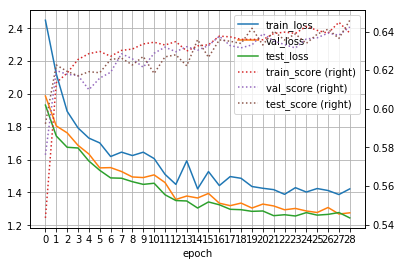

[NAME: NMAE0_2, EPOCH: 29]
> Train...
> Validation...
주야              0.477193
요일              0.124031
사망자수            0.951215
사상자수            0.779308
중상자수            0.835081
경상자수            0.857287
부상신고자수          0.978441
발생지시도           0.121107
발생지시군구          0.105802
사고유형_대분류        0.979798
사고유형_중분류        0.432343
법규위반            0.760000
도로형태_대분류        0.926471
도로형태            0.767790
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.644737
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.123333
사망자수            0.967641
사상자수            0.811388
중상자수            0.837532
경상자수            0.849278
부상신고자수          0.974482
발생지시도           0.138614
발생지시군구          0.100000
사고유형_대분류        0.992248
사고유형_중분류        0.417241
법규위반            0.724490
도로형태_대분류        0.924138
도로형태            0.784672
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.639860
Name: score, dtype: float64
[train] loss: 1.419 num_loss: 0.3271 cat_loss: 1.092
score: 0.642 num_score: 0.8

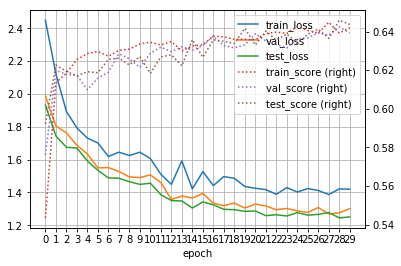

[NAME: NMAE0_3, EPOCH: 0]
> Train...
> Validation...
주야              0.631579
요일              0.124031
사망자수            0.880060
사상자수            0.723717
중상자수            0.822908
경상자수            0.865396
부상신고자수          0.976688
발생지시도           0.148789
발생지시군구          0.010239
사고유형_대분류        0.740741
사고유형_중분류        0.349835
법규위반            0.720000
도로형태_대분류        0.720588
도로형태            0.621723
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.592105
Name: score, dtype: float64
> Test...
주야              0.578397
요일              0.116667
사망자수            0.934469
사상자수            0.684280
중상자수            0.814301
경상자수            0.843526
부상신고자수          0.974446
발생지시도           0.181518
발생지시군구          0.016000
사고유형_대분류        0.782946
사고유형_중분류        0.306897
법규위반            0.697279
도로형태_대분류        0.693103
도로형태            0.562044
당사자종별_1당_대분류    0.484536
당사자종별_2당_대분류    0.618881
Name: score, dtype: float64
[train] loss: 2.424 num_loss: 0.5165 cat_loss: 1.908
score: 0.5434 num_score: 0.8

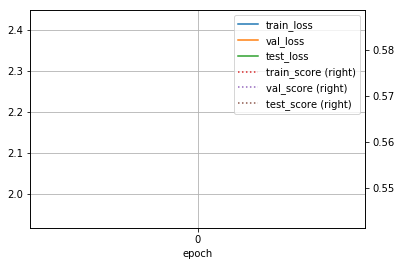

[NAME: NMAE0_3, EPOCH: 1]
> Train...
> Validation...
주야              0.582456
요일              0.124031
사망자수            0.896904
사상자수            0.636675
중상자수            0.776251
경상자수            0.863757
부상신고자수          0.978441
발생지시도           0.159170
발생지시군구          0.013652
사고유형_대분류        0.902357
사고유형_중분류        0.359736
법규위반            0.720000
도로형태_대분류        0.867647
도로형태            0.752809
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.680921
Name: score, dtype: float64
> Test...
주야              0.550523
요일              0.123333
사망자수            0.944243
사상자수            0.705825
중상자수            0.829359
경상자수            0.852538
부상신고자수          0.974482
발생지시도           0.188119
발생지시군구          0.028000
사고유형_대분류        0.930233
사고유형_중분류        0.410345
법규위반            0.693878
도로형태_대분류        0.844828
도로형태            0.737226
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.664336
Name: score, dtype: float64
[train] loss: 1.91 num_loss: 0.4105 cat_loss: 1.499
score: 0.618 num_score: 0.861

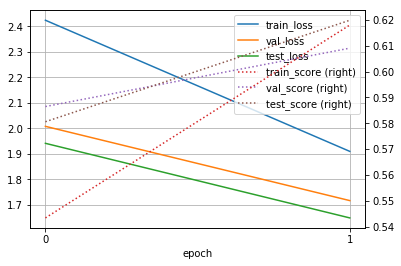

[NAME: NMAE0_3, EPOCH: 2]
> Train...
> Validation...
주야              0.571930
요일              0.124031
사망자수            0.932067
사상자수            0.778845
중상자수            0.815336
경상자수            0.854056
부상신고자수          0.978441
발생지시도           0.183391
발생지시군구          0.010239
사고유형_대분류        0.922559
사고유형_중분류        0.435644
법규위반            0.733333
도로형태_대분류        0.911765
도로형태            0.767790
당사자종별_1당_대분류    0.418773
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.550523
요일              0.123333
사망자수            0.947695
사상자수            0.760089
중상자수            0.825629
경상자수            0.842711
부상신고자수          0.974482
발생지시도           0.198020
발생지시군구          0.024000
사고유형_대분류        0.945736
사고유형_중분류        0.417241
법규위반            0.714286
도로형태_대분류        0.858621
도로형태            0.726277
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.775 num_loss: 0.4082 cat_loss: 1.366
score: 0.6303 num_score: 0.8

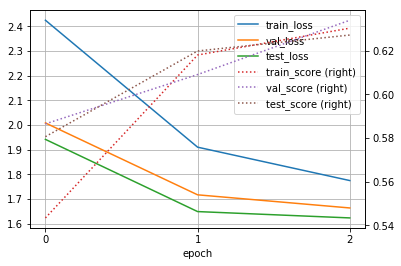

[NAME: NMAE0_3, EPOCH: 3]
> Train...
> Validation...
주야              0.547368
요일              0.124031
사망자수            0.911764
사상자수            0.737031
중상자수            0.813494
경상자수            0.838770
부상신고자수          0.978441
발생지시도           0.173010
발생지시군구          0.020478
사고유형_대분류        0.932660
사고유형_중분류        0.455446
법규위반            0.730000
도로형태_대분류        0.908088
도로형태            0.767790
당사자종별_1당_대분류    0.397112
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.120000
사망자수            0.949304
사상자수            0.748536
중상자수            0.795199
경상자수            0.821827
부상신고자수          0.974482
발생지시도           0.188119
발생지시군구          0.020000
사고유형_대분류        0.961240
사고유형_중분류        0.455172
법규위반            0.710884
도로형태_대분류        0.913793
도로형태            0.784672
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.678322
Name: score, dtype: float64
[train] loss: 1.693 num_loss: 0.3802 cat_loss: 1.312
score: 0.6376 num_score: 0.8

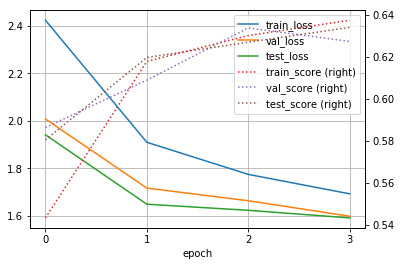

[NAME: NMAE0_3, EPOCH: 4]
> Train...
> Validation...
주야              0.578947
요일              0.124031
사망자수            0.926898
사상자수            0.702938
중상자수            0.800926
경상자수            0.857280
부상신고자수          0.978441
발생지시도           0.128028
발생지시군구          0.006826
사고유형_대분류        0.949495
사고유형_중분류        0.468647
법규위반            0.743333
도로형태_대분류        0.893382
도로형태            0.767790
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.674342
Name: score, dtype: float64
> Test...
주야              0.550523
요일              0.123333
사망자수            0.941144
사상자수            0.776315
중상자수            0.828886
경상자수            0.830224
부상신고자수          0.974482
발생지시도           0.135314
발생지시군구          0.032000
사고유형_대분류        0.968992
사고유형_중분류        0.451724
법규위반            0.710884
도로형태_대분류        0.879310
도로형태            0.744526
당사자종별_1당_대분류    0.450172
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.553 num_loss: 0.279 cat_loss: 1.274
score: 0.6386 num_score: 0.87

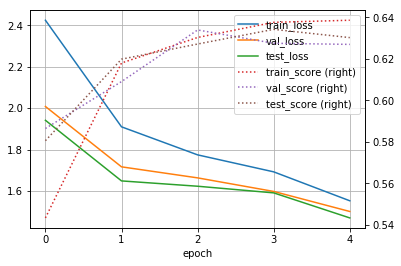

[NAME: NMAE0_3, EPOCH: 5]
> Train...
> Validation...
주야              0.571930
요일              0.124031
사망자수            0.941499
사상자수            0.785973
중상자수            0.827487
경상자수            0.860158
부상신고자수          0.978441
발생지시도           0.134948
발생지시군구          0.030717
사고유형_대분류        0.946128
사고유형_중분류        0.455446
법규위반            0.746667
도로형태_대분류        0.863971
도로형태            0.730337
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.578397
요일              0.123333
사망자수            0.960409
사상자수            0.776840
중상자수            0.823680
경상자수            0.831414
부상신고자수          0.974482
발생지시도           0.122112
발생지시군구          0.020000
사고유형_대분류        0.953488
사고유형_중분류        0.458621
법규위반            0.707483
도로형태_대분류        0.886207
도로형태            0.700730
당사자종별_1당_대분류    0.477663
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.607 num_loss: 0.3769 cat_loss: 1.231
score: 0.6399 num_score: 0.8

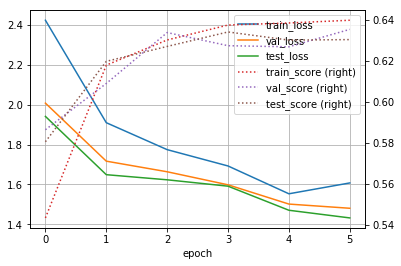

[NAME: NMAE0_3, EPOCH: 6]
> Train...
> Validation...
주야              0.603509
요일              0.124031
사망자수            0.922598
사상자수            0.772969
중상자수            0.798356
경상자수            0.847081
부상신고자수          0.978441
발생지시도           0.100346
발생지시군구          0.034130
사고유형_대분류        0.942761
사고유형_중분류        0.468647
법규위반            0.753333
도로형태_대분류        0.908088
도로형태            0.771536
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.123333
사망자수            0.963424
사상자수            0.794108
중상자수            0.812290
경상자수            0.850788
부상신고자수          0.974482
발생지시도           0.135314
발생지시군구          0.020000
사고유형_대분류        0.968992
사고유형_중분류        0.475862
법규위반            0.734694
도로형태_대분류        0.903448
도로형태            0.733577
당사자종별_1당_대분류    0.419244
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.567 num_loss: 0.3693 cat_loss: 1.198
score: 0.6402 num_score: 0.8

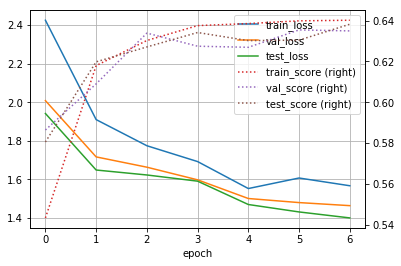

[NAME: NMAE0_3, EPOCH: 7]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.951138
사상자수            0.777149
중상자수            0.804643
경상자수            0.861083
부상신고자수          0.978441
발생지시도           0.079585
발생지시군구          0.037543
사고유형_대분류        0.966330
사고유형_중분류        0.415842
법규위반            0.756667
도로형태_대분류        0.915441
도로형태            0.801498
당사자종별_1당_대분류    0.425993
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.123333
사망자수            0.960106
사상자수            0.744143
중상자수            0.836419
경상자수            0.848939
부상신고자수          0.974482
발생지시도           0.125413
발생지시군구          0.040000
사고유형_대분류        0.957364
사고유형_중분류        0.462069
법규위반            0.731293
도로형태_대분류        0.910345
도로형태            0.759124
당사자종별_1당_대분류    0.422680
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.54 num_loss: 0.3666 cat_loss: 1.174
score: 0.6389 num_score: 0.86

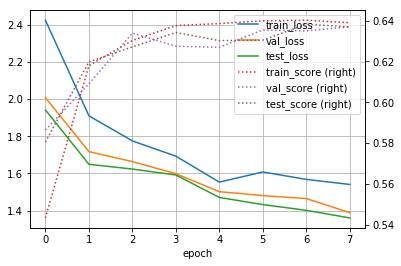

[NAME: NMAE0_3, EPOCH: 8]
> Train...
> Validation...
주야              0.554386
요일              0.124031
사망자수            0.925542
사상자수            0.775973
중상자수            0.812556
경상자수            0.866002
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.058020
사고유형_대분류        0.959596
사고유형_중분류        0.392739
법규위반            0.746667
도로형태_대분류        0.915441
도로형태            0.779026
당사자종별_1당_대분류    0.465704
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.606272
요일              0.123333
사망자수            0.959750
사상자수            0.818286
중상자수            0.820791
경상자수            0.840969
부상신고자수          0.974482
발생지시도           0.085809
발생지시군구          0.044000
사고유형_대분류        0.968992
사고유형_중분류        0.417241
법규위반            0.693878
도로형태_대분류        0.917241
도로형태            0.744526
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.478 num_loss: 0.327 cat_loss: 1.151
score: 0.639 num_score: 0.872

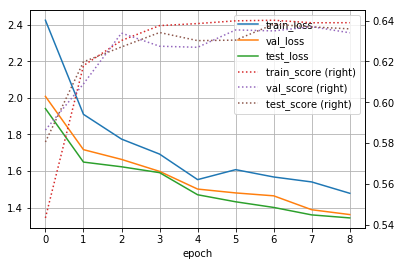

[NAME: NMAE0_3, EPOCH: 9]
> Train...
> Validation...
주야              0.600000
요일              0.124031
사망자수            0.935463
사상자수            0.805498
중상자수            0.824432
경상자수            0.834108
부상신고자수          0.978441
발생지시도           0.083045
발생지시군구          0.051195
사고유형_대분류        0.966330
사고유형_중분류        0.402640
법규위반            0.760000
도로형태_대분류        0.922794
도로형태            0.779026
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.641115
요일              0.123333
사망자수            0.957669
사상자수            0.797036
중상자수            0.820916
경상자수            0.843428
부상신고자수          0.974482
발생지시도           0.079208
발생지시군구          0.052000
사고유형_대분류        0.984496
사고유형_중분류        0.472414
법규위반            0.717687
도로형태_대분류        0.927586
도로형태            0.759124
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.476 num_loss: 0.3424 cat_loss: 1.134
score: 0.6394 num_score: 0.8

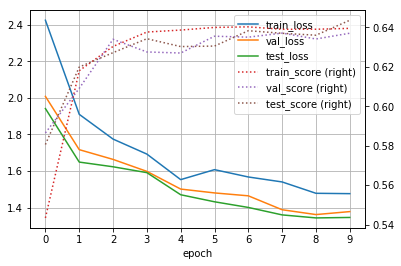

[NAME: NMAE0_3, EPOCH: 10]
> Train...
> Validation...
주야              0.617544
요일              0.124031
사망자수            0.948628
사상자수            0.789032
중상자수            0.825143
경상자수            0.861373
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.044369
사고유형_대분류        0.969697
사고유형_중분류        0.415842
법규위반            0.726667
도로형태_대분류        0.926471
도로형태            0.790262
당사자종별_1당_대분류    0.476534
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.123333
사망자수            0.955730
사상자수            0.800721
중상자수            0.826577
경상자수            0.835885
부상신고자수          0.974482
발생지시도           0.122112
발생지시군구          0.052000
사고유형_대분류        0.965116
사고유형_중분류        0.424138
법규위반            0.738095
도로형태_대분류        0.906897
도로형태            0.777372
당사자종별_1당_대분류    0.419244
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.505 num_loss: 0.3831 cat_loss: 1.122
score: 0.6419 num_score: 0.

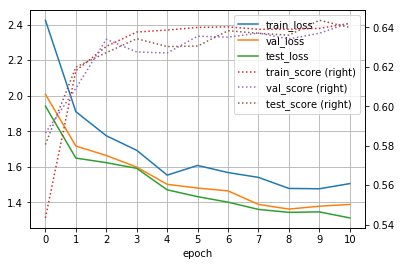

[NAME: NMAE0_3, EPOCH: 11]
> Train...
> Validation...
주야              0.624561
요일              0.124031
사망자수            0.932167
사상자수            0.782900
중상자수            0.805501
경상자수            0.858355
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.058020
사고유형_대분류        0.976431
사고유형_중분류        0.452145
법규위반            0.776667
도로형태_대분류        0.922794
도로형태            0.775281
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.730263
Name: score, dtype: float64
> Test...
주야              0.655052
요일              0.123333
사망자수            0.956656
사상자수            0.788883
중상자수            0.834967
경상자수            0.825130
부상신고자수          0.974482
발생지시도           0.102310
발생지시군구          0.040000
사고유형_대분류        0.980620
사고유형_중분류        0.486207
법규위반            0.727891
도로형태_대분류        0.910345
도로형태            0.770073
당사자종별_1당_대분류    0.432990
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.456 num_loss: 0.3452 cat_loss: 1.111
score: 0.6406 num_score: 0.

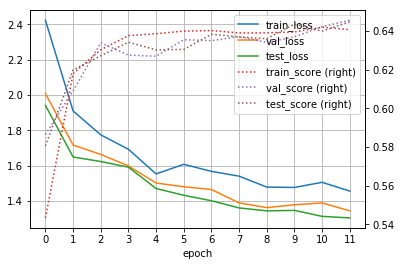

[NAME: NMAE0_3, EPOCH: 12]
> Train...
> Validation...
주야              0.603509
요일              0.124031
사망자수            0.942883
사상자수            0.793098
중상자수            0.837356
경상자수            0.847831
부상신고자수          0.978441
발생지시도           0.083045
발생지시군구          0.071672
사고유형_대분류        0.973064
사고유형_중분류        0.455446
법규위반            0.770000
도로형태_대분류        0.926471
도로형태            0.790262
당사자종별_1당_대분류    0.433213
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.606272
요일              0.123333
사망자수            0.960522
사상자수            0.793046
중상자수            0.840780
경상자수            0.856356
부상신고자수          0.974482
발생지시도           0.062706
발생지시군구          0.064000
사고유형_대분류        0.980620
사고유형_중분류        0.462069
법규위반            0.717687
도로형태_대분류        0.924138
도로형태            0.773723
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.465 num_loss: 0.3655 cat_loss: 1.099
score: 0.6396 num_score: 0.

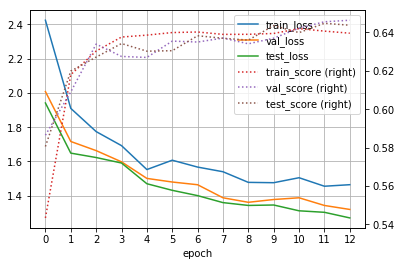

[NAME: NMAE0_3, EPOCH: 13]
> Train...
> Validation...
주야              0.638596
요일              0.124031
사망자수            0.946988
사상자수            0.785433
중상자수            0.813822
경상자수            0.861486
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.071672
사고유형_대분류        0.973064
사고유형_중분류        0.435644
법규위반            0.763333
도로형태_대분류        0.930147
도로형태            0.756554
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.595819
요일              0.126667
사망자수            0.960939
사상자수            0.823572
중상자수            0.832912
경상자수            0.838746
부상신고자수          0.974482
발생지시도           0.085809
발생지시군구          0.044000
사고유형_대분류        0.984496
사고유형_중분류        0.486207
법규위반            0.724490
도로형태_대분류        0.906897
도로형태            0.733577
당사자종별_1당_대분류    0.436426
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.426 num_loss: 0.3386 cat_loss: 1.087
score: 0.6425 num_score: 0.

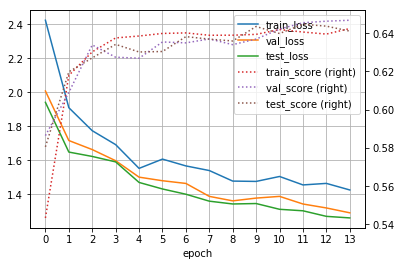

[NAME: NMAE0_3, EPOCH: 14]
> Train...
> Validation...
주야              0.571930
요일              0.124031
사망자수            0.948485
사상자수            0.794714
중상자수            0.835786
경상자수            0.873635
부상신고자수          0.978441
발생지시도           0.062284
발생지시군구          0.064846
사고유형_대분류        0.973064
사고유형_중분류        0.435644
법규위반            0.746667
도로형태_대분류        0.922794
도로형태            0.752809
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.684211
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.123333
사망자수            0.962919
사상자수            0.816214
중상자수            0.848794
경상자수            0.857068
부상신고자수          0.974482
발생지시도           0.072607
발생지시군구          0.048000
사고유형_대분류        0.980620
사고유형_중분류        0.444828
법규위반            0.697279
도로형태_대분류        0.917241
도로형태            0.777372
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.398 num_loss: 0.3189 cat_loss: 1.079
score: 0.6423 num_score: 0.

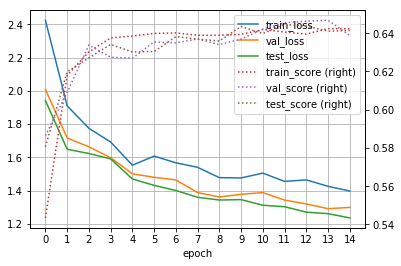

[NAME: NMAE0_3, EPOCH: 15]
> Train...
> Validation...
주야              0.624561
요일              0.127907
사망자수            0.945548
사상자수            0.793583
중상자수            0.808106
경상자수            0.842489
부상신고자수          0.978426
발생지시도           0.076125
발생지시군구          0.061433
사고유형_대분류        0.962963
사고유형_중분류        0.445545
법규위반            0.746667
도로형태_대분류        0.908088
도로형태            0.756554
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.634146
요일              0.120000
사망자수            0.968140
사상자수            0.801389
중상자수            0.837014
경상자수            0.852061
부상신고자수          0.974482
발생지시도           0.105611
발생지시군구          0.068000
사고유형_대분류        0.976744
사고유형_중분류        0.427586
법규위반            0.755102
도로형태_대분류        0.937931
도로형태            0.759124
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.361 num_loss: 0.2913 cat_loss: 1.07
score: 0.6436 num_score: 0.8

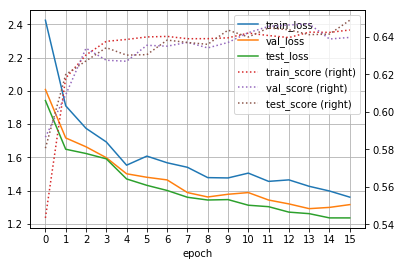

[NAME: NMAE0_3, EPOCH: 16]
> Train...
> Validation...
주야              0.603509
요일              0.120155
사망자수            0.936354
사상자수            0.797455
중상자수            0.821761
경상자수            0.846395
부상신고자수          0.978441
발생지시도           0.093426
발생지시군구          0.068259
사고유형_대분류        0.973064
사고유형_중분류        0.422442
법규위반            0.770000
도로형태_대분류        0.919118
도로형태            0.764045
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.641115
요일              0.123333
사망자수            0.965017
사상자수            0.778296
중상자수            0.814504
경상자수            0.831870
부상신고자수          0.974482
발생지시도           0.118812
발생지시군구          0.060000
사고유형_대분류        0.980620
사고유형_중분류        0.482759
법규위반            0.741497
도로형태_대분류        0.931034
도로형태            0.773723
당사자종별_1당_대분류    0.412371
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.327 num_loss: 0.2649 cat_loss: 1.063
score: 0.645 num_score: 0.8

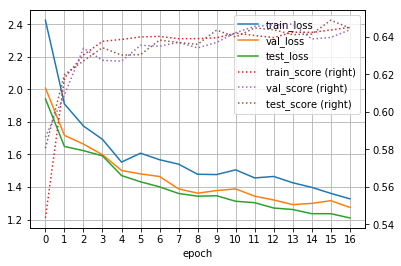

[NAME: NMAE0_3, EPOCH: 17]
> Train...
> Validation...
주야              0.621053
요일              0.124031
사망자수            0.949081
사상자수            0.790208
중상자수            0.841823
경상자수            0.884361
부상신고자수          0.978441
발생지시도           0.069204
발생지시군구          0.081911
사고유형_대분류        0.973064
사고유형_중분류        0.396040
법규위반            0.723333
도로형태_대분류        0.922794
도로형태            0.794007
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.609756
요일              0.126667
사망자수            0.963042
사상자수            0.753965
중상자수            0.842339
경상자수            0.852545
부상신고자수          0.974482
발생지시도           0.082508
발생지시군구          0.076000
사고유형_대분류        0.980620
사고유형_중분류        0.462069
법규위반            0.727891
도로형태_대분류        0.917241
도로형태            0.766423
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.489 num_loss: 0.4337 cat_loss: 1.055
score: 0.6438 num_score: 0.

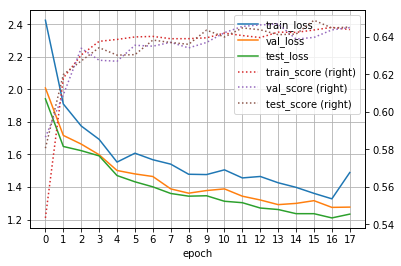

[NAME: NMAE0_3, EPOCH: 18]
> Train...
> Validation...
주야              0.585965
요일              0.124031
사망자수            0.950368
사상자수            0.802887
중상자수            0.846263
경상자수            0.856412
부상신고자수          0.978441
발생지시도           0.089965
발생지시군구          0.071672
사고유형_대분류        0.979798
사고유형_중분류        0.402640
법규위반            0.753333
도로형태_대분류        0.930147
도로형태            0.752809
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.599303
요일              0.123333
사망자수            0.968802
사상자수            0.804628
중상자수            0.849886
경상자수            0.847777
부상신고자수          0.974482
발생지시도           0.079208
발생지시군구          0.084000
사고유형_대분류        0.984496
사고유형_중분류        0.410345
법규위반            0.717687
도로형태_대분류        0.917241
도로형태            0.762774
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.382 num_loss: 0.3315 cat_loss: 1.05
score: 0.6452 num_score: 0.8

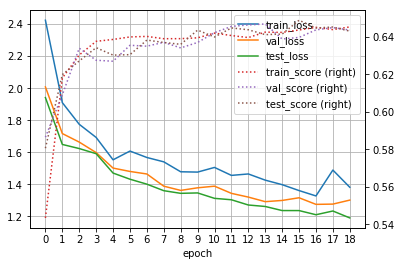

[NAME: NMAE0_3, EPOCH: 19]
> Train...
> Validation...
주야              0.589474
요일              0.124031
사망자수            0.941792
사상자수            0.795314
중상자수            0.826698
경상자수            0.876290
부상신고자수          0.978441
발생지시도           0.065744
발생지시군구          0.085324
사고유형_대분류        0.969697
사고유형_중분류        0.475248
법규위반            0.763333
도로형태_대분류        0.930147
도로형태            0.812734
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.684211
Name: score, dtype: float64
> Test...
주야              0.634146
요일              0.123333
사망자수            0.962361
사상자수            0.828997
중상자수            0.842556
경상자수            0.845502
부상신고자수          0.974482
발생지시도           0.082508
발생지시군구          0.056000
사고유형_대분류        0.980620
사고유형_중분류        0.444828
법규위반            0.727891
도로형태_대분류        0.913793
도로형태            0.784672
당사자종별_1당_대분류    0.508591
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.404 num_loss: 0.3551 cat_loss: 1.049
score: 0.6442 num_score: 0.

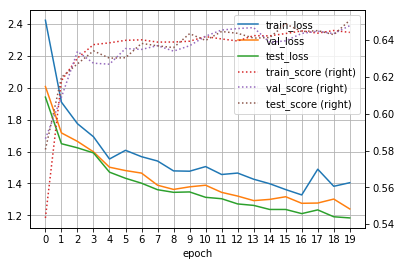

[NAME: NMAE0_3, EPOCH: 20]
> Train...
> Validation...
주야              0.635088
요일              0.124031
사망자수            0.950803
사상자수            0.799760
중상자수            0.828893
경상자수            0.870670
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.081911
사고유형_대분류        0.976431
사고유형_중분류        0.452145
법규위반            0.753333
도로형태_대분류        0.926471
도로형태            0.779026
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.641115
요일              0.123333
사망자수            0.964386
사상자수            0.795658
중상자수            0.825551
경상자수            0.848204
부상신고자수          0.974482
발생지시도           0.079208
발생지시군구          0.060000
사고유형_대분류        0.984496
사고유형_중분류        0.455172
법규위반            0.731293
도로형태_대분류        0.941379
도로형태            0.773723
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.388 num_loss: 0.3408 cat_loss: 1.047
score: 0.645 num_score: 0.8

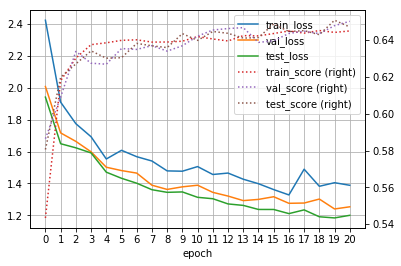

[NAME: NMAE0_3, EPOCH: 21]
> Train...
> Validation...
주야              0.631579
요일              0.124031
사망자수            0.954763
사상자수            0.815161
중상자수            0.834187
경상자수            0.862977
부상신고자수          0.978441
발생지시도           0.072664
발생지시군구          0.058020
사고유형_대분류        0.973064
사고유형_중분류        0.465347
법규위반            0.746667
도로형태_대분류        0.911765
도로형태            0.797753
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.671053
Name: score, dtype: float64
> Test...
주야              0.571429
요일              0.123333
사망자수            0.968087
사상자수            0.800236
중상자수            0.834546
경상자수            0.847896
부상신고자수          0.974482
발생지시도           0.069307
발생지시군구          0.088000
사고유형_대분류        0.976744
사고유형_중분류        0.462069
법규위반            0.751701
도로형태_대분류        0.920690
도로형태            0.770073
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.428 num_loss: 0.3857 cat_loss: 1.042
score: 0.6465 num_score: 0.

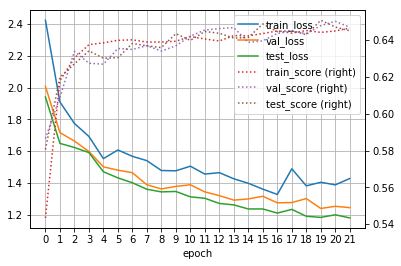

[NAME: NMAE0_3, EPOCH: 22]
> Train...
> Validation...
주야              0.617544
요일              0.124031
사망자수            0.953228
사상자수            0.798527
중상자수            0.813771
경상자수            0.856941
부상신고자수          0.978441
발생지시도           0.114187
발생지시군구          0.095563
사고유형_대분류        0.973064
사고유형_중분류        0.432343
법규위반            0.753333
도로형태_대분류        0.930147
도로형태            0.782772
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.599303
요일              0.123333
사망자수            0.968497
사상자수            0.810454
중상자수            0.846398
경상자수            0.846889
부상신고자수          0.974482
발생지시도           0.072607
발생지시군구          0.092000
사고유형_대분류        0.980620
사고유형_중분류        0.458621
법규위반            0.724490
도로형태_대분류        0.913793
도로형태            0.740876
당사자종별_1당_대분류    0.491409
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.308 num_loss: 0.2683 cat_loss: 1.04
score: 0.6465 num_score: 0.8

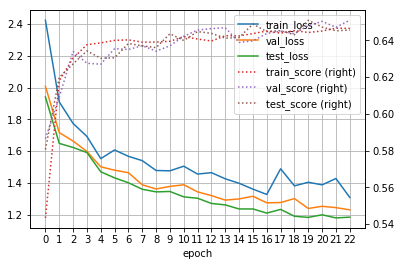

[NAME: NMAE0_3, EPOCH: 23]
> Train...
> Validation...
주야              0.610526
요일              0.124031
사망자수            0.949662
사상자수            0.785723
중상자수            0.827113
경상자수            0.850685
부상신고자수          0.978441
발생지시도           0.079585
발생지시군구          0.068259
사고유형_대분류        0.979798
사고유형_중분류        0.462046
법규위반            0.746667
도로형태_대분류        0.941176
도로형태            0.805243
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.609756
요일              0.123333
사망자수            0.970308
사상자수            0.819184
중상자수            0.845700
경상자수            0.850968
부상신고자수          0.974482
발생지시도           0.042904
발생지시군구          0.080000
사고유형_대분류        0.984496
사고유형_중분류        0.431034
법규위반            0.738095
도로형태_대분류        0.917241
도로형태            0.773723
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.327 num_loss: 0.2929 cat_loss: 1.034
score: 0.6492 num_score: 0.

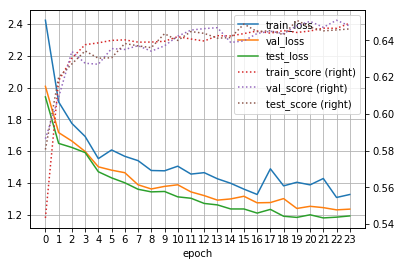

[NAME: NMAE0_3, EPOCH: 24]
> Train...
> Validation...
주야              0.624561
요일              0.124031
사망자수            0.942497
사상자수            0.802023
중상자수            0.812176
경상자수            0.858137
부상신고자수          0.978441
발생지시도           0.055363
발생지시군구          0.081911
사고유형_대분류        0.969697
사고유형_중분류        0.475248
법규위반            0.750000
도로형태_대분류        0.930147
도로형태            0.779026
당사자종별_1당_대분류    0.422383
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.609756
요일              0.123333
사망자수            0.962528
사상자수            0.814595
중상자수            0.850176
경상자수            0.851761
부상신고자수          0.974482
발생지시도           0.092409
발생지시군구          0.076000
사고유형_대분류        0.988372
사고유형_중분류        0.462069
법규위반            0.741497
도로형태_대분류        0.941379
도로형태            0.766423
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.365 num_loss: 0.3334 cat_loss: 1.032
score: 0.6473 num_score: 0.

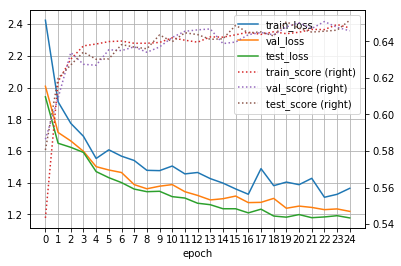

[NAME: NMAE0_3, EPOCH: 25]
> Train...
> Validation...
주야              0.638596
요일              0.124031
사망자수            0.951518
사상자수            0.825973
중상자수            0.839041
경상자수            0.868655
부상신고자수          0.978441
발생지시도           0.093426
발생지시군구          0.075085
사고유형_대분류        0.976431
사고유형_중분류        0.478548
법규위반            0.766667
도로형태_대분류        0.937500
도로형태            0.786517
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.613240
요일              0.123333
사망자수            0.968498
사상자수            0.819781
중상자수            0.846271
경상자수            0.857775
부상신고자수          0.974482
발생지시도           0.069307
발생지시군구          0.080000
사고유형_대분류        0.984496
사고유형_중분류        0.424138
법규위반            0.761905
도로형태_대분류        0.941379
도로형태            0.766423
당사자종별_1당_대분류    0.477663
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.315 num_loss: 0.2824 cat_loss: 1.033
score: 0.649 num_score: 0.8

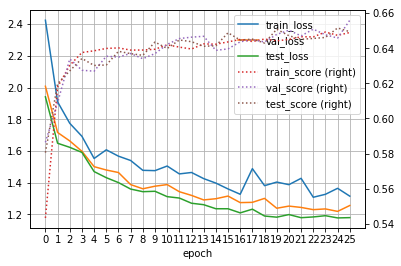

[NAME: NMAE0_3, EPOCH: 26]
> Train...
> Validation...
주야              0.659649
요일              0.124031
사망자수            0.953635
사상자수            0.808286
중상자수            0.819774
경상자수            0.842632
부상신고자수          0.978441
발생지시도           0.093426
발생지시군구          0.071672
사고유형_대분류        0.983165
사고유형_중분류        0.475248
법규위반            0.743333
도로형태_대분류        0.900735
도로형태            0.734082
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.578397
요일              0.123333
사망자수            0.969634
사상자수            0.817866
중상자수            0.826152
경상자수            0.847425
부상신고자수          0.974482
발생지시도           0.066007
발생지시군구          0.072000
사고유형_대분류        0.984496
사고유형_중분류        0.444828
법규위반            0.731293
도로형태_대분류        0.889655
도로형태            0.744526
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.429 num_loss: 0.3991 cat_loss: 1.029
score: 0.6467 num_score: 0.

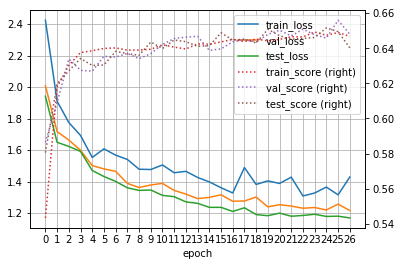

[NAME: NMAE0_3, EPOCH: 27]
> Train...
> Validation...
주야              0.596491
요일              0.124031
사망자수            0.948579
사상자수            0.822164
중상자수            0.831270
경상자수            0.854446
부상신고자수          0.978441
발생지시도           0.093426
발생지시군구          0.102389
사고유형_대분류        0.976431
사고유형_중분류        0.438944
법규위반            0.753333
도로형태_대분류        0.922794
도로형태            0.767790
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.730263
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.123333
사망자수            0.970504
사상자수            0.809658
중상자수            0.842572
경상자수            0.851190
부상신고자수          0.974482
발생지시도           0.082508
발생지시군구          0.060000
사고유형_대분류        0.980620
사고유형_중분류        0.451724
법규위반            0.717687
도로형태_대분류        0.913793
도로형태            0.781022
당사자종별_1당_대분류    0.436426
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.386 num_loss: 0.3583 cat_loss: 1.028
score: 0.6466 num_score: 0.

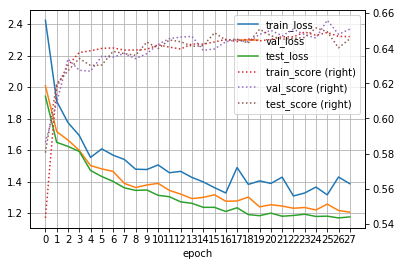

[NAME: NMAE0_3, EPOCH: 28]
> Train...
> Validation...
주야              0.635088
요일              0.124031
사망자수            0.943609
사상자수            0.812354
중상자수            0.826371
경상자수            0.877115
부상신고자수          0.978441
발생지시도           0.083045
발생지시군구          0.075085
사고유형_대분류        0.973064
사고유형_중분류        0.475248
법규위반            0.746667
도로형태_대분류        0.930147
도로형태            0.779026
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.595819
요일              0.123333
사망자수            0.967863
사상자수            0.820307
중상자수            0.851300
경상자수            0.857139
부상신고자수          0.974482
발생지시도           0.075908
발생지시군구          0.084000
사고유형_대분류        0.976744
사고유형_중분류        0.448276
법규위반            0.748299
도로형태_대분류        0.931034
도로형태            0.791971
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.295 num_loss: 0.2703 cat_loss: 1.025
score: 0.651 num_score: 0.8

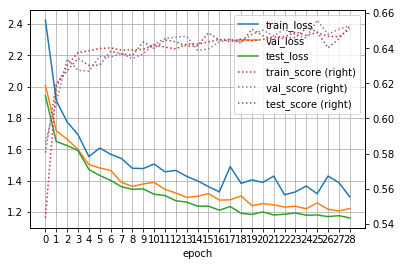

[NAME: NMAE0_3, EPOCH: 29]
> Train...
> Validation...
주야              0.659649
요일              0.124031
사망자수            0.944291
사상자수            0.802379
중상자수            0.814751
경상자수            0.850606
부상신고자수          0.978441
발생지시도           0.058824
발생지시군구          0.088737
사고유형_대분류        0.973064
사고유형_중분류        0.478548
법규위반            0.773333
도로형태_대분류        0.933824
도로형태            0.794007
당사자종별_1당_대분류    0.418773
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.123333
사망자수            0.967707
사상자수            0.820397
중상자수            0.853526
경상자수            0.839636
부상신고자수          0.974482
발생지시도           0.075908
발생지시군구          0.080000
사고유형_대분류        0.976744
사고유형_중분류        0.468966
법규위반            0.731293
도로형태_대분류        0.931034
도로형태            0.762774
당사자종별_1당_대분류    0.477663
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.405 num_loss: 0.3809 cat_loss: 1.024
score: 0.6514 num_score: 0.

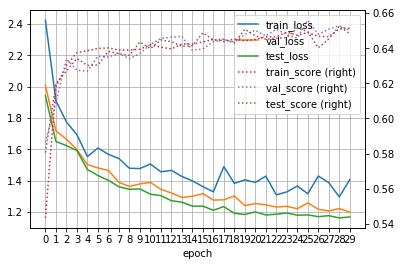

[NAME: NMAE0_4, EPOCH: 0]
> Train...
> Validation...
주야              0.480702
요일              0.124031
사망자수            0.917785
사상자수            0.679624
중상자수            0.804434
경상자수            0.815110
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.013652
사고유형_대분류        0.589226
사고유형_중분류        0.316832
법규위반            0.723333
도로형태_대분류        0.709559
도로형태            0.629213
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.467105
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.126667
사망자수            0.950623
사상자수            0.650840
중상자수            0.784313
경상자수            0.799208
부상신고자수          0.974477
발생지시도           0.198020
발생지시군구          0.012000
사고유형_대분류        0.562016
사고유형_중분류        0.331034
법규위반            0.704082
도로형태_대분류        0.693103
도로형태            0.554745
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.496503
Name: score, dtype: float64
[train] loss: 2.628 num_loss: 0.6864 cat_loss: 1.942
score: 0.5305 num_score: 0.8

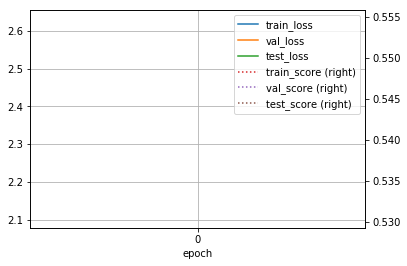

[NAME: NMAE0_4, EPOCH: 1]
> Train...
> Validation...
주야              0.480702
요일              0.124031
사망자수            0.920923
사상자수            0.669809
중상자수            0.813237
경상자수            0.838751
부상신고자수          0.978384
발생지시도           0.162630
발생지시군구          0.017065
사고유형_대분류        0.851852
사고유형_중분류        0.379538
법규위반            0.730000
도로형태_대분류        0.772059
도로형태            0.760300
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.654605
Name: score, dtype: float64
> Test...
주야              0.543554
요일              0.123333
사망자수            0.939298
사상자수            0.743872
중상자수            0.816641
경상자수            0.812771
부상신고자수          0.974458
발생지시도           0.194719
발생지시군구          0.016000
사고유형_대분류        0.926357
사고유형_중분류        0.386207
법규위반            0.697279
도로형태_대분류        0.820690
도로형태            0.744526
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 2.059 num_loss: 0.4049 cat_loss: 1.655
score: 0.5898 num_score: 0.8

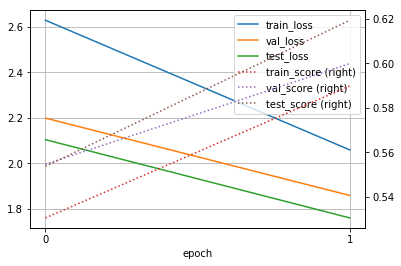

[NAME: NMAE0_4, EPOCH: 2]
> Train...
> Validation...
주야              0.589474
요일              0.124031
사망자수            0.910693
사상자수            0.697066
중상자수            0.803733
경상자수            0.846774
부상신고자수          0.978441
발생지시도           0.179931
발생지시군구          0.006826
사고유형_대분류        0.919192
사고유형_중분류        0.392739
법규위반            0.720000
도로형태_대분류        0.856618
도로형태            0.786517
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.684211
Name: score, dtype: float64
> Test...
주야              0.578397
요일              0.123333
사망자수            0.947212
사상자수            0.765884
중상자수            0.807122
경상자수            0.843718
부상신고자수          0.974482
발생지시도           0.198020
발생지시군구          0.016000
사고유형_대분류        0.961240
사고유형_중분류        0.382759
법규위반            0.690476
도로형태_대분류        0.865517
도로형태            0.759124
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.678322
Name: score, dtype: float64
[train] loss: 1.91 num_loss: 0.406 cat_loss: 1.504
score: 0.6269 num_score: 0.859

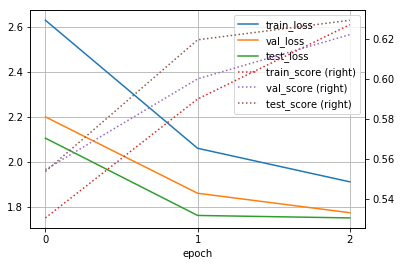

[NAME: NMAE0_4, EPOCH: 3]
> Train...
> Validation...
주야              0.617544
요일              0.124031
사망자수            0.935291
사상자수            0.763341
중상자수            0.813693
경상자수            0.869010
부상신고자수          0.978441
발생지시도           0.183391
발생지시군구          0.017065
사고유형_대분류        0.929293
사고유형_중분류        0.432343
법규위반            0.703333
도로형태_대분류        0.867647
도로형태            0.752809
당사자종별_1당_대분류    0.465704
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.123333
사망자수            0.962549
사상자수            0.720981
중상자수            0.815918
경상자수            0.847481
부상신고자수          0.974482
발생지시도           0.194719
발생지시군구          0.020000
사고유형_대분류        0.945736
사고유형_중분류        0.434483
법규위반            0.697279
도로형태_대분류        0.879310
도로형태            0.748175
당사자종별_1당_대분류    0.422680
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.789 num_loss: 0.3591 cat_loss: 1.43
score: 0.6345 num_score: 0.86

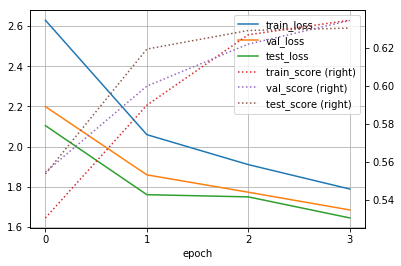

[NAME: NMAE0_4, EPOCH: 4]
> Train...
> Validation...
주야              0.621053
요일              0.124031
사망자수            0.918373
사상자수            0.725836
중상자수            0.789729
경상자수            0.847609
부상신고자수          0.978441
발생지시도           0.162630
발생지시군구          0.027304
사고유형_대분류        0.936027
사고유형_중분류        0.412541
법규위반            0.753333
도로형태_대분류        0.897059
도로형태            0.756554
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.123333
사망자수            0.952094
사상자수            0.802916
중상자수            0.822558
경상자수            0.829495
부상신고자수          0.974482
발생지시도           0.184818
발생지시군구          0.028000
사고유형_대분류        0.972868
사고유형_중분류        0.420690
법규위반            0.707483
도로형태_대분류        0.882759
도로형태            0.748175
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.815 num_loss: 0.4293 cat_loss: 1.386
score: 0.6365 num_score: 0.8

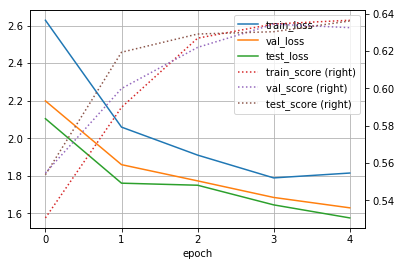

[NAME: NMAE0_4, EPOCH: 5]
> Train...
> Validation...
주야              0.589474
요일              0.124031
사망자수            0.937186
사상자수            0.811317
중상자수            0.798282
경상자수            0.842825
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.020478
사고유형_대분류        0.962963
사고유형_중분류        0.412541
법규위반            0.733333
도로형태_대분류        0.889706
도로형태            0.760300
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.651568
요일              0.123333
사망자수            0.966903
사상자수            0.775043
중상자수            0.823247
경상자수            0.837643
부상신고자수          0.974482
발생지시도           0.184818
발생지시군구          0.020000
사고유형_대분류        0.961240
사고유형_중분류        0.444828
법규위반            0.724490
도로형태_대분류        0.900000
도로형태            0.740876
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.723 num_loss: 0.3785 cat_loss: 1.345
score: 0.6384 num_score: 0.8

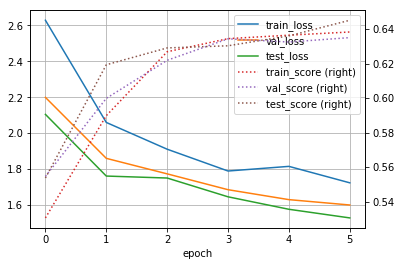

[NAME: NMAE0_4, EPOCH: 6]
> Train...
> Validation...
주야              0.585965
요일              0.124031
사망자수            0.914574
사상자수            0.781763
중상자수            0.810987
경상자수            0.872494
부상신고자수          0.978441
발생지시도           0.179931
발생지시군구          0.020478
사고유형_대분류        0.959596
사고유형_중분류        0.412541
법규위반            0.763333
도로형태_대분류        0.915441
도로형태            0.782772
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.123333
사망자수            0.959115
사상자수            0.779380
중상자수            0.792883
경상자수            0.849277
부상신고자수          0.974482
발생지시도           0.188119
발생지시군구          0.016000
사고유형_대분류        0.968992
사고유형_중분류        0.444828
법규위반            0.721088
도로형태_대분류        0.889655
도로형태            0.722628
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.776 num_loss: 0.4527 cat_loss: 1.324
score: 0.6415 num_score: 0.8

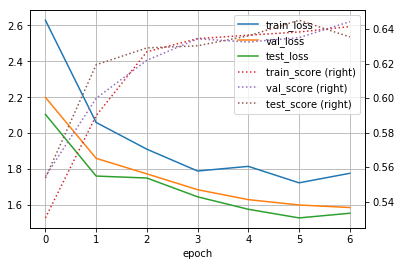

[NAME: NMAE0_4, EPOCH: 7]
> Train...
> Validation...
주야              0.557895
요일              0.124031
사망자수            0.938607
사상자수            0.789802
중상자수            0.817834
경상자수            0.830631
부상신고자수          0.978441
발생지시도           0.176471
발생지시군구          0.027304
사고유형_대분류        0.966330
사고유형_중분류        0.422442
법규위반            0.753333
도로형태_대분류        0.911765
도로형태            0.749064
당사자종별_1당_대분류    0.465704
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.554007
요일              0.123333
사망자수            0.967222
사상자수            0.790732
중상자수            0.818406
경상자수            0.851781
부상신고자수          0.974482
발생지시도           0.191419
발생지시군구          0.016000
사고유형_대분류        0.972868
사고유형_중분류        0.417241
법규위반            0.738095
도로형태_대분류        0.896552
도로형태            0.766423
당사자종별_1당_대분류    0.470790
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.676 num_loss: 0.3666 cat_loss: 1.31
score: 0.643 num_score: 0.875

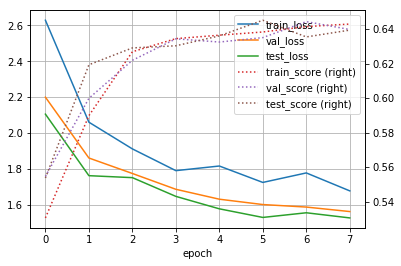

[NAME: NMAE0_4, EPOCH: 8]
> Train...
> Validation...
주야              0.582456
요일              0.124031
사망자수            0.949267
사상자수            0.795382
중상자수            0.818444
경상자수            0.854818
부상신고자수          0.978441
발생지시도           0.190311
발생지시군구          0.023891
사고유형_대분류        0.973064
사고유형_중분류        0.445545
법규위반            0.743333
도로형태_대분류        0.867647
도로형태            0.707865
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.609756
요일              0.123333
사망자수            0.963471
사상자수            0.794324
중상자수            0.811769
경상자수            0.847090
부상신고자수          0.974482
발생지시도           0.188119
발생지시군구          0.040000
사고유형_대분류        0.976744
사고유형_중분류        0.455172
법규위반            0.727891
도로형태_대분류        0.875862
도로형태            0.711679
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.642 num_loss: 0.3494 cat_loss: 1.292
score: 0.6445 num_score: 0.8

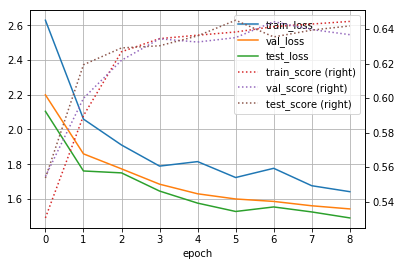

[NAME: NMAE0_4, EPOCH: 9]
> Train...
> Validation...
주야              0.617544
요일              0.124031
사망자수            0.934493
사상자수            0.780022
중상자수            0.815614
경상자수            0.854377
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.027304
사고유형_대분류        0.973064
사고유형_중분류        0.445545
법규위반            0.733333
도로형태_대분류        0.911765
도로형태            0.734082
당사자종별_1당_대분류    0.422383
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.578397
요일              0.123333
사망자수            0.959579
사상자수            0.804282
중상자수            0.822412
경상자수            0.847518
부상신고자수          0.974482
발생지시도           0.191419
발생지시군구          0.028000
사고유형_대분류        0.965116
사고유형_중분류        0.431034
법규위반            0.731293
도로형태_대분류        0.906897
도로형태            0.755474
당사자종별_1당_대분류    0.470790
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.696 num_loss: 0.4157 cat_loss: 1.28
score: 0.6423 num_score: 0.87

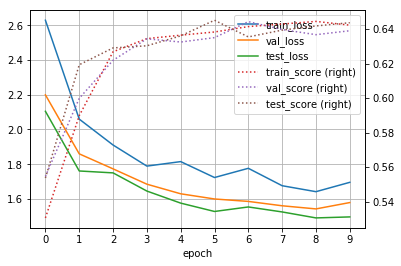

[NAME: NMAE0_4, EPOCH: 10]
> Train...
> Validation...
주야              0.600000
요일              0.124031
사망자수            0.954377
사상자수            0.809741
중상자수            0.820158
경상자수            0.861542
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.034130
사고유형_대분류        0.973064
사고유형_중분류        0.442244
법규위반            0.753333
도로형태_대분류        0.922794
도로형태            0.760300
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.599303
요일              0.123333
사망자수            0.963248
사상자수            0.779507
중상자수            0.804270
경상자수            0.842270
부상신고자수          0.974482
발생지시도           0.165017
발생지시군구          0.028000
사고유형_대분류        0.972868
사고유형_중분류        0.403448
법규위반            0.738095
도로형태_대분류        0.900000
도로형태            0.737226
당사자종별_1당_대분류    0.426117
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.607 num_loss: 0.3425 cat_loss: 1.265
score: 0.6438 num_score: 0.

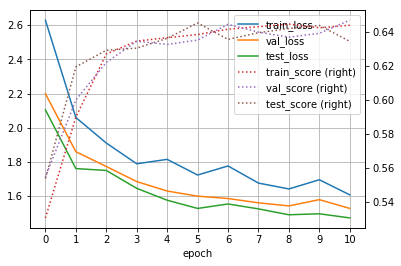

[NAME: NMAE0_4, EPOCH: 11]
> Train...
> Validation...
주야              0.645614
요일              0.124031
사망자수            0.929749
사상자수            0.795567
중상자수            0.820980
경상자수            0.840330
부상신고자수          0.978441
발생지시도           0.162630
발생지시군구          0.020478
사고유형_대분류        0.969697
사고유형_중분류        0.452145
법규위반            0.743333
도로형태_대분류        0.919118
도로형태            0.760300
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.581882
요일              0.123333
사망자수            0.955823
사상자수            0.790394
중상자수            0.807229
경상자수            0.835929
부상신고자수          0.974482
발생지시도           0.138614
발생지시군구          0.024000
사고유형_대분류        0.992248
사고유형_중분류        0.444828
법규위반            0.741497
도로형태_대분류        0.906897
도로형태            0.737226
당사자종별_1당_대분류    0.429553
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.605 num_loss: 0.3573 cat_loss: 1.248
score: 0.6448 num_score: 0.

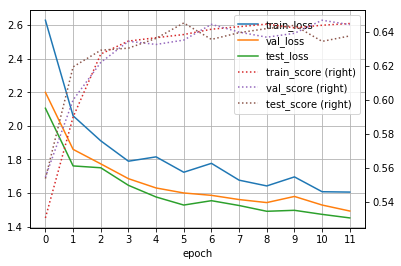

[NAME: NMAE0_4, EPOCH: 12]
> Train...
> Validation...
주야              0.575439
요일              0.124031
사망자수            0.951566
사상자수            0.806734
중상자수            0.833448
경상자수            0.861613
부상신고자수          0.978441
발생지시도           0.117647
발생지시군구          0.030717
사고유형_대분류        0.946128
사고유형_중분류        0.379538
법규위반            0.746667
도로형태_대분류        0.919118
도로형태            0.760300
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.644599
요일              0.123333
사망자수            0.967455
사상자수            0.777158
중상자수            0.805818
경상자수            0.844907
부상신고자수          0.974482
발생지시도           0.108911
발생지시군구          0.056000
사고유형_대분류        0.976744
사고유형_중분류        0.472414
법규위반            0.727891
도로형태_대분류        0.920690
도로형태            0.718978
당사자종별_1당_대분류    0.432990
당사자종별_2당_대분류    0.674825
Name: score, dtype: float64
[train] loss: 1.537 num_loss: 0.3125 cat_loss: 1.225
score: 0.6424 num_score: 0.

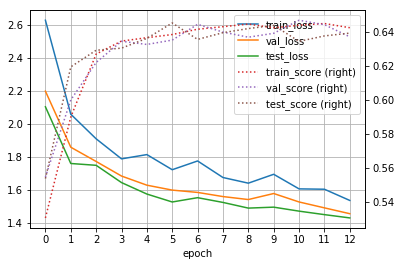

[NAME: NMAE0_4, EPOCH: 13]
> Train...
> Validation...
주야              0.589474
요일              0.124031
사망자수            0.939664
사상자수            0.790057
중상자수            0.823443
경상자수            0.850865
부상신고자수          0.978441
발생지시도           0.065744
발생지시군구          0.040956
사고유형_대분류        0.983165
사고유형_중분류        0.409241
법규위반            0.756667
도로형태_대분류        0.915441
도로형태            0.752809
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.560976
요일              0.123333
사망자수            0.965387
사상자수            0.820637
중상자수            0.843791
경상자수            0.848312
부상신고자수          0.974482
발생지시도           0.112211
발생지시군구          0.040000
사고유형_대분류        0.980620
사고유형_중분류        0.427586
법규위반            0.741497
도로형태_대분류        0.913793
도로형태            0.770073
당사자종별_1당_대분류    0.426117
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.478 num_loss: 0.2679 cat_loss: 1.21
score: 0.6449 num_score: 0.8

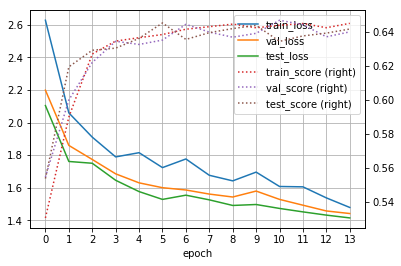

[NAME: NMAE0_4, EPOCH: 14]
> Train...
> Validation...
주야              0.578947
요일              0.124031
사망자수            0.948313
사상자수            0.803745
중상자수            0.790868
경상자수            0.840057
부상신고자수          0.978441
발생지시도           0.110727
발생지시군구          0.054608
사고유형_대분류        0.969697
사고유형_중분류        0.412541
법규위반            0.733333
도로형태_대분류        0.922794
도로형태            0.764045
당사자종별_1당_대분류    0.418773
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.560976
요일              0.123333
사망자수            0.969403
사상자수            0.811580
중상자수            0.806436
경상자수            0.845883
부상신고자수          0.974482
발생지시도           0.102310
발생지시군구          0.040000
사고유형_대분류        0.972868
사고유형_중분류        0.472414
법규위반            0.738095
도로형태_대분류        0.920690
도로형태            0.751825
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.575 num_loss: 0.3758 cat_loss: 1.199
score: 0.6431 num_score: 0.

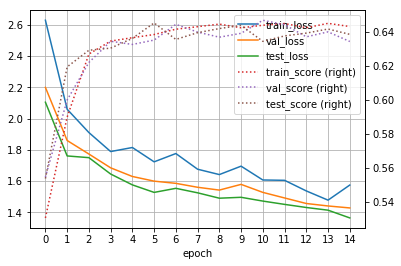

[NAME: NMAE0_4, EPOCH: 15]
> Train...
> Validation...
주야              0.635088
요일              0.124031
사망자수            0.939809
사상자수            0.776809
중상자수            0.825133
경상자수            0.846625
부상신고자수          0.978441
발생지시도           0.065744
발생지시군구          0.034130
사고유형_대분류        0.969697
사고유형_중분류        0.458746
법규위반            0.750000
도로형태_대분류        0.933824
도로형태            0.764045
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.644599
요일              0.123333
사망자수            0.968598
사상자수            0.812259
중상자수            0.831709
경상자수            0.839970
부상신고자수          0.974482
발생지시도           0.112211
발생지시군구          0.052000
사고유형_대분류        0.976744
사고유형_중분류        0.427586
법규위반            0.727891
도로형태_대분류        0.920690
도로형태            0.777372
당사자종별_1당_대분류    0.419244
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.527 num_loss: 0.3365 cat_loss: 1.191
score: 0.6405 num_score: 0.

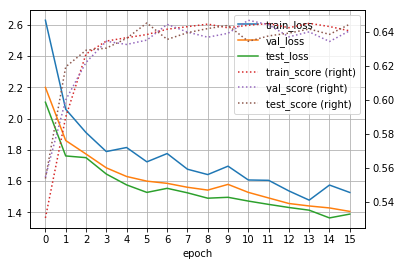

[NAME: NMAE0_4, EPOCH: 16]
> Train...
> Validation...
주야              0.575439
요일              0.124031
사망자수            0.938399
사상자수            0.798553
중상자수            0.836372
경상자수            0.840531
부상신고자수          0.978441
발생지시도           0.083045
발생지시군구          0.040956
사고유형_대분류        0.983165
사고유형_중분류        0.412541
법규위반            0.733333
도로형태_대분류        0.911765
도로형태            0.775281
당사자종별_1당_대분류    0.519856
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.581882
요일              0.123333
사망자수            0.956004
사상자수            0.771589
중상자수            0.839050
경상자수            0.821736
부상신고자수          0.974482
발생지시도           0.112211
발생지시군구          0.060000
사고유형_대분류        0.984496
사고유형_중분류        0.413793
법규위반            0.727891
도로형태_대분류        0.920690
도로형태            0.748175
당사자종별_1당_대분류    0.419244
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.522 num_loss: 0.342 cat_loss: 1.18
score: 0.6422 num_score: 0.87

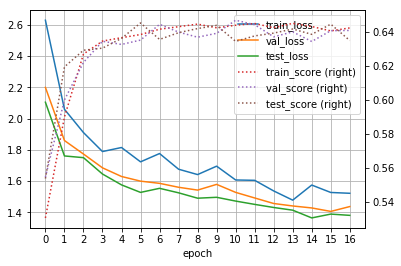

[NAME: NMAE0_4, EPOCH: 17]
> Train...
> Validation...
주야              0.624561
요일              0.124031
사망자수            0.943229
사상자수            0.776402
중상자수            0.814395
경상자수            0.847446
부상신고자수          0.978441
발생지시도           0.089965
발생지시군구          0.034130
사고유형_대분류        0.966330
사고유형_중분류        0.468647
법규위반            0.756667
도로형태_대분류        0.930147
도로형태            0.760300
당사자종별_1당_대분류    0.433213
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.616725
요일              0.123333
사망자수            0.961838
사상자수            0.817446
중상자수            0.854841
경상자수            0.843517
부상신고자수          0.974482
발생지시도           0.102310
발생지시군구          0.064000
사고유형_대분류        0.980620
사고유형_중분류        0.441379
법규위반            0.744898
도로형태_대분류        0.944828
도로형태            0.755474
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.497 num_loss: 0.3244 cat_loss: 1.173
score: 0.6424 num_score: 0.

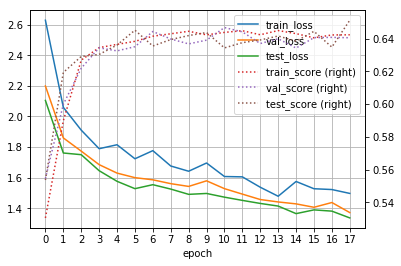

[NAME: NMAE0_4, EPOCH: 18]
> Train...
> Validation...
주야              0.603509
요일              0.124031
사망자수            0.943571
사상자수            0.790991
중상자수            0.816122
경상자수            0.856844
부상신고자수          0.978441
발생지시도           0.069204
발생지시군구          0.040956
사고유형_대분류        0.973064
사고유형_중분류        0.471947
법규위반            0.750000
도로형태_대분류        0.926471
도로형태            0.752809
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.595819
요일              0.123333
사망자수            0.965814
사상자수            0.795584
중상자수            0.832558
경상자수            0.846838
부상신고자수          0.974482
발생지시도           0.059406
발생지시군구          0.064000
사고유형_대분류        0.988372
사고유형_중분류        0.417241
법규위반            0.724490
도로형태_대분류        0.917241
도로형태            0.777372
당사자종별_1당_대분류    0.402062
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.425 num_loss: 0.261 cat_loss: 1.164
score: 0.6454 num_score: 0.8

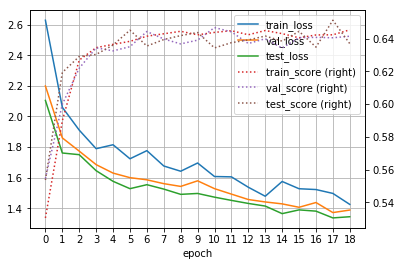

[NAME: NMAE0_4, EPOCH: 19]
> Train...
> Validation...
주야              0.589474
요일              0.124031
사망자수            0.939175
사상자수            0.805085
중상자수            0.814941
경상자수            0.850096
부상신고자수          0.978441
발생지시도           0.076125
발생지시군구          0.047782
사고유형_대분류        0.966330
사고유형_중분류        0.465347
법규위반            0.763333
도로형태_대분류        0.922794
도로형태            0.752809
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.588850
요일              0.123333
사망자수            0.963453
사상자수            0.806957
중상자수            0.834652
경상자수            0.837661
부상신고자수          0.974482
발생지시도           0.082508
발생지시군구          0.044000
사고유형_대분류        0.976744
사고유형_중분류        0.479310
법규위반            0.738095
도로형태_대분류        0.924138
도로형태            0.748175
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.509 num_loss: 0.353 cat_loss: 1.156
score: 0.6454 num_score: 0.8

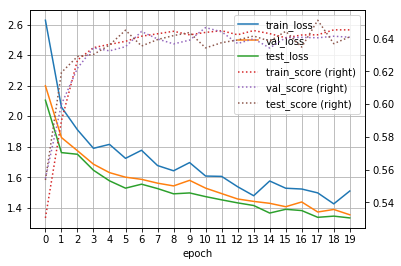

[NAME: NMAE0_4, EPOCH: 20]
> Train...
> Validation...
주야              0.617544
요일              0.124031
사망자수            0.945985
사상자수            0.777817
중상자수            0.809472
경상자수            0.854414
부상신고자수          0.978441
발생지시도           0.079585
발생지시군구          0.051195
사고유형_대분류        0.973064
사고유형_중분류        0.405941
법규위반            0.740000
도로형태_대분류        0.937500
도로형태            0.797753
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.581882
요일              0.123333
사망자수            0.966613
사상자수            0.816375
중상자수            0.828755
경상자수            0.821607
부상신고자수          0.974482
발생지시도           0.062706
발생지시군구          0.052000
사고유형_대분류        0.972868
사고유형_중분류        0.465517
법규위반            0.731293
도로형태_대분류        0.920690
도로형태            0.748175
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.449 num_loss: 0.2988 cat_loss: 1.15
score: 0.6452 num_score: 0.8

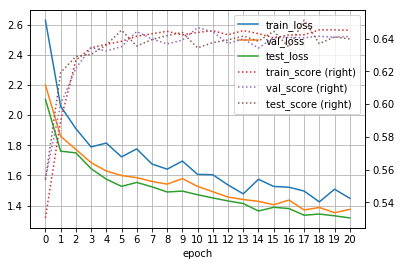

[NAME: NMAE0_4, EPOCH: 21]
> Train...
> Validation...
주야              0.585965
요일              0.124031
사망자수            0.940210
사상자수            0.788301
중상자수            0.818382
경상자수            0.844737
부상신고자수          0.978441
발생지시도           0.065744
발생지시군구          0.047782
사고유형_대분류        0.973064
사고유형_중분류        0.485149
법규위반            0.736667
도로형태_대분류        0.919118
도로형태            0.767790
당사자종별_1당_대분류    0.465704
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.641115
요일              0.123333
사망자수            0.965003
사상자수            0.810499
중상자수            0.832960
경상자수            0.841799
부상신고자수          0.974482
발생지시도           0.069307
발생지시군구          0.060000
사고유형_대분류        0.984496
사고유형_중분류        0.444828
법규위반            0.748299
도로형태_대분류        0.924138
도로형태            0.766423
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.453 num_loss: 0.3075 cat_loss: 1.146
score: 0.6443 num_score: 0.

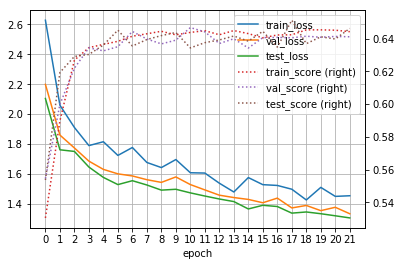

[NAME: NMAE0_4, EPOCH: 22]
> Train...
> Validation...
주야              0.603509
요일              0.124031
사망자수            0.944736
사상자수            0.807249
중상자수            0.810309
경상자수            0.853124
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.047782
사고유형_대분류        0.952862
사고유형_중분류        0.458746
법규위반            0.743333
도로형태_대분류        0.922794
도로형태            0.756554
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.613240
요일              0.123333
사망자수            0.963283
사상자수            0.811216
중상자수            0.849647
경상자수            0.841046
부상신고자수          0.974482
발생지시도           0.082508
발생지시군구          0.060000
사고유형_대분류        0.980620
사고유형_중분류        0.462069
법규위반            0.738095
도로형태_대분류        0.920690
도로형태            0.751825
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.478 num_loss: 0.3423 cat_loss: 1.136
score: 0.6417 num_score: 0.

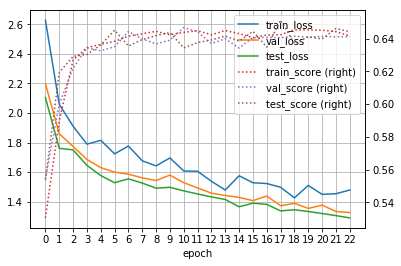

[NAME: NMAE0_4, EPOCH: 23]
> Train...
> Validation...
주야              0.571930
요일              0.124031
사망자수            0.951896
사상자수            0.807630
중상자수            0.816355
경상자수            0.866684
부상신고자수          0.978441
발생지시도           0.086505
발생지시군구          0.051195
사고유형_대분류        0.976431
사고유형_중분류        0.468647
법규위반            0.730000
도로형태_대분류        0.926471
도로형태            0.786517
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.623693
요일              0.123333
사망자수            0.962843
사상자수            0.825457
중상자수            0.837773
경상자수            0.842991
부상신고자수          0.974482
발생지시도           0.079208
발생지시군구          0.056000
사고유형_대분류        0.968992
사고유형_중분류        0.417241
법규위반            0.741497
도로형태_대분류        0.910345
도로형태            0.762774
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.421 num_loss: 0.2893 cat_loss: 1.132
score: 0.6431 num_score: 0.

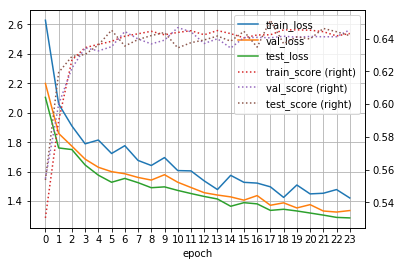

[NAME: NMAE0_4, EPOCH: 24]
> Train...
> Validation...
주야              0.571930
요일              0.124031
사망자수            0.943280
사상자수            0.797027
중상자수            0.817769
경상자수            0.867813
부상신고자수          0.978441
발생지시도           0.076125
발생지시군구          0.058020
사고유형_대분류        0.983165
사고유형_중분류        0.471947
법규위반            0.756667
도로형태_대분류        0.911765
도로형태            0.782772
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.616725
요일              0.123333
사망자수            0.959235
사상자수            0.809977
중상자수            0.839503
경상자수            0.842660
부상신고자수          0.974482
발생지시도           0.052805
발생지시군구          0.056000
사고유형_대분류        0.988372
사고유형_중분류        0.431034
법규위반            0.731293
도로형태_대분류        0.931034
도로형태            0.755474
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.734266
Name: score, dtype: float64
[train] loss: 1.434 num_loss: 0.3076 cat_loss: 1.127
score: 0.6456 num_score: 0.

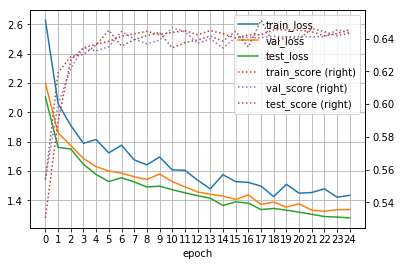

[NAME: NMAE0_4, EPOCH: 25]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.949642
사상자수            0.786179
중상자수            0.808851
경상자수            0.868787
부상신고자수          0.978441
발생지시도           0.069204
발생지시군구          0.071672
사고유형_대분류        0.969697
사고유형_중분류        0.475248
법규위반            0.753333
도로형태_대분류        0.941176
도로형태            0.801498
당사자종별_1당_대분류    0.433213
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.616725
요일              0.123333
사망자수            0.967027
사상자수            0.813762
중상자수            0.834675
경상자수            0.843483
부상신고자수          0.974482
발생지시도           0.069307
발생지시군구          0.092000
사고유형_대분류        0.984496
사고유형_중분류        0.441379
법규위반            0.758503
도로형태_대분류        0.920690
도로형태            0.777372
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.515 num_loss: 0.3947 cat_loss: 1.121
score: 0.6471 num_score: 0.

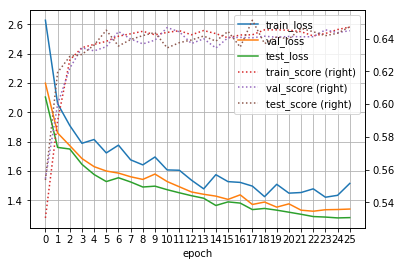

[NAME: NMAE0_4, EPOCH: 26]
> Train...
> Validation...
주야              0.607018
요일              0.124031
사망자수            0.941773
사상자수            0.757112
중상자수            0.815491
경상자수            0.854992
부상신고자수          0.978441
발생지시도           0.110727
발생지시군구          0.061433
사고유형_대분류        0.989899
사고유형_중분류        0.445545
법규위반            0.730000
도로형태_대분류        0.926471
도로형태            0.794007
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.123333
사망자수            0.967002
사상자수            0.795389
중상자수            0.846461
경상자수            0.838188
부상신고자수          0.974482
발생지시도           0.079208
발생지시군구          0.048000
사고유형_대분류        0.988372
사고유형_중분류        0.451724
법규위반            0.758503
도로형태_대분류        0.920690
도로형태            0.751825
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.446 num_loss: 0.3266 cat_loss: 1.119
score: 0.6437 num_score: 0.

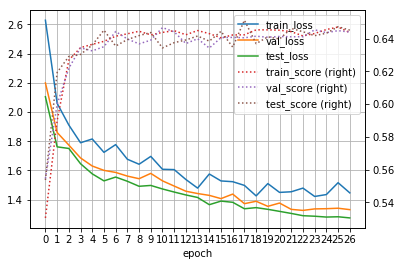

[NAME: NMAE0_4, EPOCH: 27]
> Train...
> Validation...
주야              0.663158
요일              0.124031
사망자수            0.952017
사상자수            0.808276
중상자수            0.800855
경상자수            0.849771
부상신고자수          0.978441
발생지시도           0.079585
발생지시군구          0.047782
사고유형_대분류        0.973064
사고유형_중분류        0.491749
법규위반            0.743333
도로형태_대분류        0.922794
도로형태            0.767790
당사자종별_1당_대분류    0.425993
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.609756
요일              0.123333
사망자수            0.971239
사상자수            0.828157
중상자수            0.848257
경상자수            0.831410
부상신고자수          0.974482
발생지시도           0.079208
발생지시군구          0.072000
사고유형_대분류        0.984496
사고유형_중분류        0.465517
법규위반            0.748299
도로형태_대분류        0.931034
도로형태            0.770073
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.461 num_loss: 0.3438 cat_loss: 1.117
score: 0.6438 num_score: 0.

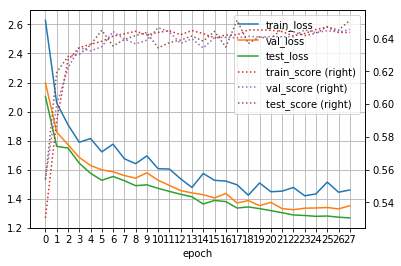

[NAME: NMAE0_4, EPOCH: 28]
> Train...
> Validation...
주야              0.575439
요일              0.124031
사망자수            0.943680
사상자수            0.814133
중상자수            0.817354
경상자수            0.868536
부상신고자수          0.978441
발생지시도           0.089965
발생지시군구          0.047782
사고유형_대분류        0.966330
사고유형_중분류        0.438944
법규위반            0.743333
도로형태_대분류        0.937500
도로형태            0.771536
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.588850
요일              0.123333
사망자수            0.965009
사상자수            0.814819
중상자수            0.844236
경상자수            0.845523
부상신고자수          0.974482
발생지시도           0.046205
발생지시군구          0.080000
사고유형_대분류        0.972868
사고유형_중분류        0.393103
법규위반            0.731293
도로형태_대분류        0.917241
도로형태            0.762774
당사자종별_1당_대분류    0.522337
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.499 num_loss: 0.3854 cat_loss: 1.114
score: 0.644 num_score: 0.8

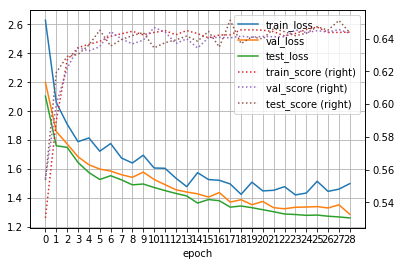

[NAME: NMAE0_4, EPOCH: 29]
> Train...
> Validation...
주야              0.638596
요일              0.124031
사망자수            0.953122
사상자수            0.804005
중상자수            0.827315
경상자수            0.849690
부상신고자수          0.978441
발생지시도           0.089965
발생지시군구          0.078498
사고유형_대분류        0.979798
사고유형_중분류        0.438944
법규위반            0.736667
도로형태_대분류        0.941176
도로형태            0.775281
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.655052
요일              0.123333
사망자수            0.966697
사상자수            0.824100
중상자수            0.867688
경상자수            0.832028
부상신고자수          0.974482
발생지시도           0.056106
발생지시군구          0.068000
사고유형_대분류        0.984496
사고유형_중분류        0.465517
법규위반            0.748299
도로형태_대분류        0.924138
도로형태            0.773723
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.409 num_loss: 0.2995 cat_loss: 1.11
score: 0.6482 num_score: 0.8

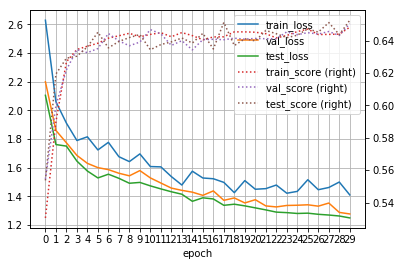

[NAME: Dense_0, EPOCH: 0]
> Train...
> Validation...
주야              0.564912
요일              0.135659
사망자수            0.869011
사상자수            0.689592
중상자수            0.816105
경상자수            0.858423
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.027304
사고유형_대분류        0.942761
사고유형_중분류        0.376238
법규위반            0.713333
도로형태_대분류        0.897059
도로형태            0.767790
당사자종별_1당_대분류    0.433213
당사자종별_2당_대분류    0.674342
Name: score, dtype: float64
> Test...
주야              0.581882
요일              0.120000
사망자수            0.858249
사상자수            0.647642
중상자수            0.834651
경상자수            0.808619
부상신고자수          0.974482
발생지시도           0.201320
발생지시군구          0.020000
사고유형_대분류        0.953488
사고유형_중분류        0.437931
법규위반            0.744898
도로형태_대분류        0.868966
도로형태            0.748175
당사자종별_1당_대분류    0.491409
당사자종별_2당_대분류    0.667832
Name: score, dtype: float64
[train] loss: 2.226 num_loss: 0.5897 cat_loss: 1.636
score: 0.5878 num_score: 0.8

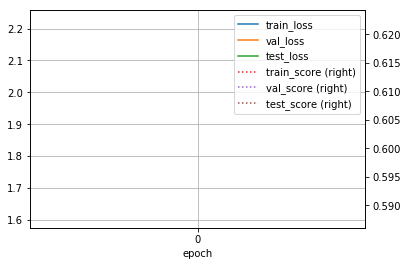

[NAME: Dense_0, EPOCH: 1]
> Train...
> Validation...
주야              0.571930
요일              0.189922
사망자수            0.861165
사상자수            0.714909
중상자수            0.818873
경상자수            0.853790
부상신고자수          0.978441
발생지시도           0.249135
발생지시군구          0.044369
사고유형_대분류        0.939394
사고유형_중분류        0.432343
법규위반            0.746667
도로형태_대분류        0.915441
도로형태            0.797753
당사자종별_1당_대분류    0.422383
당사자종별_2당_대분류    0.651316
Name: score, dtype: float64
> Test...
주야              0.634146
요일              0.136667
사망자수            0.913071
사상자수            0.697913
중상자수            0.796763
경상자수            0.842520
부상신고자수          0.974482
발생지시도           0.313531
발생지시군구          0.052000
사고유형_대분류        0.965116
사고유형_중분류        0.486207
법규위반            0.717687
도로형태_대분류        0.879310
도로형태            0.711679
당사자종별_1당_대분류    0.391753
당사자종별_2당_대분류    0.678322
Name: score, dtype: float64
[train] loss: 1.607 num_loss: 0.4209 cat_loss: 1.186
score: 0.6361 num_score: 0.8

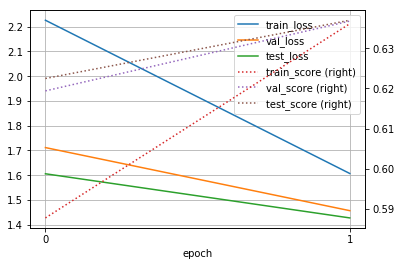

[NAME: Dense_0, EPOCH: 2]
> Train...
> Validation...
주야              0.592982
요일              0.124031
사망자수            0.881045
사상자수            0.715506
중상자수            0.816562
경상자수            0.863771
부상신고자수          0.978441
발생지시도           0.328720
발생지시군구          0.047782
사고유형_대분류        0.932660
사고유형_중분류        0.455446
법규위반            0.730000
도로형태_대분류        0.911765
도로형태            0.790262
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.667763
Name: score, dtype: float64
> Test...
주야              0.672474
요일              0.136667
사망자수            0.926847
사상자수            0.673087
중상자수            0.834851
경상자수            0.838141
부상신고자수          0.974482
발생지시도           0.389439
발생지시군구          0.056000
사고유형_대분류        0.965116
사고유형_중분류        0.410345
법규위반            0.707483
도로형태_대분류        0.889655
도로형태            0.751825
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.521 num_loss: 0.4582 cat_loss: 1.063
score: 0.6476 num_score: 0.8

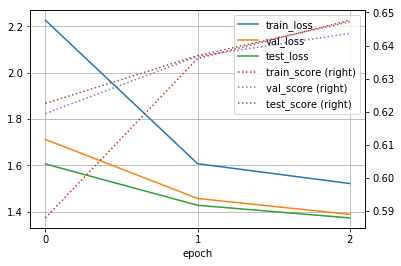

[NAME: Dense_0, EPOCH: 3]
> Train...
> Validation...
주야              0.645614
요일              0.120155
사망자수            0.890954
사상자수            0.744413
중상자수            0.827314
경상자수            0.857493
부상신고자수          0.978441
발생지시도           0.384083
발생지시군구          0.081911
사고유형_대분류        0.952862
사고유형_중분류        0.458746
법규위반            0.743333
도로형태_대분류        0.897059
도로형태            0.779026
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.664474
Name: score, dtype: float64
> Test...
주야              0.606272
요일              0.140000
사망자수            0.945748
사상자수            0.746362
중상자수            0.829847
경상자수            0.834861
부상신고자수          0.974482
발생지시도           0.438944
발생지시군구          0.076000
사고유형_대분류        0.988372
사고유형_중분류        0.475862
법규위반            0.748299
도로형태_대분류        0.875862
도로형태            0.762774
당사자종별_1당_대분류    0.426117
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.371 num_loss: 0.3593 cat_loss: 1.011
score: 0.6573 num_score: 0.8

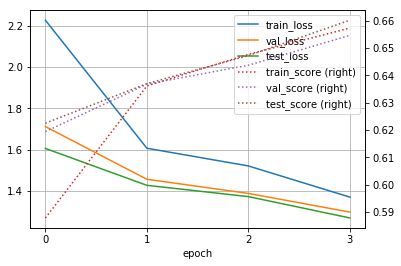

[NAME: Dense_0, EPOCH: 4]
> Train...
> Validation...
주야              0.617544
요일              0.155039
사망자수            0.920807
사상자수            0.720452
중상자수            0.813844
경상자수            0.853272
부상신고자수          0.978441
발생지시도           0.394464
발생지시군구          0.064846
사고유형_대분류        0.959596
사고유형_중분류        0.455446
법규위반            0.750000
도로형태_대분류        0.904412
도로형태            0.756554
당사자종별_1당_대분류    0.425993
당사자종별_2당_대분류    0.664474
Name: score, dtype: float64
> Test...
주야              0.630662
요일              0.170000
사망자수            0.942219
사상자수            0.783876
중상자수            0.831177
경상자수            0.850116
부상신고자수          0.974482
발생지시도           0.442244
발생지시군구          0.088000
사고유형_대분류        0.972868
사고유형_중분류        0.468966
법규위반            0.751701
도로형태_대분류        0.917241
도로형태            0.777372
당사자종별_1당_대분류    0.439863
당사자종별_2당_대분류    0.678322
Name: score, dtype: float64
[train] loss: 1.347 num_loss: 0.3664 cat_loss: 0.9811
score: 0.66 num_score: 0.87

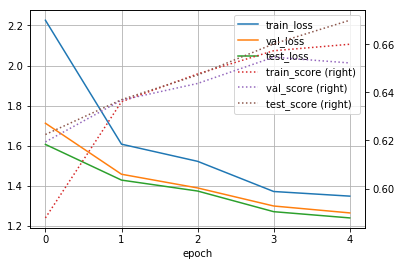

[NAME: Dense_0, EPOCH: 5]
> Train...
> Validation...
주야              0.649123
요일              0.186047
사망자수            0.929172
사상자수            0.734810
중상자수            0.823598
경상자수            0.860521
부상신고자수          0.978441
발생지시도           0.467128
발생지시군구          0.085324
사고유형_대분류        0.959596
사고유형_중분류        0.438944
법규위반            0.743333
도로형태_대분류        0.897059
도로형태            0.764045
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.661184
Name: score, dtype: float64
> Test...
주야              0.623693
요일              0.146667
사망자수            0.952275
사상자수            0.768226
중상자수            0.829505
경상자수            0.843660
부상신고자수          0.974482
발생지시도           0.458746
발생지시군구          0.096000
사고유형_대분류        0.980620
사고유형_중분류        0.420690
법규위반            0.751701
도로형태_대분류        0.910345
도로형태            0.773723
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.333 num_loss: 0.378 cat_loss: 0.9546
score: 0.6637 num_score: 0.8

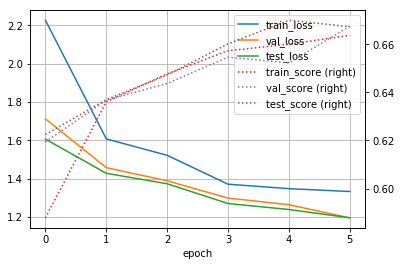

[NAME: Dense_0, EPOCH: 6]
> Train...
> Validation...
주야              0.649123
요일              0.131783
사망자수            0.933770
사상자수            0.732597
중상자수            0.825827
경상자수            0.860071
부상신고자수          0.978441
발생지시도           0.418685
발생지시군구          0.064846
사고유형_대분류        0.952862
사고유형_중분류        0.425743
법규위반            0.780000
도로형태_대분류        0.915441
도로형태            0.794007
당사자종별_1당_대분류    0.523466
당사자종별_2당_대분류    0.667763
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.136667
사망자수            0.943294
사상자수            0.782038
중상자수            0.845475
경상자수            0.841070
부상신고자수          0.974482
발생지시도           0.485149
발생지시군구          0.076000
사고유형_대분류        0.976744
사고유형_중분류        0.479310
법규위반            0.731293
도로형태_대분류        0.927586
도로형태            0.781022
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.435 num_loss: 0.5096 cat_loss: 0.9251
score: 0.6637 num_score: 0.

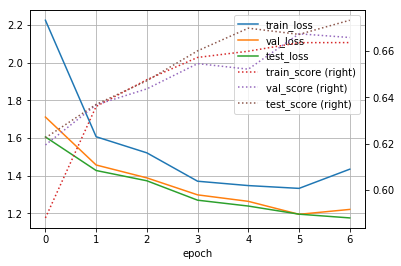

[NAME: Dense_0, EPOCH: 7]
> Train...
> Validation...
주야              0.635088
요일              0.162791
사망자수            0.939636
사상자수            0.800012
중상자수            0.827554
경상자수            0.865162
부상신고자수          0.978441
발생지시도           0.456747
발생지시군구          0.078498
사고유형_대분류        0.969697
사고유형_중분류        0.501650
법규위반            0.776667
도로형태_대분류        0.919118
도로형태            0.767790
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.671053
Name: score, dtype: float64
> Test...
주야              0.595819
요일              0.160000
사망자수            0.962934
사상자수            0.773700
중상자수            0.837474
경상자수            0.842602
부상신고자수          0.974482
발생지시도           0.495050
발생지시군구          0.096000
사고유형_대분류        0.976744
사고유형_중분류        0.468966
법규위반            0.751701
도로형태_대분류        0.913793
도로형태            0.788321
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.245 num_loss: 0.3394 cat_loss: 0.9055
score: 0.6677 num_score: 0.

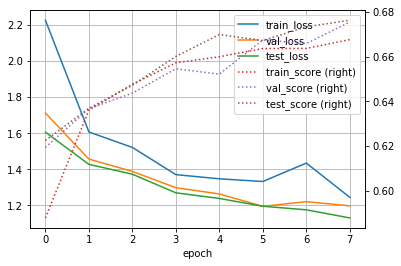

[NAME: Dense_0, EPOCH: 8]
> Train...
> Validation...
주야              0.575439
요일              0.127907
사망자수            0.938138
사상자수            0.786375
중상자수            0.824229
경상자수            0.864437
부상신고자수          0.978441
발생지시도           0.484429
발생지시군구          0.081911
사고유형_대분류        0.979798
사고유형_중분류        0.478548
법규위반            0.766667
도로형태_대분류        0.915441
도로형태            0.797753
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.684211
Name: score, dtype: float64
> Test...
주야              0.658537
요일              0.140000
사망자수            0.961519
사상자수            0.800560
중상자수            0.830036
경상자수            0.846263
부상신고자수          0.974482
발생지시도           0.518152
발생지시군구          0.104000
사고유형_대분류        0.976744
사고유형_중분류        0.482759
법규위반            0.744898
도로형태_대분류        0.920690
도로형태            0.799270
당사자종별_1당_대분류    0.470790
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.269 num_loss: 0.375 cat_loss: 0.8938
score: 0.6693 num_score: 0.8

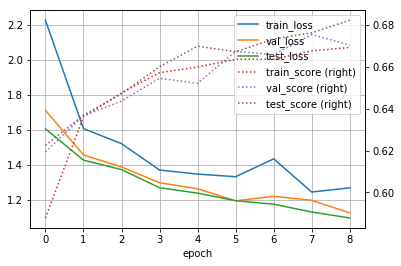

[NAME: Dense_0, EPOCH: 9]
> Train...
> Validation...
주야              0.677193
요일              0.151163
사망자수            0.950690
사상자수            0.772642
중상자수            0.828247
경상자수            0.881250
부상신고자수          0.978441
발생지시도           0.477509
발생지시군구          0.064846
사고유형_대분류        0.966330
사고유형_중분류        0.508251
법규위반            0.776667
도로형태_대분류        0.922794
도로형태            0.805243
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.664474
Name: score, dtype: float64
> Test...
주야              0.707317
요일              0.143333
사망자수            0.965273
사상자수            0.787903
중상자수            0.841693
경상자수            0.851941
부상신고자수          0.974482
발생지시도           0.537954
발생지시군구          0.100000
사고유형_대분류        0.976744
사고유형_중분류        0.489655
법규위반            0.748299
도로형태_대분류        0.917241
도로형태            0.799270
당사자종별_1당_대분류    0.501718
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.25 num_loss: 0.3665 cat_loss: 0.8839
score: 0.6709 num_score: 0.8

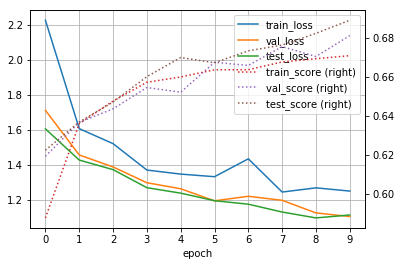

[NAME: Dense_0, EPOCH: 10]
> Train...
> Validation...
주야              0.642105
요일              0.170543
사망자수            0.946305
사상자수            0.734623
중상자수            0.832031
경상자수            0.867363
부상신고자수          0.978441
발생지시도           0.477509
발생지시군구          0.088737
사고유형_대분류        0.966330
사고유형_중분류        0.481848
법규위반            0.773333
도로형태_대분류        0.937500
도로형태            0.816479
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.680921
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.130000
사망자수            0.960685
사상자수            0.787902
중상자수            0.838391
경상자수            0.840775
부상신고자수          0.974482
발생지시도           0.547855
발생지시군구          0.096000
사고유형_대분류        0.976744
사고유형_중분류        0.510345
법규위반            0.768707
도로형태_대분류        0.934483
도로형태            0.806569
당사자종별_1당_대분류    0.515464
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.178 num_loss: 0.2996 cat_loss: 0.8784
score: 0.6721 num_score: 0

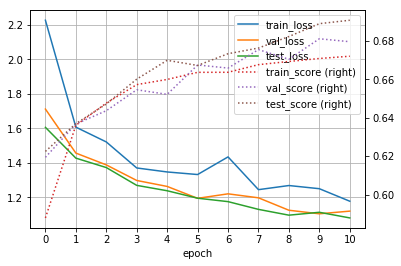

[NAME: Dense_0, EPOCH: 11]
> Train...
> Validation...
주야              0.603509
요일              0.139535
사망자수            0.950163
사상자수            0.799920
중상자수            0.821709
경상자수            0.864450
부상신고자수          0.978441
발생지시도           0.505190
발생지시군구          0.071672
사고유형_대분류        0.973064
사고유형_중분류        0.495050
법규위반            0.756667
도로형태_대분류        0.926471
도로형태            0.812734
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.146667
사망자수            0.968935
사상자수            0.784699
중상자수            0.855976
경상자수            0.848827
부상신고자수          0.974482
발생지시도           0.544554
발생지시군구          0.120000
사고유형_대분류        0.984496
사고유형_중분류        0.537931
법규위반            0.741497
도로형태_대분류        0.906897
도로형태            0.795620
당사자종별_1당_대분류    0.505155
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.23 num_loss: 0.3571 cat_loss: 0.8734
score: 0.6716 num_score: 0.

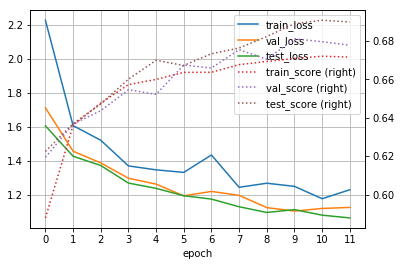

[NAME: Dense_0, EPOCH: 12]
> Train...
> Validation...
주야              0.589474
요일              0.162791
사망자수            0.950211
사상자수            0.821624
중상자수            0.820738
경상자수            0.864468
부상신고자수          0.978441
발생지시도           0.543253
발생지시군구          0.092150
사고유형_대분류        0.973064
사고유형_중분류        0.528053
법규위반            0.790000
도로형태_대분류        0.922794
도로형태            0.794007
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.630662
요일              0.133333
사망자수            0.964250
사상자수            0.787642
중상자수            0.838305
경상자수            0.853625
부상신고자수          0.974482
발생지시도           0.547855
발생지시군구          0.104000
사고유형_대분류        0.992248
사고유형_중분류        0.489655
법규위반            0.744898
도로형태_대분류        0.917241
도로형태            0.799270
당사자종별_1당_대분류    0.563574
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.296 num_loss: 0.429 cat_loss: 0.8672
score: 0.6738 num_score: 0.

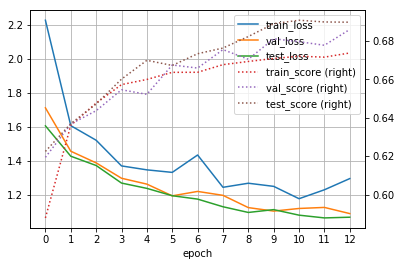

[NAME: Dense_0, EPOCH: 13]
> Train...
> Validation...
주야              0.673684
요일              0.162791
사망자수            0.950819
사상자수            0.796894
중상자수            0.835889
경상자수            0.873842
부상신고자수          0.978441
발생지시도           0.525952
발생지시군구          0.102389
사고유형_대분류        0.969697
사고유형_중분류        0.504950
법규위반            0.763333
도로형태_대분류        0.933824
도로형태            0.846442
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.677632
Name: score, dtype: float64
> Test...
주야              0.665505
요일              0.130000
사망자수            0.964695
사상자수            0.787469
중상자수            0.859619
경상자수            0.836765
부상신고자수          0.974482
발생지시도           0.537954
발생지시군구          0.096000
사고유형_대분류        0.996124
사고유형_중분류        0.527586
법규위반            0.772109
도로형태_대분류        0.920690
도로형태            0.795620
당사자종별_1당_대분류    0.491409
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.236 num_loss: 0.3734 cat_loss: 0.8623
score: 0.6757 num_score: 0

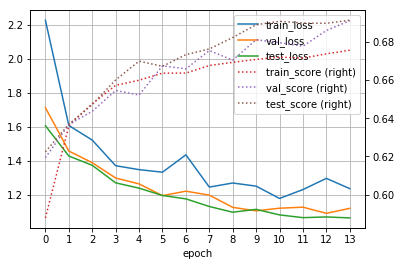

[NAME: Dense_0, EPOCH: 14]
> Train...
> Validation...
주야              0.642105
요일              0.158915
사망자수            0.941425
사상자수            0.787164
중상자수            0.822298
경상자수            0.870147
부상신고자수          0.978441
발생지시도           0.539792
발생지시군구          0.102389
사고유형_대분류        0.976431
사고유형_중분류        0.504950
법규위반            0.753333
도로형태_대분류        0.933824
도로형태            0.835206
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.674342
Name: score, dtype: float64
> Test...
주야              0.693380
요일              0.136667
사망자수            0.965583
사상자수            0.797488
중상자수            0.842168
경상자수            0.844720
부상신고자수          0.974482
발생지시도           0.554455
발생지시군구          0.112000
사고유형_대분류        0.996124
사고유형_중분류        0.468966
법규위반            0.765306
도로형태_대분류        0.927586
도로형태            0.817518
당사자종별_1당_대분류    0.508591
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.272 num_loss: 0.412 cat_loss: 0.8598
score: 0.6742 num_score: 0.

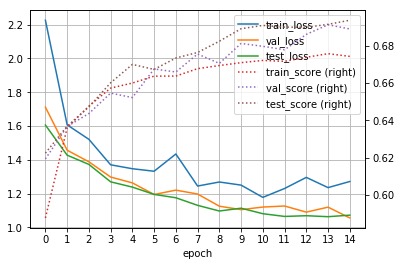

[NAME: Dense_0, EPOCH: 15]
> Train...
> Validation...
주야              0.663158
요일              0.135659
사망자수            0.944615
사상자수            0.811047
중상자수            0.832736
경상자수            0.872145
부상신고자수          0.978441
발생지시도           0.515571
발생지시군구          0.078498
사고유형_대분류        0.969697
사고유형_중분류        0.547855
법규위반            0.770000
도로형태_대분류        0.941176
도로형태            0.835206
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.696864
요일              0.133333
사망자수            0.962957
사상자수            0.789828
중상자수            0.854368
경상자수            0.858249
부상신고자수          0.974482
발생지시도           0.554455
발생지시군구          0.088000
사고유형_대분류        0.988372
사고유형_중분류        0.524138
법규위반            0.751701
도로형태_대분류        0.917241
도로형태            0.791971
당사자종별_1당_대분류    0.518900
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.202 num_loss: 0.3444 cat_loss: 0.8575
score: 0.6728 num_score: 0

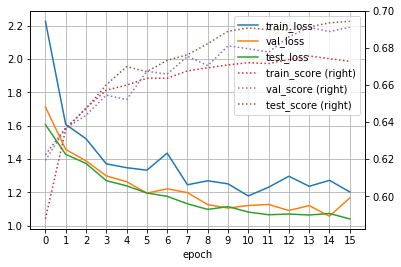

[NAME: Dense_0, EPOCH: 16]
> Train...
> Validation...
주야              0.719298
요일              0.178295
사망자수            0.945764
사상자수            0.757355
중상자수            0.822813
경상자수            0.857651
부상신고자수          0.978441
발생지시도           0.522491
발생지시군구          0.095563
사고유형_대분류        0.983165
사고유형_중분류        0.537954
법규위반            0.770000
도로형태_대분류        0.944853
도로형태            0.816479
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.637631
요일              0.116667
사망자수            0.964527
사상자수            0.828984
중상자수            0.859463
경상자수            0.853920
부상신고자수          0.974482
발생지시도           0.544554
발생지시군구          0.112000
사고유형_대분류        0.992248
사고유형_중분류        0.503448
법규위반            0.755102
도로형태_대분류        0.937931
도로형태            0.817518
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.185 num_loss: 0.3301 cat_loss: 0.8549
score: 0.6777 num_score: 0

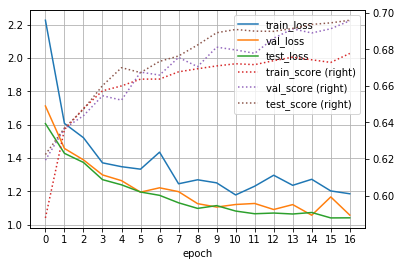

[NAME: Dense_0, EPOCH: 17]
> Train...
> Validation...
주야              0.729825
요일              0.116279
사망자수            0.945107
사상자수            0.805484
중상자수            0.844949
경상자수            0.878281
부상신고자수          0.978441
발생지시도           0.498270
발생지시군구          0.085324
사고유형_대분류        0.983165
사고유형_중분류        0.531353
법규위반            0.773333
도로형태_대분류        0.930147
도로형태            0.838951
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.693380
요일              0.133333
사망자수            0.953305
사상자수            0.815858
중상자수            0.849023
경상자수            0.859139
부상신고자수          0.974482
발생지시도           0.551155
발생지시군구          0.100000
사고유형_대분류        0.988372
사고유형_중분류        0.500000
법규위반            0.755102
도로형태_대분류        0.941379
도로형태            0.810219
당사자종별_1당_대분류    0.546392
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.157 num_loss: 0.3049 cat_loss: 0.8518
score: 0.678 num_score: 0.

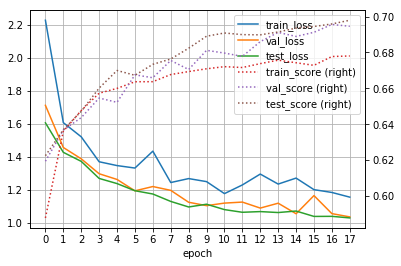

[NAME: Dense_0, EPOCH: 18]
> Train...
> Validation...
주야              0.712281
요일              0.135659
사망자수            0.947561
사상자수            0.800291
중상자수            0.835411
경상자수            0.860627
부상신고자수          0.978441
발생지시도           0.522491
발생지시군구          0.095563
사고유형_대분류        0.979798
사고유형_중분류        0.547855
법규위반            0.773333
도로형태_대분류        0.948529
도로형태            0.853933
당사자종별_1당_대분류    0.509025
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.700348
요일              0.140000
사망자수            0.968122
사상자수            0.839990
중상자수            0.860848
경상자수            0.859998
부상신고자수          0.974482
발생지시도           0.567657
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.517241
법규위반            0.761905
도로형태_대분류        0.962069
도로형태            0.832117
당사자종별_1당_대분류    0.518900
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.169 num_loss: 0.3204 cat_loss: 0.8482
score: 0.6765 num_score: 0

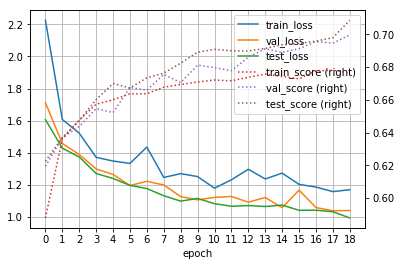

[NAME: Dense_0, EPOCH: 19]
> Train...
> Validation...
주야              0.670175
요일              0.139535
사망자수            0.944388
사상자수            0.790679
중상자수            0.839663
경상자수            0.871847
부상신고자수          0.978441
발생지시도           0.508651
발생지시군구          0.109215
사고유형_대분류        0.976431
사고유형_중분류        0.508251
법규위반            0.766667
도로형태_대분류        0.963235
도로형태            0.842697
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.679443
요일              0.146667
사망자수            0.962542
사상자수            0.810855
중상자수            0.851674
경상자수            0.858308
부상신고자수          0.974482
발생지시도           0.570957
발생지시군구          0.152000
사고유형_대분류        0.996124
사고유형_중분류        0.496552
법규위반            0.778912
도로형태_대분류        0.958621
도로형태            0.810219
당사자종별_1당_대분류    0.529210
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.166 num_loss: 0.3243 cat_loss: 0.8414
score: 0.6815 num_score: 0

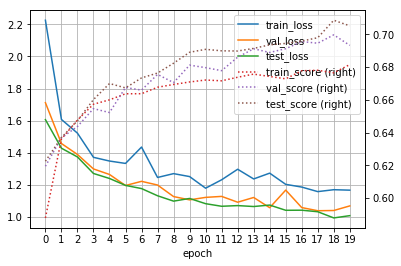

[NAME: Dense_0, EPOCH: 20]
> Train...
> Validation...
주야              0.712281
요일              0.155039
사망자수            0.951505
사상자수            0.809524
중상자수            0.841924
경상자수            0.869710
부상신고자수          0.978441
발생지시도           0.532872
발생지시군구          0.081911
사고유형_대분류        0.976431
사고유형_중분류        0.584158
법규위반            0.763333
도로형태_대분류        0.948529
도로형태            0.812734
당사자종별_1당_대분류    0.509025
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.703833
요일              0.123333
사망자수            0.968323
사상자수            0.806585
중상자수            0.864234
경상자수            0.858395
부상신고자수          0.974482
발생지시도           0.564356
발생지시군구          0.120000
사고유형_대분류        0.992248
사고유형_중분류        0.527586
법규위반            0.765306
도로형태_대분류        0.962069
도로형태            0.828467
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.218 num_loss: 0.3755 cat_loss: 0.8422
score: 0.6788 num_score: 0

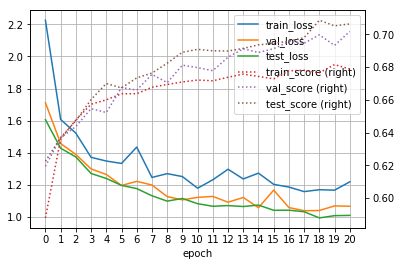

[NAME: Dense_0, EPOCH: 21]
> Train...
> Validation...
주야              0.743860
요일              0.127907
사망자수            0.948381
사상자수            0.787833
중상자수            0.834030
경상자수            0.862720
부상신고자수          0.978441
발생지시도           0.529412
발생지시군구          0.085324
사고유형_대분류        0.986532
사고유형_중분류        0.547855
법규위반            0.793333
도로형태_대분류        0.952206
도로형태            0.861423
당사자종별_1당_대분류    0.541516
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.700348
요일              0.143333
사망자수            0.968691
사상자수            0.794795
중상자수            0.874062
경상자수            0.843463
부상신고자수          0.974482
발생지시도           0.564356
발생지시군구          0.144000
사고유형_대분류        0.992248
사고유형_중분류        0.541379
법규위반            0.772109
도로형태_대분류        0.955172
도로형태            0.839416
당사자종별_1당_대분류    0.525773
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.121 num_loss: 0.2806 cat_loss: 0.8399
score: 0.6838 num_score: 0

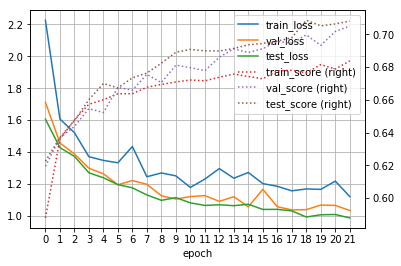

[NAME: Dense_0, EPOCH: 22]
> Train...
> Validation...
주야              0.684211
요일              0.120155
사망자수            0.947457
사상자수            0.828656
중상자수            0.846600
경상자수            0.882485
부상신고자수          0.978441
발생지시도           0.532872
발생지시군구          0.112628
사고유형_대분류        0.989899
사고유형_중분류        0.561056
법규위반            0.783333
도로형태_대분류        0.963235
도로형태            0.816479
당사자종별_1당_대분류    0.490975
당사자종별_2당_대분류    0.677632
Name: score, dtype: float64
> Test...
주야              0.682927
요일              0.133333
사망자수            0.966321
사상자수            0.821210
중상자수            0.861733
경상자수            0.850038
부상신고자수          0.974482
발생지시도           0.564356
발생지시군구          0.116000
사고유형_대분류        0.992248
사고유형_중분류        0.541379
법규위반            0.782313
도로형태_대분류        0.968966
도로형태            0.832117
당사자종별_1당_대분류    0.529210
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.194 num_loss: 0.3558 cat_loss: 0.8379
score: 0.6783 num_score: 0

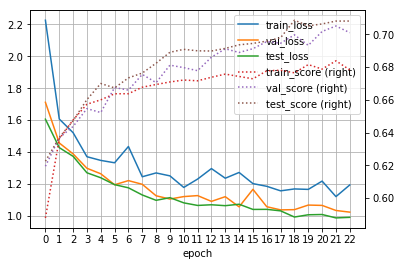

[NAME: Dense_0, EPOCH: 23]
> Train...
> Validation...
주야              0.694737
요일              0.135659
사망자수            0.949739
사상자수            0.793692
중상자수            0.831767
경상자수            0.867394
부상신고자수          0.978441
발생지시도           0.532872
발생지시군구          0.122867
사고유형_대분류        0.986532
사고유형_중분류        0.534653
법규위반            0.796667
도로형태_대분류        0.959559
도로형태            0.868914
당사자종별_1당_대분류    0.552347
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.675958
요일              0.113333
사망자수            0.968630
사상자수            0.826033
중상자수            0.866206
경상자수            0.849987
부상신고자수          0.974482
발생지시도           0.567657
발생지시군구          0.136000
사고유형_대분류        0.996124
사고유형_중분류        0.531034
법규위반            0.765306
도로형태_대분류        0.965517
도로형태            0.810219
당사자종별_1당_대분류    0.542955
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.207 num_loss: 0.3711 cat_loss: 0.8356
score: 0.6812 num_score: 0

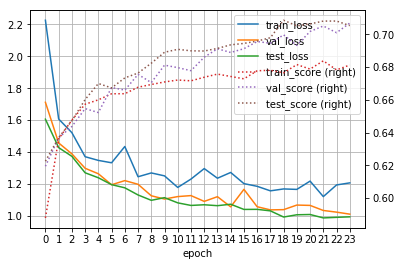

[NAME: Dense_0, EPOCH: 24]
> Train...
> Validation...
주야              0.684211
요일              0.127907
사망자수            0.954994
사상자수            0.815619
중상자수            0.840364
경상자수            0.866304
부상신고자수          0.978441
발생지시도           0.519031
발생지시군구          0.098976
사고유형_대분류        0.989899
사고유형_중분류        0.567657
법규위반            0.783333
도로형태_대분류        0.952206
도로형태            0.805243
당사자종별_1당_대분류    0.527076
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.721254
요일              0.123333
사망자수            0.971796
사상자수            0.822134
중상자수            0.865509
경상자수            0.863097
부상신고자수          0.974482
발생지시도           0.577558
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.531034
법규위반            0.782313
도로형태_대분류        0.962069
도로형태            0.832117
당사자종별_1당_대분류    0.570447
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.158 num_loss: 0.3207 cat_loss: 0.8375
score: 0.6803 num_score: 0

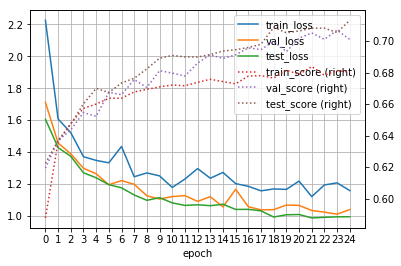

[NAME: Dense_0, EPOCH: 25]
> Train...
> Validation...
주야              0.729825
요일              0.143411
사망자수            0.951656
사상자수            0.791215
중상자수            0.819386
경상자수            0.872967
부상신고자수          0.978441
발생지시도           0.543253
발생지시군구          0.095563
사고유형_대분류        0.986532
사고유형_중분류        0.610561
법규위반            0.793333
도로형태_대분류        0.959559
도로형태            0.816479
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.724739
요일              0.143333
사망자수            0.967477
사상자수            0.792210
중상자수            0.866962
경상자수            0.849954
부상신고자수          0.974482
발생지시도           0.561056
발생지시군구          0.128000
사고유형_대분류        0.992248
사고유형_중분류        0.572414
법규위반            0.751701
도로형태_대분류        0.944828
도로형태            0.839416
당사자종별_1당_대분류    0.553265
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.171 num_loss: 0.3364 cat_loss: 0.8345
score: 0.6837 num_score: 0

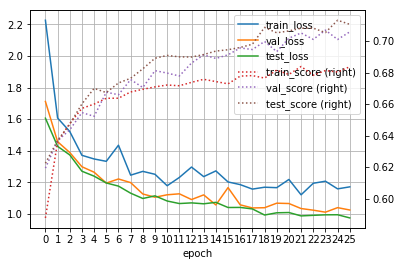

[NAME: Dense_0, EPOCH: 26]
> Train...
> Validation...
주야              0.694737
요일              0.135659
사망자수            0.950155
사상자수            0.798483
중상자수            0.843483
경상자수            0.868118
부상신고자수          0.978441
발생지시도           0.536332
발생지시군구          0.109215
사고유형_대분류        0.983165
사고유형_중분류        0.600660
법규위반            0.803333
도로형태_대분류        0.963235
도로형태            0.850187
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.657895
Name: score, dtype: float64
> Test...
주야              0.714286
요일              0.140000
사망자수            0.968833
사상자수            0.836407
중상자수            0.869038
경상자수            0.846540
부상신고자수          0.974482
발생지시도           0.564356
발생지시군구          0.140000
사고유형_대분류        0.996124
사고유형_중분류        0.617241
법규위반            0.738095
도로형태_대분류        0.968966
도로형태            0.843066
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.253 num_loss: 0.4191 cat_loss: 0.8341
score: 0.682 num_score: 0.

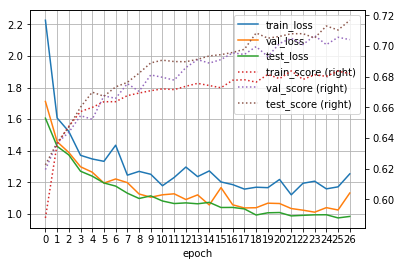

[NAME: Dense_0, EPOCH: 27]
> Train...
> Validation...
주야              0.705263
요일              0.124031
사망자수            0.946025
사상자수            0.780271
중상자수            0.841805
경상자수            0.871783
부상신고자수          0.978441
발생지시도           0.543253
발생지시군구          0.095563
사고유형_대분류        0.983165
사고유형_중분류        0.561056
법규위반            0.786667
도로형태_대분류        0.955882
도로형태            0.835206
당사자종별_1당_대분류    0.537906
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.682927
요일              0.140000
사망자수            0.967931
사상자수            0.820678
중상자수            0.868326
경상자수            0.851964
부상신고자수          0.974482
발생지시도           0.580858
발생지시군구          0.124000
사고유형_대분류        0.988372
사고유형_중분류        0.548276
법규위반            0.782313
도로형태_대분류        0.968966
도로형태            0.828467
당사자종별_1당_대분류    0.560137
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.155 num_loss: 0.3239 cat_loss: 0.8306
score: 0.6846 num_score: 0

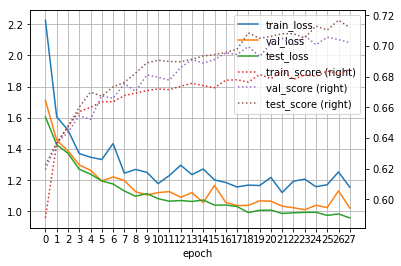

[NAME: Dense_0, EPOCH: 28]
> Train...
> Validation...
주야              0.691228
요일              0.135659
사망자수            0.944327
사상자수            0.810299
중상자수            0.852578
경상자수            0.872664
부상신고자수          0.978441
발생지시도           0.546713
발생지시군구          0.119454
사고유형_대분류        0.986532
사고유형_중분류        0.577558
법규위반            0.790000
도로형태_대분류        0.948529
도로형태            0.808989
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.738676
요일              0.143333
사망자수            0.963047
사상자수            0.828385
중상자수            0.871376
경상자수            0.852782
부상신고자수          0.974482
발생지시도           0.570957
발생지시군구          0.120000
사고유형_대분류        0.992248
사고유형_중분류        0.589655
법규위반            0.768707
도로형태_대분류        0.975862
도로형태            0.857664
당사자종별_1당_대분류    0.539519
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.142 num_loss: 0.3123 cat_loss: 0.8302
score: 0.685 num_score: 0.

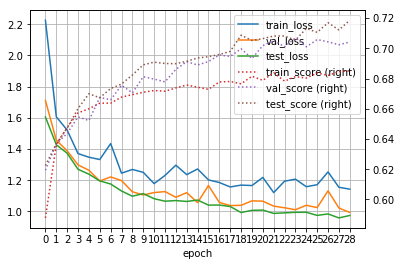

[NAME: Dense_0, EPOCH: 29]
> Train...
> Validation...
주야              0.680702
요일              0.139535
사망자수            0.951050
사상자수            0.806935
중상자수            0.847671
경상자수            0.863850
부상신고자수          0.978441
발생지시도           0.532872
발생지시군구          0.098976
사고유형_대분류        0.973064
사고유형_중분류        0.587459
법규위반            0.796667
도로형태_대분류        0.970588
도로형태            0.835206
당사자종별_1당_대분류    0.530686
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.116667
사망자수            0.968637
사상자수            0.837526
중상자수            0.874698
경상자수            0.847937
부상신고자수          0.974482
발생지시도           0.577558
발생지시군구          0.140000
사고유형_대분류        1.000000
사고유형_중분류        0.579310
법규위반            0.775510
도로형태_대분류        0.962069
도로형태            0.832117
당사자종별_1당_대분류    0.563574
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.126 num_loss: 0.2971 cat_loss: 0.8289
score: 0.6851 num_score: 0

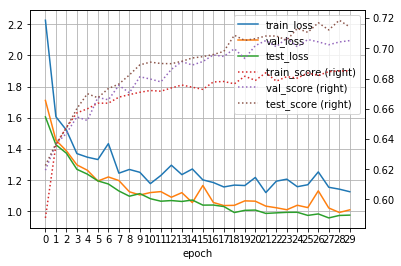

[NAME: Dense_1, EPOCH: 0]
> Train...
> Validation...
주야              0.600000
요일              0.139535
사망자수            0.855154
사상자수            0.693317
중상자수            0.826527
경상자수            0.870799
부상신고자수          0.978441
발생지시도           0.193772
발생지시군구          0.023891
사고유형_대분류        0.949495
사고유형_중분류        0.399340
법규위반            0.713333
도로형태_대분류        0.908088
도로형태            0.756554
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.680921
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.130000
사망자수            0.880990
사상자수            0.667735
중상자수            0.827257
경상자수            0.842254
부상신고자수          0.974482
발생지시도           0.174917
발생지시군구          0.036000
사고유형_대분류        0.957364
사고유형_중분류        0.379310
법규위반            0.693878
도로형태_대분류        0.868966
도로형태            0.770073
당사자종별_1당_대분류    0.432990
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 2.11 num_loss: 0.4873 cat_loss: 1.623
score: 0.5859 num_score: 0.83

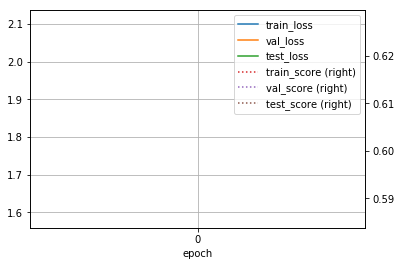

[NAME: Dense_1, EPOCH: 1]
> Train...
> Validation...
주야              0.578947
요일              0.124031
사망자수            0.882719
사상자수            0.636156
중상자수            0.805315
경상자수            0.866915
부상신고자수          0.978441
발생지시도           0.287197
발생지시군구          0.051195
사고유형_대분류        0.932660
사고유형_중분류        0.415842
법규위반            0.740000
도로형태_대분류        0.893382
도로형태            0.749064
당사자종별_1당_대분류    0.393502
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.592334
요일              0.146667
사망자수            0.919693
사상자수            0.605649
중상자수            0.830800
경상자수            0.837990
부상신고자수          0.974482
발생지시도           0.382838
발생지시군구          0.076000
사고유형_대분류        0.961240
사고유형_중분류        0.465517
법규위반            0.710884
도로형태_대분류        0.868966
도로형태            0.722628
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.54 num_loss: 0.4368 cat_loss: 1.103
score: 0.6336 num_score: 0.84

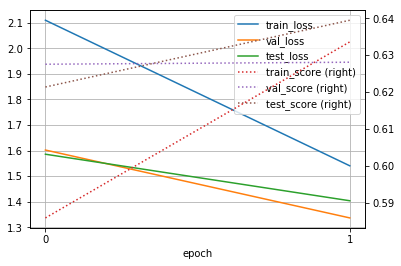

[NAME: Dense_1, EPOCH: 2]
> Train...
> Validation...
주야              0.568421
요일              0.139535
사망자수            0.895811
사상자수            0.660945
중상자수            0.816581
경상자수            0.859123
부상신고자수          0.978441
발생지시도           0.335640
발생지시군구          0.064846
사고유형_대분류        0.946128
사고유형_중분류        0.415842
법규위반            0.730000
도로형태_대분류        0.893382
도로형태            0.775281
당사자종별_1당_대분류    0.397112
당사자종별_2당_대분류    0.664474
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.186667
사망자수            0.918509
사상자수            0.658927
중상자수            0.828335
경상자수            0.841799
부상신고자수          0.974482
발생지시도           0.405941
발생지시군구          0.088000
사고유형_대분류        0.965116
사고유형_중분류        0.451724
법규위반            0.731293
도로형태_대분류        0.896552
도로형태            0.726277
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.427 num_loss: 0.475 cat_loss: 0.9517
score: 0.6466 num_score: 0.8

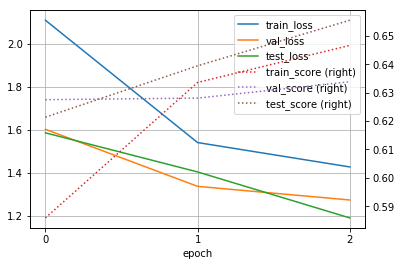

[NAME: Dense_1, EPOCH: 3]
> Train...
> Validation...
주야              0.582456
요일              0.147287
사망자수            0.931852
사상자수            0.747086
중상자수            0.828731
경상자수            0.857633
부상신고자수          0.978441
발생지시도           0.439446
발생지시군구          0.058020
사고유형_대분류        0.939394
사고유형_중분류        0.442244
법규위반            0.736667
도로형태_대분류        0.919118
도로형태            0.794007
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.671053
Name: score, dtype: float64
> Test...
주야              0.533101
요일              0.163333
사망자수            0.937019
사상자수            0.721819
중상자수            0.835876
경상자수            0.847454
부상신고자수          0.974482
발생지시도           0.445545
발생지시군구          0.088000
사고유형_대분류        0.976744
사고유형_중분류        0.441379
법규위반            0.721088
도로형태_대분류        0.906897
도로형태            0.744526
당사자종별_1당_대분류    0.388316
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.426 num_loss: 0.5427 cat_loss: 0.8837
score: 0.6556 num_score: 0.

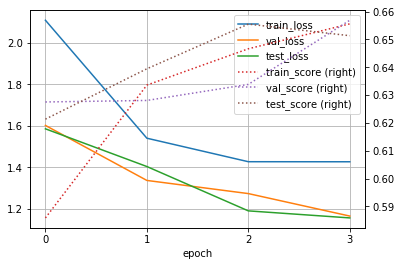

[NAME: Dense_1, EPOCH: 4]
> Train...
> Validation...
주야              0.561404
요일              0.193798
사망자수            0.926009
사상자수            0.755197
중상자수            0.819700
경상자수            0.860729
부상신고자수          0.978441
발생지시도           0.519031
발생지시군구          0.075085
사고유형_대분류        0.956229
사고유형_중분류        0.452145
법규위반            0.756667
도로형태_대분류        0.911765
도로형태            0.782772
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.667763
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.170000
사망자수            0.942605
사상자수            0.775117
중상자수            0.825450
경상자수            0.842779
부상신고자수          0.974482
발생지시도           0.491749
발생지시군구          0.088000
사고유형_대분류        0.972868
사고유형_중분류        0.455172
법규위반            0.727891
도로형태_대분류        0.906897
도로형태            0.766423
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.325 num_loss: 0.483 cat_loss: 0.8423
score: 0.6622 num_score: 0.8

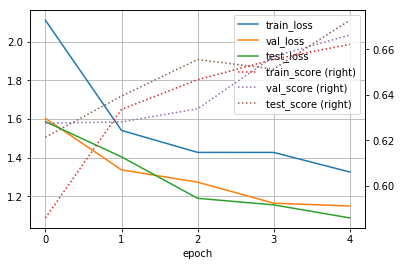

[NAME: Dense_1, EPOCH: 5]
> Train...
> Validation...
주야              0.617544
요일              0.143411
사망자수            0.949501
사상자수            0.763328
중상자수            0.832727
경상자수            0.860846
부상신고자수          0.978441
발생지시도           0.494810
발생지시군구          0.071672
사고유형_대분류        0.959596
사고유형_중분류        0.448845
법규위반            0.756667
도로형태_대분류        0.904412
도로형태            0.767790
당사자종별_1당_대분류    0.418773
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.623693
요일              0.186667
사망자수            0.959878
사상자수            0.745524
중상자수            0.836770
경상자수            0.848978
부상신고자수          0.974482
발생지시도           0.564356
발생지시군구          0.084000
사고유형_대분류        0.968992
사고유형_중분류        0.468966
법규위반            0.724490
도로형태_대분류        0.920690
도로형태            0.759124
당사자종별_1당_대분류    0.460481
당사자종별_2당_대분류    0.681818
Name: score, dtype: float64
[train] loss: 1.282 num_loss: 0.4622 cat_loss: 0.8203
score: 0.6646 num_score: 0.

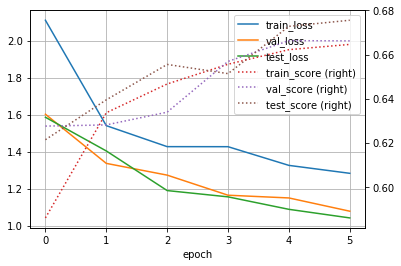

[NAME: Dense_1, EPOCH: 6]
> Train...
> Validation...
주야              0.631579
요일              0.151163
사망자수            0.917761
사상자수            0.717220
중상자수            0.816364
경상자수            0.857075
부상신고자수          0.978441
발생지시도           0.515571
발생지시군구          0.081911
사고유형_대분류        0.969697
사고유형_중분류        0.438944
법규위반            0.756667
도로형태_대분류        0.922794
도로형태            0.808989
당사자종별_1당_대분류    0.447653
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.630662
요일              0.220000
사망자수            0.930428
사상자수            0.752250
중상자수            0.845625
경상자수            0.845114
부상신고자수          0.974482
발생지시도           0.603960
발생지시군구          0.116000
사고유형_대분류        0.980620
사고유형_중분류        0.496552
법규위반            0.738095
도로형태_대분류        0.913793
도로형태            0.759124
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.209 num_loss: 0.4102 cat_loss: 0.7985
score: 0.6689 num_score: 0.

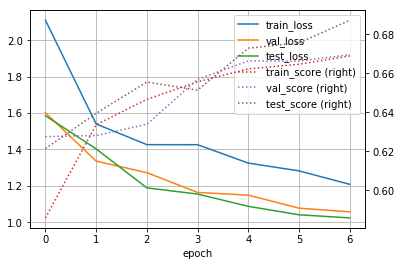

[NAME: Dense_1, EPOCH: 7]
> Train...
> Validation...
주야              0.571930
요일              0.201550
사망자수            0.924932
사상자수            0.753829
중상자수            0.822342
경상자수            0.860425
부상신고자수          0.978441
발생지시도           0.577855
발생지시군구          0.085324
사고유형_대분류        0.976431
사고유형_중분류        0.455446
법규위반            0.746667
도로형태_대분류        0.919118
도로형태            0.801498
당사자종별_1당_대분류    0.465704
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.641115
요일              0.180000
사망자수            0.929355
사상자수            0.790477
중상자수            0.857038
경상자수            0.842311
부상신고자수          0.974482
발생지시도           0.607261
발생지시군구          0.116000
사고유형_대분류        0.988372
사고유형_중분류        0.493103
법규위반            0.758503
도로형태_대분류        0.903448
도로형태            0.751825
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.162 num_loss: 0.3802 cat_loss: 0.7823
score: 0.671 num_score: 0.8

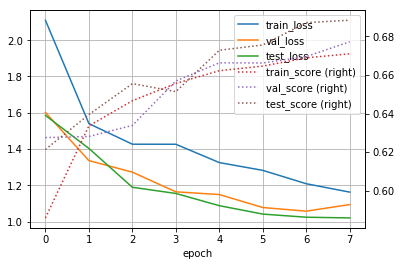

[NAME: Dense_1, EPOCH: 8]
> Train...
> Validation...
주야              0.659649
요일              0.220930
사망자수            0.937998
사상자수            0.770151
중상자수            0.830294
경상자수            0.863461
부상신고자수          0.978441
발생지시도           0.570934
발생지시군구          0.071672
사고유형_대분류        0.959596
사고유형_중분류        0.524752
법규위반            0.726667
도로형태_대분류        0.919118
도로형태            0.790262
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.667763
Name: score, dtype: float64
> Test...
주야              0.648084
요일              0.193333
사망자수            0.956539
사상자수            0.797117
중상자수            0.831087
경상자수            0.844247
부상신고자수          0.974482
발생지시도           0.607261
발생지시군구          0.136000
사고유형_대분류        0.992248
사고유형_중분류        0.451724
법규위반            0.765306
도로형태_대분류        0.917241
도로형태            0.770073
당사자종별_1당_대분류    0.501718
당사자종별_2당_대분류    0.744755
Name: score, dtype: float64
[train] loss: 1.197 num_loss: 0.4259 cat_loss: 0.7713
score: 0.6766 num_score: 0.

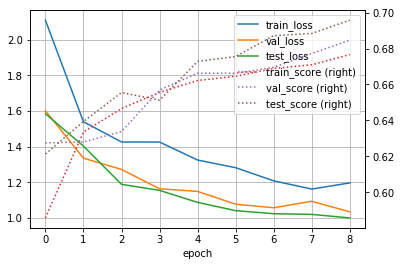

[NAME: Dense_1, EPOCH: 9]
> Train...
> Validation...
주야              0.571930
요일              0.174419
사망자수            0.945948
사상자수            0.779808
중상자수            0.825681
경상자수            0.853104
부상신고자수          0.978441
발생지시도           0.608997
발생지시군구          0.102389
사고유형_대분류        0.952862
사고유형_중분류        0.481848
법규위반            0.753333
도로형태_대분류        0.919118
도로형태            0.767790
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.644599
요일              0.170000
사망자수            0.953959
사상자수            0.772260
중상자수            0.836269
경상자수            0.841967
부상신고자수          0.974482
발생지시도           0.633663
발생지시군구          0.120000
사고유형_대분류        0.984496
사고유형_중분류        0.503448
법규위반            0.775510
도로형태_대분류        0.910345
도로형태            0.755474
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.727273
Name: score, dtype: float64
[train] loss: 1.109 num_loss: 0.3439 cat_loss: 0.7655
score: 0.6757 num_score: 0.

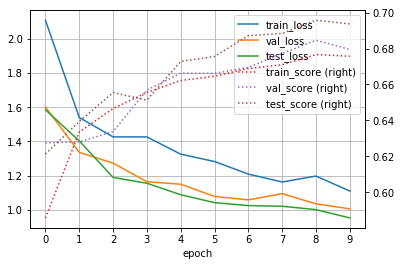

[NAME: Dense_1, EPOCH: 10]
> Train...
> Validation...
주야              0.621053
요일              0.189922
사망자수            0.950136
사상자수            0.795082
중상자수            0.831452
경상자수            0.862746
부상신고자수          0.978441
발생지시도           0.598616
발생지시군구          0.085324
사고유형_대분류        0.966330
사고유형_중분류        0.488449
법규위반            0.766667
도로형태_대분류        0.926471
도로형태            0.779026
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.684211
Name: score, dtype: float64
> Test...
주야              0.682927
요일              0.173333
사망자수            0.962958
사상자수            0.771557
중상자수            0.815008
경상자수            0.843433
부상신고자수          0.974482
발생지시도           0.653465
발생지시군구          0.116000
사고유형_대분류        0.980620
사고유형_중분류        0.513793
법규위반            0.748299
도로형태_대분류        0.920690
도로형태            0.784672
당사자종별_1당_대분류    0.505155
당사자종별_2당_대분류    0.727273
Name: score, dtype: float64
[train] loss: 1.049 num_loss: 0.2937 cat_loss: 0.7552
score: 0.6767 num_score: 0

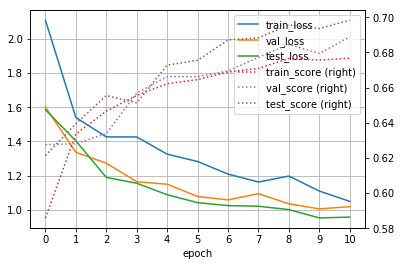

[NAME: Dense_1, EPOCH: 11]
> Train...
> Validation...
주야              0.673684
요일              0.197674
사망자수            0.951560
사상자수            0.769085
중상자수            0.839791
경상자수            0.858228
부상신고자수          0.978441
발생지시도           0.615917
발생지시군구          0.078498
사고유형_대분류        0.976431
사고유형_중분류        0.495050
법규위반            0.786667
도로형태_대분류        0.926471
도로형태            0.816479
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.662021
요일              0.186667
사망자수            0.967165
사상자수            0.783516
중상자수            0.825937
경상자수            0.848788
부상신고자수          0.974482
발생지시도           0.643564
발생지시군구          0.116000
사고유형_대분류        0.992248
사고유형_중분류        0.468966
법규위반            0.748299
도로형태_대분류        0.906897
도로형태            0.795620
당사자종별_1당_대분류    0.491409
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.105 num_loss: 0.3574 cat_loss: 0.7473
score: 0.6784 num_score: 0

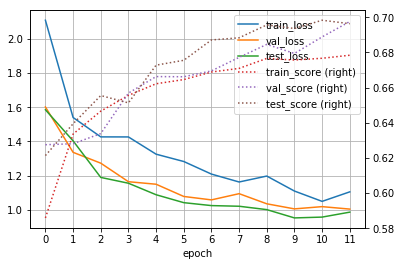

[NAME: Dense_1, EPOCH: 12]
> Train...
> Validation...
주야              0.652632
요일              0.193798
사망자수            0.942354
사상자수            0.760259
중상자수            0.835450
경상자수            0.864707
부상신고자수          0.978441
발생지시도           0.629758
발생지시군구          0.064846
사고유형_대분류        0.976431
사고유형_중분류        0.528053
법규위반            0.740000
도로형태_대분류        0.930147
도로형태            0.779026
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.206667
사망자수            0.964118
사상자수            0.803595
중상자수            0.849767
경상자수            0.851622
부상신고자수          0.974482
발생지시도           0.656766
발생지시군구          0.132000
사고유형_대분류        0.976744
사고유형_중분류        0.524138
법규위반            0.758503
도로형태_대분류        0.931034
도로형태            0.781022
당사자종별_1당_대분류    0.501718
당사자종별_2당_대분류    0.737762
Name: score, dtype: float64
[train] loss: 1.071 num_loss: 0.3273 cat_loss: 0.744
score: 0.6811 num_score: 0.

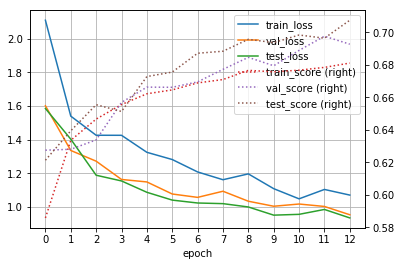

[NAME: Dense_1, EPOCH: 13]
> Train...
> Validation...
주야              0.677193
요일              0.197674
사망자수            0.950673
사상자수            0.812908
중상자수            0.833240
경상자수            0.860181
부상신고자수          0.978441
발생지시도           0.640138
발생지시군구          0.075085
사고유형_대분류        0.962963
사고유형_중분류        0.508251
법규위반            0.750000
도로형태_대분류        0.937500
도로형태            0.801498
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.730263
Name: score, dtype: float64
> Test...
주야              0.675958
요일              0.196667
사망자수            0.964017
사상자수            0.797309
중상자수            0.845841
경상자수            0.849024
부상신고자수          0.974482
발생지시도           0.693069
발생지시군구          0.128000
사고유형_대분류        0.984496
사고유형_중분류        0.468966
법규위반            0.778912
도로형태_대분류        0.931034
도로형태            0.806569
당사자종별_1당_대분류    0.515464
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.181 num_loss: 0.4439 cat_loss: 0.7367
score: 0.6817 num_score: 0

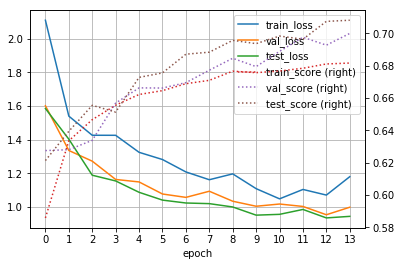

[NAME: Dense_1, EPOCH: 14]
> Train...
> Validation...
주야              0.691228
요일              0.174419
사망자수            0.946603
사상자수            0.794455
중상자수            0.839509
경상자수            0.860264
부상신고자수          0.978441
발생지시도           0.657439
발생지시군구          0.102389
사고유형_대분류        0.979798
사고유형_중분류        0.531353
법규위반            0.776667
도로형태_대분류        0.937500
도로형태            0.801498
당사자종별_1당_대분류    0.527076
당사자종별_2당_대분류    0.743421
Name: score, dtype: float64
> Test...
주야              0.655052
요일              0.183333
사망자수            0.960728
사상자수            0.788911
중상자수            0.846084
경상자수            0.848885
부상신고자수          0.974482
발생지시도           0.666667
발생지시군구          0.108000
사고유형_대분류        0.988372
사고유형_중분류        0.503448
법규위반            0.755102
도로형태_대분류        0.910345
도로형태            0.781022
당사자종별_1당_대분류    0.529210
당사자종별_2당_대분류    0.734266
Name: score, dtype: float64
[train] loss: 1.057 num_loss: 0.3212 cat_loss: 0.7361
score: 0.6833 num_score: 0

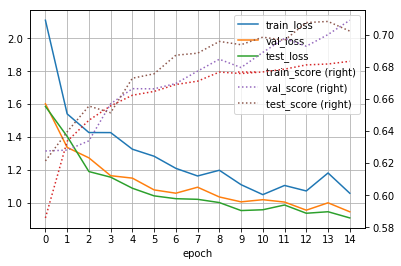

[NAME: Dense_1, EPOCH: 15]
> Train...
> Validation...
주야              0.617544
요일              0.205426
사망자수            0.942061
사상자수            0.790205
중상자수            0.840833
경상자수            0.850170
부상신고자수          0.978441
발생지시도           0.650519
발생지시군구          0.068259
사고유형_대분류        0.989899
사고유형_중분류        0.518152
법규위반            0.756667
도로형태_대분류        0.908088
도로형태            0.764045
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.675958
요일              0.183333
사망자수            0.968199
사상자수            0.810735
중상자수            0.844862
경상자수            0.843394
부상신고자수          0.974482
발생지시도           0.666667
발생지시군구          0.112000
사고유형_대분류        0.992248
사고유형_중분류        0.513793
법규위반            0.782313
도로형태_대분류        0.927586
도로형태            0.791971
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.741259
Name: score, dtype: float64
[train] loss: 1.103 num_loss: 0.3732 cat_loss: 0.7298
score: 0.6828 num_score: 0

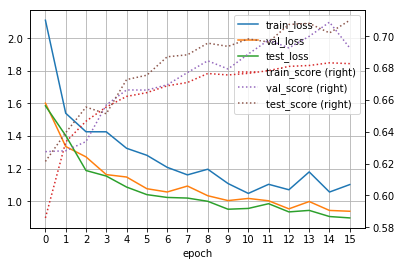

[NAME: Dense_1, EPOCH: 16]
> Train...
> Validation...
주야              0.635088
요일              0.178295
사망자수            0.944652
사상자수            0.747809
중상자수            0.831910
경상자수            0.865479
부상신고자수          0.978441
발생지시도           0.650519
발생지시군구          0.081911
사고유형_대분류        0.969697
사고유형_중분류        0.547855
법규위반            0.786667
도로형태_대분류        0.922794
도로형태            0.775281
당사자종별_1당_대분류    0.454874
당사자종별_2당_대분류    0.743421
Name: score, dtype: float64
> Test...
주야              0.693380
요일              0.210000
사망자수            0.963437
사상자수            0.789651
중상자수            0.866691
경상자수            0.841883
부상신고자수          0.974482
발생지시도           0.686469
발생지시군구          0.112000
사고유형_대분류        0.984496
사고유형_중분류        0.520690
법규위반            0.761905
도로형태_대분류        0.924138
도로형태            0.777372
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.765734
Name: score, dtype: float64
[train] loss: 1.092 num_loss: 0.3639 cat_loss: 0.7279
score: 0.6837 num_score: 0

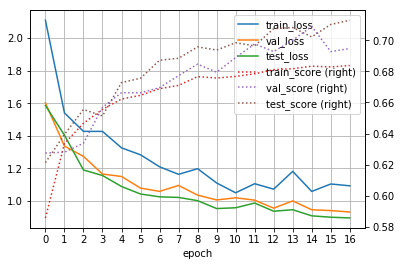

[NAME: Dense_1, EPOCH: 17]
> Train...
> Validation...
주야              0.687719
요일              0.186047
사망자수            0.947918
사상자수            0.802468
중상자수            0.834875
경상자수            0.884107
부상신고자수          0.978441
발생지시도           0.660900
발생지시군구          0.078498
사고유형_대분류        0.983165
사고유형_중분류        0.521452
법규위반            0.783333
도로형태_대분류        0.941176
도로형태            0.786517
당사자종별_1당_대분류    0.537906
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.693380
요일              0.176667
사망자수            0.965787
사상자수            0.807192
중상자수            0.858386
경상자수            0.850056
부상신고자수          0.974482
발생지시도           0.686469
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.496552
법규위반            0.761905
도로형태_대분류        0.931034
도로형태            0.802920
당사자종별_1당_대분류    0.549828
당사자종별_2당_대분류    0.741259
Name: score, dtype: float64
[train] loss: 1.07 num_loss: 0.3443 cat_loss: 0.7256
score: 0.6858 num_score: 0.

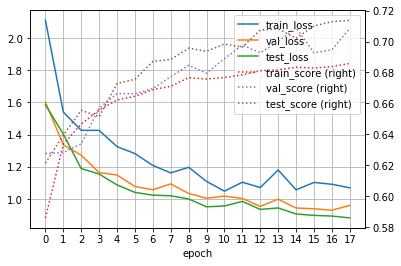

[NAME: Dense_1, EPOCH: 18]
> Train...
> Validation...
주야              0.673684
요일              0.201550
사망자수            0.949536
사상자수            0.814467
중상자수            0.839041
경상자수            0.873237
부상신고자수          0.978441
발생지시도           0.647059
발생지시군구          0.081911
사고유형_대분류        0.986532
사고유형_중분류        0.524752
법규위반            0.773333
도로형태_대분류        0.933824
도로형태            0.779026
당사자종별_1당_대분류    0.490975
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.696864
요일              0.223333
사망자수            0.964749
사상자수            0.821584
중상자수            0.861139
경상자수            0.845453
부상신고자수          0.974482
발생지시도           0.689769
발생지시군구          0.128000
사고유형_대분류        0.996124
사고유형_중분류        0.562069
법규위반            0.772109
도로형태_대분류        0.924138
도로형태            0.784672
당사자종별_1당_대분류    0.501718
당사자종별_2당_대분류    0.751748
Name: score, dtype: float64
[train] loss: 1.082 num_loss: 0.3586 cat_loss: 0.7239
score: 0.6852 num_score: 0

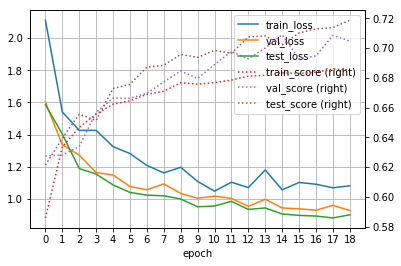

[NAME: Dense_1, EPOCH: 19]
> Train...
> Validation...
주야              0.656140
요일              0.201550
사망자수            0.947769
사상자수            0.807159
중상자수            0.822229
경상자수            0.868877
부상신고자수          0.978441
발생지시도           0.678201
발생지시군구          0.085324
사고유형_대분류        0.973064
사고유형_중분류        0.551155
법규위반            0.766667
도로형태_대분류        0.926471
도로형태            0.797753
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.690789
Name: score, dtype: float64
> Test...
주야              0.675958
요일              0.206667
사망자수            0.966907
사상자수            0.803309
중상자수            0.850964
경상자수            0.843743
부상신고자수          0.974482
발생지시도           0.706271
발생지시군구          0.132000
사고유형_대분류        0.988372
사고유형_중분류        0.541379
법규위반            0.778912
도로형태_대분류        0.937931
도로형태            0.784672
당사자종별_1당_대분류    0.556701
당사자종별_2당_대분류    0.748252
Name: score, dtype: float64
[train] loss: 1.044 num_loss: 0.3228 cat_loss: 0.7211
score: 0.6861 num_score: 0

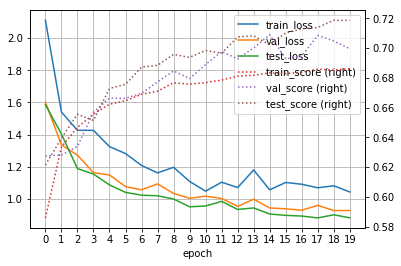

[NAME: Dense_1, EPOCH: 20]
> Train...
> Validation...
주야              0.694737
요일              0.189922
사망자수            0.948668
사상자수            0.793745
중상자수            0.834204
경상자수            0.879915
부상신고자수          0.978441
발생지시도           0.685121
발생지시군구          0.078498
사고유형_대분류        0.976431
사고유형_중분류        0.537954
법규위반            0.760000
도로형태_대분류        0.930147
도로형태            0.790262
당사자종별_1당_대분류    0.509025
당사자종별_2당_대분류    0.753289
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.210000
사망자수            0.967818
사상자수            0.818116
중상자수            0.851942
경상자수            0.843347
부상신고자수          0.974482
발생지시도           0.683168
발생지시군구          0.140000
사고유형_대분류        0.992248
사고유형_중분류        0.565517
법규위반            0.782313
도로형태_대분류        0.941379
도로형태            0.824818
당사자종별_1당_대분류    0.563574
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.15 num_loss: 0.4322 cat_loss: 0.7181
score: 0.6852 num_score: 0.

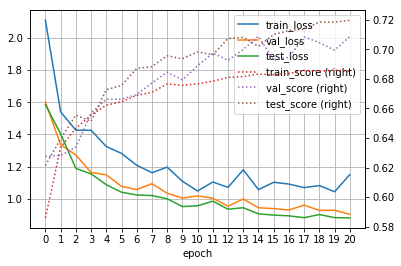

[NAME: Dense_1, EPOCH: 21]
> Train...
> Validation...
주야              0.663158
요일              0.155039
사망자수            0.946406
사상자수            0.781230
중상자수            0.834247
경상자수            0.870645
부상신고자수          0.978441
발생지시도           0.671280
발생지시군구          0.088737
사고유형_대분류        0.996633
사고유형_중분류        0.541254
법규위반            0.766667
도로형태_대분류        0.930147
도로형태            0.808989
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.746711
Name: score, dtype: float64
> Test...
주야              0.655052
요일              0.216667
사망자수            0.969992
사상자수            0.816578
중상자수            0.862884
경상자수            0.864860
부상신고자수          0.974482
발생지시도           0.693069
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.534483
법규위반            0.785714
도로형태_대분류        0.948276
도로형태            0.821168
당사자종별_1당_대분류    0.549828
당사자종별_2당_대분류    0.751748
Name: score, dtype: float64
[train] loss: 1.033 num_loss: 0.3169 cat_loss: 0.716
score: 0.6881 num_score: 0.

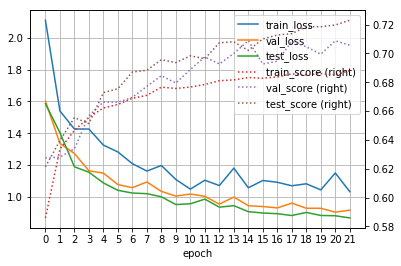

[NAME: Dense_1, EPOCH: 22]
> Train...
> Validation...
주야              0.656140
요일              0.182171
사망자수            0.948089
사상자수            0.785119
중상자수            0.841737
경상자수            0.869967
부상신고자수          0.978441
발생지시도           0.681661
발생지시군구          0.088737
사고유형_대분류        0.973064
사고유형_중분류        0.534653
법규위반            0.766667
도로형태_대분류        0.933824
도로형태            0.827715
당사자종별_1당_대분류    0.490975
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.749129
요일              0.173333
사망자수            0.964361
사상자수            0.816758
중상자수            0.844523
경상자수            0.845211
부상신고자수          0.974482
발생지시도           0.716172
발생지시군구          0.128000
사고유형_대분류        0.996124
사고유형_중분류        0.503448
법규위반            0.765306
도로형태_대분류        0.920690
도로형태            0.784672
당사자종별_1당_대분류    0.580756
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.202 num_loss: 0.4878 cat_loss: 0.7137
score: 0.6886 num_score: 0

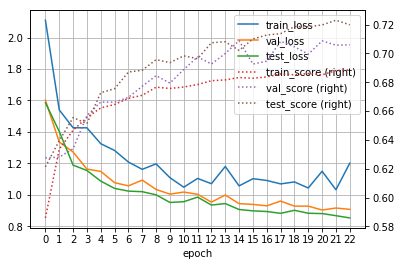

[NAME: Dense_1, EPOCH: 23]
> Train...
> Validation...
주야              0.649123
요일              0.155039
사망자수            0.949401
사상자수            0.781378
중상자수            0.842014
경상자수            0.857761
부상신고자수          0.978441
발생지시도           0.667820
발생지시군구          0.098976
사고유형_대분류        0.966330
사고유형_중분류        0.547855
법규위반            0.760000
도로형태_대분류        0.915441
도로형태            0.786517
당사자종별_1당_대분류    0.505415
당사자종별_2당_대분류    0.750000
Name: score, dtype: float64
> Test...
주야              0.682927
요일              0.193333
사망자수            0.962715
사상자수            0.787037
중상자수            0.861851
경상자수            0.847497
부상신고자수          0.974482
발생지시도           0.689769
발생지시군구          0.108000
사고유형_대분류        0.996124
사고유형_중분류        0.537931
법규위반            0.782313
도로형태_대분류        0.934483
도로형태            0.828467
당사자종별_1당_대분류    0.542955
당사자종별_2당_대분류    0.737762
Name: score, dtype: float64
[train] loss: 0.9653 num_loss: 0.2533 cat_loss: 0.712
score: 0.6883 num_score: 0

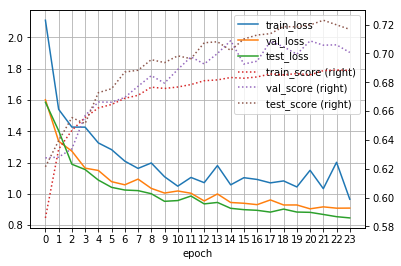

[NAME: Dense_1, EPOCH: 24]
> Train...
> Validation...
주야              0.687719
요일              0.186047
사망자수            0.947033
사상자수            0.778206
중상자수            0.837054
경상자수            0.863342
부상신고자수          0.978441
발생지시도           0.688581
발생지시군구          0.095563
사고유형_대분류        0.983165
사고유형_중분류        0.547855
법규위반            0.766667
도로형태_대분류        0.930147
도로형태            0.812734
당사자종별_1당_대분류    0.519856
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.675958
요일              0.213333
사망자수            0.967766
사상자수            0.798872
중상자수            0.847559
경상자수            0.850877
부상신고자수          0.974482
발생지시도           0.729373
발생지시군구          0.104000
사고유형_대분류        0.992248
사고유형_중분류        0.555172
법규위반            0.768707
도로형태_대분류        0.927586
도로형태            0.799270
당사자종별_1당_대분류    0.501718
당사자종별_2당_대분류    0.751748
Name: score, dtype: float64
[train] loss: 1.036 num_loss: 0.3266 cat_loss: 0.7094
score: 0.6881 num_score: 0

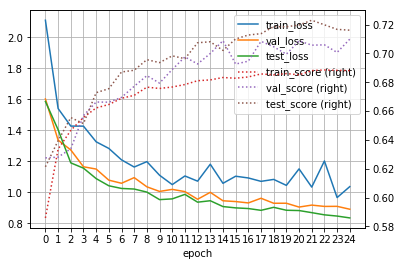

[NAME: Dense_1, EPOCH: 25]
> Train...
> Validation...
주야              0.698246
요일              0.217054
사망자수            0.956260
사상자수            0.799265
중상자수            0.838359
경상자수            0.874006
부상신고자수          0.978441
발생지시도           0.712803
발생지시군구          0.102389
사고유형_대분류        0.979798
사고유형_중분류        0.564356
법규위반            0.786667
도로형태_대분류        0.937500
도로형태            0.812734
당사자종별_1당_대분류    0.519856
당사자종별_2당_대분류    0.750000
Name: score, dtype: float64
> Test...
주야              0.672474
요일              0.166667
사망자수            0.963844
사상자수            0.818780
중상자수            0.858841
경상자수            0.853991
부상신고자수          0.974482
발생지시도           0.699670
발생지시군구          0.096000
사고유형_대분류        0.988372
사고유형_중분류        0.541379
법규위반            0.772109
도로형태_대분류        0.934483
도로형태            0.781022
당사자종별_1당_대분류    0.505155
당사자종별_2당_대분류    0.748252
Name: score, dtype: float64
[train] loss: 1.035 num_loss: 0.3253 cat_loss: 0.7096
score: 0.6893 num_score: 0

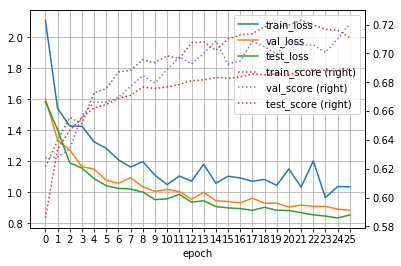

[NAME: Dense_1, EPOCH: 26]
> Train...
> Validation...
주야              0.656140
요일              0.251938
사망자수            0.953343
사상자수            0.821623
중상자수            0.844461
경상자수            0.865315
부상신고자수          0.978441
발생지시도           0.674740
발생지시군구          0.112628
사고유형_대분류        0.973064
사고유형_중분류        0.600660
법규위반            0.796667
도로형태_대분류        0.952206
도로형태            0.808989
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.750000
Name: score, dtype: float64
> Test...
주야              0.679443
요일              0.196667
사망자수            0.970175
사상자수            0.822435
중상자수            0.869198
경상자수            0.852856
부상신고자수          0.974482
발생지시도           0.702970
발생지시군구          0.140000
사고유형_대분류        0.996124
사고유형_중분류        0.555172
법규위반            0.765306
도로형태_대분류        0.944828
도로형태            0.828467
당사자종별_1당_대분류    0.549828
당사자종별_2당_대분류    0.758741
Name: score, dtype: float64
[train] loss: 1.051 num_loss: 0.3439 cat_loss: 0.7066
score: 0.69 num_score: 0.8

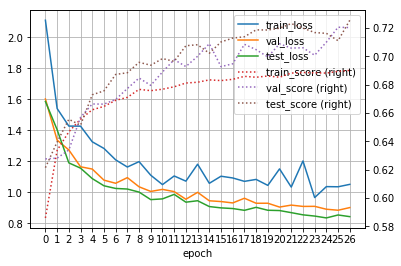

[NAME: Dense_1, EPOCH: 27]
> Train...
> Validation...
주야              0.719298
요일              0.170543
사망자수            0.947870
사상자수            0.798401
중상자수            0.833865
경상자수            0.871487
부상신고자수          0.978441
발생지시도           0.712803
발생지시군구          0.092150
사고유형_대분류        0.976431
사고유형_중분류        0.544554
법규위반            0.796667
도로형태_대분류        0.944853
도로형태            0.827715
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.733553
Name: score, dtype: float64
> Test...
주야              0.735192
요일              0.203333
사망자수            0.966299
사상자수            0.824184
중상자수            0.851255
경상자수            0.851258
부상신고자수          0.974482
발생지시도           0.712871
발생지시군구          0.128000
사고유형_대분류        0.988372
사고유형_중분류        0.575862
법규위반            0.765306
도로형태_대분류        0.937931
도로형태            0.824818
당사자종별_1당_대분류    0.580756
당사자종별_2당_대분류    0.748252
Name: score, dtype: float64
[train] loss: 1.07 num_loss: 0.3629 cat_loss: 0.7071
score: 0.6892 num_score: 0.

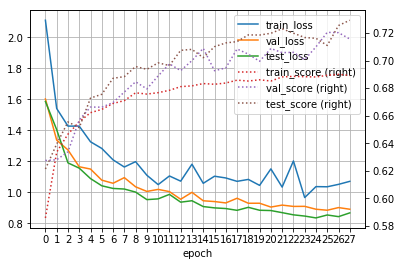

[NAME: Dense_1, EPOCH: 28]
> Train...
> Validation...
주야              0.698246
요일              0.197674
사망자수            0.954119
사상자수            0.788546
중상자수            0.843572
경상자수            0.871173
부상신고자수          0.978441
발생지시도           0.688581
발생지시군구          0.095563
사고유형_대분류        0.986532
사고유형_중분류        0.564356
법규위반            0.816667
도로형태_대분류        0.944853
도로형태            0.816479
당사자종별_1당_대분류    0.490975
당사자종별_2당_대분류    0.766447
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.163333
사망자수            0.965019
사상자수            0.832112
중상자수            0.856522
경상자수            0.860577
부상신고자수          0.974482
발생지시도           0.719472
발생지시군구          0.140000
사고유형_대분류        0.992248
사고유형_중분류        0.520690
법규위반            0.778912
도로형태_대분류        0.941379
도로형태            0.806569
당사자종별_1당_대분류    0.560137
당사자종별_2당_대분류    0.769231
Name: score, dtype: float64
[train] loss: 1.058 num_loss: 0.3539 cat_loss: 0.7045
score: 0.6896 num_score: 0

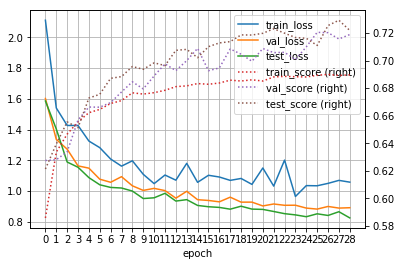

[NAME: Dense_1, EPOCH: 29]
> Train...
> Validation...
주야              0.670175
요일              0.189922
사망자수            0.951177
사상자수            0.797593
중상자수            0.846910
경상자수            0.870002
부상신고자수          0.978441
발생지시도           0.698962
발생지시군구          0.088737
사고유형_대분류        0.989899
사고유형_중분류        0.590759
법규위반            0.786667
도로형태_대분류        0.933824
도로형태            0.827715
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.753289
Name: score, dtype: float64
> Test...
주야              0.665505
요일              0.160000
사망자수            0.964923
사상자수            0.833570
중상자수            0.863291
경상자수            0.852238
부상신고자수          0.974482
발생지시도           0.716172
발생지시군구          0.144000
사고유형_대분류        0.992248
사고유형_중분류        0.503448
법규위반            0.782313
도로형태_대분류        0.937931
도로형태            0.817518
당사자종별_1당_대분류    0.539519
당사자종별_2당_대분류    0.744755
Name: score, dtype: float64
[train] loss: 1.074 num_loss: 0.3702 cat_loss: 0.7035
score: 0.6912 num_score: 0

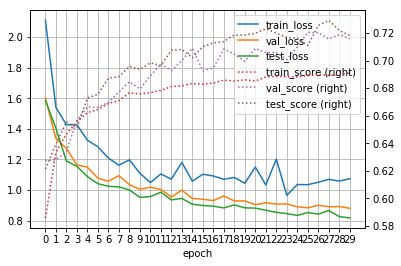

[NAME: Dense_2, EPOCH: 0]
> Train...
> Validation...
주야              0.564912
요일              0.158915
사망자수            0.860441
사상자수            0.679758
중상자수            0.827766
경상자수            0.863897
부상신고자수          0.978409
발생지시도           0.183391
발생지시군구          0.027304
사고유형_대분류        0.939394
사고유형_중분류        0.419142
법규위반            0.720000
도로형태_대분류        0.897059
도로형태            0.771536
당사자종별_1당_대분류    0.397112
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.599303
요일              0.130000
사망자수            0.880269
사상자수            0.674895
중상자수            0.826648
경상자수            0.839409
부상신고자수          0.964454
발생지시도           0.161716
발생지시군구          0.020000
사고유형_대분류        0.945736
사고유형_중분류        0.417241
법규위반            0.676871
도로형태_대분류        0.875862
도로형태            0.726277
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 2.131 num_loss: 0.537 cat_loss: 1.594
score: 0.5916 num_score: 0.83

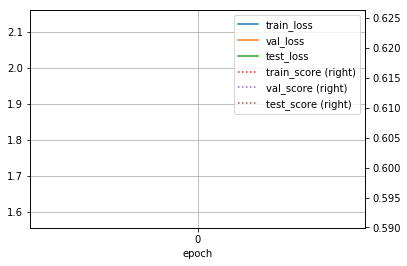

[NAME: Dense_2, EPOCH: 1]
> Train...
> Validation...
주야              0.635088
요일              0.166667
사망자수            0.895900
사상자수            0.730894
중상자수            0.820446
경상자수            0.861791
부상신고자수          0.976750
발생지시도           0.318339
발생지시군구          0.058020
사고유형_대분류        0.932660
사고유형_중분류        0.455446
법규위반            0.733333
도로형태_대분류        0.900735
도로형태            0.779026
당사자종별_1당_대분류    0.407942
당사자종별_2당_대분류    0.677632
Name: score, dtype: float64
> Test...
주야              0.613240
요일              0.163333
사망자수            0.914182
사상자수            0.700138
중상자수            0.835896
경상자수            0.833425
부상신고자수          0.971234
발생지시도           0.330033
발생지시군구          0.044000
사고유형_대분류        0.949612
사고유형_중분류        0.451724
법규위반            0.693878
도로형태_대분류        0.893103
도로형태            0.755474
당사자종별_1당_대분류    0.436426
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.559 num_loss: 0.4188 cat_loss: 1.14
score: 0.6379 num_score: 0.85

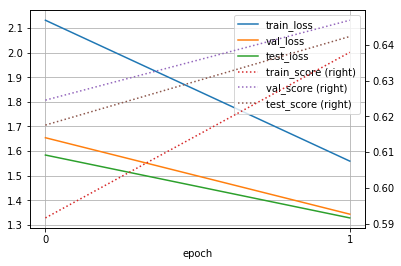

[NAME: Dense_2, EPOCH: 2]
> Train...
> Validation...
주야              0.592982
요일              0.120155
사망자수            0.893449
사상자수            0.620537
중상자수            0.833962
경상자수            0.853381
부상신고자수          0.978441
발생지시도           0.408304
발생지시군구          0.068259
사고유형_대분류        0.929293
사고유형_중분류        0.409241
법규위반            0.756667
도로형태_대분류        0.908088
도로형태            0.786517
당사자종별_1당_대분류    0.422383
당사자종별_2당_대분류    0.674342
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.193333
사망자수            0.926693
사상자수            0.687525
중상자수            0.826514
경상자수            0.842434
부상신고자수          0.974482
발생지시도           0.438944
발생지시군구          0.092000
사고유형_대분류        0.984496
사고유형_중분류        0.479310
법규위반            0.734694
도로형태_대분류        0.889655
도로형태            0.722628
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.4 num_loss: 0.4215 cat_loss: 0.9789
score: 0.6506 num_score: 0.85

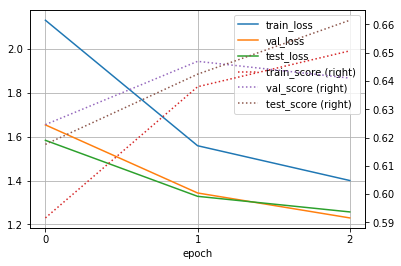

[NAME: Dense_2, EPOCH: 3]
> Train...
> Validation...
주야              0.624561
요일              0.116279
사망자수            0.933892
사상자수            0.752500
중상자수            0.816740
경상자수            0.865073
부상신고자수          0.978441
발생지시도           0.467128
발생지시군구          0.081911
사고유형_대분류        0.952862
사고유형_중분류        0.471947
법규위반            0.763333
도로형태_대분류        0.908088
도로형태            0.786517
당사자종별_1당_대분류    0.429603
당사자종별_2당_대분류    0.677632
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.143333
사망자수            0.946785
사상자수            0.714276
중상자수            0.834947
경상자수            0.830420
부상신고자수          0.974481
발생지시도           0.508251
발생지시군구          0.084000
사고유형_대분류        0.965116
사고유형_중분류        0.427586
법규위반            0.727891
도로형태_대분류        0.917241
도로형태            0.759124
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.39 num_loss: 0.4687 cat_loss: 0.9208
score: 0.6578 num_score: 0.8

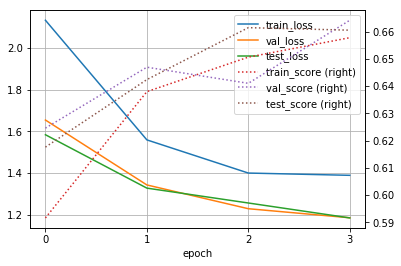

[NAME: Dense_2, EPOCH: 4]
> Train...
> Validation...
주야              0.600000
요일              0.151163
사망자수            0.937502
사상자수            0.752620
중상자수            0.808947
경상자수            0.864224
부상신고자수          0.978415
발생지시도           0.546713
발생지시군구          0.078498
사고유형_대분류        0.946128
사고유형_중분류        0.471947
법규위반            0.750000
도로형태_대분류        0.919118
도로형태            0.812734
당사자종별_1당_대분류    0.436823
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.126667
사망자수            0.953001
사상자수            0.743837
중상자수            0.843865
경상자수            0.837986
부상신고자수          0.974395
발생지시도           0.564356
발생지시군구          0.072000
사고유형_대분류        0.996124
사고유형_중분류        0.431034
법규위반            0.734694
도로형태_대분류        0.879310
도로형태            0.740876
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.349 num_loss: 0.4653 cat_loss: 0.8841
score: 0.6657 num_score: 0.

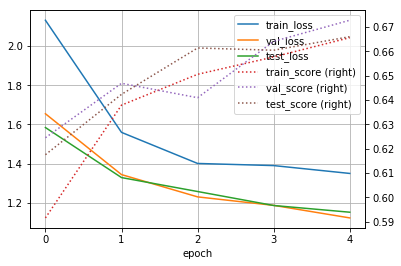

[NAME: Dense_2, EPOCH: 5]
> Train...
> Validation...
주야              0.582456
요일              0.155039
사망자수            0.941976
사상자수            0.776813
중상자수            0.808533
경상자수            0.864877
부상신고자수          0.978366
발생지시도           0.539792
발생지시군구          0.061433
사고유형_대분류        0.973064
사고유형_중분류        0.485149
법규위반            0.713333
도로형태_대분류        0.930147
도로형태            0.752809
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.651568
요일              0.143333
사망자수            0.962768
사상자수            0.780756
중상자수            0.841594
경상자수            0.847020
부상신고자수          0.971212
발생지시도           0.580858
발생지시군구          0.108000
사고유형_대분류        0.972868
사고유형_중분류        0.503448
법규위반            0.721088
도로형태_대분류        0.927586
도로형태            0.748175
당사자종별_1당_대분류    0.484536
당사자종별_2당_대분류    0.702797
Name: score, dtype: float64
[train] loss: 1.311 num_loss: 0.446 cat_loss: 0.8651
score: 0.6682 num_score: 0.8

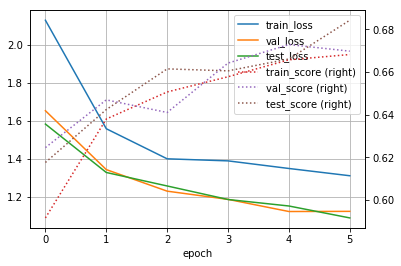

[NAME: Dense_2, EPOCH: 6]
> Train...
> Validation...
주야              0.600000
요일              0.193798
사망자수            0.949996
사상자수            0.773593
중상자수            0.825254
경상자수            0.855030
부상신고자수          0.978441
발생지시도           0.595156
발생지시군구          0.064846
사고유형_대분류        0.962963
사고유형_중분류        0.495050
법규위반            0.760000
도로형태_대분류        0.904412
도로형태            0.771536
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.623693
요일              0.153333
사망자수            0.953773
사상자수            0.793275
중상자수            0.860972
경상자수            0.847952
부상신고자수          0.974482
발생지시도           0.603960
발생지시군구          0.088000
사고유형_대분류        0.992248
사고유형_중분류        0.472414
법규위반            0.761905
도로형태_대분류        0.937931
도로형태            0.788321
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.164 num_loss: 0.3169 cat_loss: 0.847
score: 0.6714 num_score: 0.8

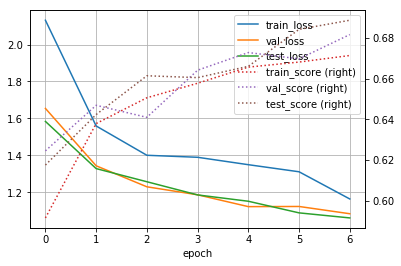

[NAME: Dense_2, EPOCH: 7]
> Train...
> Validation...
주야              0.624561
요일              0.143411
사망자수            0.953016
사상자수            0.771741
중상자수            0.823970
경상자수            0.844408
부상신고자수          0.978441
발생지시도           0.605536
발생지시군구          0.081911
사고유형_대분류        0.979798
사고유형_중분류        0.478548
법규위반            0.760000
도로형태_대분류        0.941176
도로형태            0.801498
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.196667
사망자수            0.967832
사상자수            0.776918
중상자수            0.839441
경상자수            0.848685
부상신고자수          0.974482
발생지시도           0.580858
발생지시군구          0.096000
사고유형_대분류        0.988372
사고유형_중분류        0.465517
법규위반            0.758503
도로형태_대분류        0.927586
도로형태            0.766423
당사자종별_1당_대분류    0.484536
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.179 num_loss: 0.3509 cat_loss: 0.8283
score: 0.674 num_score: 0.8

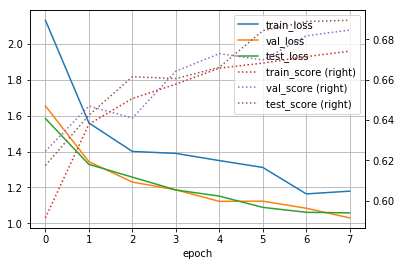

[NAME: Dense_2, EPOCH: 8]
> Train...
> Validation...
주야              0.621053
요일              0.166667
사망자수            0.944142
사상자수            0.754827
중상자수            0.810592
경상자수            0.862733
부상신고자수          0.978441
발생지시도           0.619377
발생지시군구          0.092150
사고유형_대분류        0.959596
사고유형_중분류        0.514851
법규위반            0.753333
도로형태_대분류        0.937500
도로형태            0.764045
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.730263
Name: score, dtype: float64
> Test...
주야              0.651568
요일              0.190000
사망자수            0.953785
사상자수            0.765291
중상자수            0.850831
경상자수            0.844236
부상신고자수          0.972887
발생지시도           0.610561
발생지시군구          0.096000
사고유형_대분류        0.992248
사고유형_중분류        0.451724
법규위반            0.741497
도로형태_대분류        0.941379
도로형태            0.788321
당사자종별_1당_대분류    0.512027
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.148 num_loss: 0.3345 cat_loss: 0.8133
score: 0.6769 num_score: 0.

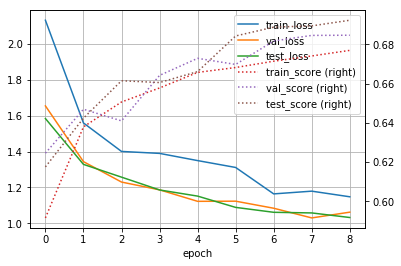

[NAME: Dense_2, EPOCH: 9]
> Train...
> Validation...
주야              0.642105
요일              0.127907
사망자수            0.935613
사상자수            0.725774
중상자수            0.826013
경상자수            0.858176
부상신고자수          0.978441
발생지시도           0.650519
발생지시군구          0.112628
사고유형_대분류        0.966330
사고유형_중분류        0.478548
법규위반            0.756667
도로형태_대분류        0.915441
도로형태            0.782772
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.665505
요일              0.153333
사망자수            0.965233
사상자수            0.785522
중상자수            0.852586
경상자수            0.848557
부상신고자수          0.974482
발생지시도           0.646865
발생지시군구          0.108000
사고유형_대분류        0.992248
사고유형_중분류        0.437931
법규위반            0.724490
도로형태_대분류        0.962069
도로형태            0.795620
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.723776
Name: score, dtype: float64
[train] loss: 1.121 num_loss: 0.3218 cat_loss: 0.7991
score: 0.677 num_score: 0.8

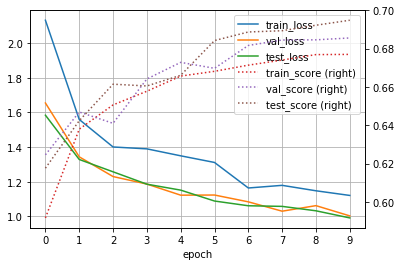

[NAME: Dense_2, EPOCH: 10]
> Train...
> Validation...
주야              0.631579
요일              0.174419
사망자수            0.930044
사상자수            0.784371
중상자수            0.837804
경상자수            0.852860
부상신고자수          0.978441
발생지시도           0.653979
발생지시군구          0.102389
사고유형_대분류        0.973064
사고유형_중분류        0.508251
법규위반            0.776667
도로형태_대분류        0.937500
도로형태            0.812734
당사자종별_1당_대분류    0.490975
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.634146
요일              0.153333
사망자수            0.957546
사상자수            0.745047
중상자수            0.853498
경상자수            0.847299
부상신고자수          0.974450
발생지시도           0.666667
발생지시군구          0.112000
사고유형_대분류        0.972868
사고유형_중분류        0.534483
법규위반            0.738095
도로형태_대분류        0.944828
도로형태            0.799270
당사자종별_1당_대분류    0.467354
당사자종별_2당_대분류    0.734266
Name: score, dtype: float64
[train] loss: 1.176 num_loss: 0.3877 cat_loss: 0.7882
score: 0.6815 num_score: 0

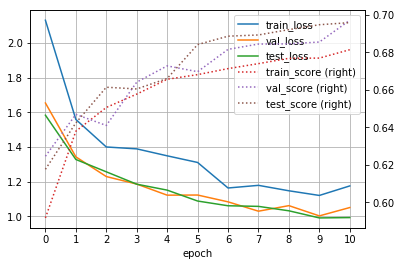

[NAME: Dense_2, EPOCH: 11]
> Train...
> Validation...
주야              0.614035
요일              0.155039
사망자수            0.949132
사상자수            0.800915
중상자수            0.832941
경상자수            0.867283
부상신고자수          0.978441
발생지시도           0.678201
발생지시군구          0.092150
사고유형_대분류        0.986532
사고유형_중분류        0.481848
법규위반            0.756667
도로형태_대분류        0.948529
도로형태            0.790262
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.648084
요일              0.183333
사망자수            0.967486
사상자수            0.776443
중상자수            0.855503
경상자수            0.851906
부상신고자수          0.974418
발생지시도           0.666667
발생지시군구          0.112000
사고유형_대분류        0.988372
사고유형_중분류        0.472414
법규위반            0.748299
도로형태_대분류        0.920690
도로형태            0.773723
당사자종별_1당_대분류    0.522337
당사자종별_2당_대분류    0.723776
Name: score, dtype: float64
[train] loss: 1.205 num_loss: 0.4208 cat_loss: 0.7839
score: 0.6797 num_score: 0

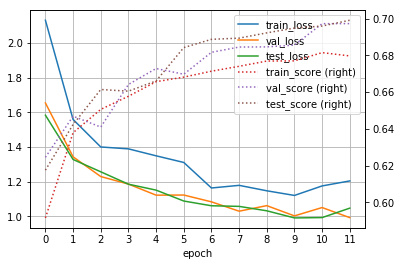

[NAME: Dense_2, EPOCH: 12]
> Train...
> Validation...
주야              0.656140
요일              0.162791
사망자수            0.950325
사상자수            0.709759
중상자수            0.809772
경상자수            0.854398
부상신고자수          0.978360
발생지시도           0.698962
발생지시군구          0.098976
사고유형_대분류        0.969697
사고유형_중분류        0.528053
법규위반            0.763333
도로형태_대분류        0.944853
도로형태            0.812734
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.682927
요일              0.133333
사망자수            0.968457
사상자수            0.767293
중상자수            0.843622
경상자수            0.843056
부상신고자수          0.972702
발생지시도           0.683168
발생지시군구          0.104000
사고유형_대분류        0.984496
사고유형_중분류        0.479310
법규위반            0.734694
도로형태_대분류        0.941379
도로형태            0.777372
당사자종별_1당_대분류    0.525773
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.148 num_loss: 0.3693 cat_loss: 0.7792
score: 0.6821 num_score: 0

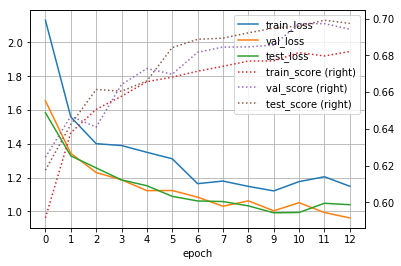

[NAME: Dense_2, EPOCH: 13]
> Train...
> Validation...
주야              0.645614
요일              0.174419
사망자수            0.952518
사상자수            0.780822
중상자수            0.824780
경상자수            0.863012
부상신고자수          0.976753
발생지시도           0.692042
발생지시군구          0.092150
사고유형_대분류        0.976431
사고유형_중분류        0.534653
법규위반            0.770000
도로형태_대분류        0.944853
도로형태            0.782772
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.714286
요일              0.176667
사망자수            0.961577
사상자수            0.811710
중상자수            0.846469
경상자수            0.856235
부상신고자수          0.974422
발생지시도           0.696370
발생지시군구          0.116000
사고유형_대분류        0.988372
사고유형_중분류        0.510345
법규위반            0.734694
도로형태_대분류        0.962069
도로형태            0.795620
당사자종별_1당_대분류    0.515464
당사자종별_2당_대분류    0.727273
Name: score, dtype: float64
[train] loss: 1.124 num_loss: 0.3491 cat_loss: 0.775
score: 0.6847 num_score: 0.

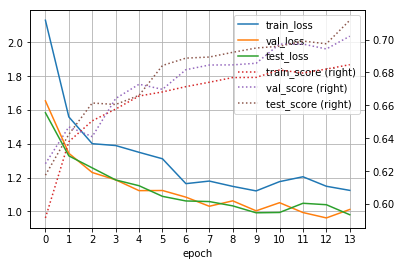

[NAME: Dense_2, EPOCH: 14]
> Train...
> Validation...
주야              0.638596
요일              0.151163
사망자수            0.953723
사상자수            0.773483
중상자수            0.816954
경상자수            0.873686
부상신고자수          0.978436
발생지시도           0.698962
발생지시군구          0.085324
사고유형_대분류        0.969697
사고유형_중분류        0.488449
법규위반            0.753333
도로형태_대분류        0.941176
도로형태            0.820225
당사자종별_1당_대분류    0.530686
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.662021
요일              0.123333
사망자수            0.964229
사상자수            0.784667
중상자수            0.848335
경상자수            0.838740
부상신고자수          0.972856
발생지시도           0.709571
발생지시군구          0.112000
사고유형_대분류        0.988372
사고유형_중분류        0.506897
법규위반            0.744898
도로형태_대분류        0.951724
도로형태            0.784672
당사자종별_1당_대분류    0.556701
당사자종별_2당_대분류    0.744755
Name: score, dtype: float64
[train] loss: 1.092 num_loss: 0.3226 cat_loss: 0.7698
score: 0.6856 num_score: 0

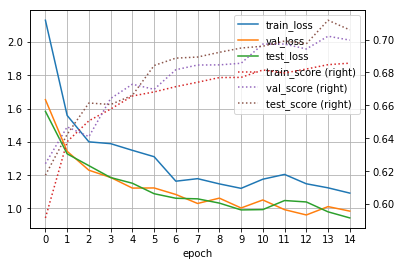

[NAME: Dense_2, EPOCH: 15]
> Train...
> Validation...
주야              0.663158
요일              0.162791
사망자수            0.941098
사상자수            0.793616
중상자수            0.815920
경상자수            0.880416
부상신고자수          0.978441
발생지시도           0.705882
발생지시군구          0.102389
사고유형_대분류        0.986532
사고유형_중분류        0.521452
법규위반            0.766667
도로형태_대분류        0.952206
도로형태            0.816479
당사자종별_1당_대분류    0.490975
당사자종별_2당_대분류    0.769737
Name: score, dtype: float64
> Test...
주야              0.630662
요일              0.143333
사망자수            0.966587
사상자수            0.796473
중상자수            0.854667
경상자수            0.846846
부상신고자수          0.972808
발생지시도           0.709571
발생지시군구          0.096000
사고유형_대분류        0.984496
사고유형_중분류        0.527586
법규위반            0.751701
도로형태_대분류        0.944828
도로형태            0.788321
당사자종별_1당_대분류    0.529210
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.107 num_loss: 0.3437 cat_loss: 0.763
score: 0.6881 num_score: 0.

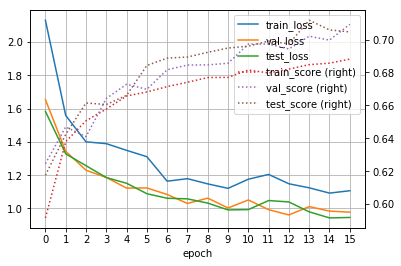

[NAME: Dense_2, EPOCH: 16]
> Train...
> Validation...
주야              0.712281
요일              0.158915
사망자수            0.949297
사상자수            0.810019
중상자수            0.834427
경상자수            0.862943
부상신고자수          0.978431
발생지시도           0.702422
발생지시군구          0.105802
사고유형_대분류        0.969697
사고유형_중분류        0.551155
법규위반            0.766667
도로형태_대분류        0.944853
도로형태            0.790262
당사자종별_1당_대분류    0.519856
당사자종별_2당_대분류    0.733553
Name: score, dtype: float64
> Test...
주야              0.655052
요일              0.160000
사망자수            0.967623
사상자수            0.812740
중상자수            0.848894
경상자수            0.848403
부상신고자수          0.971278
발생지시도           0.706271
발생지시군구          0.124000
사고유형_대분류        0.980620
사고유형_중분류        0.489655
법규위반            0.758503
도로형태_대분류        0.941379
도로형태            0.813869
당사자종별_1당_대분류    0.512027
당사자종별_2당_대분류    0.737762
Name: score, dtype: float64
[train] loss: 1.11 num_loss: 0.3504 cat_loss: 0.7601
score: 0.6868 num_score: 0.

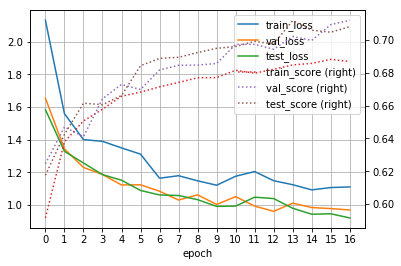

[NAME: Dense_2, EPOCH: 17]
> Train...
> Validation...
주야              0.659649
요일              0.147287
사망자수            0.947685
사상자수            0.783573
중상자수            0.822113
경상자수            0.857377
부상신고자수          0.978438
발생지시도           0.723183
발생지시군구          0.105802
사고유형_대분류        0.966330
사고유형_중분류        0.524752
법규위반            0.776667
도로형태_대분류        0.937500
도로형태            0.827715
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.746711
Name: score, dtype: float64
> Test...
주야              0.658537
요일              0.186667
사망자수            0.964676
사상자수            0.814472
중상자수            0.854925
경상자수            0.845782
부상신고자수          0.974479
발생지시도           0.696370
발생지시군구          0.120000
사고유형_대분류        0.984496
사고유형_중분류        0.493103
법규위반            0.758503
도로형태_대분류        0.944828
도로형태            0.777372
당사자종별_1당_대분류    0.525773
당사자종별_2당_대분류    0.744755
Name: score, dtype: float64
[train] loss: 1.082 num_loss: 0.3259 cat_loss: 0.7564
score: 0.6848 num_score: 0

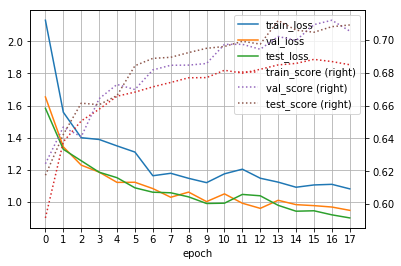

[NAME: Dense_2, EPOCH: 18]
> Train...
> Validation...
주야              0.719298
요일              0.162791
사망자수            0.946998
사상자수            0.809054
중상자수            0.825789
경상자수            0.868822
부상신고자수          0.978441
발생지시도           0.667820
발생지시군구          0.081911
사고유형_대분류        0.983165
사고유형_중분류        0.554455
법규위반            0.773333
도로형태_대분류        0.944853
도로형태            0.805243
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.759868
Name: score, dtype: float64
> Test...
주야              0.675958
요일              0.156667
사망자수            0.964230
사상자수            0.836993
중상자수            0.848839
경상자수            0.847158
부상신고자수          0.971248
발생지시도           0.726073
발생지시군구          0.104000
사고유형_대분류        0.988372
사고유형_중분류        0.468966
법규위반            0.772109
도로형태_대분류        0.951724
도로형태            0.781022
당사자종별_1당_대분류    0.563574
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.154 num_loss: 0.4017 cat_loss: 0.7521
score: 0.6887 num_score: 0

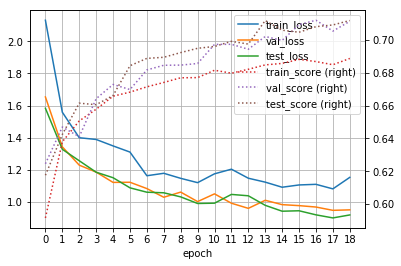

[NAME: Dense_2, EPOCH: 19]
> Train...
> Validation...
주야              0.652632
요일              0.155039
사망자수            0.947156
사상자수            0.797707
중상자수            0.840311
경상자수            0.871315
부상신고자수          0.978419
발생지시도           0.726644
발생지시군구          0.105802
사고유형_대분류        0.976431
사고유형_중분류        0.567657
법규위반            0.750000
도로형태_대분류        0.948529
도로형태            0.801498
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.730263
Name: score, dtype: float64
> Test...
주야              0.700348
요일              0.170000
사망자수            0.963480
사상자수            0.814714
중상자수            0.870345
경상자수            0.858484
부상신고자수          0.974482
발생지시도           0.726073
발생지시군구          0.132000
사고유형_대분류        1.000000
사고유형_중분류        0.503448
법규위반            0.778912
도로형태_대분류        0.937931
도로형태            0.791971
당사자종별_1당_대분류    0.512027
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.127 num_loss: 0.3781 cat_loss: 0.7492
score: 0.6885 num_score: 0

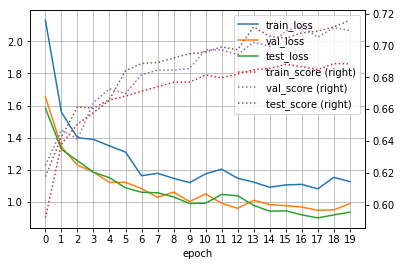

[NAME: Dense_2, EPOCH: 20]
> Train...
> Validation...
주야              0.659649
요일              0.189922
사망자수            0.945504
사상자수            0.786177
중상자수            0.829239
경상자수            0.874699
부상신고자수          0.976746
발생지시도           0.719723
발생지시군구          0.098976
사고유형_대분류        0.979798
사고유형_중분류        0.537954
법규위반            0.783333
도로형태_대분류        0.944853
도로형태            0.812734
당사자종별_1당_대분류    0.476534
당사자종별_2당_대분류    0.743421
Name: score, dtype: float64
> Test...
주야              0.672474
요일              0.166667
사망자수            0.960575
사상자수            0.836832
중상자수            0.867208
경상자수            0.856301
부상신고자수          0.974481
발생지시도           0.709571
발생지시군구          0.120000
사고유형_대분류        0.988372
사고유형_중분류        0.534483
법규위반            0.765306
도로형태_대분류        0.951724
도로형태            0.835766
당사자종별_1당_대분류    0.522337
당사자종별_2당_대분류    0.741259
Name: score, dtype: float64
[train] loss: 1.022 num_loss: 0.2726 cat_loss: 0.7495
score: 0.6888 num_score: 0

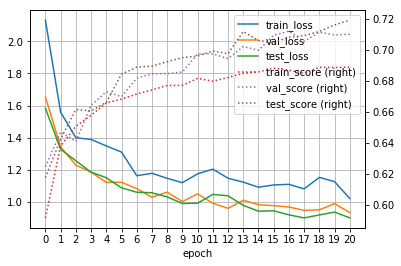

[NAME: Dense_2, EPOCH: 21]
> Train...
> Validation...
주야              0.677193
요일              0.143411
사망자수            0.950213
사상자수            0.811261
중상자수            0.826867
경상자수            0.872865
부상신고자수          0.976698
발생지시도           0.709343
발생지시군구          0.119454
사고유형_대분류        0.979798
사고유형_중분류        0.541254
법규위반            0.760000
도로형태_대분류        0.944853
도로형태            0.808989
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.753289
Name: score, dtype: float64
> Test...
주야              0.665505
요일              0.156667
사망자수            0.964148
사상자수            0.812038
중상자수            0.870432
경상자수            0.846803
부상신고자수          0.969616
발생지시도           0.726073
발생지시군구          0.100000
사고유형_대분류        0.992248
사고유형_중분류        0.479310
법규위반            0.761905
도로형태_대분류        0.951724
도로형태            0.817518
당사자종별_1당_대분류    0.539519
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.025 num_loss: 0.2792 cat_loss: 0.746
score: 0.6897 num_score: 0.

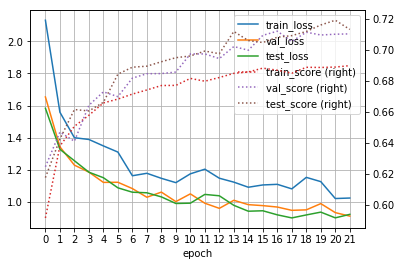

[NAME: Dense_2, EPOCH: 22]
> Train...
> Validation...
주야              0.663158
요일              0.158915
사망자수            0.946563
사상자수            0.790774
중상자수            0.822655
경상자수            0.878095
부상신고자수          0.978371
발생지시도           0.733564
발생지시군구          0.088737
사고유형_대분류        0.993266
사고유형_중분류        0.541254
법규위반            0.766667
도로형태_대분류        0.955882
도로형태            0.797753
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.773026
Name: score, dtype: float64
> Test...
주야              0.717770
요일              0.136667
사망자수            0.971611
사상자수            0.821579
중상자수            0.855759
경상자수            0.851658
부상신고자수          0.974444
발생지시도           0.683168
발생지시군구          0.144000
사고유형_대분류        0.992248
사고유형_중분류        0.575862
법규위반            0.761905
도로형태_대분류        0.968966
도로형태            0.810219
당사자종별_1당_대분류    0.529210
당사자종별_2당_대분류    0.769231
Name: score, dtype: float64
[train] loss: 1.071 num_loss: 0.3276 cat_loss: 0.7435
score: 0.6907 num_score: 0

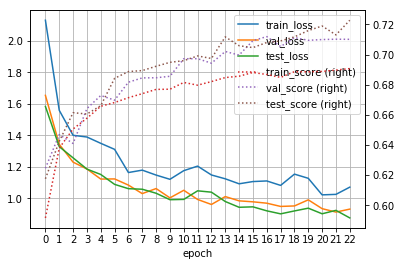

[NAME: Dense_2, EPOCH: 23]
> Train...
> Validation...
주야              0.705263
요일              0.135659
사망자수            0.945638
사상자수            0.789942
중상자수            0.838646
경상자수            0.864417
부상신고자수          0.978441
발생지시도           0.733564
발생지시군구          0.119454
사고유형_대분류        0.983165
사고유형_중분류        0.567657
법규위반            0.803333
도로형태_대분류        0.974265
도로형태            0.835206
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.696864
요일              0.140000
사망자수            0.963052
사상자수            0.801080
중상자수            0.868224
경상자수            0.837372
부상신고자수          0.974480
발생지시도           0.732673
발생지시군구          0.112000
사고유형_대분류        0.996124
사고유형_중분류        0.582759
법규위반            0.772109
도로형태_대분류        0.979310
도로형태            0.835766
당사자종별_1당_대분류    0.505155
당사자종별_2당_대분류    0.769231
Name: score, dtype: float64
[train] loss: 1.062 num_loss: 0.3187 cat_loss: 0.7438
score: 0.6916 num_score: 0

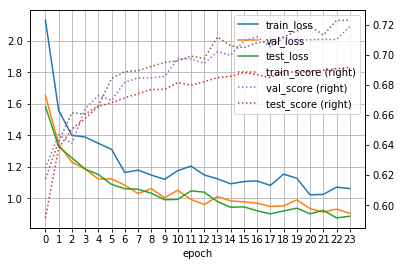

[NAME: Dense_2, EPOCH: 24]
> Train...
> Validation...
주야              0.701754
요일              0.124031
사망자수            0.954917
사상자수            0.804060
중상자수            0.829188
경상자수            0.877483
부상신고자수          0.978398
발생지시도           0.695502
발생지시군구          0.109215
사고유형_대분류        0.989899
사고유형_중분류        0.544554
법규위반            0.776667
도로형태_대분류        0.948529
도로형태            0.805243
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.743421
Name: score, dtype: float64
> Test...
주야              0.703833
요일              0.133333
사망자수            0.968467
사상자수            0.825838
중상자수            0.869513
경상자수            0.853559
부상신고자수          0.974441
발생지시도           0.726073
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.537931
법규위반            0.758503
도로형태_대분류        0.965517
도로형태            0.788321
당사자종별_1당_대분류    0.570447
당사자종별_2당_대분류    0.765734
Name: score, dtype: float64
[train] loss: 1.052 num_loss: 0.3112 cat_loss: 0.7409
score: 0.6929 num_score: 0

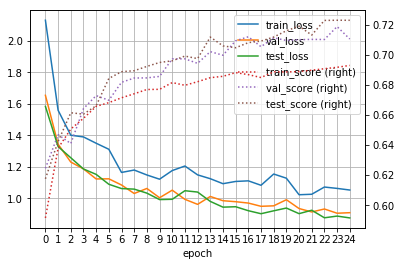

[NAME: Dense_2, EPOCH: 25]
> Train...
> Validation...
주야              0.715789
요일              0.147287
사망자수            0.949740
사상자수            0.798770
중상자수            0.831238
경상자수            0.862516
부상신고자수          0.978364
발생지시도           0.723183
발생지시군구          0.102389
사고유형_대분류        0.989899
사고유형_중분류        0.554455
법규위반            0.760000
도로형태_대분류        0.959559
도로형태            0.801498
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.665505
요일              0.130000
사망자수            0.966897
사상자수            0.821776
중상자수            0.866745
경상자수            0.845109
부상신고자수          0.974409
발생지시도           0.719472
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.551724
법규위반            0.758503
도로형태_대분류        0.979310
도로형태            0.813869
당사자종별_1당_대분류    0.542955
당사자종별_2당_대분류    0.772727
Name: score, dtype: float64
[train] loss: 1.209 num_loss: 0.4701 cat_loss: 0.7385
score: 0.6924 num_score: 0

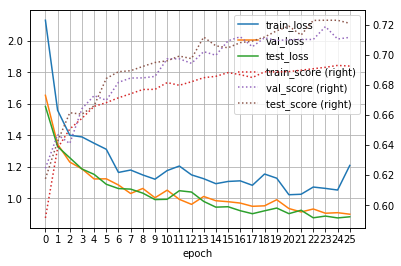

[NAME: Dense_2, EPOCH: 26]
> Train...
> Validation...
주야              0.708772
요일              0.166667
사망자수            0.947625
사상자수            0.801115
중상자수            0.835501
경상자수            0.868172
부상신고자수          0.978362
발생지시도           0.723183
발생지시군구          0.112628
사고유형_대분류        0.989899
사고유형_중분류        0.570957
법규위반            0.776667
도로형태_대분류        0.952206
도로형태            0.816479
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.665505
요일              0.150000
사망자수            0.969678
사상자수            0.823839
중상자수            0.865837
경상자수            0.857696
부상신고자수          0.972723
발생지시도           0.716172
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.513793
법규위반            0.765306
도로형태_대분류        0.958621
도로형태            0.839416
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.762238
Name: score, dtype: float64
[train] loss: 0.9671 num_loss: 0.2289 cat_loss: 0.7382
score: 0.6917 num_score: 

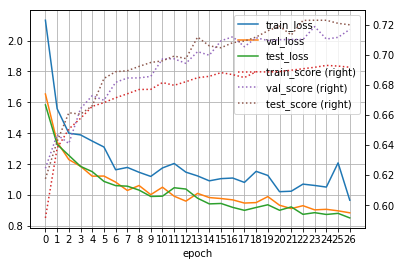

[NAME: Dense_2, EPOCH: 27]
> Train...
> Validation...
주야              0.722807
요일              0.151163
사망자수            0.950043
사상자수            0.786975
중상자수            0.837411
경상자수            0.879816
부상신고자수          0.976617
발생지시도           0.723183
발생지시군구          0.109215
사고유형_대분류        0.989899
사고유형_중분류        0.607261
법규위반            0.763333
도로형태_대분류        0.955882
도로형태            0.835206
당사자종별_1당_대분류    0.559567
당사자종별_2당_대분류    0.756579
Name: score, dtype: float64
> Test...
주야              0.637631
요일              0.146667
사망자수            0.967083
사상자수            0.805391
중상자수            0.858410
경상자수            0.854625
부상신고자수          0.972747
발생지시도           0.722772
발생지시군구          0.116000
사고유형_대분류        0.988372
사고유형_중분류        0.551724
법규위반            0.778912
도로형태_대분류        0.965517
도로형태            0.839416
당사자종별_1당_대분류    0.498282
당사자종별_2당_대분류    0.751748
Name: score, dtype: float64
[train] loss: 1.038 num_loss: 0.3021 cat_loss: 0.7355
score: 0.6952 num_score: 0

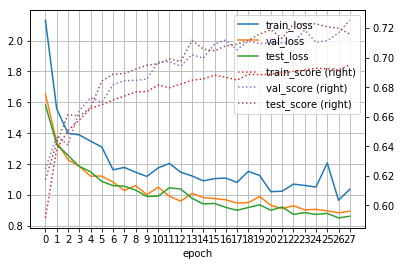

[NAME: Dense_2, EPOCH: 28]
> Train...
> Validation...
주야              0.712281
요일              0.174419
사망자수            0.949133
사상자수            0.809461
중상자수            0.836993
경상자수            0.881650
부상신고자수          0.978430
발생지시도           0.705882
발생지시군구          0.109215
사고유형_대분류        0.983165
사고유형_중분류        0.603960
법규위반            0.780000
도로형태_대분류        0.948529
도로형태            0.823970
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.766447
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.143333
사망자수            0.971456
사상자수            0.822667
중상자수            0.875772
경상자수            0.860814
부상신고자수          0.974473
발생지시도           0.696370
발생지시군구          0.112000
사고유형_대분류        1.000000
사고유형_중분류        0.558621
법규위반            0.748299
도로형태_대분류        0.958621
도로형태            0.835766
당사자종별_1당_대분류    0.539519
당사자종별_2당_대분류    0.769231
Name: score, dtype: float64
[train] loss: 1.026 num_loss: 0.2918 cat_loss: 0.7347
score: 0.6933 num_score: 0

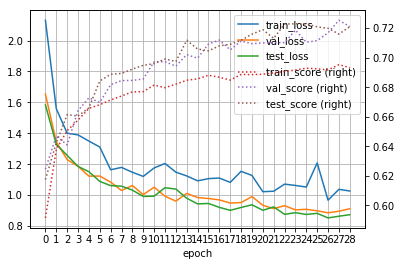

[NAME: Dense_2, EPOCH: 29]
> Train...
> Validation...
주야              0.677193
요일              0.151163
사망자수            0.949433
사상자수            0.797640
중상자수            0.839055
경상자수            0.877440
부상신고자수          0.978441
발생지시도           0.709343
발생지시군구          0.126280
사고유형_대분류        0.983165
사고유형_중분류        0.567657
법규위반            0.786667
도로형태_대분류        0.966912
도로형태            0.794007
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.753289
Name: score, dtype: float64
> Test...
주야              0.689895
요일              0.156667
사망자수            0.963037
사상자수            0.817634
중상자수            0.866935
경상자수            0.846248
부상신고자수          0.974327
발생지시도           0.745875
발생지시군구          0.124000
사고유형_대분류        0.988372
사고유형_중분류        0.548276
법규위반            0.765306
도로형태_대분류        0.975862
도로형태            0.813869
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.751748
Name: score, dtype: float64
[train] loss: 0.9605 num_loss: 0.227 cat_loss: 0.7336
score: 0.6957 num_score: 0

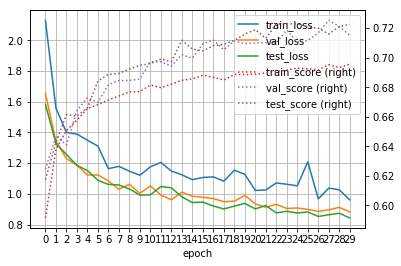

[NAME: Dense_3, EPOCH: 0]
> Train...
> Validation...
주야              0.607018
요일              0.155039
사망자수            0.840578
사상자수            0.660645
중상자수            0.814804
경상자수            0.860758
부상신고자수          0.978441
발생지시도           0.173010
발생지시군구          0.023891
사고유형_대분류        0.939394
사고유형_중분류        0.419142
법규위반            0.706667
도로형태_대분류        0.882353
도로형태            0.752809
당사자종별_1당_대분류    0.404332
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.170000
사망자수            0.860080
사상자수            0.674912
중상자수            0.825451
경상자수            0.847125
부상신고자수          0.974482
발생지시도           0.198020
발생지시군구          0.032000
사고유형_대분류        0.965116
사고유형_중분류        0.424138
법규위반            0.717687
도로형태_대분류        0.879310
도로형태            0.715328
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.671329
Name: score, dtype: float64
[train] loss: 2.065 num_loss: 0.4463 cat_loss: 1.618
score: 0.5896 num_score: 0.8

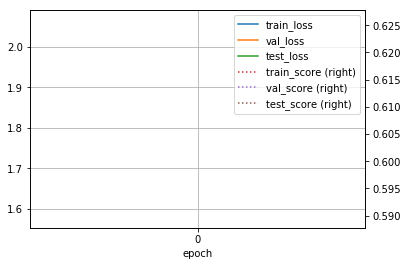

[NAME: Dense_3, EPOCH: 1]
> Train...
> Validation...
주야              0.621053
요일              0.155039
사망자수            0.862955
사상자수            0.554314
중상자수            0.813782
경상자수            0.852379
부상신고자수          0.978441
발생지시도           0.311419
발생지시군구          0.037543
사고유형_대분류        0.909091
사고유형_중분류        0.438944
법규위반            0.703333
도로형태_대분류        0.904412
도로형태            0.786517
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.220000
사망자수            0.897260
사상자수            0.611945
중상자수            0.835217
경상자수            0.833216
부상신고자수          0.974482
발생지시도           0.333333
발생지시군구          0.044000
사고유형_대분류        0.953488
사고유형_중분류        0.448276
법규위반            0.710884
도로형태_대분류        0.879310
도로형태            0.766423
당사자종별_1당_대분류    0.446735
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.59 num_loss: 0.4601 cat_loss: 1.13
score: 0.6341 num_score: 0.846

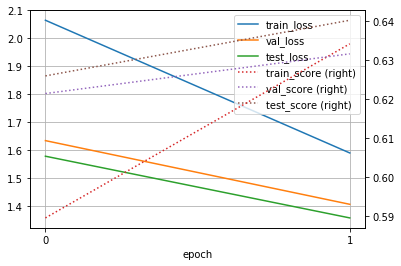

[NAME: Dense_3, EPOCH: 2]
> Train...
> Validation...
주야              0.624561
요일              0.174419
사망자수            0.895518
사상자수            0.753055
중상자수            0.817286
경상자수            0.863850
부상신고자수          0.978441
발생지시도           0.346021
발생지시군구          0.034130
사고유형_대분류        0.959596
사고유형_중분류        0.429043
법규위반            0.736667
도로형태_대분류        0.897059
도로형태            0.790262
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.588850
요일              0.166667
사망자수            0.919700
사상자수            0.752486
중상자수            0.801974
경상자수            0.842512
부상신고자수          0.974482
발생지시도           0.425743
발생지시군구          0.084000
사고유형_대분류        0.988372
사고유형_중분류        0.472414
법규위반            0.714286
도로형태_대분류        0.896552
도로형태            0.737226
당사자종별_1당_대분류    0.477663
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[train] loss: 1.494 num_loss: 0.498 cat_loss: 0.9963
score: 0.6466 num_score: 0.8

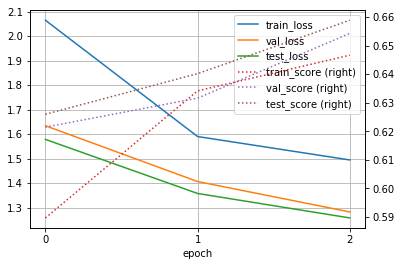

[NAME: Dense_3, EPOCH: 3]
> Train...
> Validation...
주야              0.635088
요일              0.158915
사망자수            0.904800
사상자수            0.754111
중상자수            0.829010
경상자수            0.865040
부상신고자수          0.978441
발생지시도           0.401384
발생지시군구          0.061433
사고유형_대분류        0.959596
사고유형_중분류        0.432343
법규위반            0.726667
도로형태_대분류        0.908088
도로형태            0.771536
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.581882
요일              0.160000
사망자수            0.936118
사상자수            0.738466
중상자수            0.827683
경상자수            0.841281
부상신고자수          0.974482
발생지시도           0.488449
발생지시군구          0.068000
사고유형_대분류        0.976744
사고유형_중분류        0.448276
법규위반            0.714286
도로형태_대분류        0.903448
도로형태            0.744526
당사자종별_1당_대분류    0.436426
당사자종별_2당_대분류    0.692308
Name: score, dtype: float64
[train] loss: 1.428 num_loss: 0.4812 cat_loss: 0.9466
score: 0.6551 num_score: 0.

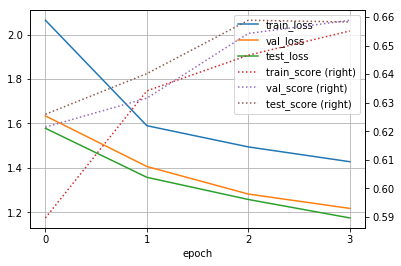

[NAME: Dense_3, EPOCH: 4]
> Train...
> Validation...
주야              0.600000
요일              0.135659
사망자수            0.936277
사상자수            0.724582
중상자수            0.820788
경상자수            0.855855
부상신고자수          0.978441
발생지시도           0.474048
발생지시군구          0.068259
사고유형_대분류        0.959596
사고유형_중분류        0.504950
법규위반            0.733333
도로형태_대분류        0.908088
도로형태            0.797753
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.634146
요일              0.143333
사망자수            0.956095
사상자수            0.767824
중상자수            0.818108
경상자수            0.841807
부상신고자수          0.974482
발생지시도           0.531353
발생지시군구          0.100000
사고유형_대분류        0.976744
사고유형_중분류        0.451724
법규위반            0.700680
도로형태_대분류        0.910345
도로형태            0.766423
당사자종별_1당_대분류    0.408935
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.263 num_loss: 0.3516 cat_loss: 0.9117
score: 0.6593 num_score: 0.

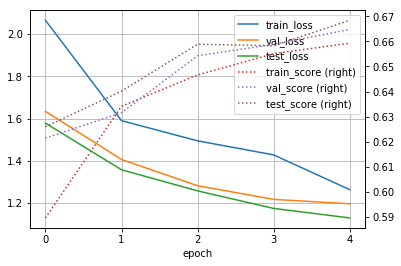

[NAME: Dense_3, EPOCH: 5]
> Train...
> Validation...
주야              0.600000
요일              0.155039
사망자수            0.948339
사상자수            0.769888
중상자수            0.821737
경상자수            0.864815
부상신고자수          0.978441
발생지시도           0.470588
발생지시군구          0.047782
사고유형_대분류        0.976431
사고유형_중분류        0.448845
법규위반            0.733333
도로형태_대분류        0.908088
도로형태            0.771536
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.664474
Name: score, dtype: float64
> Test...
주야              0.613240
요일              0.173333
사망자수            0.955425
사상자수            0.745403
중상자수            0.838290
경상자수            0.829241
부상신고자수          0.974482
발생지시도           0.537954
발생지시군구          0.092000
사고유형_대분류        0.976744
사고유형_중분류        0.465517
법규위반            0.707483
도로형태_대분류        0.896552
도로형태            0.762774
당사자종별_1당_대분류    0.477663
당사자종별_2당_대분류    0.695804
Name: score, dtype: float64
[train] loss: 1.341 num_loss: 0.452 cat_loss: 0.8886
score: 0.6643 num_score: 0.8

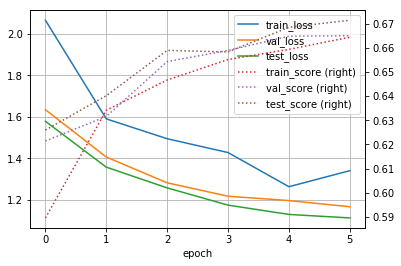

[NAME: Dense_3, EPOCH: 6]
> Train...
> Validation...
주야              0.631579
요일              0.127907
사망자수            0.938876
사상자수            0.788546
중상자수            0.832825
경상자수            0.863530
부상신고자수          0.978441
발생지시도           0.519031
발생지시군구          0.068259
사고유형_대분류        0.956229
사고유형_중분류        0.429043
법규위반            0.726667
도로형태_대분류        0.919118
도로형태            0.794007
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.680921
Name: score, dtype: float64
> Test...
주야              0.613240
요일              0.190000
사망자수            0.954015
사상자수            0.757101
중상자수            0.831836
경상자수            0.844479
부상신고자수          0.974482
발생지시도           0.564356
발생지시군구          0.096000
사고유형_대분류        0.984496
사고유형_중분류        0.462069
법규위반            0.724490
도로형태_대분류        0.906897
도로형태            0.784672
당사자종별_1당_대분류    0.443299
당사자종별_2당_대분류    0.688811
Name: score, dtype: float64
[train] loss: 1.249 num_loss: 0.3797 cat_loss: 0.8689
score: 0.6688 num_score: 0.

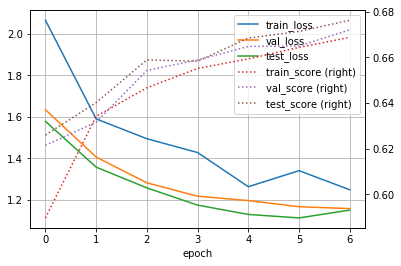

[NAME: Dense_3, EPOCH: 7]
> Train...
> Validation...
주야              0.600000
요일              0.166667
사망자수            0.940065
사상자수            0.786777
중상자수            0.820361
경상자수            0.869530
부상신고자수          0.978441
발생지시도           0.577855
발생지시군구          0.058020
사고유형_대분류        0.946128
사고유형_중분류        0.514851
법규위반            0.716667
도로형태_대분류        0.922794
도로형태            0.756554
당사자종별_1당_대분류    0.472924
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.592334
요일              0.146667
사망자수            0.959985
사상자수            0.792208
중상자수            0.849228
경상자수            0.853491
부상신고자수          0.974482
발생지시도           0.577558
발생지시군구          0.084000
사고유형_대분류        0.988372
사고유형_중분류        0.489655
법규위반            0.714286
도로형태_대분류        0.889655
도로형태            0.759124
당사자종별_1당_대분류    0.522337
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.28 num_loss: 0.4213 cat_loss: 0.8586
score: 0.6724 num_score: 0.8

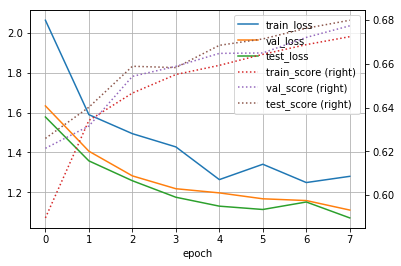

[NAME: Dense_3, EPOCH: 8]
> Train...
> Validation...
주야              0.663158
요일              0.131783
사망자수            0.939442
사상자수            0.790478
중상자수            0.825316
경상자수            0.856636
부상신고자수          0.978441
발생지시도           0.567474
발생지시군구          0.075085
사고유형_대분류        0.959596
사고유형_중분류        0.462046
법규위반            0.723333
도로형태_대분류        0.900735
도로형태            0.767790
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.651568
요일              0.206667
사망자수            0.957176
사상자수            0.771479
중상자수            0.843385
경상자수            0.850009
부상신고자수          0.974482
발생지시도           0.630363
발생지시군구          0.080000
사고유형_대분류        0.980620
사고유형_중분류        0.451724
법규위반            0.734694
도로형태_대분류        0.913793
도로형태            0.766423
당사자종별_1당_대분류    0.477663
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.211 num_loss: 0.3648 cat_loss: 0.8465
score: 0.6734 num_score: 0.

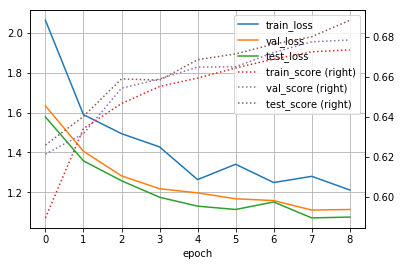

[NAME: Dense_3, EPOCH: 9]
> Train...
> Validation...
주야              0.656140
요일              0.166667
사망자수            0.930642
사상자수            0.786620
중상자수            0.819371
경상자수            0.865250
부상신고자수          0.978441
발생지시도           0.570934
발생지시군구          0.078498
사고유형_대분류        0.976431
사고유형_중분류        0.478548
법규위반            0.740000
도로형태_대분류        0.933824
도로형태            0.771536
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.170000
사망자수            0.951107
사상자수            0.785993
중상자수            0.840070
경상자수            0.844164
부상신고자수          0.974482
발생지시도           0.623762
발생지시군구          0.116000
사고유형_대분류        0.988372
사고유형_중분류        0.486207
법규위반            0.717687
도로형태_대분류        0.920690
도로형태            0.766423
당사자종별_1당_대분류    0.522337
당사자종별_2당_대분류    0.706294
Name: score, dtype: float64
[train] loss: 1.231 num_loss: 0.3896 cat_loss: 0.8415
score: 0.6736 num_score: 0.

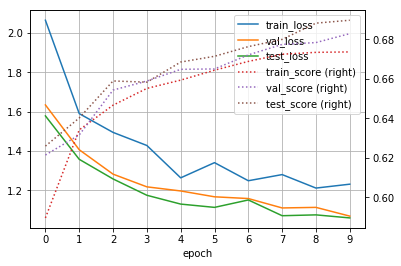

[NAME: Dense_3, EPOCH: 10]
> Train...
> Validation...
주야              0.645614
요일              0.124031
사망자수            0.950692
사상자수            0.772640
중상자수            0.832145
경상자수            0.876332
부상신고자수          0.978441
발생지시도           0.591696
발생지시군구          0.085324
사고유형_대분류        0.969697
사고유형_중분류        0.511551
법규위반            0.720000
도로형태_대분류        0.908088
도로형태            0.786517
당사자종별_1당_대분류    0.476534
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.672474
요일              0.190000
사망자수            0.965288
사상자수            0.750271
중상자수            0.839594
경상자수            0.850262
부상신고자수          0.974482
발생지시도           0.636964
발생지시군구          0.092000
사고유형_대분류        0.980620
사고유형_중분류        0.486207
법규위반            0.721088
도로형태_대분류        0.917241
도로형태            0.773723
당사자종별_1당_대분류    0.453608
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.181 num_loss: 0.3466 cat_loss: 0.834
score: 0.6747 num_score: 0.

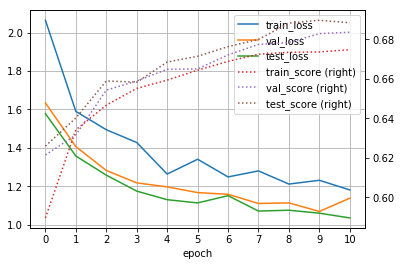

[NAME: Dense_3, EPOCH: 11]
> Train...
> Validation...
주야              0.638596
요일              0.120155
사망자수            0.953800
사상자수            0.769182
중상자수            0.833853
경상자수            0.860106
부상신고자수          0.978441
발생지시도           0.598616
발생지시군구          0.092150
사고유형_대분류        0.986532
사고유형_중분류        0.495050
법규위반            0.743333
도로형태_대분류        0.941176
도로형태            0.790262
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.730263
Name: score, dtype: float64
> Test...
주야              0.623693
요일              0.173333
사망자수            0.959473
사상자수            0.796769
중상자수            0.851038
경상자수            0.842026
부상신고자수          0.974482
발생지시도           0.630363
발생지시군구          0.076000
사고유형_대분류        0.988372
사고유형_중분류        0.493103
법규위반            0.731293
도로형태_대분류        0.917241
도로형태            0.781022
당사자종별_1당_대분류    0.518900
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.267 num_loss: 0.4394 cat_loss: 0.8276
score: 0.6741 num_score: 0

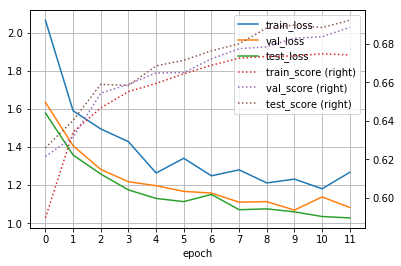

[NAME: Dense_3, EPOCH: 12]
> Train...
> Validation...
주야              0.691228
요일              0.166667
사망자수            0.950496
사상자수            0.788992
중상자수            0.825914
경상자수            0.855475
부상신고자수          0.978441
발생지시도           0.574394
발생지시군구          0.092150
사고유형_대분류        0.979798
사고유형_중분류        0.488449
법규위반            0.750000
도로형태_대분류        0.933824
도로형태            0.786517
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.700348
요일              0.183333
사망자수            0.967823
사상자수            0.773573
중상자수            0.851080
경상자수            0.843763
부상신고자수          0.974482
발생지시도           0.646865
발생지시군구          0.104000
사고유형_대분류        0.976744
사고유형_중분류        0.544828
법규위반            0.731293
도로형태_대분류        0.920690
도로형태            0.781022
당사자종별_1당_대분류    0.484536
당사자종별_2당_대분류    0.727273
Name: score, dtype: float64
[train] loss: 1.172 num_loss: 0.3502 cat_loss: 0.8214
score: 0.6791 num_score: 0

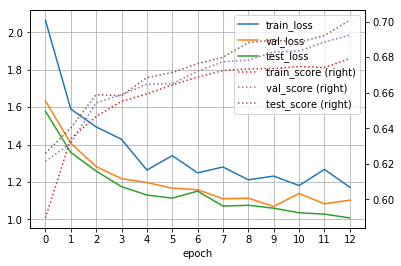

[NAME: Dense_3, EPOCH: 13]
> Train...
> Validation...
주야              0.663158
요일              0.116279
사망자수            0.946971
사상자수            0.799561
중상자수            0.842564
경상자수            0.856729
부상신고자수          0.978441
발생지시도           0.626298
발생지시군구          0.085324
사고유형_대분류        0.969697
사고유형_중분류        0.521452
법규위반            0.740000
도로형태_대분류        0.911765
도로형태            0.797753
당사자종별_1당_대분류    0.509025
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.648084
요일              0.156667
사망자수            0.966648
사상자수            0.791187
중상자수            0.838774
경상자수            0.854793
부상신고자수          0.974482
발생지시도           0.633663
발생지시군구          0.088000
사고유형_대분류        0.988372
사고유형_중분류        0.524138
법규위반            0.714286
도로형태_대분류        0.910345
도로형태            0.799270
당사자종별_1당_대분류    0.570447
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.213 num_loss: 0.3964 cat_loss: 0.8165
score: 0.6807 num_score: 0

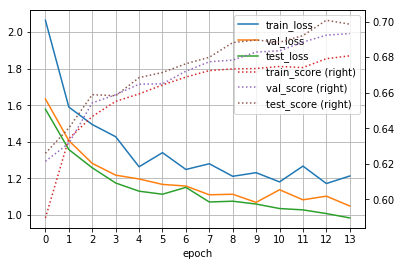

[NAME: Dense_3, EPOCH: 14]
> Train...
> Validation...
주야              0.666667
요일              0.135659
사망자수            0.943505
사상자수            0.810940
중상자수            0.820204
경상자수            0.874709
부상신고자수          0.978441
발생지시도           0.615917
발생지시군구          0.078498
사고유형_대분류        0.969697
사고유형_중분류        0.534653
법규위반            0.756667
도로형태_대분류        0.926471
도로형태            0.805243
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.658537
요일              0.170000
사망자수            0.959416
사상자수            0.805698
중상자수            0.854626
경상자수            0.844807
부상신고자수          0.974482
발생지시도           0.660066
발생지시군구          0.100000
사고유형_대분류        0.984496
사고유형_중분류        0.517241
법규위반            0.731293
도로형태_대분류        0.920690
도로형태            0.806569
당사자종별_1당_대분류    0.512027
당사자종별_2당_대분류    0.723776
Name: score, dtype: float64
[train] loss: 1.196 num_loss: 0.3826 cat_loss: 0.8135
score: 0.6784 num_score: 0

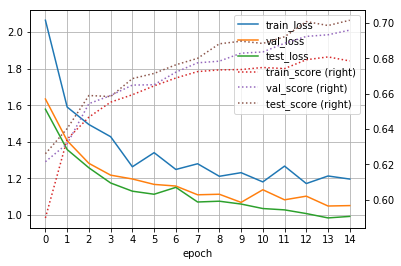

[NAME: Dense_3, EPOCH: 15]
> Train...
> Validation...
주야              0.652632
요일              0.162791
사망자수            0.948712
사상자수            0.752849
중상자수            0.822671
경상자수            0.874602
부상신고자수          0.978441
발생지시도           0.633218
발생지시군구          0.088737
사고유형_대분류        0.983165
사고유형_중분류        0.551155
법규위반            0.766667
도로형태_대분류        0.933824
도로형태            0.812734
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.655052
요일              0.150000
사망자수            0.967821
사상자수            0.803026
중상자수            0.852497
경상자수            0.844129
부상신고자수          0.974482
발생지시도           0.663366
발생지시군구          0.148000
사고유형_대분류        0.984496
사고유형_중분류        0.572414
법규위반            0.724490
도로형태_대분류        0.941379
도로형태            0.788321
당사자종별_1당_대분류    0.529210
당사자종별_2당_대분류    0.737762
Name: score, dtype: float64
[train] loss: 1.159 num_loss: 0.3531 cat_loss: 0.8059
score: 0.6814 num_score: 0

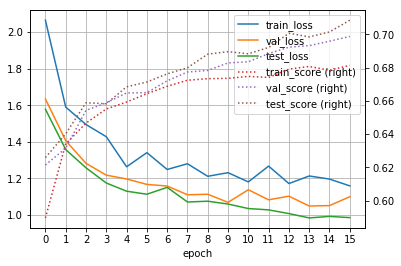

[NAME: Dense_3, EPOCH: 16]
> Train...
> Validation...
주야              0.684211
요일              0.151163
사망자수            0.951227
사상자수            0.816766
중상자수            0.837556
경상자수            0.864667
부상신고자수          0.978441
발생지시도           0.602076
발생지시군구          0.081911
사고유형_대분류        0.976431
사고유형_중분류        0.524752
법규위반            0.773333
도로형태_대분류        0.922794
도로형태            0.812734
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.703833
요일              0.150000
사망자수            0.965995
사상자수            0.810256
중상자수            0.850416
경상자수            0.852001
부상신고자수          0.974482
발생지시도           0.653465
발생지시군구          0.112000
사고유형_대분류        0.988372
사고유형_중분류        0.555172
법규위반            0.721088
도로형태_대분류        0.927586
도로형태            0.810219
당사자종별_1당_대분류    0.512027
당사자종별_2당_대분류    0.723776
Name: score, dtype: float64
[train] loss: 1.148 num_loss: 0.3434 cat_loss: 0.8051
score: 0.6809 num_score: 0

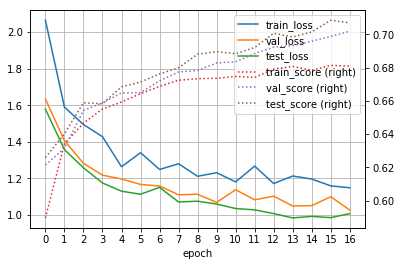

[NAME: Dense_3, EPOCH: 17]
> Train...
> Validation...
주야              0.680702
요일              0.155039
사망자수            0.949578
사상자수            0.799535
중상자수            0.834077
경상자수            0.868247
부상신고자수          0.978441
발생지시도           0.612457
발생지시군구          0.061433
사고유형_대분류        0.979798
사고유형_중분류        0.504950
법규위반            0.753333
도로형태_대분류        0.930147
도로형태            0.801498
당사자종별_1당_대분류    0.516245
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.714286
요일              0.156667
사망자수            0.962977
사상자수            0.809095
중상자수            0.861109
경상자수            0.845436
부상신고자수          0.974482
발생지시도           0.669967
발생지시군구          0.120000
사고유형_대분류        0.992248
사고유형_중분류        0.510345
법규위반            0.738095
도로형태_대분류        0.934483
도로형태            0.806569
당사자종별_1당_대분류    0.518900
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.203 num_loss: 0.4018 cat_loss: 0.8008
score: 0.6828 num_score: 0

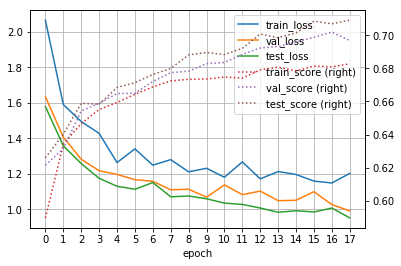

[NAME: Dense_3, EPOCH: 18]
> Train...
> Validation...
주야              0.649123
요일              0.127907
사망자수            0.952236
사상자수            0.772525
중상자수            0.835909
경상자수            0.871277
부상신고자수          0.978441
발생지시도           0.640138
발생지시군구          0.085324
사고유형_대분류        0.976431
사고유형_중분류        0.541254
법규위반            0.753333
도로형태_대분류        0.937500
도로형태            0.771536
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.665505
요일              0.153333
사망자수            0.966214
사상자수            0.815670
중상자수            0.844965
경상자수            0.852446
부상신고자수          0.974482
발생지시도           0.660066
발생지시군구          0.108000
사고유형_대분류        0.992248
사고유형_중분류        0.555172
법규위반            0.731293
도로형태_대분류        0.917241
도로형태            0.806569
당사자종별_1당_대분류    0.549828
당사자종별_2당_대분류    0.734266
Name: score, dtype: float64
[train] loss: 1.117 num_loss: 0.3185 cat_loss: 0.799
score: 0.685 num_score: 0.8

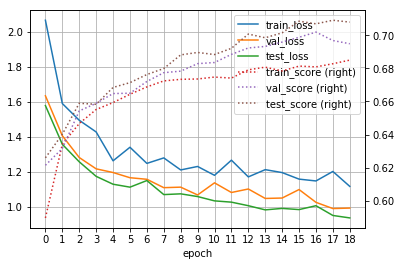

[NAME: Dense_3, EPOCH: 19]
> Train...
> Validation...
주야              0.670175
요일              0.147287
사망자수            0.945341
사상자수            0.752060
중상자수            0.838620
경상자수            0.860516
부상신고자수          0.978441
발생지시도           0.650519
발생지시군구          0.071672
사고유형_대분류        0.983165
사고유형_중분류        0.557756
법규위반            0.763333
도로형태_대분류        0.933824
도로형태            0.816479
당사자종별_1당_대분류    0.534296
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.693380
요일              0.160000
사망자수            0.964876
사상자수            0.802655
중상자수            0.873675
경상자수            0.847797
부상신고자수          0.974482
발생지시도           0.663366
발생지시군구          0.132000
사고유형_대분류        0.988372
사고유형_중분류        0.496552
법규위반            0.741497
도로형태_대분류        0.937931
도로형태            0.799270
당사자종별_1당_대분류    0.474227
당사자종별_2당_대분류    0.741259
Name: score, dtype: float64
[train] loss: 1.181 num_loss: 0.3871 cat_loss: 0.7942
score: 0.6832 num_score: 0

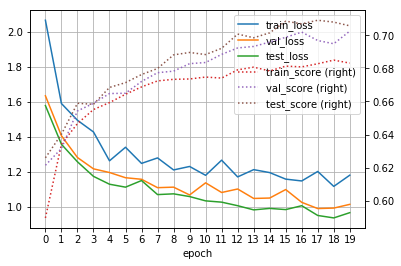

[NAME: Dense_3, EPOCH: 20]
> Train...
> Validation...
주야              0.684211
요일              0.124031
사망자수            0.953886
사상자수            0.799885
중상자수            0.837546
경상자수            0.861184
부상신고자수          0.978441
발생지시도           0.605536
발생지시군구          0.078498
사고유형_대분류        0.986532
사고유형_중분류        0.501650
법규위반            0.740000
도로형태_대분류        0.922794
도로형태            0.805243
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.717105
Name: score, dtype: float64
> Test...
주야              0.620209
요일              0.153333
사망자수            0.967691
사상자수            0.802708
중상자수            0.851665
경상자수            0.849756
부상신고자수          0.974482
발생지시도           0.673267
발생지시군구          0.112000
사고유형_대분류        0.988372
사고유형_중분류        0.520690
법규위반            0.714286
도로형태_대분류        0.937931
도로형태            0.784672
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.727273
Name: score, dtype: float64
[train] loss: 1.12 num_loss: 0.3254 cat_loss: 0.7943
score: 0.6846 num_score: 0.

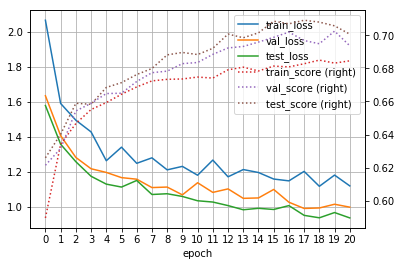

[NAME: Dense_3, EPOCH: 21]
> Train...
> Validation...
주야              0.673684
요일              0.158915
사망자수            0.952943
사상자수            0.777797
중상자수            0.826286
경상자수            0.856622
부상신고자수          0.978441
발생지시도           0.619377
발생지시군구          0.085324
사고유형_대분류        0.969697
사고유형_중분류        0.537954
법규위반            0.753333
도로형태_대분류        0.930147
도로형태            0.805243
당사자종별_1당_대분류    0.552347
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
> Test...
주야              0.651568
요일              0.136667
사망자수            0.970181
사상자수            0.823972
중상자수            0.849913
경상자수            0.854933
부상신고자수          0.974482
발생지시도           0.673267
발생지시군구          0.108000
사고유형_대분류        0.992248
사고유형_중분류        0.568966
법규위반            0.751701
도로형태_대분류        0.944828
도로형태            0.824818
당사자종별_1당_대분류    0.556701
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.094 num_loss: 0.3001 cat_loss: 0.7939
score: 0.6844 num_score: 0

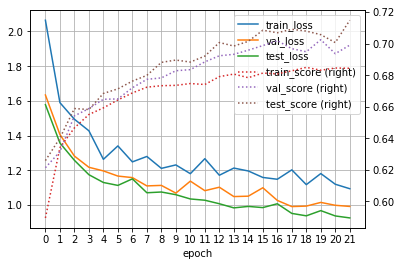

[NAME: Dense_3, EPOCH: 22]
> Train...
> Validation...
주야              0.673684
요일              0.112403
사망자수            0.954099
사상자수            0.775416
중상자수            0.836737
경상자수            0.857135
부상신고자수          0.978441
발생지시도           0.636678
발생지시군구          0.095563
사고유형_대분류        0.989899
사고유형_중분류        0.541254
법규위반            0.740000
도로형태_대분류        0.937500
도로형태            0.805243
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.750000
Name: score, dtype: float64
> Test...
주야              0.665505
요일              0.176667
사망자수            0.966105
사상자수            0.830502
중상자수            0.868745
경상자수            0.844723
부상신고자수          0.974482
발생지시도           0.636964
발생지시군구          0.112000
사고유형_대분류        0.988372
사고유형_중분류        0.551724
법규위반            0.731293
도로형태_대분류        0.924138
도로형태            0.788321
당사자종별_1당_대분류    0.508591
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.186 num_loss: 0.3969 cat_loss: 0.7896
score: 0.687 num_score: 0.

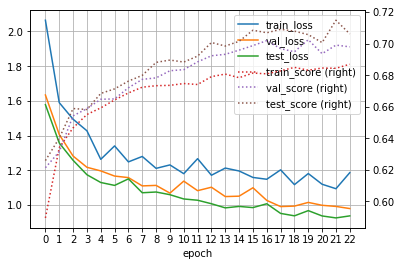

[NAME: Dense_3, EPOCH: 23]
> Train...
> Validation...
주야              0.687719
요일              0.139535
사망자수            0.952845
사상자수            0.788537
중상자수            0.843296
경상자수            0.871100
부상신고자수          0.978441
발생지시도           0.640138
발생지시군구          0.098976
사고유형_대분류        0.986532
사고유형_중분류        0.551155
법규위반            0.763333
도로형태_대분류        0.941176
도로형태            0.831461
당사자종별_1당_대분류    0.509025
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.648084
요일              0.166667
사망자수            0.967734
사상자수            0.807297
중상자수            0.875716
경상자수            0.851860
부상신고자수          0.974482
발생지시도           0.666667
발생지시군구          0.120000
사고유형_대분류        0.992248
사고유형_중분류        0.524138
법규위반            0.727891
도로형태_대분류        0.937931
도로형태            0.832117
당사자종별_1당_대분류    0.546392
당사자종별_2당_대분류    0.727273
Name: score, dtype: float64
[train] loss: 1.155 num_loss: 0.3648 cat_loss: 0.7899
score: 0.6877 num_score: 0

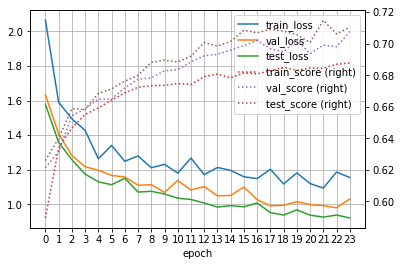

[NAME: Dense_3, EPOCH: 24]
> Train...
> Validation...
주야              0.684211
요일              0.147287
사망자수            0.953538
사상자수            0.810183
중상자수            0.837381
경상자수            0.882292
부상신고자수          0.978441
발생지시도           0.622837
발생지시군구          0.088737
사고유형_대분류        0.986532
사고유형_중분류        0.518152
법규위반            0.770000
도로형태_대분류        0.919118
도로형태            0.827715
당사자종별_1당_대분류    0.537906
당사자종별_2당_대분류    0.743421
Name: score, dtype: float64
> Test...
주야              0.648084
요일              0.173333
사망자수            0.970382
사상자수            0.808498
중상자수            0.862035
경상자수            0.850077
부상신고자수          0.974482
발생지시도           0.676568
발생지시군구          0.120000
사고유형_대분류        0.976744
사고유형_중분류        0.537931
법규위반            0.734694
도로형태_대분류        0.931034
도로형태            0.813869
당사자종별_1당_대분류    0.553265
당사자종별_2당_대분류    0.765734
Name: score, dtype: float64
[train] loss: 1.111 num_loss: 0.3235 cat_loss: 0.7877
score: 0.6867 num_score: 0

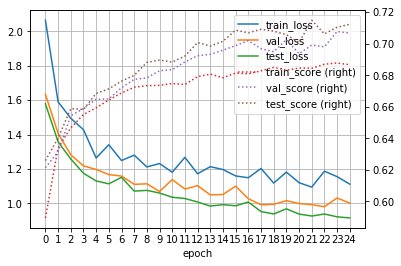

[NAME: Dense_3, EPOCH: 25]
> Train...
> Validation...
주야              0.652632
요일              0.155039
사망자수            0.946702
사상자수            0.788619
중상자수            0.841387
경상자수            0.871395
부상신고자수          0.978441
발생지시도           0.622837
발생지시군구          0.061433
사고유형_대분류        0.979798
사고유형_중분류        0.544554
법규위반            0.760000
도로형태_대분류        0.941176
도로형태            0.831461
당사자종별_1당_대분류    0.555957
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.180000
사망자수            0.966712
사상자수            0.819980
중상자수            0.841981
경상자수            0.864851
부상신고자수          0.974482
발생지시도           0.673267
발생지시군구          0.120000
사고유형_대분류        0.992248
사고유형_중분류        0.593103
법규위반            0.727891
도로형태_대분류        0.941379
도로형태            0.843066
당사자종별_1당_대분류    0.546392
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.095 num_loss: 0.3069 cat_loss: 0.7878
score: 0.6865 num_score: 0

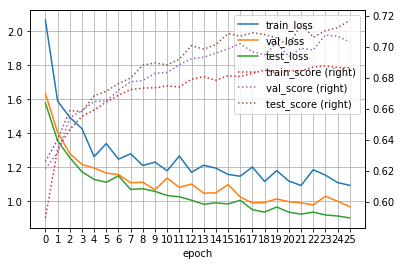

[NAME: Dense_3, EPOCH: 26]
> Train...
> Validation...
주야              0.680702
요일              0.139535
사망자수            0.953319
사상자수            0.805692
중상자수            0.836594
경상자수            0.880345
부상신고자수          0.978441
발생지시도           0.640138
발생지시군구          0.105802
사고유형_대분류        0.989899
사고유형_중분류        0.584158
법규위반            0.763333
도로형태_대분류        0.948529
도로형태            0.816479
당사자종별_1당_대분류    0.530686
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.689895
요일              0.156667
사망자수            0.968739
사상자수            0.822892
중상자수            0.854993
경상자수            0.858913
부상신고자수          0.974482
발생지시도           0.663366
발생지시군구          0.140000
사고유형_대분류        0.992248
사고유형_중분류        0.575862
법규위반            0.731293
도로형태_대분류        0.934483
도로형태            0.832117
당사자종별_1당_대분류    0.542955
당사자종별_2당_대분류    0.758741
Name: score, dtype: float64
[train] loss: 1.146 num_loss: 0.3596 cat_loss: 0.7868
score: 0.6873 num_score: 0

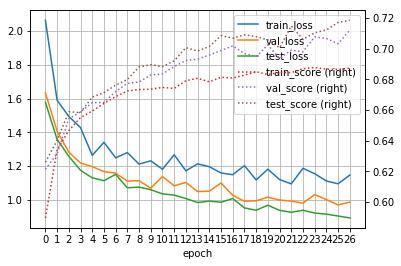

[NAME: Dense_3, EPOCH: 27]
> Train...
> Validation...
주야              0.694737
요일              0.158915
사망자수            0.950327
사상자수            0.788884
중상자수            0.847590
경상자수            0.868955
부상신고자수          0.978441
발생지시도           0.647059
발생지시군구          0.105802
사고유형_대분류        0.993266
사고유형_중분류        0.597360
법규위반            0.756667
도로형태_대분류        0.937500
도로형태            0.850187
당사자종별_1당_대분류    0.552347
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.662021
요일              0.180000
사망자수            0.965558
사상자수            0.828878
중상자수            0.874002
경상자수            0.844842
부상신고자수          0.974482
발생지시도           0.679868
발생지시군구          0.116000
사고유형_대분류        0.992248
사고유형_중분류        0.568966
법규위반            0.748299
도로형태_대분류        0.927586
도로형태            0.828467
당사자종별_1당_대분류    0.556701
당사자종별_2당_대분류    0.744755
Name: score, dtype: float64
[train] loss: 1.134 num_loss: 0.3496 cat_loss: 0.7842
score: 0.6886 num_score: 0

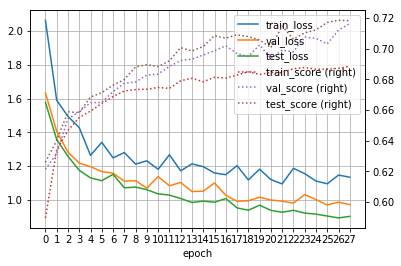

[NAME: Dense_3, EPOCH: 28]
> Train...
> Validation...
주야              0.666667
요일              0.162791
사망자수            0.947700
사상자수            0.799002
중상자수            0.824798
경상자수            0.875905
부상신고자수          0.978441
발생지시도           0.650519
발생지시군구          0.109215
사고유형_대분류        0.979798
사고유형_중분류        0.504950
법규위반            0.760000
도로형태_대분류        0.952206
도로형태            0.823970
당사자종별_1당_대분류    0.537906
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.682927
요일              0.173333
사망자수            0.969750
사상자수            0.825212
중상자수            0.846265
경상자수            0.859045
부상신고자수          0.974482
발생지시도           0.663366
발생지시군구          0.144000
사고유형_대분류        0.992248
사고유형_중분류        0.565517
법규위반            0.761905
도로형태_대분류        0.941379
도로형태            0.813869
당사자종별_1당_대분류    0.577320
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.112 num_loss: 0.3277 cat_loss: 0.784
score: 0.6859 num_score: 0.

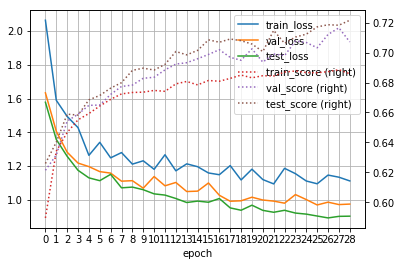

[NAME: Dense_3, EPOCH: 29]
> Train...
> Validation...
주야              0.694737
요일              0.147287
사망자수            0.950766
사상자수            0.812253
중상자수            0.855100
경상자수            0.859310
부상신고자수          0.978441
발생지시도           0.647059
발생지시군구          0.078498
사고유형_대분류        0.983165
사고유형_중분류        0.570957
법규위반            0.760000
도로형태_대분류        0.941176
도로형태            0.827715
당사자종별_1당_대분류    0.527076
당사자종별_2당_대분류    0.759868
Name: score, dtype: float64
> Test...
주야              0.710801
요일              0.160000
사망자수            0.967314
사상자수            0.795322
중상자수            0.854358
경상자수            0.847094
부상신고자수          0.974482
발생지시도           0.660066
발생지시군구          0.124000
사고유형_대분류        1.000000
사고유형_중분류        0.575862
법규위반            0.714286
도로형태_대분류        0.920690
도로형태            0.817518
당사자종별_1당_대분류    0.529210
당사자종별_2당_대분류    0.748252
Name: score, dtype: float64
[train] loss: 1.08 num_loss: 0.2975 cat_loss: 0.7827
score: 0.6906 num_score: 0.

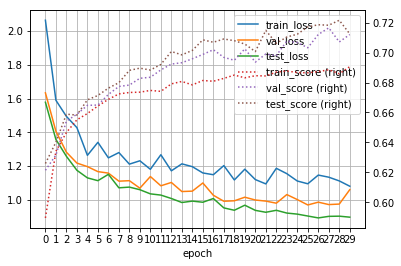

[NAME: Dense_4, EPOCH: 0]
> Train...
> Validation...
주야              0.575439
요일              0.139535
사망자수            0.894137
사상자수            0.640164
중상자수            0.819121
경상자수            0.859024
부상신고자수          0.978441
발생지시도           0.166090
발생지시군구          0.027304
사고유형_대분류        0.922559
사고유형_중분류        0.389439
법규위반            0.756667
도로형태_대분류        0.897059
도로형태            0.782772
당사자종별_1당_대분류    0.418773
당사자종별_2당_대분류    0.641447
Name: score, dtype: float64
> Test...
주야              0.554007
요일              0.150000
사망자수            0.893647
사상자수            0.612097
중상자수            0.806028
경상자수            0.846555
부상신고자수          0.974482
발생지시도           0.181518
발생지시군구          0.040000
사고유형_대분류        0.968992
사고유형_중분류        0.437931
법규위반            0.704082
도로형태_대분류        0.875862
도로형태            0.777372
당사자종별_1당_대분류    0.422680
당사자종별_2당_대분류    0.650350
Name: score, dtype: float64
[train] loss: 2.169 num_loss: 0.5479 cat_loss: 1.621
score: 0.5897 num_score: 0.8

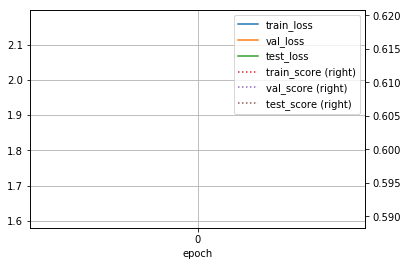

[NAME: Dense_4, EPOCH: 1]
> Train...
> Validation...
주야              0.582456
요일              0.158915
사망자수            0.884013
사상자수            0.621413
중상자수            0.807820
경상자수            0.860589
부상신고자수          0.978441
발생지시도           0.269896
발생지시군구          0.085324
사고유형_대분류        0.946128
사고유형_중분류        0.445545
법규위반            0.736667
도로형태_대분류        0.893382
도로형태            0.737828
당사자종별_1당_대분류    0.404332
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.623693
요일              0.153333
사망자수            0.918225
사상자수            0.643205
중상자수            0.827746
경상자수            0.839303
부상신고자수          0.974482
발생지시도           0.323432
발생지시군구          0.064000
사고유형_대분류        0.968992
사고유형_중분류        0.427586
법규위반            0.687075
도로형태_대분류        0.886207
도로형태            0.729927
당사자종별_1당_대분류    0.419244
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.683 num_loss: 0.5361 cat_loss: 1.147
score: 0.6347 num_score: 0.8

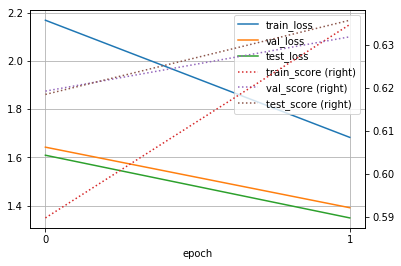

[NAME: Dense_4, EPOCH: 2]
> Train...
> Validation...
주야              0.582456
요일              0.120155
사망자수            0.930676
사상자수            0.708946
중상자수            0.819619
경상자수            0.866745
부상신고자수          0.978441
발생지시도           0.397924
발생지시군구          0.061433
사고유형_대분류        0.936027
사고유형_중분류        0.452145
법규위반            0.720000
도로형태_대분류        0.926471
도로형태            0.782772
당사자종별_1당_대분류    0.440433
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.602787
요일              0.153333
사망자수            0.944793
사상자수            0.739174
중상자수            0.816235
경상자수            0.842803
부상신고자수          0.974482
발생지시도           0.386139
발생지시군구          0.076000
사고유형_대분류        0.980620
사고유형_중분류        0.389655
법규위반            0.724490
도로형태_대분류        0.872414
도로형태            0.762774
당사자종별_1당_대분류    0.501718
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.391 num_loss: 0.41 cat_loss: 0.9806
score: 0.6489 num_score: 0.85

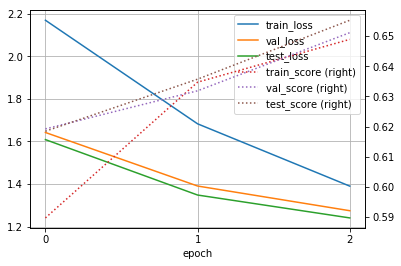

[NAME: Dense_4, EPOCH: 3]
> Train...
> Validation...
주야              0.589474
요일              0.151163
사망자수            0.933693
사상자수            0.726706
중상자수            0.827527
경상자수            0.865231
부상신고자수          0.978441
발생지시도           0.456747
발생지시군구          0.071672
사고유형_대분류        0.936027
사고유형_중분류        0.435644
법규위반            0.733333
도로형태_대분류        0.904412
도로형태            0.808989
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.667763
Name: score, dtype: float64
> Test...
주야              0.630662
요일              0.130000
사망자수            0.936873
사상자수            0.744671
중상자수            0.829635
경상자수            0.841346
부상신고자수          0.974482
발생지시도           0.465347
발생지시군구          0.068000
사고유형_대분류        0.965116
사고유형_중분류        0.403448
법규위반            0.721088
도로형태_대분류        0.893103
도로형태            0.766423
당사자종별_1당_대분류    0.484536
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.422 num_loss: 0.5064 cat_loss: 0.9155
score: 0.6588 num_score: 0.

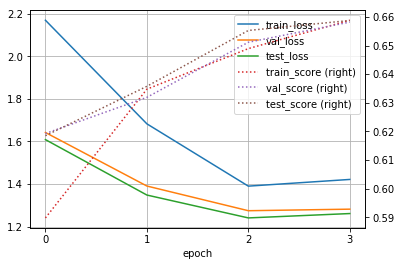

[NAME: Dense_4, EPOCH: 4]
> Train...
> Validation...
주야              0.656140
요일              0.178295
사망자수            0.938753
사상자수            0.781279
중상자수            0.822904
경상자수            0.863495
부상신고자수          0.978441
발생지시도           0.442907
발생지시군구          0.068259
사고유형_대분류        0.956229
사고유형_중분류        0.412541
법규위반            0.743333
도로형태_대분류        0.908088
도로형태            0.797753
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.173333
사망자수            0.955232
사상자수            0.767405
중상자수            0.850182
경상자수            0.841723
부상신고자수          0.974482
발생지시도           0.511551
발생지시군구          0.084000
사고유형_대분류        0.984496
사고유형_중분류        0.437931
법규위반            0.734694
도로형태_대분류        0.903448
도로형태            0.744526
당사자종별_1당_대분류    0.470790
당사자종별_2당_대분류    0.685315
Name: score, dtype: float64
[train] loss: 1.294 num_loss: 0.4229 cat_loss: 0.8712
score: 0.6611 num_score: 0.

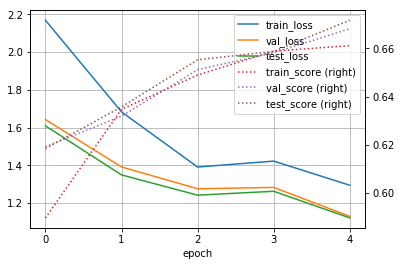

[NAME: Dense_4, EPOCH: 5]
> Train...
> Validation...
주야              0.659649
요일              0.182171
사망자수            0.924102
사상자수            0.692425
중상자수            0.802849
경상자수            0.859702
부상신고자수          0.978441
발생지시도           0.550173
발생지시군구          0.085324
사고유형_대분류        0.973064
사고유형_중분류        0.412541
법규위반            0.746667
도로형태_대분류        0.919118
도로형태            0.823970
당사자종별_1당_대분류    0.505415
당사자종별_2당_대분류    0.684211
Name: score, dtype: float64
> Test...
주야              0.616725
요일              0.140000
사망자수            0.939236
사상자수            0.749053
중상자수            0.836887
경상자수            0.846706
부상신고자수          0.974482
발생지시도           0.551155
발생지시군구          0.100000
사고유형_대분류        0.984496
사고유형_중분류        0.413793
법규위반            0.721088
도로형태_대분류        0.913793
도로형태            0.755474
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.301 num_loss: 0.4563 cat_loss: 0.8447
score: 0.6634 num_score: 0.

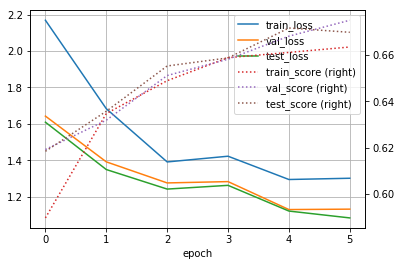

[NAME: Dense_4, EPOCH: 6]
> Train...
> Validation...
주야              0.614035
요일              0.182171
사망자수            0.942954
사상자수            0.769375
중상자수            0.835133
경상자수            0.863597
부상신고자수          0.978441
발생지시도           0.536332
발생지시군구          0.078498
사고유형_대분류        0.959596
사고유형_중분류        0.458746
법규위반            0.720000
도로형태_대분류        0.911765
도로형태            0.775281
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.585366
요일              0.150000
사망자수            0.956706
사상자수            0.779800
중상자수            0.847842
경상자수            0.838068
부상신고자수          0.974482
발생지시도           0.597360
발생지시군구          0.072000
사고유형_대분류        0.988372
사고유형_중분류        0.431034
법규위반            0.731293
도로형태_대분류        0.927586
도로형태            0.788321
당사자종별_1당_대분류    0.457045
당사자종별_2당_대분류    0.713287
Name: score, dtype: float64
[train] loss: 1.214 num_loss: 0.3857 cat_loss: 0.8278
score: 0.6696 num_score: 0.

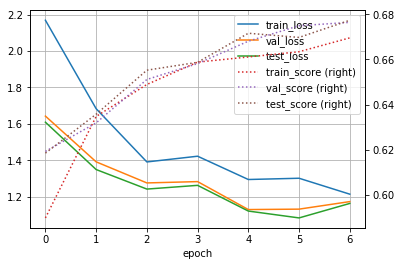

[NAME: Dense_4, EPOCH: 7]
> Train...
> Validation...
주야              0.666667
요일              0.158915
사망자수            0.950245
사상자수            0.789398
중상자수            0.840425
경상자수            0.858580
부상신고자수          0.978441
발생지시도           0.602076
발생지시군구          0.088737
사고유형_대분류        0.959596
사고유형_중분류        0.435644
법규위반            0.773333
도로형태_대분류        0.922794
도로형태            0.797753
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.627178
요일              0.200000
사망자수            0.961432
사상자수            0.794364
중상자수            0.822778
경상자수            0.839264
부상신고자수          0.974482
발생지시도           0.610561
발생지시군구          0.080000
사고유형_대분류        0.976744
사고유형_중분류        0.434483
법규위반            0.714286
도로형태_대분류        0.900000
도로형태            0.781022
당사자종별_1당_대분류    0.481100
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.234 num_loss: 0.4197 cat_loss: 0.8145
score: 0.6721 num_score: 0.

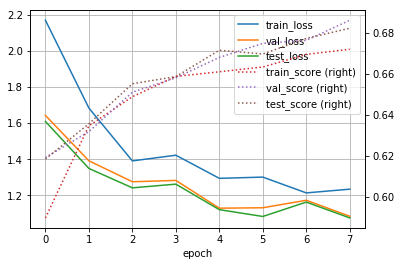

[NAME: Dense_4, EPOCH: 8]
> Train...
> Validation...
주야              0.656140
요일              0.166667
사망자수            0.942767
사상자수            0.769251
중상자수            0.830688
경상자수            0.868010
부상신고자수          0.978441
발생지시도           0.612457
발생지시군구          0.075085
사고유형_대분류        0.962963
사고유형_중분류        0.468647
법규위반            0.756667
도로형태_대분류        0.926471
도로형태            0.786517
당사자종별_1당_대분류    0.422383
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.609756
요일              0.170000
사망자수            0.963072
사상자수            0.777101
중상자수            0.856325
경상자수            0.853490
부상신고자수          0.974482
발생지시도           0.620462
발생지시군구          0.096000
사고유형_대분류        0.972868
사고유형_중분류        0.462069
법규위반            0.751701
도로형태_대분류        0.917241
도로형태            0.773723
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.222 num_loss: 0.415 cat_loss: 0.8072
score: 0.6727 num_score: 0.8

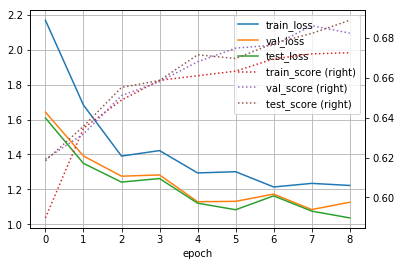

[NAME: Dense_4, EPOCH: 9]
> Train...
> Validation...
주야              0.575439
요일              0.178295
사망자수            0.949477
사상자수            0.791487
중상자수            0.826532
경상자수            0.865024
부상신고자수          0.978441
발생지시도           0.640138
발생지시군구          0.068259
사고유형_대분류        0.959596
사고유형_중분류        0.468647
법규위반            0.753333
도로형태_대분류        0.908088
도로형태            0.764045
당사자종별_1당_대분류    0.444043
당사자종별_2당_대분류    0.687500
Name: score, dtype: float64
> Test...
주야              0.651568
요일              0.186667
사망자수            0.961610
사상자수            0.756620
중상자수            0.860085
경상자수            0.839463
부상신고자수          0.974482
발생지시도           0.633663
발생지시군구          0.100000
사고유형_대분류        0.984496
사고유형_중분류        0.472414
법규위반            0.755102
도로형태_대분류        0.913793
도로형태            0.766423
당사자종별_1당_대분류    0.505155
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[train] loss: 1.24 num_loss: 0.4425 cat_loss: 0.797
score: 0.6752 num_score: 0.87

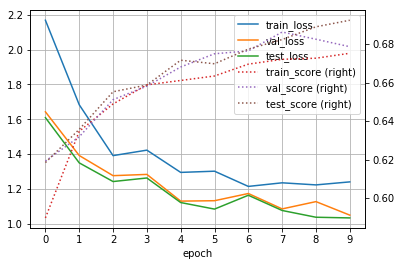

[NAME: Dense_4, EPOCH: 10]
> Train...
> Validation...
주야              0.610526
요일              0.131783
사망자수            0.938837
사상자수            0.774023
중상자수            0.833662
경상자수            0.866513
부상신고자수          0.978441
발생지시도           0.608997
발생지시군구          0.092150
사고유형_대분류        0.966330
사고유형_중분류        0.468647
법규위반            0.736667
도로형태_대분류        0.930147
도로형태            0.794007
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.700658
Name: score, dtype: float64
> Test...
주야              0.630662
요일              0.206667
사망자수            0.960946
사상자수            0.797437
중상자수            0.833643
경상자수            0.844154
부상신고자수          0.974482
발생지시도           0.653465
발생지시군구          0.096000
사고유형_대분류        0.988372
사고유형_중분류        0.482759
법규위반            0.768707
도로형태_대분류        0.917241
도로형태            0.755474
당사자종별_1당_대분류    0.487973
당사자종별_2당_대분류    0.709790
Name: score, dtype: float64
[train] loss: 1.178 num_loss: 0.3901 cat_loss: 0.7875
score: 0.6788 num_score: 0

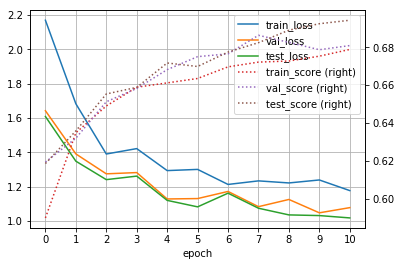

[NAME: Dense_4, EPOCH: 11]
> Train...
> Validation...
주야              0.617544
요일              0.189922
사망자수            0.946525
사상자수            0.781120
중상자수            0.839565
경상자수            0.867656
부상신고자수          0.978441
발생지시도           0.619377
발생지시군구          0.088737
사고유형_대분류        0.976431
사고유형_중분류        0.468647
법규위반            0.770000
도로형태_대분류        0.919118
도로형태            0.794007
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.697368
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.196667
사망자수            0.966730
사상자수            0.792421
중상자수            0.842233
경상자수            0.845865
부상신고자수          0.974482
발생지시도           0.656766
발생지시군구          0.084000
사고유형_대분류        0.976744
사고유형_중분류        0.455172
법규위반            0.751701
도로형태_대분류        0.913793
도로형태            0.781022
당사자종별_1당_대분류    0.508591
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[train] loss: 1.153 num_loss: 0.3693 cat_loss: 0.784
score: 0.6787 num_score: 0.

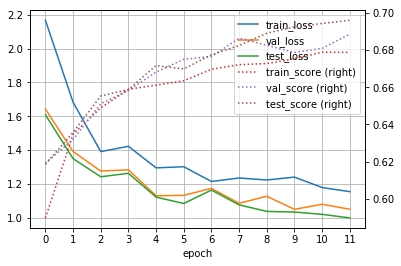

[NAME: Dense_4, EPOCH: 12]
> Train...
> Validation...
주야              0.621053
요일              0.155039
사망자수            0.948803
사상자수            0.775922
중상자수            0.815876
경상자수            0.868949
부상신고자수          0.978441
발생지시도           0.647059
발생지시군구          0.095563
사고유형_대분류        0.969697
사고유형_중분류        0.458746
법규위반            0.750000
도로형태_대분류        0.933824
도로형태            0.812734
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.694079
Name: score, dtype: float64
> Test...
주야              0.675958
요일              0.156667
사망자수            0.965872
사상자수            0.772835
중상자수            0.844643
경상자수            0.845626
부상신고자수          0.974482
발생지시도           0.660066
발생지시군구          0.116000
사고유형_대분류        0.992248
사고유형_중분류        0.468966
법규위반            0.775510
도로형태_대분류        0.934483
도로형태            0.810219
당사자종별_1당_대분류    0.508591
당사자종별_2당_대분류    0.734266
Name: score, dtype: float64
[train] loss: 1.194 num_loss: 0.4173 cat_loss: 0.7762
score: 0.6792 num_score: 0

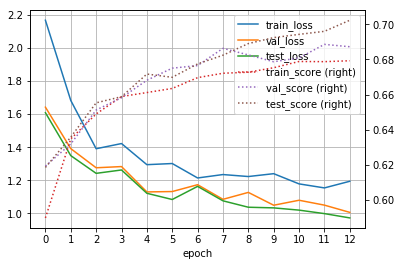

[NAME: Dense_4, EPOCH: 13]
> Train...
> Validation...
주야              0.656140
요일              0.217054
사망자수            0.941698
사상자수            0.791771
중상자수            0.848516
경상자수            0.860631
부상신고자수          0.978441
발생지시도           0.650519
발생지시군구          0.092150
사고유형_대분류        0.976431
사고유형_중분류        0.531353
법규위반            0.750000
도로형태_대분류        0.937500
도로형태            0.838951
당사자종별_1당_대분류    0.465704
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.641115
요일              0.163333
사망자수            0.951474
사상자수            0.795887
중상자수            0.856846
경상자수            0.856813
부상신고자수          0.974482
발생지시도           0.679868
발생지시군구          0.120000
사고유형_대분류        0.988372
사고유형_중분류        0.458621
법규위반            0.748299
도로형태_대분류        0.917241
도로형태            0.806569
당사자종별_1당_대분류    0.518900
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[train] loss: 1.129 num_loss: 0.355 cat_loss: 0.7739
score: 0.6813 num_score: 0.

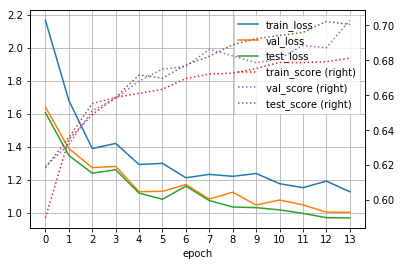

[NAME: Dense_4, EPOCH: 14]
> Train...
> Validation...
주야              0.628070
요일              0.155039
사망자수            0.941010
사상자수            0.776200
중상자수            0.826667
경상자수            0.875155
부상신고자수          0.978441
발생지시도           0.647059
발생지시군구          0.098976
사고유형_대분류        0.976431
사고유형_중분류        0.528053
법규위반            0.773333
도로형태_대분류        0.941176
도로형태            0.831461
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.726974
Name: score, dtype: float64
> Test...
주야              0.658537
요일              0.176667
사망자수            0.961653
사상자수            0.811348
중상자수            0.845263
경상자수            0.846724
부상신고자수          0.974482
발생지시도           0.676568
발생지시군구          0.128000
사고유형_대분류        0.992248
사고유형_중분류        0.468966
법규위반            0.748299
도로형태_대분류        0.920690
도로형태            0.810219
당사자종별_1당_대분류    0.522337
당사자종별_2당_대분류    0.751748
Name: score, dtype: float64
[train] loss: 1.129 num_loss: 0.3593 cat_loss: 0.7694
score: 0.6819 num_score: 0

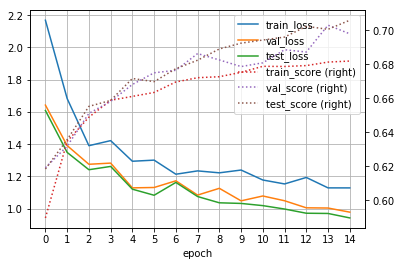

[NAME: Dense_4, EPOCH: 15]
> Train...
> Validation...
주야              0.684211
요일              0.217054
사망자수            0.942663
사상자수            0.745358
중상자수            0.822769
경상자수            0.857312
부상신고자수          0.978441
발생지시도           0.664360
발생지시군구          0.102389
사고유형_대분류        0.986532
사고유형_중분류        0.501650
법규위반            0.773333
도로형태_대분류        0.930147
도로형태            0.797753
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.644599
요일              0.170000
사망자수            0.966790
사상자수            0.792807
중상자수            0.846156
경상자수            0.851034
부상신고자수          0.974482
발생지시도           0.689769
발생지시군구          0.080000
사고유형_대분류        0.996124
사고유형_중분류        0.472414
법규위반            0.748299
도로형태_대분류        0.937931
도로형태            0.791971
당사자종별_1당_대분류    0.463918
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.101 num_loss: 0.3346 cat_loss: 0.7661
score: 0.6821 num_score: 0

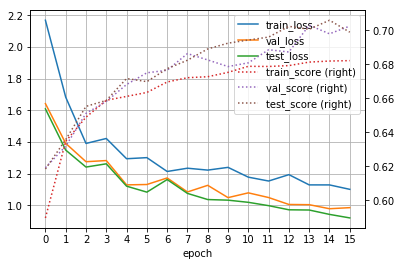

[NAME: Dense_4, EPOCH: 16]
> Train...
> Validation...
주야              0.680702
요일              0.189922
사망자수            0.944795
사상자수            0.786518
중상자수            0.833862
경상자수            0.847467
부상신고자수          0.978441
발생지시도           0.681661
발생지시군구          0.092150
사고유형_대분류        0.983165
사고유형_중분류        0.554455
법규위반            0.776667
도로형태_대분류        0.937500
도로형태            0.797753
당사자종별_1당_대분류    0.451264
당사자종별_2당_대분류    0.750000
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.163333
사망자수            0.962988
사상자수            0.794496
중상자수            0.848325
경상자수            0.848497
부상신고자수          0.974482
발생지시도           0.666667
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.472414
법규위반            0.761905
도로형태_대분류        0.931034
도로형태            0.799270
당사자종별_1당_대분류    0.505155
당사자종별_2당_대분류    0.758741
Name: score, dtype: float64
[train] loss: 1.135 num_loss: 0.3733 cat_loss: 0.7614
score: 0.6856 num_score: 0

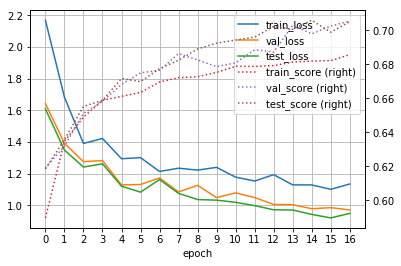

[NAME: Dense_4, EPOCH: 17]
> Train...
> Validation...
주야              0.652632
요일              0.189922
사망자수            0.952832
사상자수            0.793453
중상자수            0.812926
경상자수            0.864795
부상신고자수          0.978441
발생지시도           0.667820
발생지시군구          0.098976
사고유형_대분류        0.973064
사고유형_중분류        0.531353
법규위반            0.770000
도로형태_대분류        0.937500
도로형태            0.805243
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
> Test...
주야              0.693380
요일              0.190000
사망자수            0.966442
사상자수            0.803081
중상자수            0.852982
경상자수            0.853664
부상신고자수          0.974482
발생지시도           0.706271
발생지시군구          0.104000
사고유형_대분류        0.992248
사고유형_중분류        0.489655
법규위반            0.768707
도로형태_대분류        0.910345
도로형태            0.791971
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.099 num_loss: 0.3385 cat_loss: 0.7608
score: 0.685 num_score: 0.

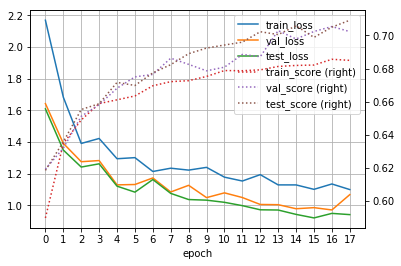

[NAME: Dense_4, EPOCH: 18]
> Train...
> Validation...
주야              0.656140
요일              0.186047
사망자수            0.953073
사상자수            0.820634
중상자수            0.832122
경상자수            0.878966
부상신고자수          0.978441
발생지시도           0.667820
발생지시군구          0.081911
사고유형_대분류        0.983165
사고유형_중분류        0.537954
법규위반            0.760000
도로형태_대분류        0.941176
도로형태            0.838951
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.746711
Name: score, dtype: float64
> Test...
주야              0.721254
요일              0.216667
사망자수            0.966616
사상자수            0.817566
중상자수            0.853631
경상자수            0.859824
부상신고자수          0.974482
발생지시도           0.709571
발생지시군구          0.104000
사고유형_대분류        0.996124
사고유형_중분류        0.493103
법규위반            0.772109
도로형태_대분류        0.924138
도로형태            0.817518
당사자종별_1당_대분류    0.518900
당사자종별_2당_대분류    0.744755
Name: score, dtype: float64
[train] loss: 1.08 num_loss: 0.3228 cat_loss: 0.7575
score: 0.6852 num_score: 0.

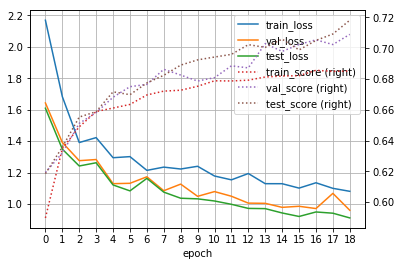

[NAME: Dense_4, EPOCH: 19]
> Train...
> Validation...
주야              0.652632
요일              0.174419
사망자수            0.949957
사상자수            0.797304
중상자수            0.835780
경상자수            0.856079
부상신고자수          0.978441
발생지시도           0.678201
발생지시군구          0.088737
사고유형_대분류        0.983165
사고유형_중분류        0.498350
법규위반            0.780000
도로형태_대분류        0.926471
도로형태            0.805243
당사자종별_1당_대분류    0.476534
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
> Test...
주야              0.724739
요일              0.173333
사망자수            0.970238
사상자수            0.787868
중상자수            0.870543
경상자수            0.840452
부상신고자수          0.974482
발생지시도           0.712871
발생지시군구          0.140000
사고유형_대분류        0.992248
사고유형_중분류        0.527586
법규위반            0.744898
도로형태_대분류        0.920690
도로형태            0.813869
당사자종별_1당_대분류    0.515464
당사자종별_2당_대분류    0.765734
Name: score, dtype: float64
[train] loss: 1.096 num_loss: 0.341 cat_loss: 0.7555
score: 0.6849 num_score: 0.

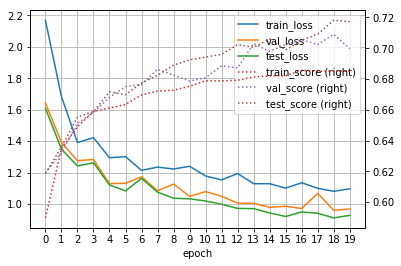

[NAME: Dense_4, EPOCH: 20]
> Train...
> Validation...
주야              0.621053
요일              0.135659
사망자수            0.947829
사상자수            0.791753
중상자수            0.833990
경상자수            0.864293
부상신고자수          0.978441
발생지시도           0.657439
발생지시군구          0.071672
사고유형_대분류        0.973064
사고유형_중분류        0.468647
법규위반            0.763333
도로형태_대분류        0.944853
도로형태            0.782772
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.637631
요일              0.186667
사망자수            0.969934
사상자수            0.807382
중상자수            0.863749
경상자수            0.842413
부상신고자수          0.974482
발생지시도           0.706271
발생지시군구          0.140000
사고유형_대분류        0.992248
사고유형_중분류        0.506897
법규위반            0.775510
도로형태_대분류        0.906897
도로형태            0.791971
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.751748
Name: score, dtype: float64
[train] loss: 1.099 num_loss: 0.3449 cat_loss: 0.7542
score: 0.6863 num_score: 0

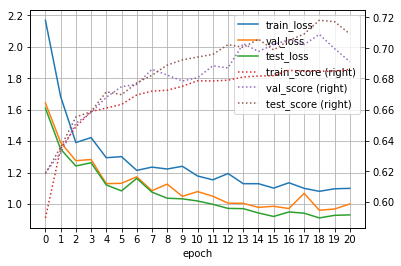

[NAME: Dense_4, EPOCH: 21]
> Train...
> Validation...
주야              0.691228
요일              0.217054
사망자수            0.953346
사상자수            0.800603
중상자수            0.840722
경상자수            0.875320
부상신고자수          0.978441
발생지시도           0.692042
발생지시군구          0.102389
사고유형_대분류        0.976431
사고유형_중분류        0.537954
법규위반            0.756667
도로형태_대분류        0.926471
도로형태            0.801498
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.703833
요일              0.146667
사망자수            0.970147
사상자수            0.816690
중상자수            0.860208
경상자수            0.849856
부상신고자수          0.974482
발생지시도           0.719472
발생지시군구          0.100000
사고유형_대분류        0.996124
사고유형_중분류        0.486207
법규위반            0.751701
도로형태_대분류        0.924138
도로형태            0.813869
당사자종별_1당_대분류    0.536082
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.167 num_loss: 0.4167 cat_loss: 0.7508
score: 0.6871 num_score: 0

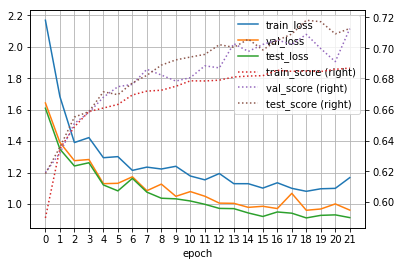

[NAME: Dense_4, EPOCH: 22]
> Train...
> Validation...
주야              0.656140
요일              0.139535
사망자수            0.954569
사상자수            0.782077
중상자수            0.827964
경상자수            0.866099
부상신고자수          0.978441
발생지시도           0.647059
발생지시군구          0.092150
사고유형_대분류        0.989899
사고유형_중분류        0.544554
법규위반            0.780000
도로형태_대분류        0.933824
도로형태            0.831461
당사자종별_1당_대분류    0.476534
당사자종별_2당_대분류    0.703947
Name: score, dtype: float64
> Test...
주야              0.675958
요일              0.176667
사망자수            0.972042
사상자수            0.818559
중상자수            0.855255
경상자수            0.857606
부상신고자수          0.974482
발생지시도           0.696370
발생지시군구          0.132000
사고유형_대분류        0.996124
사고유형_중분류        0.482759
법규위반            0.755102
도로형태_대분류        0.937931
도로형태            0.824818
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.762238
Name: score, dtype: float64
[train] loss: 1.099 num_loss: 0.3485 cat_loss: 0.7508
score: 0.687 num_score: 0.

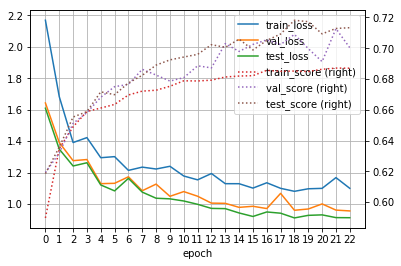

[NAME: Dense_4, EPOCH: 23]
> Train...
> Validation...
주야              0.635088
요일              0.224806
사망자수            0.951802
사상자수            0.808211
중상자수            0.837376
경상자수            0.860081
부상신고자수          0.978441
발생지시도           0.671280
발생지시군구          0.109215
사고유형_대분류        0.983165
사고유형_중분류        0.551155
법규위반            0.773333
도로형태_대분류        0.944853
도로형태            0.835206
당사자종별_1당_대분류    0.509025
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.682927
요일              0.190000
사망자수            0.965480
사상자수            0.807276
중상자수            0.860098
경상자수            0.858795
부상신고자수          0.974482
발생지시도           0.696370
발생지시군구          0.136000
사고유형_대분류        0.996124
사고유형_중분류        0.524138
법규위반            0.768707
도로형태_대분류        0.927586
도로형태            0.832117
당사자종별_1당_대분류    0.515464
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.073 num_loss: 0.3238 cat_loss: 0.7493
score: 0.6884 num_score: 0

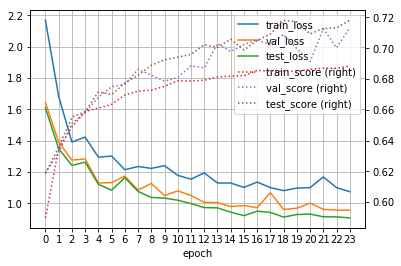

[NAME: Dense_4, EPOCH: 24]
> Train...
> Validation...
주야              0.652632
요일              0.205426
사망자수            0.947207
사상자수            0.795228
중상자수            0.841874
경상자수            0.870621
부상신고자수          0.978441
발생지시도           0.671280
발생지시군구          0.085324
사고유형_대분류        0.993266
사고유형_중분류        0.501650
법규위반            0.786667
도로형태_대분류        0.933824
도로형태            0.812734
당사자종별_1당_대분류    0.505415
당사자종별_2당_대분류    0.769737
Name: score, dtype: float64
> Test...
주야              0.668990
요일              0.160000
사망자수            0.968315
사상자수            0.823265
중상자수            0.862892
경상자수            0.849815
부상신고자수          0.974482
발생지시도           0.679868
발생지시군구          0.120000
사고유형_대분류        1.000000
사고유형_중분류        0.486207
법규위반            0.731293
도로형태_대분류        0.927586
도로형태            0.791971
당사자종별_1당_대분류    0.539519
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.117 num_loss: 0.3693 cat_loss: 0.7474
score: 0.6877 num_score: 0

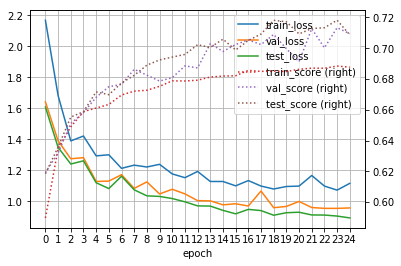

[NAME: Dense_4, EPOCH: 25]
> Train...
> Validation...
주야              0.656140
요일              0.197674
사망자수            0.948411
사상자수            0.772486
중상자수            0.834501
경상자수            0.867307
부상신고자수          0.978441
발생지시도           0.688581
발생지시군구          0.112628
사고유형_대분류        0.983165
사고유형_중분류        0.495050
법규위반            0.780000
도로형태_대분류        0.933824
도로형태            0.786517
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.730263
Name: score, dtype: float64
> Test...
주야              0.693380
요일              0.213333
사망자수            0.970224
사상자수            0.820494
중상자수            0.858268
경상자수            0.851477
부상신고자수          0.974482
발생지시도           0.712871
발생지시군구          0.116000
사고유형_대분류        0.996124
사고유형_중분류        0.472414
법규위반            0.765306
도로형태_대분류        0.944828
도로형태            0.813869
당사자종별_1당_대분류    0.518900
당사자종별_2당_대분류    0.748252
Name: score, dtype: float64
[train] loss: 1.079 num_loss: 0.3308 cat_loss: 0.7482
score: 0.6878 num_score: 0

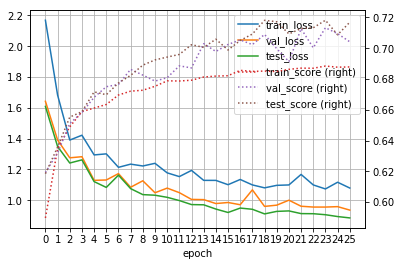

[NAME: Dense_4, EPOCH: 26]
> Train...
> Validation...
주야              0.656140
요일              0.193798
사망자수            0.951462
사상자수            0.806697
중상자수            0.860296
경상자수            0.864989
부상신고자수          0.978441
발생지시도           0.678201
발생지시군구          0.088737
사고유형_대분류        0.983165
사고유형_중분류        0.524752
법규위반            0.803333
도로형태_대분류        0.941176
도로형태            0.820225
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
> Test...
주야              0.717770
요일              0.183333
사망자수            0.967314
사상자수            0.839518
중상자수            0.863695
경상자수            0.858662
부상신고자수          0.974482
발생지시도           0.716172
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.500000
법규위반            0.761905
도로형태_대분류        0.937931
도로형태            0.832117
당사자종별_1당_대분류    0.556701
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.112 num_loss: 0.366 cat_loss: 0.7456
score: 0.6902 num_score: 0.

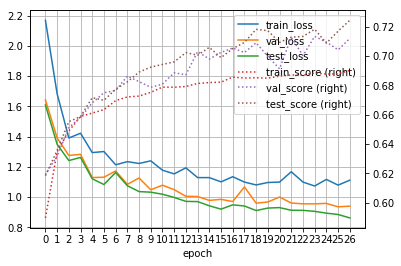

[NAME: Dense_4, EPOCH: 27]
> Train...
> Validation...
주야              0.673684
요일              0.186047
사망자수            0.953728
사상자수            0.820676
중상자수            0.842551
경상자수            0.876939
부상신고자수          0.978441
발생지시도           0.678201
발생지시군구          0.119454
사고유형_대분류        0.979798
사고유형_중분류        0.511551
법규위반            0.756667
도로형태_대분류        0.933824
도로형태            0.831461
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
> Test...
주야              0.655052
요일              0.190000
사망자수            0.972664
사상자수            0.802536
중상자수            0.863389
경상자수            0.868010
부상신고자수          0.974482
발생지시도           0.689769
발생지시군구          0.128000
사고유형_대분류        0.996124
사고유형_중분류        0.462069
법규위반            0.765306
도로형태_대분류        0.920690
도로형태            0.795620
당사자종별_1당_대분류    0.525773
당사자종별_2당_대분류    0.786713
Name: score, dtype: float64
[train] loss: 1.051 num_loss: 0.3061 cat_loss: 0.7454
score: 0.6903 num_score: 0

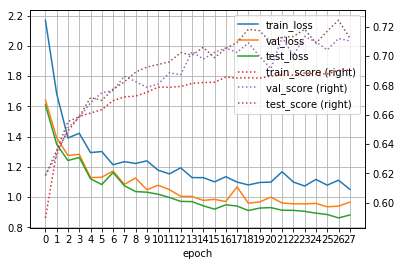

[NAME: Dense_4, EPOCH: 28]
> Train...
> Validation...
주야              0.673684
요일              0.197674
사망자수            0.952506
사상자수            0.790644
중상자수            0.838511
경상자수            0.883589
부상신고자수          0.978441
발생지시도           0.688581
발생지시군구          0.095563
사고유형_대분류        0.993266
사고유형_중분류        0.554455
법규위반            0.773333
도로형태_대분류        0.930147
도로형태            0.835206
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.723684
Name: score, dtype: float64
> Test...
주야              0.686411
요일              0.163333
사망자수            0.971500
사상자수            0.820410
중상자수            0.862672
경상자수            0.854082
부상신고자수          0.974482
발생지시도           0.735974
발생지시군구          0.132000
사고유형_대분류        0.992248
사고유형_중분류        0.493103
법규위반            0.768707
도로형태_대분류        0.944828
도로형태            0.821168
당사자종별_1당_대분류    0.567010
당사자종별_2당_대분류    0.744755
Name: score, dtype: float64
[train] loss: 1.066 num_loss: 0.3219 cat_loss: 0.7443
score: 0.6907 num_score: 0

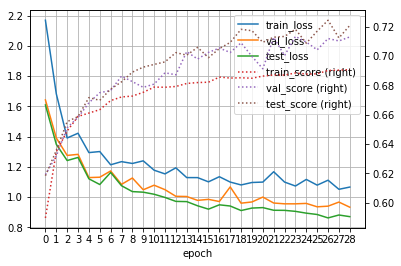

[NAME: Dense_4, EPOCH: 29]
> Train...
> Validation...
주야              0.680702
요일              0.162791
사망자수            0.944196
사상자수            0.785524
중상자수            0.854211
경상자수            0.866509
부상신고자수          0.978441
발생지시도           0.681661
발생지시군구          0.095563
사고유형_대분류        0.979798
사고유형_중분류        0.551155
법규위반            0.773333
도로형태_대분류        0.926471
도로형태            0.805243
당사자종별_1당_대분류    0.548736
당사자종별_2당_대분류    0.756579
Name: score, dtype: float64
> Test...
주야              0.686411
요일              0.213333
사망자수            0.968711
사상자수            0.809298
중상자수            0.870011
경상자수            0.841575
부상신고자수          0.974482
발생지시도           0.722772
발생지시군구          0.104000
사고유형_대분류        0.992248
사고유형_중분류        0.517241
법규위반            0.775510
도로형태_대분류        0.948276
도로형태            0.813869
당사자종별_1당_대분류    0.570447
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[train] loss: 1.114 num_loss: 0.3704 cat_loss: 0.7436
score: 0.6875 num_score: 0

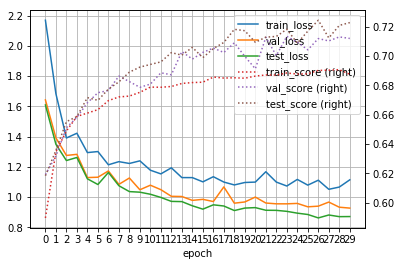


[Ensembled Model Testing]
[Ensemble EPOCH: 0]
Validation Score
주야              0.610526
요일              0.162791
사망자수            0.938755
사상자수            0.797334
중상자수            0.831921
경상자수            0.862369
부상신고자수          0.980010
발생지시도           0.183391
발생지시군구          0.017065
사고유형_대분류        0.936027
사고유형_중분류        0.415842
법규위반            0.736667
도로형태_대분류        0.886029
도로형태            0.764045
당사자종별_1당_대분류    0.462094
당사자종별_2당_대분류    0.680921
Name: score, dtype: float64
Test Score
주야              0.630662
요일              0.146667
사망자수            0.969082
사상자수            0.773834
중상자수            0.828133
경상자수            0.845903
부상신고자수          0.974464
발생지시도           0.204620
발생지시군구          0.024000
사고유형_대분류        0.968992
사고유형_중분류        0.400000
법규위반            0.710884
도로형태_대분류        0.889655
도로형태            0.744526
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.678322
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.6416 num_score: 0.8821 cat_score: 0.5323
[t

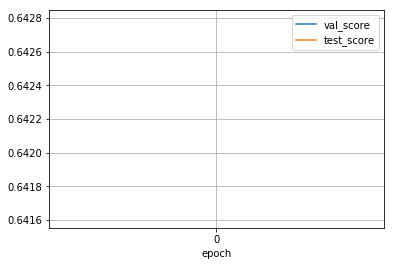

[Ensemble EPOCH: 1]
Validation Score
주야              0.638596
요일              0.158915
사망자수            0.943804
사상자수            0.767363
중상자수            0.842415
경상자수            0.857599
부상신고자수          0.978439
발생지시도           0.297578
발생지시군구          0.051195
사고유형_대분류        0.962963
사고유형_중분류        0.468647
법규위반            0.756667
도로형태_대분류        0.911765
도로형태            0.794007
당사자종별_1당_대분류    0.458484
당사자종별_2당_대분류    0.713816
Name: score, dtype: float64
Test Score
주야              0.700348
요일              0.190000
사망자수            0.967409
사상자수            0.791974
중상자수            0.839376
경상자수            0.849471
부상신고자수          0.974473
발생지시도           0.363036
발생지시군구          0.060000
사고유형_대분류        0.988372
사고유형_중분류        0.479310
법규위반            0.741497
도로형태_대분류        0.893103
도로형태            0.740876
당사자종별_1당_대분류    0.498282
당사자종별_2당_대분류    0.699301
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.6626 num_score: 0.8779 cat_score: 0.5648
[test] score: 0.6736 num_scor

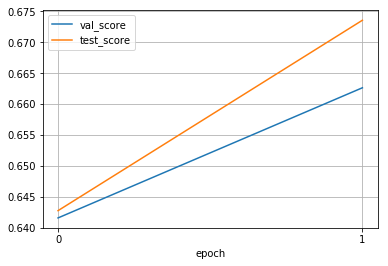

[Ensemble EPOCH: 2]
Validation Score
주야              0.628070
요일              0.170543
사망자수            0.944475
사상자수            0.812878
중상자수            0.830901
경상자수            0.859927
부상신고자수          0.978441
발생지시도           0.422145
발생지시군구          0.061433
사고유형_대분류        0.969697
사고유형_중분류        0.485149
법규위반            0.753333
도로형태_대분류        0.911765
도로형태            0.808989
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
Test Score
주야              0.648084
요일              0.210000
사망자수            0.968810
사상자수            0.833794
중상자수            0.831713
경상자수            0.846573
부상신고자수          0.974482
발생지시도           0.458746
발생지시군구          0.088000
사고유형_대분류        0.988372
사고유형_중분류        0.465517
법규위반            0.741497
도로형태_대분류        0.896552
도로형태            0.773723
당사자종별_1당_대분류    0.512027
당사자종별_2당_대분류    0.716783
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.677 num_score: 0.8853 cat_score: 0.5823
[test] score: 0.6847 num_score

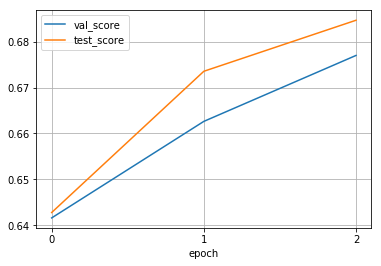

[Ensemble EPOCH: 3]
Validation Score
주야              0.631579
요일              0.170543
사망자수            0.945589
사상자수            0.821824
중상자수            0.833899
경상자수            0.862258
부상신고자수          0.978441
발생지시도           0.491349
발생지시군구          0.075085
사고유형_대분류        0.973064
사고유형_중분류        0.495050
법규위반            0.770000
도로형태_대분류        0.922794
도로형태            0.823970
당사자종별_1당_대분류    0.480144
당사자종별_2당_대분류    0.707237
Name: score, dtype: float64
Test Score
주야              0.644599
요일              0.163333
사망자수            0.969023
사상자수            0.827076
중상자수            0.835970
경상자수            0.848127
부상신고자수          0.974482
발생지시도           0.518152
발생지시군구          0.092000
사고유형_대분류        0.984496
사고유형_중분류        0.472414
법규위반            0.744898
도로형태_대분류        0.913793
도로형태            0.791971
당사자종별_1당_대분류    0.505155
당사자종별_2당_대분류    0.727273
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.6864 num_score: 0.8884 cat_score: 0.5946
[test] score: 0.6883 num_scor

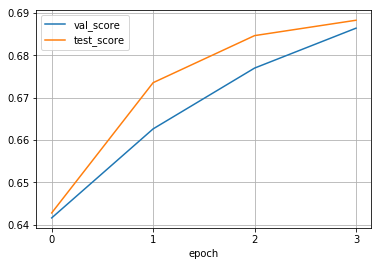

[Ensemble EPOCH: 4]
Validation Score
주야              0.649123
요일              0.186047
사망자수            0.950504
사상자수            0.810368
중상자수            0.822911
경상자수            0.863563
부상신고자수          0.978441
발생지시도           0.550173
발생지시군구          0.092150
사고유형_대분류        0.973064
사고유형_중분류        0.518152
법규위반            0.766667
도로형태_대분류        0.926471
도로형태            0.816479
당사자종별_1당_대분류    0.469314
당사자종별_2당_대분류    0.710526
Name: score, dtype: float64
Test Score
주야              0.675958
요일              0.186667
사망자수            0.970757
사상자수            0.830570
중상자수            0.848306
경상자수            0.846371
부상신고자수          0.974481
발생지시도           0.570957
발생지시군구          0.104000
사고유형_대분류        0.996124
사고유형_중분류        0.524138
법규위반            0.741497
도로형태_대분류        0.910345
도로형태            0.773723
당사자종별_1당_대분류    0.494845
당사자종별_2당_대분류    0.723776
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.6927 num_score: 0.8852 cat_score: 0.6053
[test] score: 0.6983 num_scor

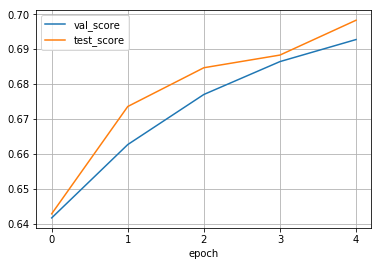

[Ensemble EPOCH: 5]
Validation Score
주야              0.687719
요일              0.170543
사망자수            0.951722
사상자수            0.839311
중상자수            0.842565
경상자수            0.864992
부상신고자수          0.978440
발생지시도           0.598616
발생지시군구          0.092150
사고유형_대분류        0.979798
사고유형_중분류        0.524752
법규위반            0.773333
도로형태_대분류        0.922794
도로형태            0.816479
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
Test Score
주야              0.679443
요일              0.193333
사망자수            0.971362
사상자수            0.840465
중상자수            0.849002
경상자수            0.850953
부상신고자수          0.974477
발생지시도           0.627063
발생지시군구          0.108000
사고유형_대분류        0.988372
사고유형_중분류        0.534483
법규위반            0.744898
도로형태_대분류        0.906897
도로형태            0.773723
당사자종별_1당_대분류    0.536082
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7051 num_score: 0.8954 cat_score: 0.6186
[test] score: 0.7062 num_scor

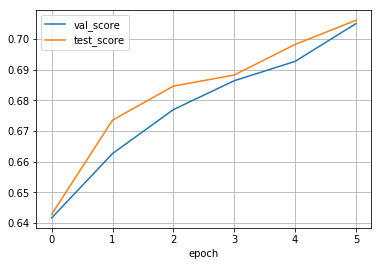

[Ensemble EPOCH: 6]
Validation Score
주야              0.666667
요일              0.178295
사망자수            0.948098
사상자수            0.823721
중상자수            0.830841
경상자수            0.865114
부상신고자수          0.978441
발생지시도           0.640138
발생지시군구          0.088737
사고유형_대분류        0.976431
사고유형_중분류        0.514851
법규위반            0.763333
도로형태_대분류        0.926471
도로형태            0.797753
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
Test Score
주야              0.679443
요일              0.200000
사망자수            0.970125
사상자수            0.846269
중상자수            0.853654
경상자수            0.843763
부상신고자수          0.974482
발생지시도           0.669967
발생지시군구          0.128000
사고유형_대분류        0.996124
사고유형_중분류        0.537931
법규위반            0.761905
도로형태_대분류        0.906897
도로형태            0.791971
당사자종별_1당_대분류    0.515464
당사자종별_2당_대분류    0.730769
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7016 num_score: 0.8892 cat_score: 0.6164
[test] score: 0.7129 num_scor

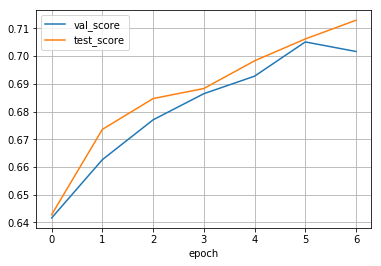

[Ensemble EPOCH: 7]
Validation Score
주야              0.701754
요일              0.174419
사망자수            0.953682
사상자수            0.847227
중상자수            0.833793
경상자수            0.864307
부상신고자수          0.978441
발생지시도           0.674740
발생지시군구          0.105802
사고유형_대분류        0.983165
사고유형_중분류        0.528053
법규위반            0.780000
도로형태_대분류        0.937500
도로형태            0.812734
당사자종별_1당_대분류    0.483755
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
Test Score
주야              0.637631
요일              0.193333
사망자수            0.973373
사상자수            0.839472
중상자수            0.849608
경상자수            0.846423
부상신고자수          0.974482
발생지시도           0.673267
발생지시군구          0.136000
사고유형_대분류        0.988372
사고유형_중분류        0.527586
법규위반            0.751701
도로형태_대분류        0.903448
도로형태            0.799270
당사자종별_1당_대분류    0.518900
당사자종별_2당_대분류    0.723776
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7123 num_score: 0.8955 cat_score: 0.629
[test] score: 0.7085 num_score

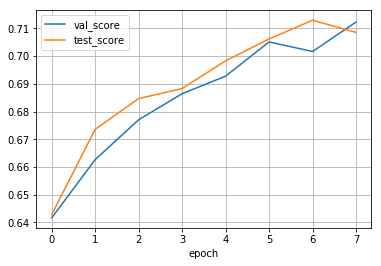

[Ensemble EPOCH: 8]
Validation Score
주야              0.691228
요일              0.197674
사망자수            0.948218
사상자수            0.832960
중상자수            0.839563
경상자수            0.866408
부상신고자수          0.978441
발생지시도           0.674740
발생지시군구          0.088737
사고유형_대분류        0.979798
사고유형_중분류        0.528053
법규위반            0.770000
도로형태_대분류        0.933824
도로형태            0.812734
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.733553
Name: score, dtype: float64
Test Score
주야              0.707317
요일              0.213333
사망자수            0.971048
사상자수            0.846605
중상자수            0.854028
경상자수            0.848065
부상신고자수          0.974480
발생지시도           0.702970
발생지시군구          0.136000
사고유형_대분류        0.996124
사고유형_중분류        0.506897
법규위반            0.765306
도로형태_대분류        0.924138
도로형태            0.824818
당사자종별_1당_대분류    0.542955
당사자종별_2당_대분류    0.748252
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7118 num_score: 0.8931 cat_score: 0.6294
[test] score: 0.7226 num_scor

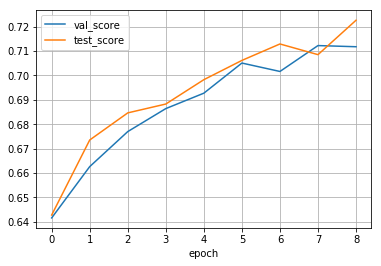

[Ensemble EPOCH: 9]
Validation Score
주야              0.656140
요일              0.220930
사망자수            0.951592
사상자수            0.826091
중상자수            0.843804
경상자수            0.867480
부상신고자수          0.978441
발생지시도           0.705882
발생지시군구          0.116041
사고유형_대분류        0.976431
사고유형_중분류        0.528053
법규위반            0.770000
도로형태_대분류        0.926471
도로형태            0.805243
당사자종별_1당_대분류    0.530686
당사자종별_2당_대분류    0.720395
Name: score, dtype: float64
Test Score
주야              0.717770
요일              0.200000
사망자수            0.971249
사상자수            0.839554
중상자수            0.854137
경상자수            0.846594
부상신고자수          0.974482
발생지시도           0.702970
발생지시군구          0.112000
사고유형_대분류        0.996124
사고유형_중분류        0.568966
법규위반            0.761905
도로형태_대분류        0.920690
도로형태            0.795620
당사자종별_1당_대분류    0.553265
당사자종별_2당_대분류    0.720280
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.714 num_score: 0.8935 cat_score: 0.6324
[test] score: 0.721 num_score:

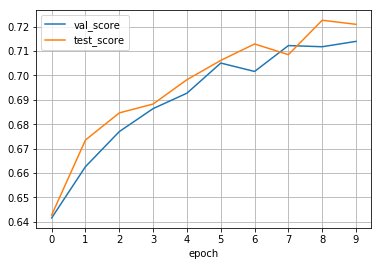

[Ensemble EPOCH: 10]
Validation Score
주야              0.694737
요일              0.166667
사망자수            0.955288
사상자수            0.844277
중상자수            0.839721
경상자수            0.877002
부상신고자수          0.978441
발생지시도           0.692042
발생지시군구          0.133106
사고유형_대분류        0.979798
사고유형_중분류        0.524752
법규위반            0.780000
도로형태_대분류        0.922794
도로형태            0.805243
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.740132
Name: score, dtype: float64
Test Score
주야              0.724739
요일              0.203333
사망자수            0.971518
사상자수            0.838439
중상자수            0.852069
경상자수            0.846408
부상신고자수          0.974481
발생지시도           0.722772
발생지시군구          0.132000
사고유형_대분류        0.996124
사고유형_중분류        0.568966
법규위반            0.761905
도로형태_대분류        0.924138
도로형태            0.795620
당사자종별_1당_대분류    0.549828
당사자종별_2당_대분류    0.751748
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7154 num_score: 0.8989 cat_score: 0.632
[test] score: 0.7259 num_scor

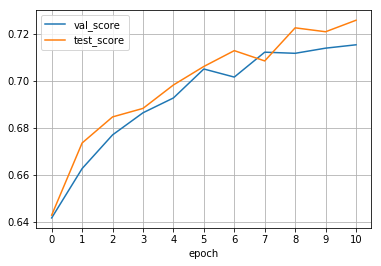

[Ensemble EPOCH: 11]
Validation Score
주야              0.698246
요일              0.205426
사망자수            0.952400
사상자수            0.824292
중상자수            0.841092
경상자수            0.870964
부상신고자수          0.978441
발생지시도           0.702422
발생지시군구          0.092150
사고유형_대분류        0.989899
사고유형_중분류        0.534653
법규위반            0.783333
도로형태_대분류        0.933824
도로형태            0.794007
당사자종별_1당_대분류    0.487365
당사자종별_2당_대분류    0.736842
Name: score, dtype: float64
Test Score
주야              0.703833
요일              0.226667
사망자수            0.973210
사상자수            0.849579
중상자수            0.858035
경상자수            0.849786
부상신고자수          0.974481
발생지시도           0.722772
발생지시군구          0.136000
사고유형_대분류        0.996124
사고유형_중분류        0.568966
법규위반            0.765306
도로형태_대분류        0.920690
도로형태            0.810219
당사자종별_1당_대분류    0.529210
당사자종별_2당_대분류    0.737762
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7141 num_score: 0.8934 cat_score: 0.6326
[test] score: 0.7264 num_sco

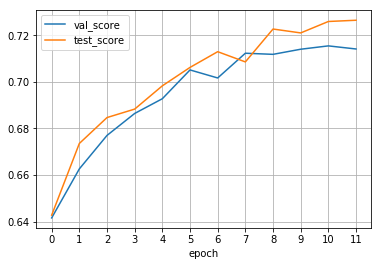

[Ensemble EPOCH: 12]
Validation Score
주야              0.663158
요일              0.209302
사망자수            0.954206
사상자수            0.842705
중상자수            0.828931
경상자수            0.873395
부상신고자수          0.978440
발생지시도           0.709343
발생지시군구          0.112628
사고유형_대분류        0.983165
사고유형_중분류        0.551155
법규위반            0.766667
도로형태_대분류        0.930147
도로형태            0.820225
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.759868
Name: score, dtype: float64
Test Score
주야              0.714286
요일              0.200000
사망자수            0.972065
사상자수            0.840780
중상자수            0.842614
경상자수            0.846351
부상신고자수          0.974478
발생지시도           0.719472
발생지시군구          0.152000
사고유형_대분류        0.996124
사고유형_중분류        0.582759
법규위반            0.761905
도로형태_대분류        0.931034
도로형태            0.824818
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.734266
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7174 num_score: 0.8955 cat_score: 0.6364
[test] score: 0.7266 num_sco

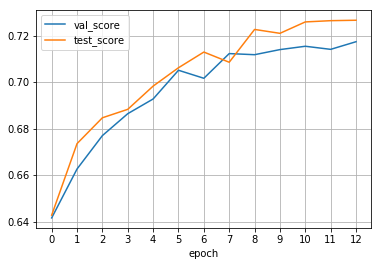

[Ensemble EPOCH: 13]
Validation Score
주야              0.740351
요일              0.228682
사망자수            0.952475
사상자수            0.841061
중상자수            0.848468
경상자수            0.870362
부상신고자수          0.978439
발생지시도           0.740484
발생지시군구          0.133106
사고유형_대분류        0.976431
사고유형_중분류        0.554455
법규위반            0.780000
도로형태_대분류        0.933824
도로형태            0.812734
당사자종별_1당_대분류    0.516245
당사자종별_2당_대분류    0.743421
Name: score, dtype: float64
Test Score
주야              0.679443
요일              0.243333
사망자수            0.968522
사상자수            0.851872
중상자수            0.867316
경상자수            0.847627
부상신고자수          0.974481
발생지시도           0.719472
발생지시군구          0.140000
사고유형_대분류        0.996124
사고유형_중분류        0.575862
법규위반            0.761905
도로형태_대분류        0.920690
도로형태            0.813869
당사자종별_1당_대분류    0.539519
당사자종별_2당_대분류    0.741259
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7282 num_score: 0.8982 cat_score: 0.6509
[test] score: 0.7276 num_sco

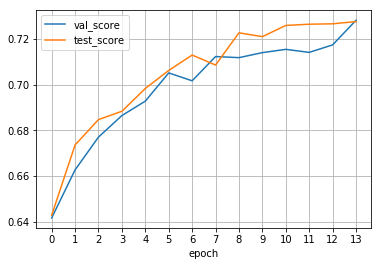

[Ensemble EPOCH: 14]
Validation Score
주야              0.687719
요일              0.205426
사망자수            0.953968
사상자수            0.837627
중상자수            0.843695
경상자수            0.879123
부상신고자수          0.978441
발생지시도           0.733564
발생지시군구          0.136519
사고유형_대분류        0.986532
사고유형_중분류        0.541254
법규위반            0.786667
도로형태_대분류        0.930147
도로형태            0.823970
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.743421
Name: score, dtype: float64
Test Score
주야              0.668990
요일              0.196667
사망자수            0.970079
사상자수            0.841389
중상자수            0.859786
경상자수            0.850658
부상신고자수          0.974455
발생지시도           0.745875
발생지시군구          0.168000
사고유형_대분류        0.996124
사고유형_중분류        0.558621
법규위반            0.761905
도로형태_대분류        0.927586
도로형태            0.824818
당사자종별_1당_대분류    0.560137
당사자종별_2당_대분류    0.758741
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7227 num_score: 0.8986 cat_score: 0.6427
[test] score: 0.729 num_scor

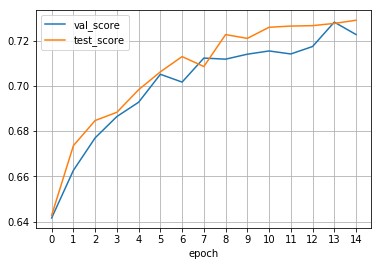

[Ensemble EPOCH: 15]
Validation Score
주야              0.722807
요일              0.217054
사망자수            0.950148
사상자수            0.836125
중상자수            0.836248
경상자수            0.874729
부상신고자수          0.978441
발생지시도           0.726644
발생지시군구          0.129693
사고유형_대분류        0.986532
사고유형_중분류        0.554455
법규위반            0.783333
도로형태_대분류        0.937500
도로형태            0.827715
당사자종별_1당_대분류    0.494585
당사자종별_2당_대분류    0.759868
Name: score, dtype: float64
Test Score
주야              0.707317
요일              0.206667
사망자수            0.973022
사상자수            0.843310
중상자수            0.858405
경상자수            0.852654
부상신고자수          0.974477
발생지시도           0.749175
발생지시군구          0.148000
사고유형_대분류        0.996124
사고유형_중분류        0.575862
법규위반            0.765306
도로형태_대분류        0.934483
도로형태            0.828467
당사자종별_1당_대분류    0.560137
당사자종별_2당_대분류    0.762238
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.726 num_score: 0.8951 cat_score: 0.6491
[test] score: 0.7335 num_scor

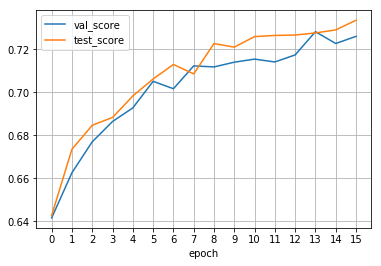

[Ensemble EPOCH: 16]
Validation Score
주야              0.733333
요일              0.193798
사망자수            0.952276
사상자수            0.841114
중상자수            0.855859
경상자수            0.870280
부상신고자수          0.978441
발생지시도           0.723183
발생지시군구          0.122867
사고유형_대분류        0.989899
사고유형_중분류        0.547855
법규위반            0.786667
도로형태_대분류        0.933824
도로형태            0.835206
당사자종별_1당_대분류    0.501805
당사자종별_2당_대분류    0.763158
Name: score, dtype: float64
Test Score
주야              0.710801
요일              0.236667
사망자수            0.973284
사상자수            0.845796
중상자수            0.862802
경상자수            0.847236
부상신고자수          0.974477
발생지시도           0.755776
발생지시군구          0.172000
사고유형_대분류        0.992248
사고유형_중분류        0.551724
법규위반            0.772109
도로형태_대분류        0.924138
도로형태            0.835766
당사자종별_1당_대분류    0.532646
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7268 num_score: 0.8996 cat_score: 0.6483
[test] score: 0.7339 num_sco

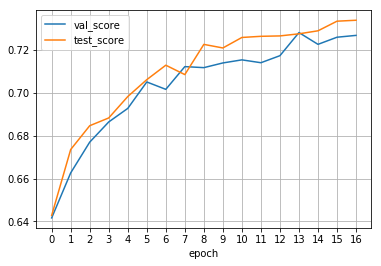

[Ensemble EPOCH: 17]
Validation Score
주야              0.747368
요일              0.201550
사망자수            0.954232
사상자수            0.833964
중상자수            0.834935
경상자수            0.866580
부상신고자수          0.978441
발생지시도           0.757785
발생지시군구          0.116041
사고유형_대분류        0.983165
사고유형_중분류        0.584158
법규위반            0.776667
도로형태_대분류        0.937500
도로형태            0.820225
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.766447
Name: score, dtype: float64
Test Score
주야              0.717770
요일              0.213333
사망자수            0.974828
사상자수            0.857984
중상자수            0.873072
경상자수            0.861196
부상신고자수          0.974482
발생지시도           0.726073
발생지시군구          0.160000
사고유형_대분류        0.996124
사고유형_중분류        0.537931
법규위반            0.772109
도로형태_대분류        0.934483
도로형태            0.824818
당사자종별_1당_대분류    0.570447
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7295 num_score: 0.8936 cat_score: 0.6549
[test] score: 0.7344 num_sco

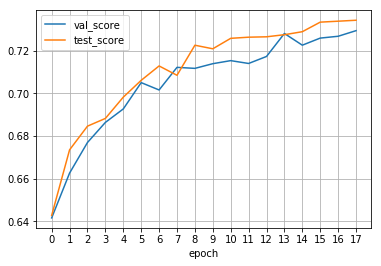

[Ensemble EPOCH: 18]
Validation Score
주야              0.757895
요일              0.186047
사망자수            0.952704
사상자수            0.840627
중상자수            0.842489
경상자수            0.879522
부상신고자수          0.978441
발생지시도           0.719723
발생지시군구          0.133106
사고유형_대분류        0.996633
사고유형_중분류        0.567657
법규위반            0.780000
도로형태_대분류        0.941176
도로형태            0.831461
당사자종별_1당_대분류    0.498195
당사자종별_2당_대분류    0.763158
Name: score, dtype: float64
Test Score
주야              0.742160
요일              0.240000
사망자수            0.971796
사상자수            0.855761
중상자수            0.870295
경상자수            0.856662
부상신고자수          0.974477
발생지시도           0.735974
발생지시군구          0.168000
사고유형_대분류        0.996124
사고유형_중분류        0.582759
법규위반            0.775510
도로형태_대분류        0.941379
도로형태            0.839416
당사자종별_1당_대분류    0.556701
당사자종별_2당_대분류    0.762238
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7293 num_score: 0.8988 cat_score: 0.6523
[test] score: 0.7418 num_sco

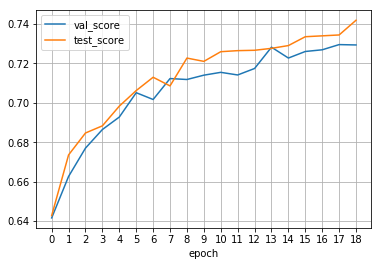

[Ensemble EPOCH: 19]
Validation Score
주야              0.729825
요일              0.236434
사망자수            0.950302
사상자수            0.825637
중상자수            0.838145
경상자수            0.883656
부상신고자수          0.978441
발생지시도           0.743945
발생지시군구          0.146758
사고유형_대분류        0.993266
사고유형_중분류        0.554455
법규위반            0.793333
도로형태_대분류        0.941176
도로형태            0.846442
당사자종별_1당_대분류    0.519856
당사자종별_2당_대분류    0.759868
Name: score, dtype: float64
Test Score
주야              0.773519
요일              0.260000
사망자수            0.971594
사상자수            0.850799
중상자수            0.877770
경상자수            0.862248
부상신고자수          0.974482
발생지시도           0.755776
발생지시군구          0.160000
사고유형_대분류        0.996124
사고유형_중분류        0.589655
법규위반            0.775510
도로형태_대분류        0.937931
도로형태            0.810219
당사자종별_1당_대분류    0.570447
당사자종별_2당_대분류    0.758741
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7338 num_score: 0.8952 cat_score: 0.6605
[test] score: 0.7453 num_sco

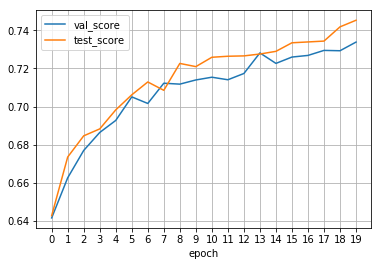

[Ensemble EPOCH: 20]
Validation Score
주야              0.694737
요일              0.232558
사망자수            0.952645
사상자수            0.833803
중상자수            0.851607
경상자수            0.882643
부상신고자수          0.978438
발생지시도           0.730104
발생지시군구          0.143345
사고유형_대분류        0.989899
사고유형_중분류        0.561056
법규위반            0.790000
도로형태_대분류        0.944853
도로형태            0.831461
당사자종별_1당_대분류    0.530686
당사자종별_2당_대분류    0.763158
Name: score, dtype: float64
Test Score
주야              0.707317
요일              0.266667
사망자수            0.973465
사상자수            0.843812
중상자수            0.875900
경상자수            0.859520
부상신고자수          0.974482
발생지시도           0.745875
발생지시군구          0.148000
사고유형_대분류        0.996124
사고유형_중분류        0.572414
법규위반            0.778912
도로형태_대분류        0.944828
도로형태            0.843066
당사자종별_1당_대분류    0.567010
당사자종별_2당_대분류    0.741259
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7319 num_score: 0.8998 cat_score: 0.6556
[test] score: 0.7399 num_sco

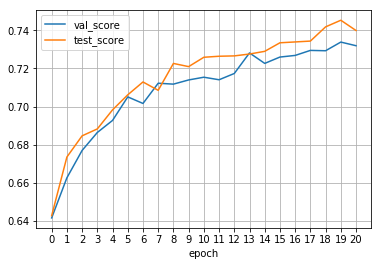

[Ensemble EPOCH: 21]
Validation Score
주야              0.740351
요일              0.224806
사망자수            0.953145
사상자수            0.838070
중상자수            0.843858
경상자수            0.880432
부상신고자수          0.978439
발생지시도           0.743945
발생지시군구          0.122867
사고유형_대분류        0.989899
사고유형_중분류        0.561056
법규위반            0.776667
도로형태_대분류        0.944853
도로형태            0.846442
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.750000
Name: score, dtype: float64
Test Score
주야              0.724739
요일              0.206667
사망자수            0.973539
사상자수            0.849826
중상자수            0.869133
경상자수            0.855038
부상신고자수          0.974477
발생지시도           0.745875
발생지시군구          0.164000
사고유형_대분류        0.996124
사고유형_중분류        0.582759
법규위반            0.778912
도로형태_대분류        0.941379
도로형태            0.843066
당사자종별_1당_대분류    0.573883
당사자종별_2당_대분류    0.741259
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7317 num_score: 0.8988 cat_score: 0.6558
[test] score: 0.7388 num_sco

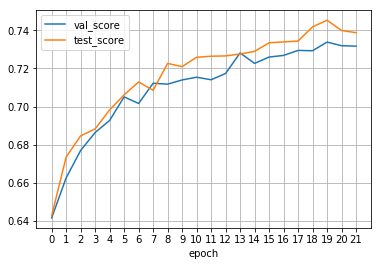

[Ensemble EPOCH: 22]
Validation Score
주야              0.698246
요일              0.189922
사망자수            0.954480
사상자수            0.835097
중상자수            0.851291
경상자수            0.873948
부상신고자수          0.978440
발생지시도           0.740484
발생지시군구          0.122867
사고유형_대분류        0.989899
사고유형_중분류        0.557756
법규위반            0.780000
도로형태_대분류        0.941176
도로형태            0.838951
당사자종별_1당_대분류    0.516245
당사자종별_2당_대분류    0.763158
Name: score, dtype: float64
Test Score
주야              0.735192
요일              0.206667
사망자수            0.973620
사상자수            0.852528
중상자수            0.879241
경상자수            0.858213
부상신고자수          0.974481
발생지시도           0.732673
발생지시군구          0.168000
사고유형_대분류        0.996124
사고유형_중분류        0.596552
법규위반            0.768707
도로형태_대분류        0.941379
도로형태            0.832117
당사자종별_1당_대분류    0.597938
당사자종별_2당_대분류    0.755245
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.727 num_score: 0.8987 cat_score: 0.649
[test] score: 0.7418 num_score

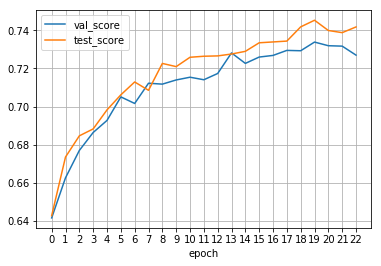

[Ensemble EPOCH: 23]
Validation Score
주야              0.715789
요일              0.201550
사망자수            0.953237
사상자수            0.833459
중상자수            0.842592
경상자수            0.872823
부상신고자수          0.978441
발생지시도           0.733564
발생지시군구          0.136519
사고유형_대분류        0.986532
사고유형_중분류        0.584158
법규위반            0.796667
도로형태_대분류        0.944853
도로형태            0.868914
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.773026
Name: score, dtype: float64
Test Score
주야              0.731707
요일              0.223333
사망자수            0.970592
사상자수            0.851179
중상자수            0.877866
경상자수            0.854850
부상신고자수          0.974482
발생지시도           0.752475
발생지시군구          0.176000
사고유형_대분류        0.996124
사고유형_중분류        0.565517
법규위반            0.761905
도로형태_대분류        0.944828
도로형태            0.839416
당사자종별_1당_대분류    0.563574
당사자종별_2당_대분류    0.758741
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7334 num_score: 0.8961 cat_score: 0.6595
[test] score: 0.7402 num_sco

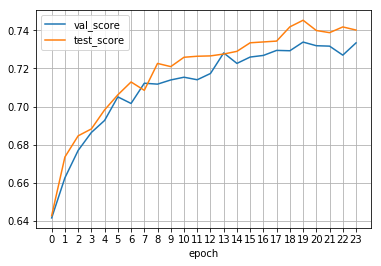

[Ensemble EPOCH: 24]
Validation Score
주야              0.736842
요일              0.201550
사망자수            0.952833
사상자수            0.833498
중상자수            0.836679
경상자수            0.887041
부상신고자수          0.978441
발생지시도           0.740484
발생지시군구          0.119454
사고유형_대분류        0.993266
사고유형_중분류        0.564356
법규위반            0.786667
도로형태_대분류        0.948529
도로형태            0.850187
당사자종별_1당_대분류    0.523466
당사자종별_2당_대분류    0.769737
Name: score, dtype: float64
Test Score
주야              0.707317
요일              0.250000
사망자수            0.973334
사상자수            0.850656
중상자수            0.869407
경상자수            0.865447
부상신고자수          0.974481
발생지시도           0.755776
발생지시군구          0.164000
사고유형_대분류        0.996124
사고유형_중분류        0.579310
법규위반            0.775510
도로형태_대분류        0.944828
도로형태            0.821168
당사자종별_1당_대분류    0.587629
당사자종별_2당_대분류    0.779720
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7327 num_score: 0.8977 cat_score: 0.6577
[test] score: 0.7434 num_sco

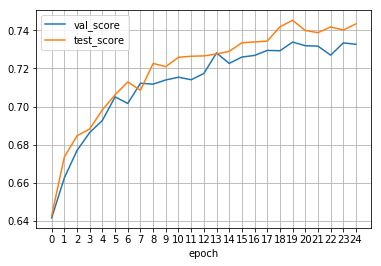

[Ensemble EPOCH: 25]
Validation Score
주야              0.740351
요일              0.228682
사망자수            0.954317
사상자수            0.836542
중상자수            0.855970
경상자수            0.882300
부상신고자수          0.978440
발생지시도           0.757785
발생지시군구          0.136519
사고유형_대분류        0.989899
사고유형_중분류        0.594059
법규위반            0.790000
도로형태_대분류        0.948529
도로형태            0.842697
당사자종별_1당_대분류    0.537906
당사자종별_2당_대분류    0.756579
Name: score, dtype: float64
Test Score
주야              0.731707
요일              0.206667
사망자수            0.970310
사상자수            0.851340
중상자수            0.869146
경상자수            0.856464
부상신고자수          0.974481
발생지시도           0.745875
발생지시군구          0.172000
사고유형_대분류        0.996124
사고유형_중분류        0.593103
법규위반            0.772109
도로형태_대분류        0.968966
도로형태            0.832117
당사자종별_1당_대분류    0.539519
당사자종별_2당_대분류    0.772727
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7394 num_score: 0.9015 cat_score: 0.6657
[test] score: 0.7408 num_sco

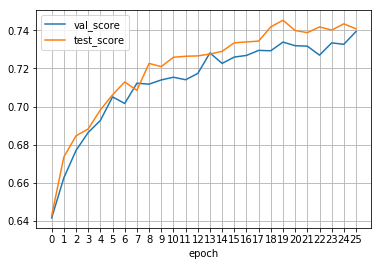

[Ensemble EPOCH: 26]
Validation Score
주야              0.736842
요일              0.244186
사망자수            0.956717
사상자수            0.834500
중상자수            0.854367
경상자수            0.882336
부상신고자수          0.978440
발생지시도           0.737024
발생지시군구          0.143345
사고유형_대분류        0.993266
사고유형_중분류        0.610561
법규위반            0.786667
도로형태_대분류        0.952206
도로형태            0.835206
당사자종별_1당_대분류    0.512635
당사자종별_2당_대분류    0.763158
Name: score, dtype: float64
Test Score
주야              0.742160
요일              0.216667
사망자수            0.970561
사상자수            0.856671
중상자수            0.880784
경상자수            0.856402
부상신고자수          0.974472
발생지시도           0.752475
발생지시군구          0.188000
사고유형_대분류        0.996124
사고유형_중분류        0.606897
법규위반            0.778912
도로형태_대분류        0.958621
도로형태            0.846715
당사자종별_1당_대분류    0.577320
당사자종별_2당_대분류    0.748252
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7388 num_score: 0.9013 cat_score: 0.665
[test] score: 0.7469 num_scor

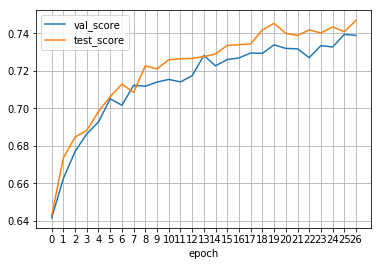

[Ensemble EPOCH: 27]
Validation Score
주야              0.740351
요일              0.193798
사망자수            0.954438
사상자수            0.837767
중상자수            0.843702
경상자수            0.879197
부상신고자수          0.978435
발생지시도           0.733564
발생지시군구          0.126280
사고유형_대분류        0.993266
사고유형_중분류        0.603960
법규위반            0.786667
도로형태_대분류        0.944853
도로형태            0.861423
당사자종별_1당_대분류    0.519856
당사자종별_2당_대분류    0.766447
Name: score, dtype: float64
Test Score
주야              0.721254
요일              0.223333
사망자수            0.972055
사상자수            0.846921
중상자수            0.876384
경상자수            0.856435
부상신고자수          0.974478
발생지시도           0.742574
발생지시군구          0.180000
사고유형_대분류        0.996124
사고유형_중분류        0.575862
법규위반            0.768707
도로형태_대분류        0.955172
도로형태            0.857664
당사자종별_1당_대분류    0.560137
당사자종별_2당_대분류    0.772727
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7353 num_score: 0.8987 cat_score: 0.661
[test] score: 0.7425 num_scor

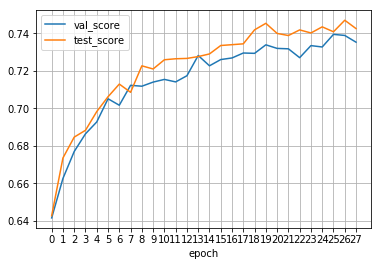

[Ensemble EPOCH: 28]
Validation Score
주야              0.712281
요일              0.263566
사망자수            0.952553
사상자수            0.843133
중상자수            0.842620
경상자수            0.885601
부상신고자수          0.978441
발생지시도           0.754325
발생지시군구          0.136519
사고유형_대분류        0.989899
사고유형_중분류        0.600660
법규위반            0.793333
도로형태_대분류        0.948529
도로형태            0.838951
당사자종별_1당_대분류    0.523466
당사자종별_2당_대분류    0.759868
Name: score, dtype: float64
Test Score
주야              0.724739
요일              0.226667
사망자수            0.973311
사상자수            0.859078
중상자수            0.875038
경상자수            0.864220
부상신고자수          0.974482
발생지시도           0.772277
발생지시군구          0.152000
사고유형_대분류        0.996124
사고유형_중분류        0.589655
법규위반            0.765306
도로형태_대분류        0.955172
도로형태            0.850365
당사자종별_1당_대분류    0.601375
당사자종별_2당_대분류    0.776224
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.739 num_score: 0.9005 cat_score: 0.6656
[test] score: 0.7473 num_scor

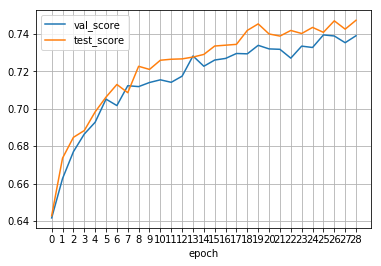

[Ensemble EPOCH: 29]
Validation Score
주야              0.747368
요일              0.213178
사망자수            0.952741
사상자수            0.818333
중상자수            0.854626
경상자수            0.880316
부상신고자수          0.978441
발생지시도           0.740484
발생지시군구          0.143345
사고유형_대분류        0.993266
사고유형_중분류        0.590759
법규위반            0.793333
도로형태_대분류        0.944853
도로형태            0.835206
당사자종별_1당_대분류    0.505415
당사자종별_2당_대분류    0.759868
Name: score, dtype: float64
Test Score
주야              0.735192
요일              0.233333
사망자수            0.973343
사상자수            0.853091
중상자수            0.877926
경상자수            0.856169
부상신고자수          0.974480
발생지시도           0.759076
발생지시군구          0.168000
사고유형_대분류        0.996124
사고유형_중분류        0.610345
법규위반            0.778912
도로형태_대분류        0.958621
도로형태            0.839416
당사자종별_1당_대분류    0.577320
당사자종별_2당_대분류    0.765734
Name: score, dtype: float64
[SUMMARY]
[val ] score: 0.7345 num_score: 0.8969 cat_score: 0.6606
[test] score: 0.7473 num_sco

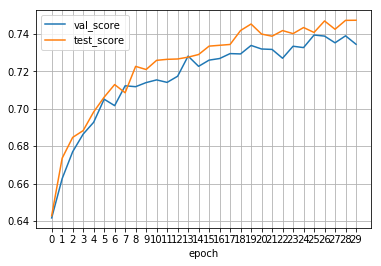

In [5]:
ensembler.train_per_nn(sess, nn_list)

# Step 4. Restore Saved Model and Predict

In [6]:
tf.reset_default_graph()
sess = tf.Session()
nn_list = []
# 앙상블 할 모델들의 그래프 생성(build)

for i in range(N_ENSEMBLE):  
    nn = mnae.NMAE0(sess, etler.attr_num_list,
          dropout_keep_prob=0.7,
          lr=5e-4,
          lr_decay=0.95,
          name='NMAE0_'+str(i))
    nn_list.append(nn)

for i in range(N_ENSEMBLE):  
    nn = mnae.Dense(sess, etler.attr_num_list,
          dropout_keep_prob=0.7,
          lr=5e-4,
          lr_decay=0.95,
          name='Dense_'+str(i))
    nn_list.append(nn)

sess.run(tf.global_variables_initializer())

In [7]:
ensembler.restore_and_predict(sess, nn_list)

INFO:tensorflow:Restoring parameters from saved_model\ensemble
> Problem Prediction... 
> Problem Prediction... 
> Problem Prediction... 
> Problem Prediction... 
> Problem Prediction... 
> Problem Prediction... 
> Problem Prediction... 
> Problem Prediction... 
> Problem Prediction... 
> Problem Prediction... 


# 모델 하나만 검증할 때, 아래 코드 이용

In [8]:

# tf.reset_default_graph()
# sess = tf.Session()
# nn = mnae.NMAE0(sess, etler.attr_num_list,
#           dropout_keep_prob=0.7,
#           lr=1e-4,
#           lr_decay=0.9,
#           name='nn')
# sess.run(tf.global_variables_initializer())

# nn.train(etler, -1, -1, 128, 30)